In [1]:
import torch
from torch import nn, optim
from torch.autograd.variable import Variable
from torchvision import transforms, datasets

In [2]:
from utils import Logger

In [3]:
def mnist_data():
    transform = transforms.Compose([transforms.ToTensor(),
  transforms.Normalize((0.5,), (0.5,))
])
    out_dir = './dataset'
    return datasets.MNIST(root=out_dir, train=True, transform=transform, download=True)
# Load data
data = mnist_data()
print(data)
# Create loader with data, so that we can iterate over it
data_loader = torch.utils.data.DataLoader(data, batch_size=100, shuffle=True)
# Num batches
num_batches = len(data_loader)

Dataset MNIST
    Number of datapoints: 60000
    Root location: ./dataset
    Split: Train
    StandardTransform
Transform: Compose(
               ToTensor()
               Normalize(mean=(0.5,), std=(0.5,))
           )


In [4]:
class DiscriminatorNet(torch.nn.Module):
    """
    A three hidden-layer discriminative neural network
    """
    def __init__(self):
        super(DiscriminatorNet, self).__init__()
        n_features = 784       # 28 * 28 pixle
        n_out = 1
        
        self.hidden0 = nn.Sequential( 
            nn.Linear(n_features, 1024),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3)
        )
        self.hidden1 = nn.Sequential(
            nn.Linear(1024, 512),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3)
        )
        self.hidden2 = nn.Sequential(
            nn.Linear(512, 256),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3)
        )
        self.out = nn.Sequential(
            torch.nn.Linear(256, n_out),
            torch.nn.Sigmoid()
        )

    def forward(self, x):
        x = self.hidden0(x)
        x = self.hidden1(x)
        x = self.hidden2(x)
        x = self.out(x)
        return x
discriminator = DiscriminatorNet()

In [5]:
def images_to_vectors(images):
    return images.view(images.size(0), 784)

def vectors_to_images(vectors):
    return vectors.view(vectors.size(0), 1, 28, 28)

In [6]:
class GeneratorNet(torch.nn.Module):
    """
    A three hidden-layer generative neural network
    """
    def __init__(self):
        super(GeneratorNet, self).__init__()
        n_features = 100
        n_out = 784
        
        self.hidden0 = nn.Sequential(
            nn.Linear(n_features, 256),
            nn.LeakyReLU(0.2)
        )
        self.hidden1 = nn.Sequential(            
            nn.Linear(256, 512),
            nn.LeakyReLU(0.2)
        )
        self.hidden2 = nn.Sequential(
            nn.Linear(512, 1024),
            nn.LeakyReLU(0.2)
        )
        
        self.out = nn.Sequential(
            nn.Linear(1024, n_out),
            nn.Tanh()
        )

    def forward(self, x):
        x = self.hidden0(x)
        x = self.hidden1(x)
        x = self.hidden2(x)
        x = self.out(x)
        return x
generator = GeneratorNet()

In [7]:
def noise(size):
    # Generates a 1-d vector of gaussian sampled random values
    n = Variable(torch.randn(size, 100))
    return n

In [8]:
d_optimizer = optim.Adam(discriminator.parameters(), lr=0.0002)
g_optimizer = optim.Adam(generator.parameters(), lr=0.0002)
loss = nn.BCELoss()

In [9]:
def ones_target(size):
    # Tensor containing ones, with shape = size
    data = Variable(torch.ones(size, 1))
    return data

def zeros_target(size):
    # Tensor containing zeros, with shape = size
    data = Variable(torch.zeros(size, 1))
    return data

In [10]:
def train_discriminator(optimizer, real_data, fake_data):
    N = real_data.size(0)
    # Reset gradients
    optimizer.zero_grad()
    
    # 1.1 Train on Real Data
    prediction_real = discriminator(real_data)
    # Calculate error and backpropagate
    error_real = loss(prediction_real, ones_target(N) )
    error_real.backward()

    # 1.2 Train on Fake Data
    prediction_fake = discriminator(fake_data)
    # Calculate error and backpropagate
    error_fake = loss(prediction_fake, zeros_target(N))
    error_fake.backward()
    
    # 1.3 Update weights with gradients
    optimizer.step()
    
    # Return error and predictions for real and fake inputs
    return error_real + error_fake, prediction_real, prediction_fake

In [11]:
def train_generator(optimizer, fake_data):
    N = fake_data.size(0)
    # Reset gradients
    optimizer.zero_grad()
    # Sample noise and generate fake data
    prediction = discriminator(fake_data)
    # Calculate error and backpropagate
    error = loss(prediction, ones_target(N))
    error.backward()
    # Update weights with gradients
    optimizer.step()
    # Return error
    return error

In [12]:
num_test_samples = 16
test_noise = noise(num_test_samples)

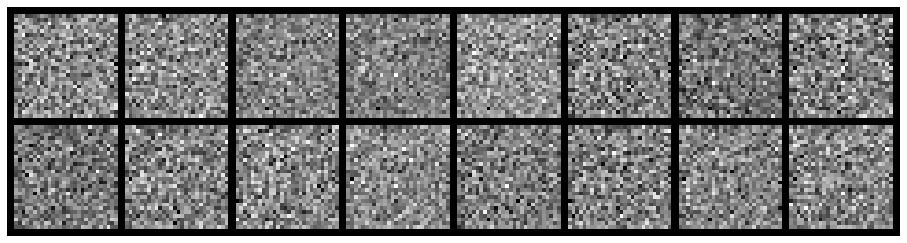

Epoch: [0/100], Batch Num: [0/600]
Discriminator Loss: 1.3730, Generator Loss: 0.6955
D(x): 0.5055, D(G(z)): 0.4986


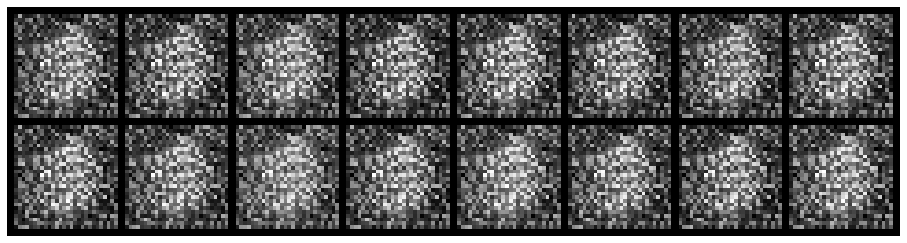

Epoch: [0/100], Batch Num: [100/600]
Discriminator Loss: 1.1743, Generator Loss: 1.7848
D(x): 0.7006, D(G(z)): 0.4715


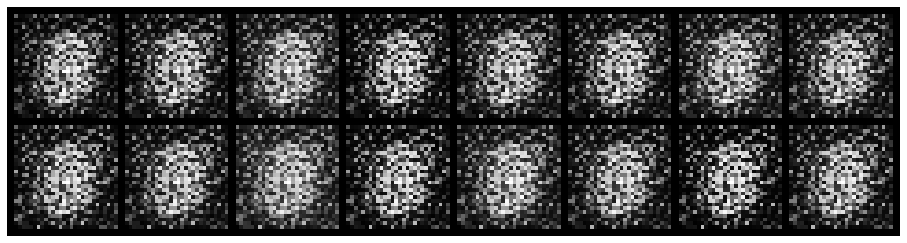

Epoch: [0/100], Batch Num: [200/600]
Discriminator Loss: 0.3575, Generator Loss: 6.2049
D(x): 0.9738, D(G(z)): 0.2458


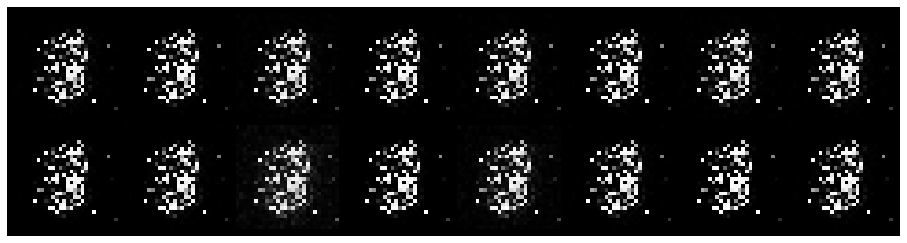

Epoch: [0/100], Batch Num: [300/600]
Discriminator Loss: 0.1200, Generator Loss: 4.3089
D(x): 0.9434, D(G(z)): 0.0535


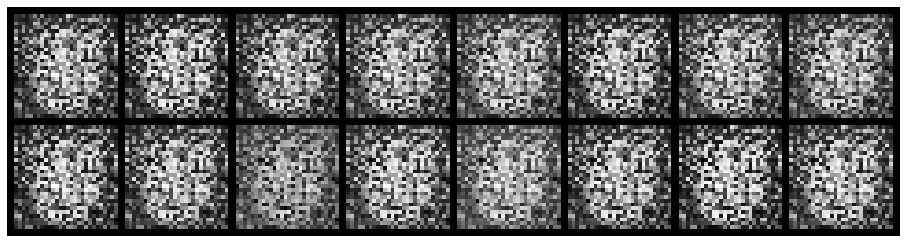

Epoch: [0/100], Batch Num: [400/600]
Discriminator Loss: 0.9221, Generator Loss: 0.9070
D(x): 0.8903, D(G(z)): 0.5395


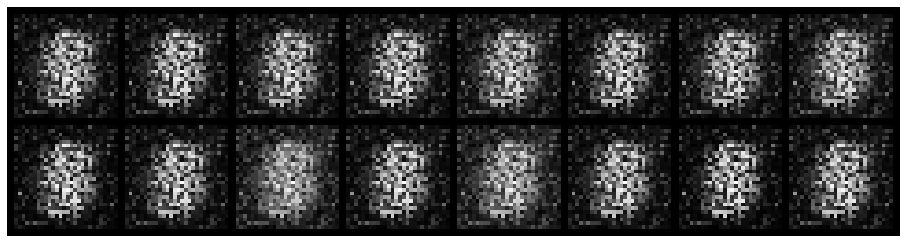

Epoch: [0/100], Batch Num: [500/600]
Discriminator Loss: 2.0370, Generator Loss: 0.6845
D(x): 0.6108, D(G(z)): 0.6961


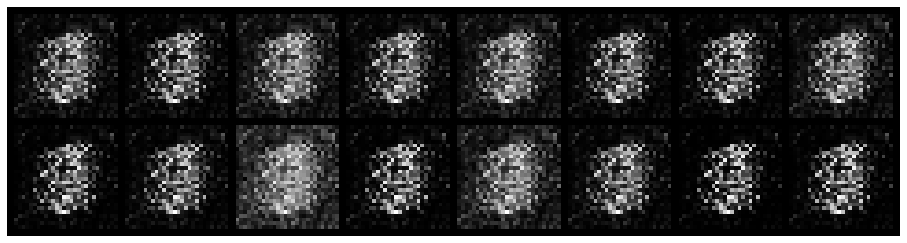

Epoch: [1/100], Batch Num: [0/600]
Discriminator Loss: 1.0190, Generator Loss: 2.7335
D(x): 0.6743, D(G(z)): 0.3138


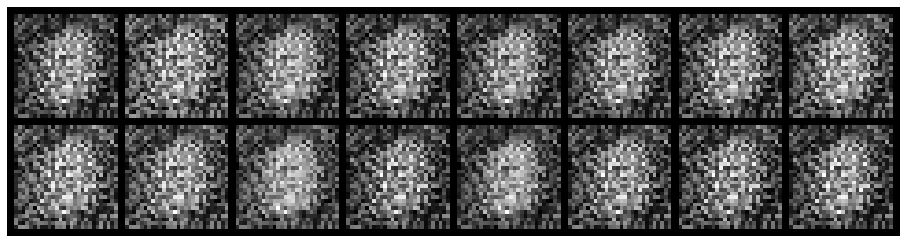

Epoch: [1/100], Batch Num: [100/600]
Discriminator Loss: 1.0818, Generator Loss: 0.8126
D(x): 0.8885, D(G(z)): 0.5872


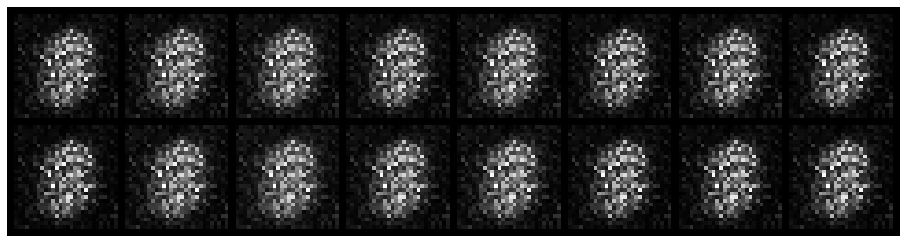

Epoch: [1/100], Batch Num: [200/600]
Discriminator Loss: 1.2754, Generator Loss: 1.5380
D(x): 0.5875, D(G(z)): 0.3827


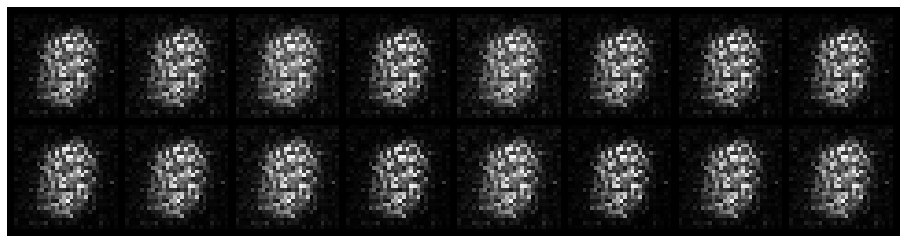

Epoch: [1/100], Batch Num: [300/600]
Discriminator Loss: 1.6193, Generator Loss: 1.2009
D(x): 0.5314, D(G(z)): 0.4835


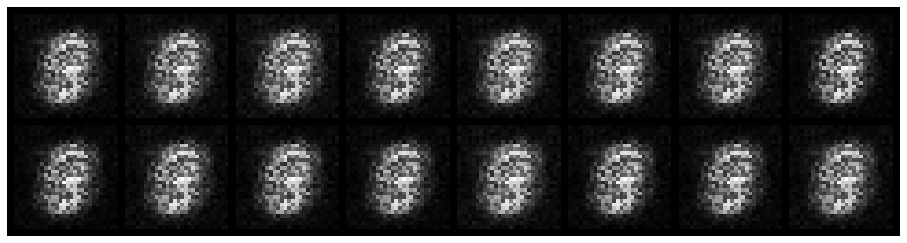

Epoch: [1/100], Batch Num: [400/600]
Discriminator Loss: 0.6458, Generator Loss: 1.5256
D(x): 0.7452, D(G(z)): 0.2673


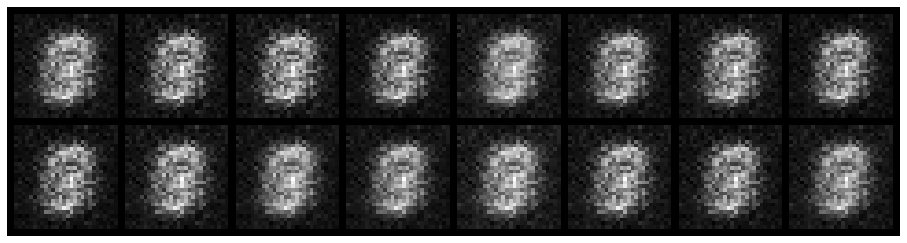

Epoch: [1/100], Batch Num: [500/600]
Discriminator Loss: 0.7050, Generator Loss: 2.6073
D(x): 0.7890, D(G(z)): 0.2888


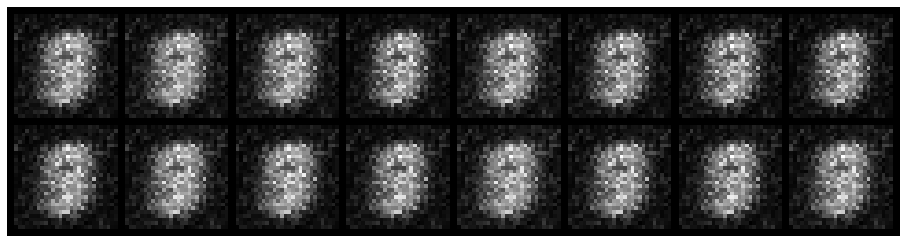

Epoch: [2/100], Batch Num: [0/600]
Discriminator Loss: 1.0289, Generator Loss: 0.9864
D(x): 0.6596, D(G(z)): 0.4241


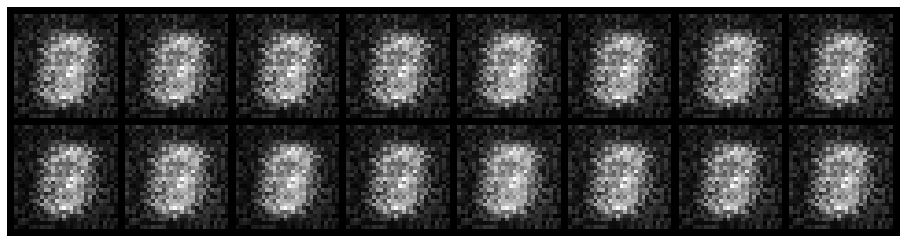

Epoch: [2/100], Batch Num: [100/600]
Discriminator Loss: 0.7355, Generator Loss: 1.2498
D(x): 0.8100, D(G(z)): 0.3608


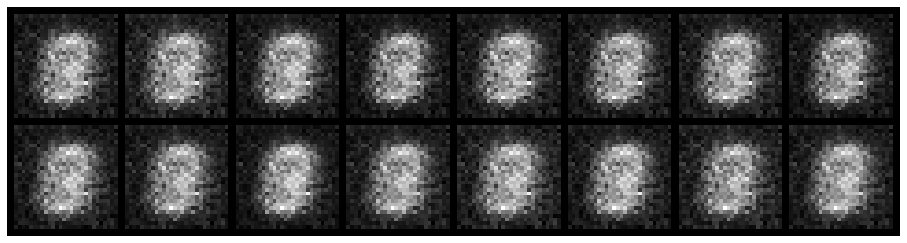

Epoch: [2/100], Batch Num: [200/600]
Discriminator Loss: 1.2789, Generator Loss: 1.2183
D(x): 0.6258, D(G(z)): 0.4098


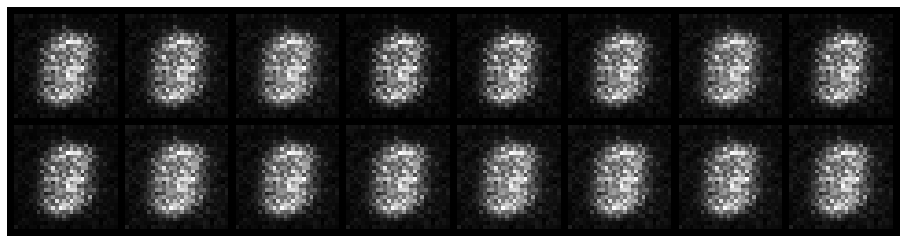

Epoch: [2/100], Batch Num: [300/600]
Discriminator Loss: 0.6150, Generator Loss: 1.8715
D(x): 0.7906, D(G(z)): 0.2779


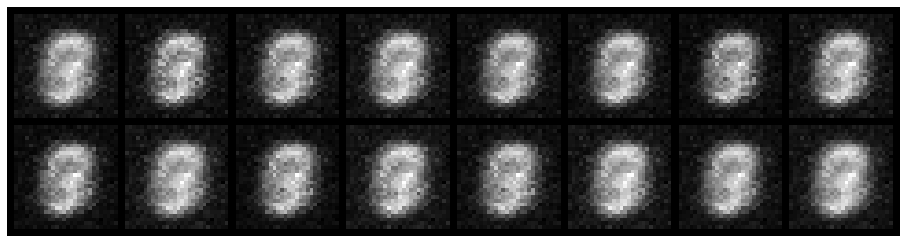

Epoch: [2/100], Batch Num: [400/600]
Discriminator Loss: 0.7811, Generator Loss: 2.0494
D(x): 0.7605, D(G(z)): 0.2418


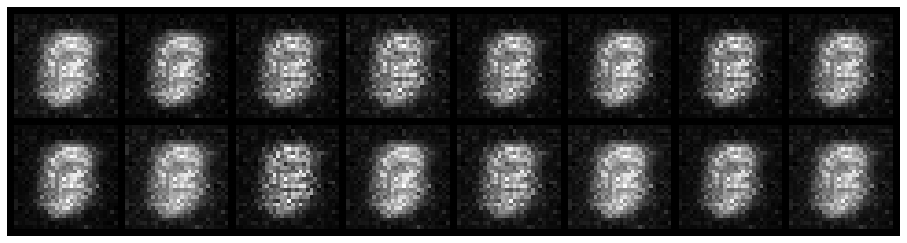

Epoch: [2/100], Batch Num: [500/600]
Discriminator Loss: 1.3000, Generator Loss: 0.6936
D(x): 0.5979, D(G(z)): 0.5273


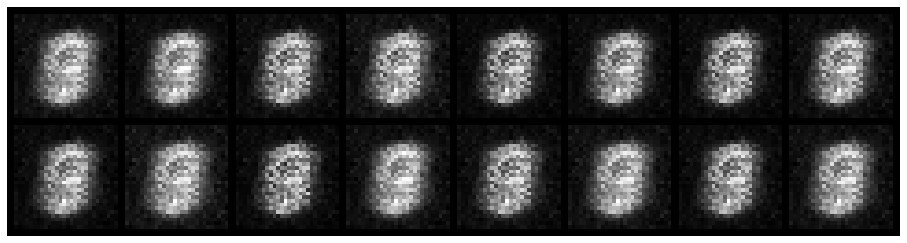

Epoch: [3/100], Batch Num: [0/600]
Discriminator Loss: 0.7796, Generator Loss: 1.3266
D(x): 0.7150, D(G(z)): 0.3248


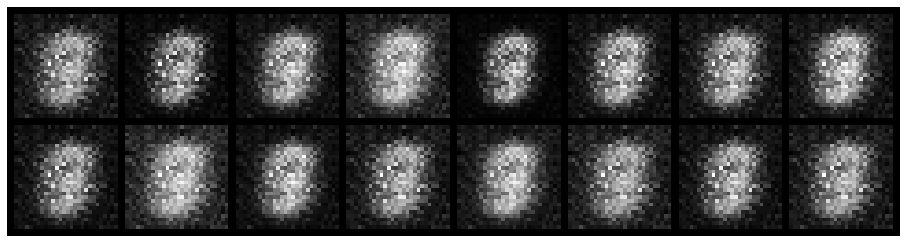

Epoch: [3/100], Batch Num: [100/600]
Discriminator Loss: 0.0974, Generator Loss: 3.3955
D(x): 0.9757, D(G(z)): 0.0565


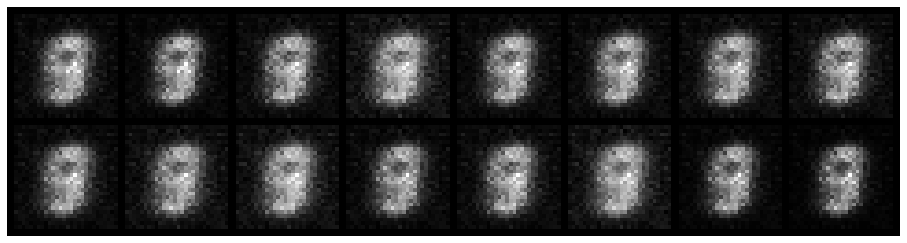

Epoch: [3/100], Batch Num: [200/600]
Discriminator Loss: 1.0757, Generator Loss: 1.9534
D(x): 0.7092, D(G(z)): 0.2970


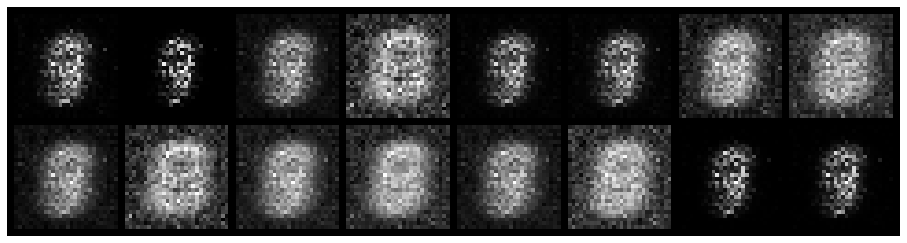

Epoch: [3/100], Batch Num: [300/600]
Discriminator Loss: 0.2954, Generator Loss: 2.3915
D(x): 0.9247, D(G(z)): 0.1670


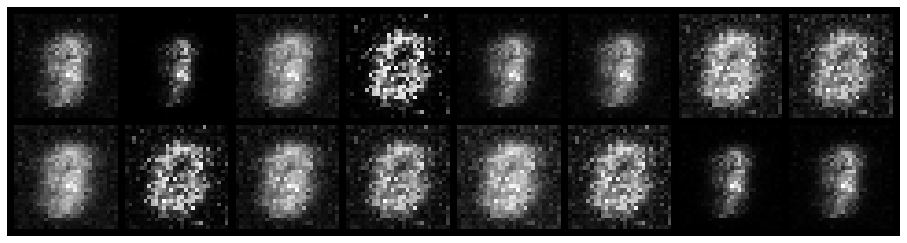

Epoch: [3/100], Batch Num: [400/600]
Discriminator Loss: 0.4974, Generator Loss: 2.5254
D(x): 0.9003, D(G(z)): 0.2049


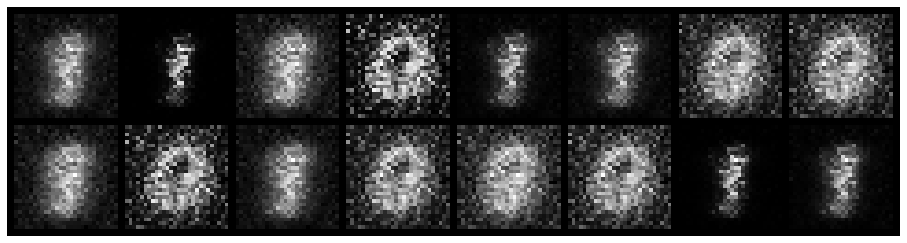

Epoch: [3/100], Batch Num: [500/600]
Discriminator Loss: 0.2271, Generator Loss: 3.1021
D(x): 0.9197, D(G(z)): 0.0847


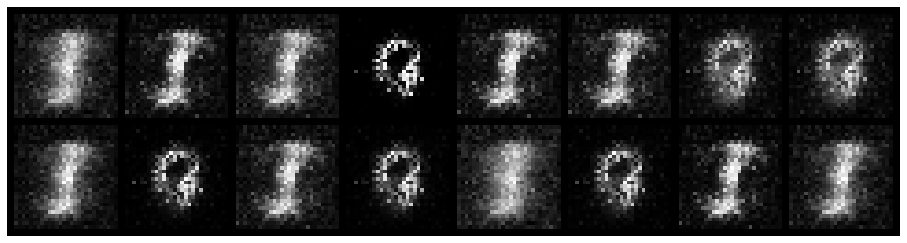

Epoch: [4/100], Batch Num: [0/600]
Discriminator Loss: 0.6429, Generator Loss: 2.1277
D(x): 0.8968, D(G(z)): 0.2952


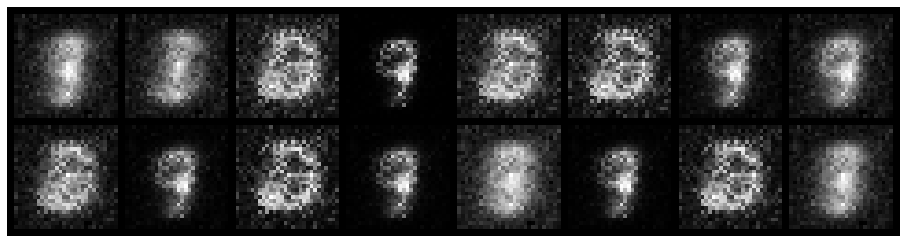

Epoch: [4/100], Batch Num: [100/600]
Discriminator Loss: 0.5122, Generator Loss: 2.4510
D(x): 0.8228, D(G(z)): 0.1221


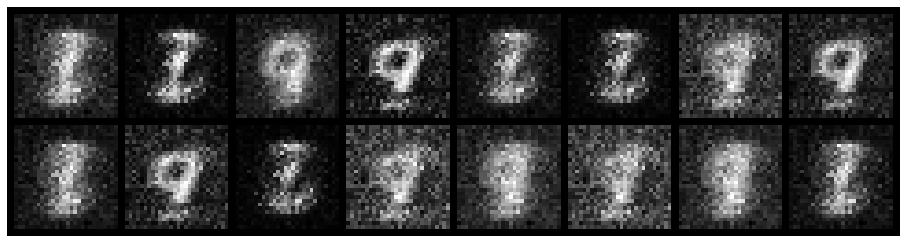

Epoch: [4/100], Batch Num: [200/600]
Discriminator Loss: 0.3776, Generator Loss: 3.6928
D(x): 0.9288, D(G(z)): 0.1414


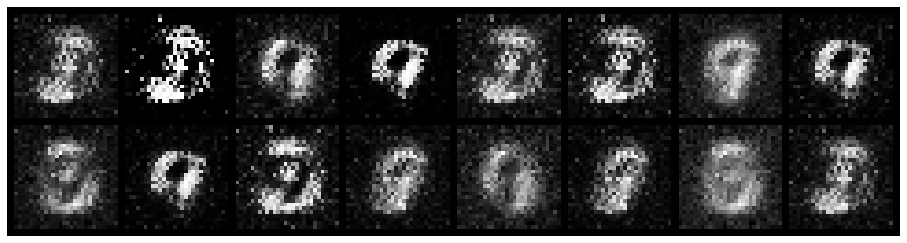

Epoch: [4/100], Batch Num: [300/600]
Discriminator Loss: 0.2787, Generator Loss: 2.7431
D(x): 0.9340, D(G(z)): 0.1452


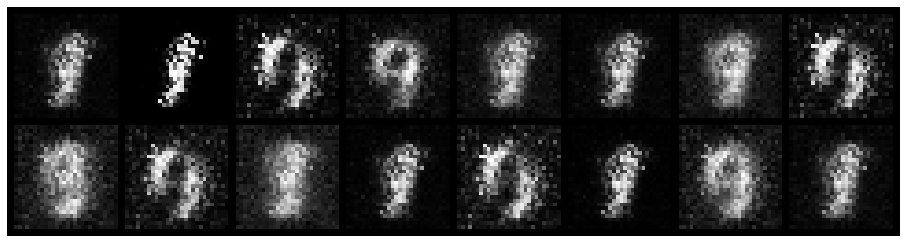

Epoch: [4/100], Batch Num: [400/600]
Discriminator Loss: 0.6376, Generator Loss: 1.9139
D(x): 0.8784, D(G(z)): 0.2700


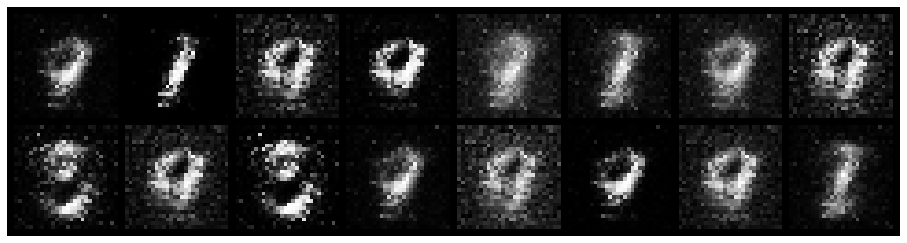

Epoch: [4/100], Batch Num: [500/600]
Discriminator Loss: 0.8011, Generator Loss: 3.7626
D(x): 0.7264, D(G(z)): 0.0920


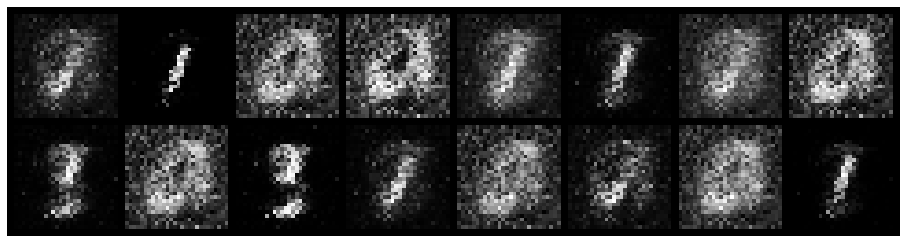

Epoch: [5/100], Batch Num: [0/600]
Discriminator Loss: 0.6464, Generator Loss: 2.3376
D(x): 0.8244, D(G(z)): 0.1951


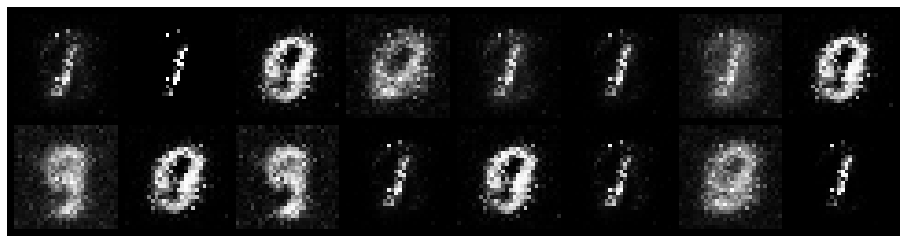

Epoch: [5/100], Batch Num: [100/600]
Discriminator Loss: 0.5465, Generator Loss: 2.3171
D(x): 0.7961, D(G(z)): 0.1150


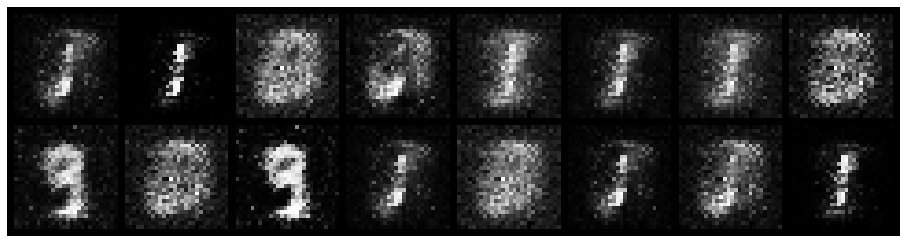

Epoch: [5/100], Batch Num: [200/600]
Discriminator Loss: 0.2274, Generator Loss: 3.5365
D(x): 0.9193, D(G(z)): 0.0874


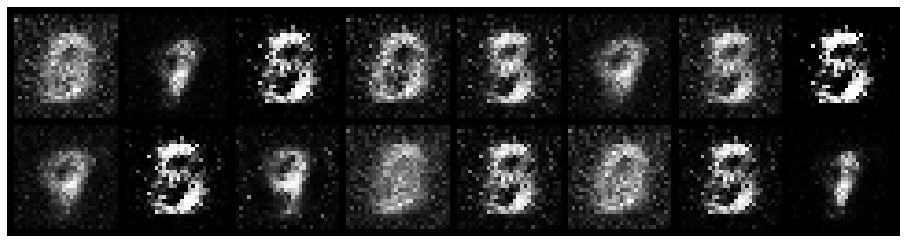

Epoch: [5/100], Batch Num: [300/600]
Discriminator Loss: 0.4810, Generator Loss: 2.0834
D(x): 0.8477, D(G(z)): 0.1607


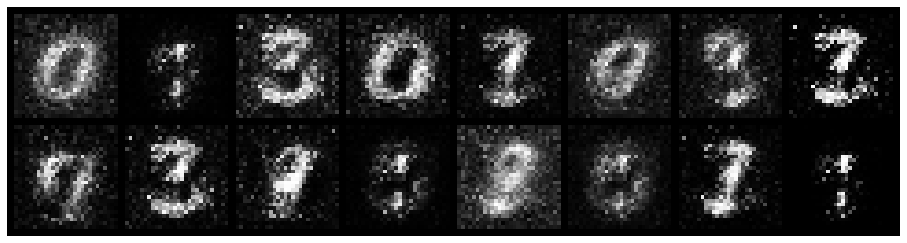

Epoch: [5/100], Batch Num: [400/600]
Discriminator Loss: 0.6805, Generator Loss: 2.2400
D(x): 0.8016, D(G(z)): 0.2110


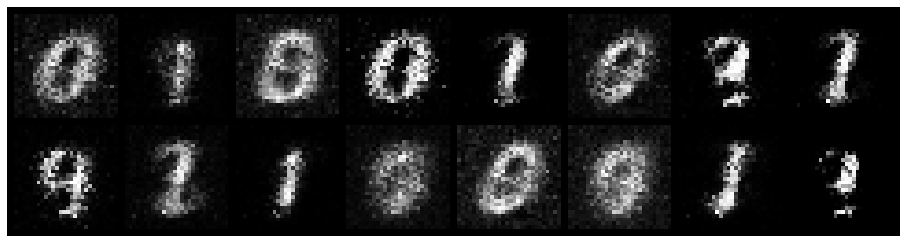

Epoch: [5/100], Batch Num: [500/600]
Discriminator Loss: 0.6491, Generator Loss: 2.0615
D(x): 0.7414, D(G(z)): 0.1609


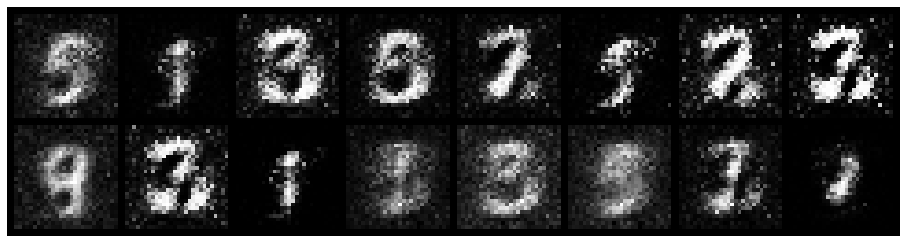

Epoch: [6/100], Batch Num: [0/600]
Discriminator Loss: 1.2063, Generator Loss: 1.4996
D(x): 0.6828, D(G(z)): 0.3334


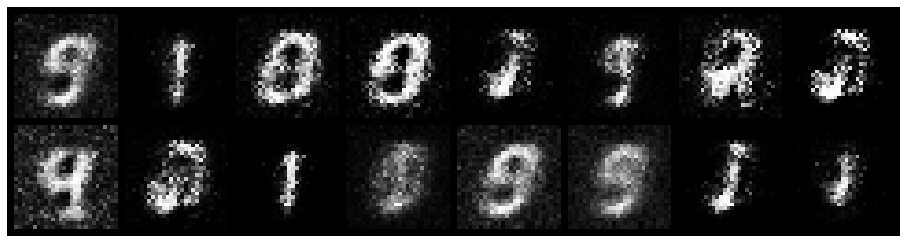

Epoch: [6/100], Batch Num: [100/600]
Discriminator Loss: 0.9961, Generator Loss: 2.0659
D(x): 0.6690, D(G(z)): 0.2177


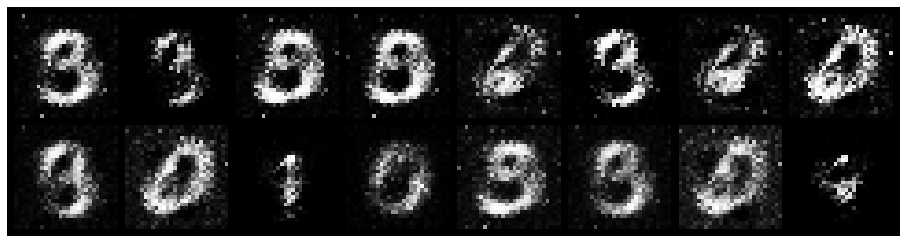

Epoch: [6/100], Batch Num: [200/600]
Discriminator Loss: 1.1250, Generator Loss: 1.3179
D(x): 0.6346, D(G(z)): 0.3187


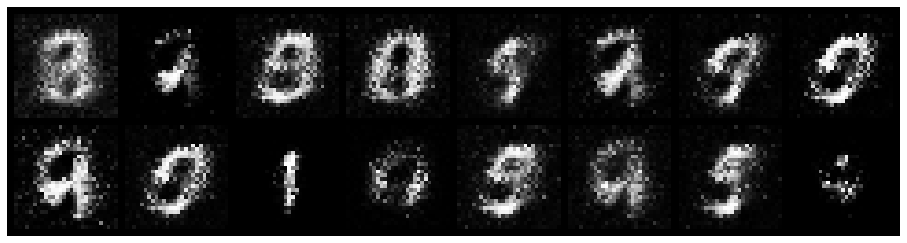

Epoch: [6/100], Batch Num: [300/600]
Discriminator Loss: 0.7733, Generator Loss: 1.8240
D(x): 0.7187, D(G(z)): 0.2671


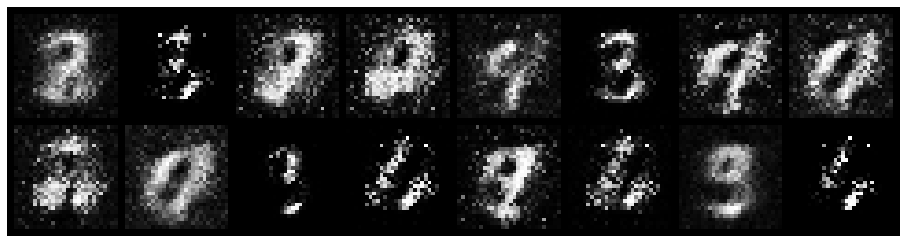

Epoch: [6/100], Batch Num: [400/600]
Discriminator Loss: 0.7758, Generator Loss: 2.4813
D(x): 0.7548, D(G(z)): 0.2215


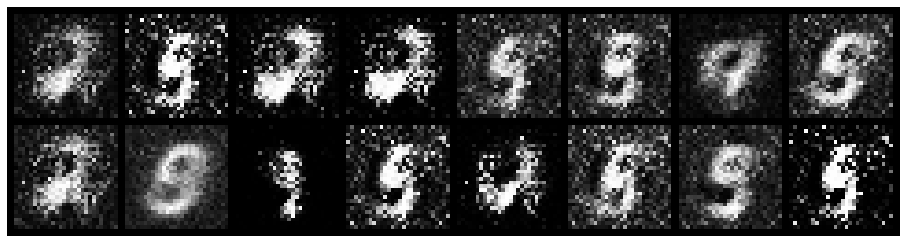

Epoch: [6/100], Batch Num: [500/600]
Discriminator Loss: 0.8591, Generator Loss: 1.5961
D(x): 0.7205, D(G(z)): 0.3273


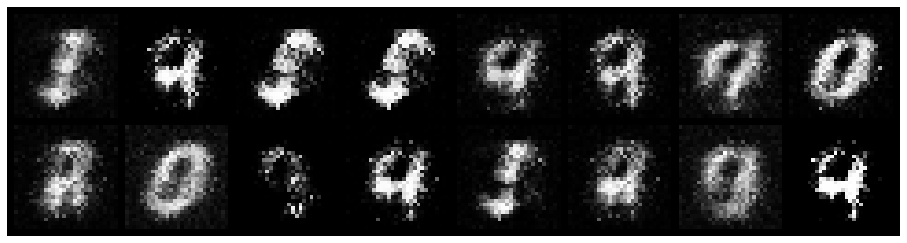

Epoch: [7/100], Batch Num: [0/600]
Discriminator Loss: 0.7750, Generator Loss: 1.5060
D(x): 0.7412, D(G(z)): 0.2279


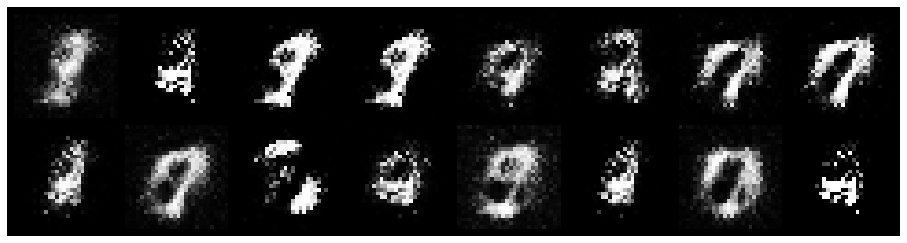

Epoch: [7/100], Batch Num: [100/600]
Discriminator Loss: 0.7268, Generator Loss: 1.7606
D(x): 0.8101, D(G(z)): 0.2514


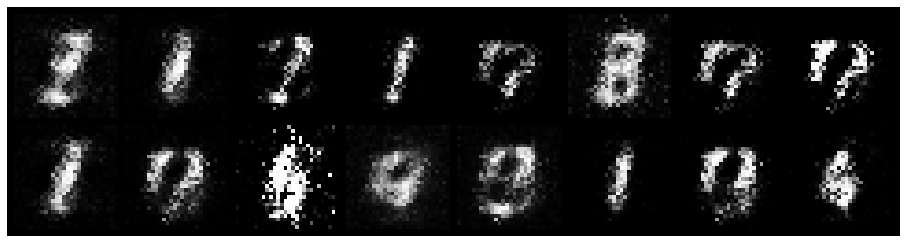

Epoch: [7/100], Batch Num: [200/600]
Discriminator Loss: 0.3756, Generator Loss: 2.4266
D(x): 0.9016, D(G(z)): 0.1584


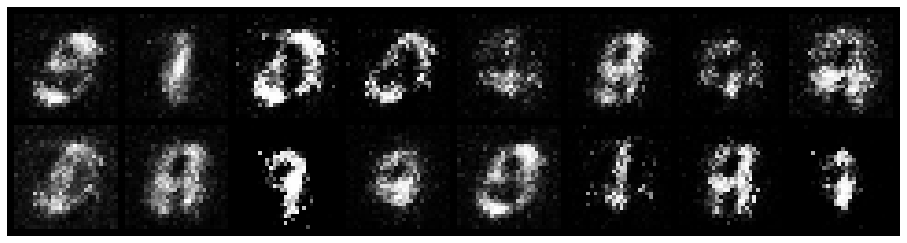

Epoch: [7/100], Batch Num: [300/600]
Discriminator Loss: 1.3358, Generator Loss: 1.2434
D(x): 0.6754, D(G(z)): 0.4293


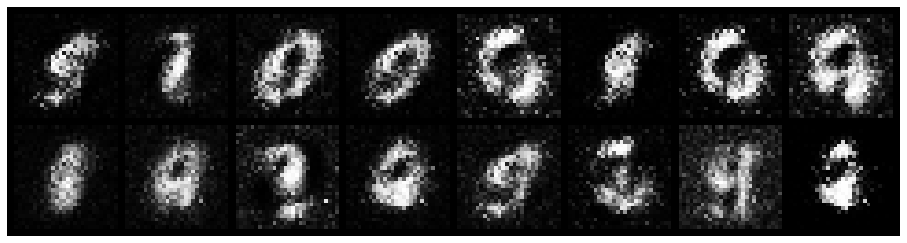

Epoch: [7/100], Batch Num: [400/600]
Discriminator Loss: 1.2250, Generator Loss: 1.0520
D(x): 0.8014, D(G(z)): 0.4635


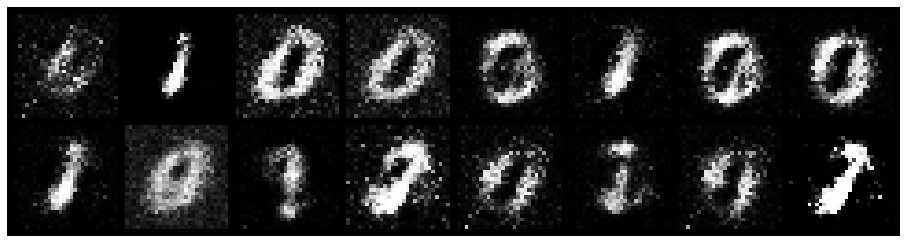

Epoch: [7/100], Batch Num: [500/600]
Discriminator Loss: 1.0849, Generator Loss: 1.3634
D(x): 0.6286, D(G(z)): 0.3259


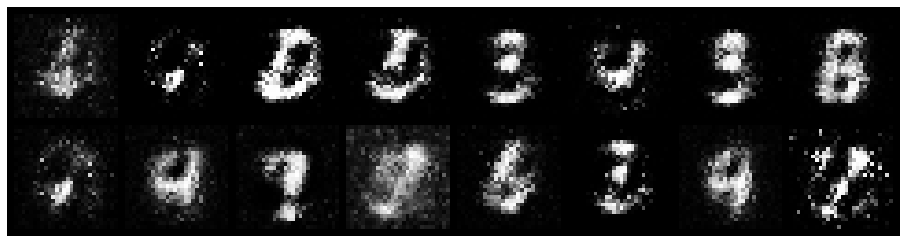

Epoch: [8/100], Batch Num: [0/600]
Discriminator Loss: 1.0062, Generator Loss: 1.2033
D(x): 0.7288, D(G(z)): 0.3489


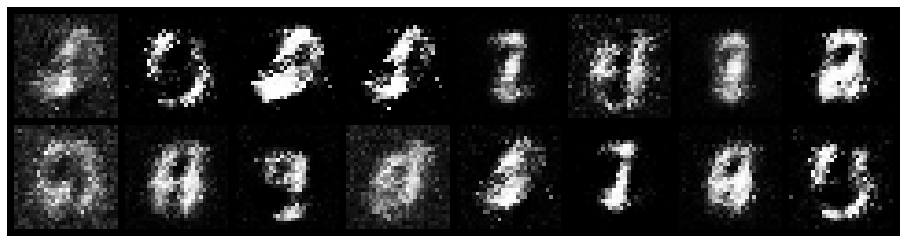

Epoch: [8/100], Batch Num: [100/600]
Discriminator Loss: 1.0425, Generator Loss: 1.5759
D(x): 0.6834, D(G(z)): 0.2444


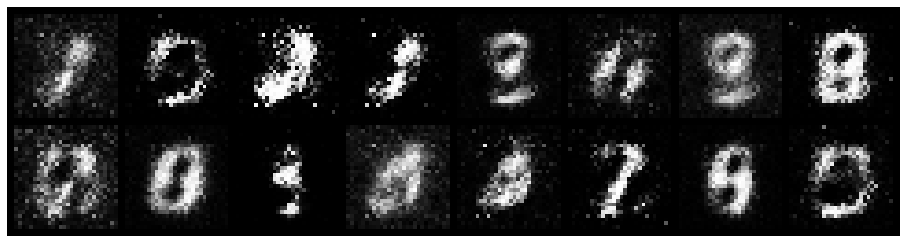

Epoch: [8/100], Batch Num: [200/600]
Discriminator Loss: 0.7178, Generator Loss: 1.8673
D(x): 0.7529, D(G(z)): 0.1958


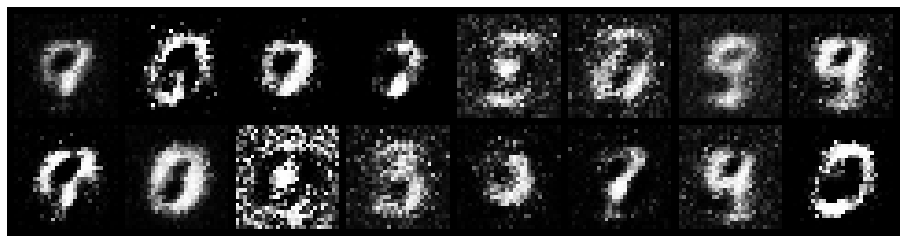

Epoch: [8/100], Batch Num: [300/600]
Discriminator Loss: 0.6787, Generator Loss: 2.5807
D(x): 0.7300, D(G(z)): 0.1578


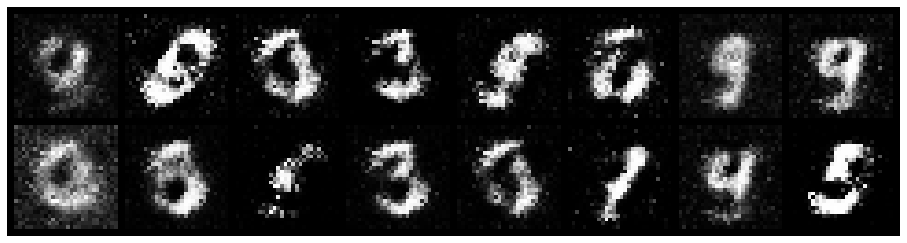

Epoch: [8/100], Batch Num: [400/600]
Discriminator Loss: 0.7799, Generator Loss: 2.3373
D(x): 0.7413, D(G(z)): 0.2021


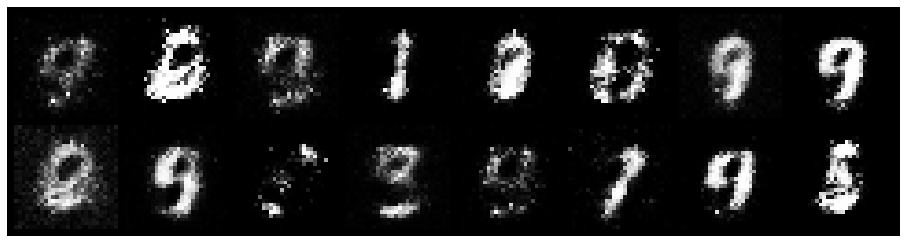

Epoch: [8/100], Batch Num: [500/600]
Discriminator Loss: 0.7955, Generator Loss: 1.6516
D(x): 0.7641, D(G(z)): 0.2573


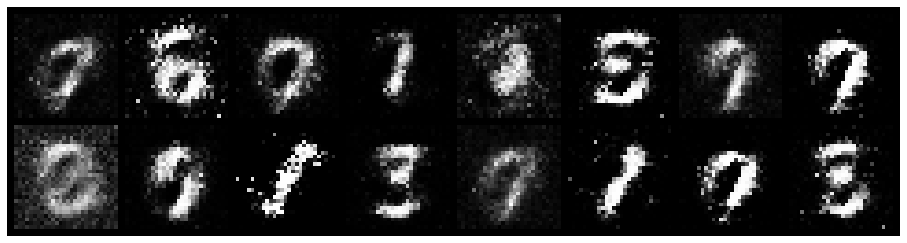

Epoch: [9/100], Batch Num: [0/600]
Discriminator Loss: 0.6558, Generator Loss: 2.6303
D(x): 0.7578, D(G(z)): 0.1397


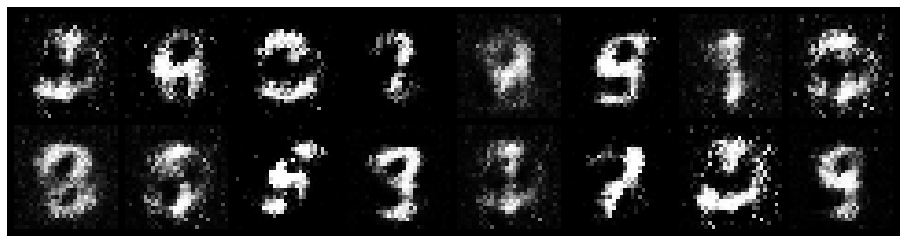

Epoch: [9/100], Batch Num: [100/600]
Discriminator Loss: 0.3180, Generator Loss: 3.3814
D(x): 0.9006, D(G(z)): 0.1345


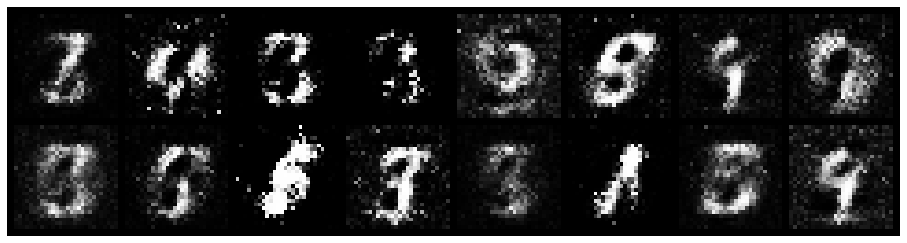

Epoch: [9/100], Batch Num: [200/600]
Discriminator Loss: 0.5496, Generator Loss: 2.1006
D(x): 0.8222, D(G(z)): 0.2328


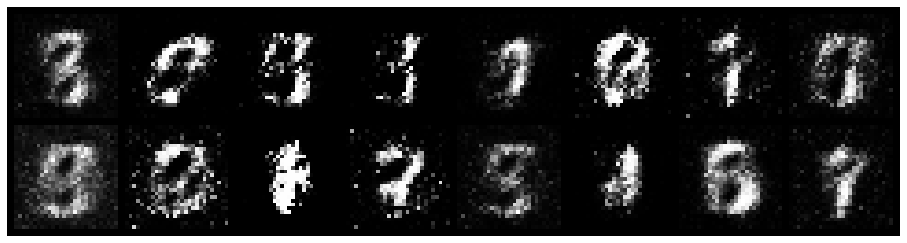

Epoch: [9/100], Batch Num: [300/600]
Discriminator Loss: 0.6729, Generator Loss: 2.2304
D(x): 0.7764, D(G(z)): 0.1852


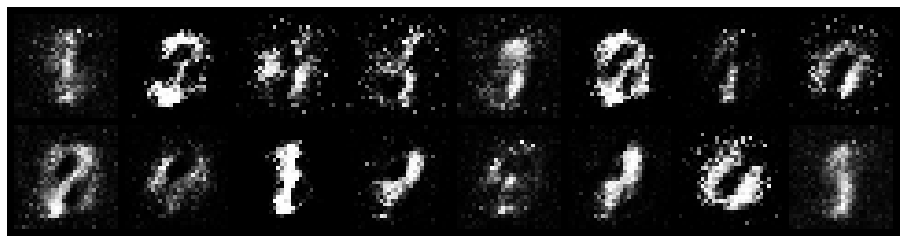

Epoch: [9/100], Batch Num: [400/600]
Discriminator Loss: 0.5697, Generator Loss: 2.8819
D(x): 0.8109, D(G(z)): 0.1537


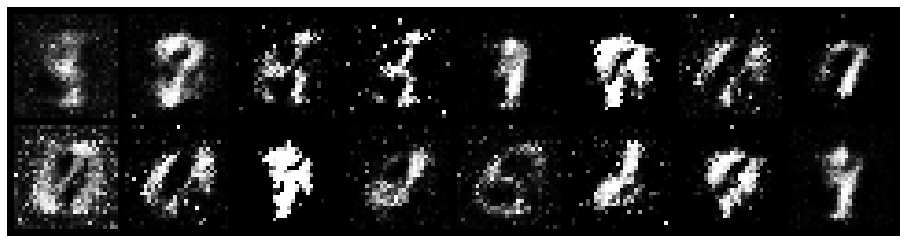

Epoch: [9/100], Batch Num: [500/600]
Discriminator Loss: 0.5472, Generator Loss: 3.1043
D(x): 0.8367, D(G(z)): 0.1367


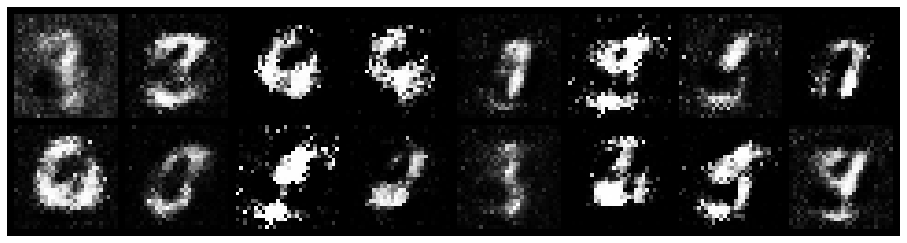

Epoch: [10/100], Batch Num: [0/600]
Discriminator Loss: 1.0412, Generator Loss: 3.1580
D(x): 0.6647, D(G(z)): 0.2181


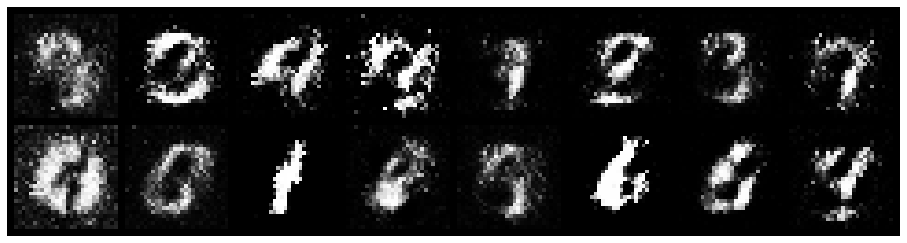

Epoch: [10/100], Batch Num: [100/600]
Discriminator Loss: 0.8341, Generator Loss: 2.8880
D(x): 0.8054, D(G(z)): 0.2816


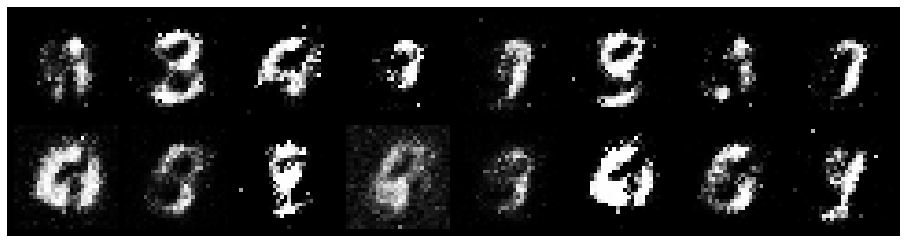

Epoch: [10/100], Batch Num: [200/600]
Discriminator Loss: 0.8399, Generator Loss: 1.9271
D(x): 0.6925, D(G(z)): 0.2095


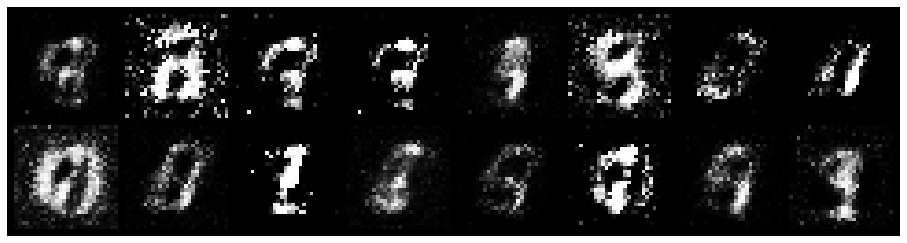

Epoch: [10/100], Batch Num: [300/600]
Discriminator Loss: 0.7432, Generator Loss: 2.3694
D(x): 0.7787, D(G(z)): 0.2533


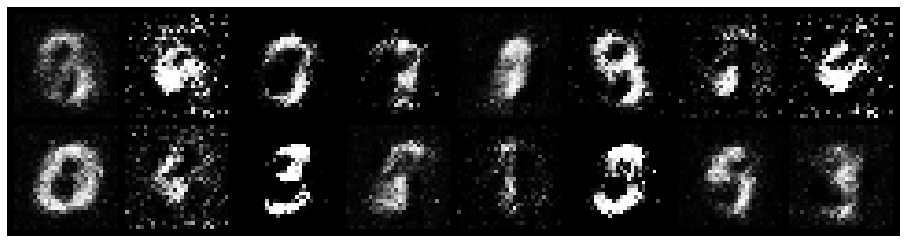

Epoch: [10/100], Batch Num: [400/600]
Discriminator Loss: 0.6672, Generator Loss: 2.3834
D(x): 0.8102, D(G(z)): 0.2174


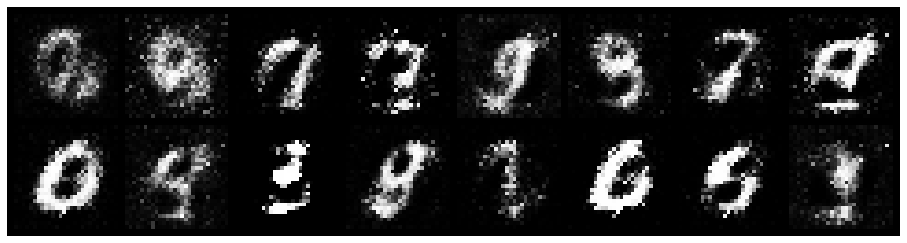

Epoch: [10/100], Batch Num: [500/600]
Discriminator Loss: 0.5225, Generator Loss: 1.9746
D(x): 0.8059, D(G(z)): 0.1348


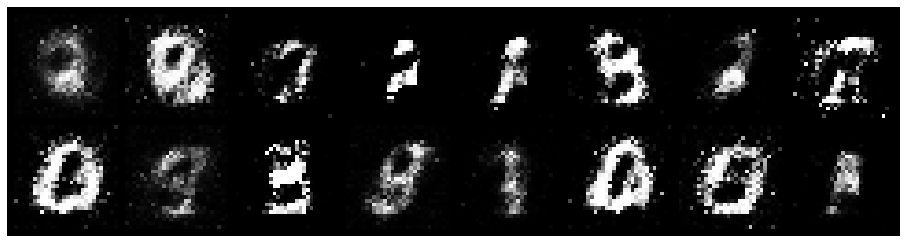

Epoch: [11/100], Batch Num: [0/600]
Discriminator Loss: 0.7439, Generator Loss: 2.1892
D(x): 0.7825, D(G(z)): 0.2293


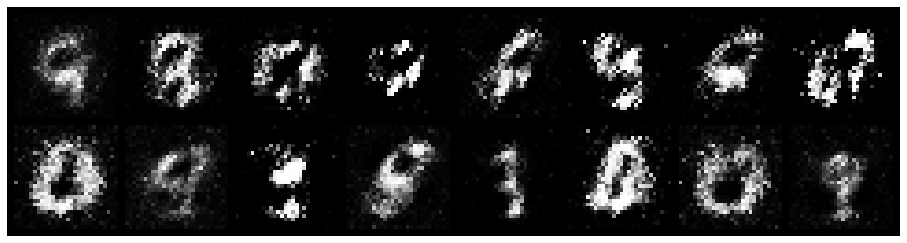

Epoch: [11/100], Batch Num: [100/600]
Discriminator Loss: 0.2947, Generator Loss: 3.4879
D(x): 0.8751, D(G(z)): 0.0798


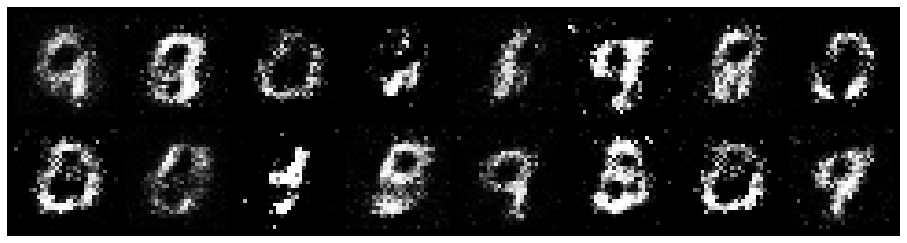

Epoch: [11/100], Batch Num: [200/600]
Discriminator Loss: 0.9648, Generator Loss: 1.5784
D(x): 0.6787, D(G(z)): 0.2640


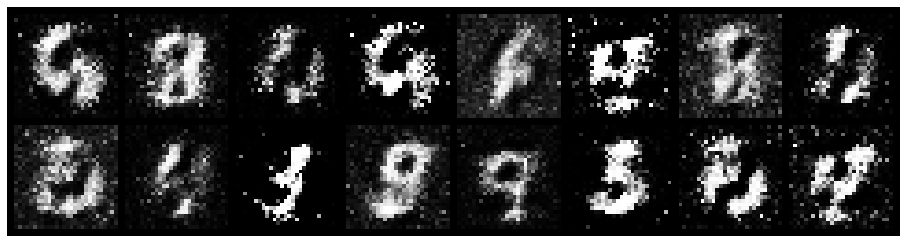

Epoch: [11/100], Batch Num: [300/600]
Discriminator Loss: 1.1196, Generator Loss: 1.8288
D(x): 0.6358, D(G(z)): 0.2747


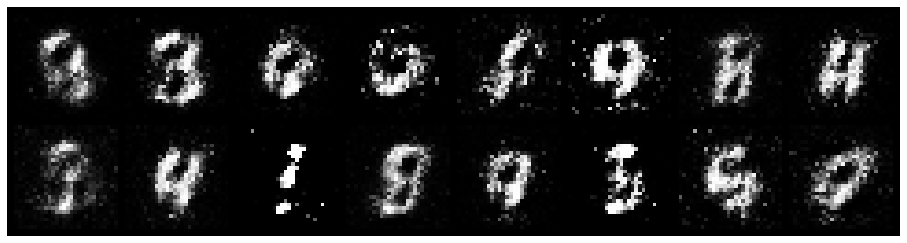

Epoch: [11/100], Batch Num: [400/600]
Discriminator Loss: 0.4784, Generator Loss: 2.3128
D(x): 0.8192, D(G(z)): 0.1575


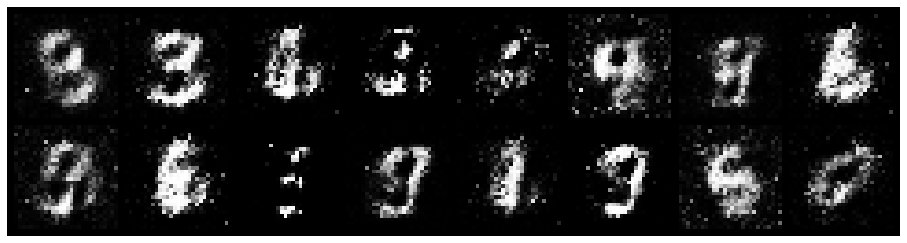

Epoch: [11/100], Batch Num: [500/600]
Discriminator Loss: 0.5490, Generator Loss: 2.0757
D(x): 0.7947, D(G(z)): 0.1511


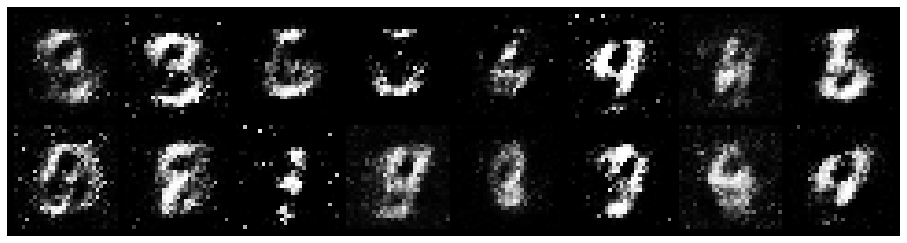

Epoch: [12/100], Batch Num: [0/600]
Discriminator Loss: 0.4768, Generator Loss: 1.9255
D(x): 0.8272, D(G(z)): 0.1570


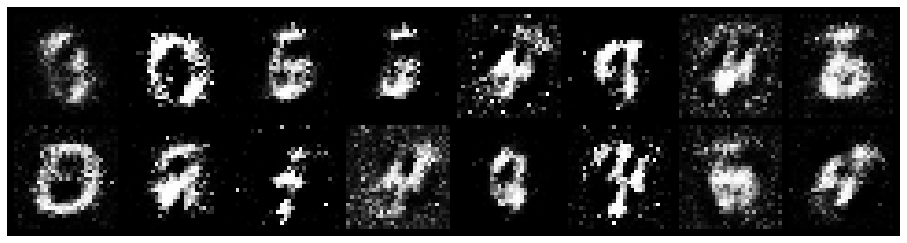

Epoch: [12/100], Batch Num: [100/600]
Discriminator Loss: 0.5358, Generator Loss: 2.0827
D(x): 0.8842, D(G(z)): 0.2632


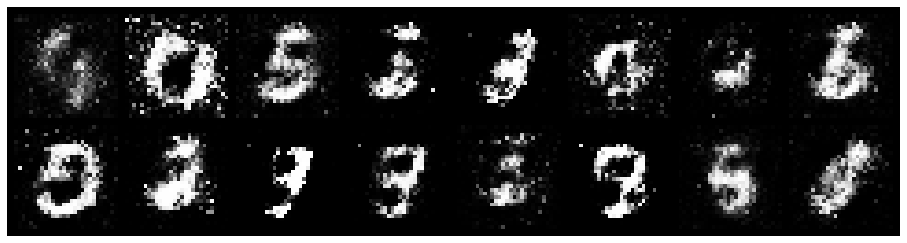

Epoch: [12/100], Batch Num: [200/600]
Discriminator Loss: 0.7314, Generator Loss: 2.2281
D(x): 0.7999, D(G(z)): 0.2579


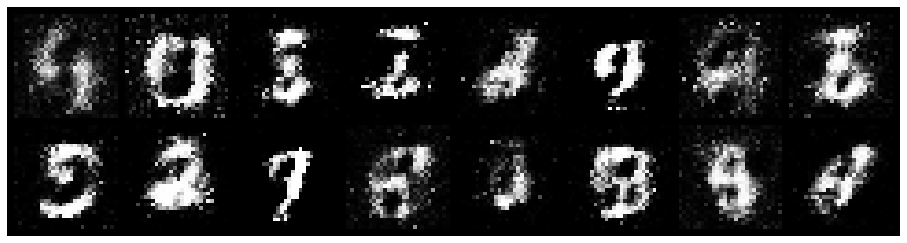

Epoch: [12/100], Batch Num: [300/600]
Discriminator Loss: 0.6550, Generator Loss: 2.3228
D(x): 0.7699, D(G(z)): 0.1885


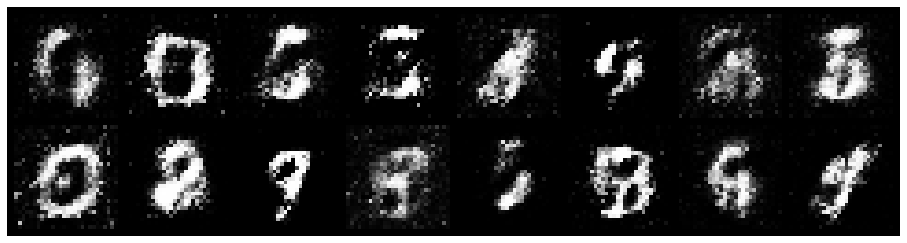

Epoch: [12/100], Batch Num: [400/600]
Discriminator Loss: 0.6793, Generator Loss: 2.3096
D(x): 0.7193, D(G(z)): 0.1433


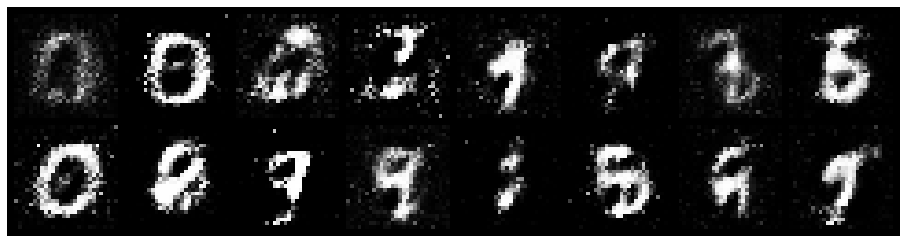

Epoch: [12/100], Batch Num: [500/600]
Discriminator Loss: 0.9312, Generator Loss: 1.5474
D(x): 0.7317, D(G(z)): 0.3024


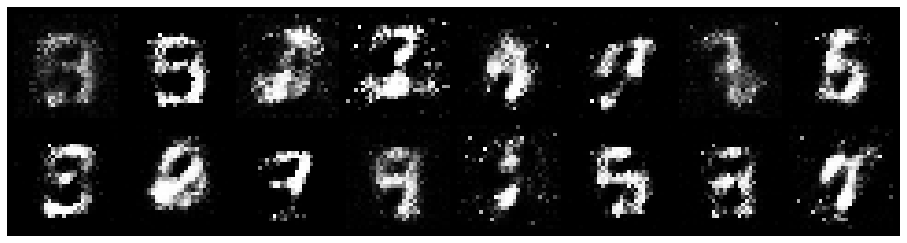

Epoch: [13/100], Batch Num: [0/600]
Discriminator Loss: 0.6277, Generator Loss: 1.8627
D(x): 0.8478, D(G(z)): 0.2643


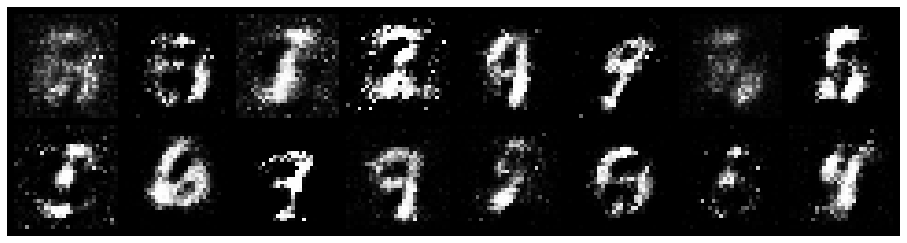

Epoch: [13/100], Batch Num: [100/600]
Discriminator Loss: 0.3546, Generator Loss: 2.7500
D(x): 0.9038, D(G(z)): 0.1675


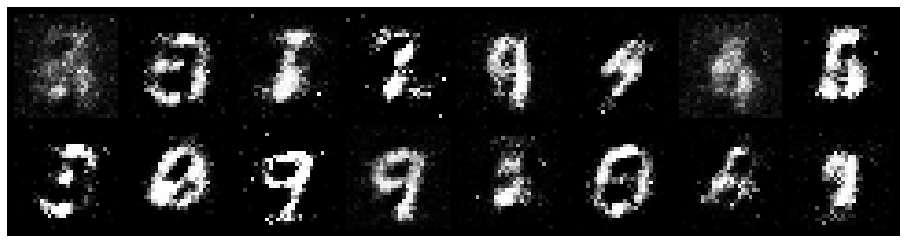

Epoch: [13/100], Batch Num: [200/600]
Discriminator Loss: 0.4603, Generator Loss: 2.6482
D(x): 0.8683, D(G(z)): 0.1878


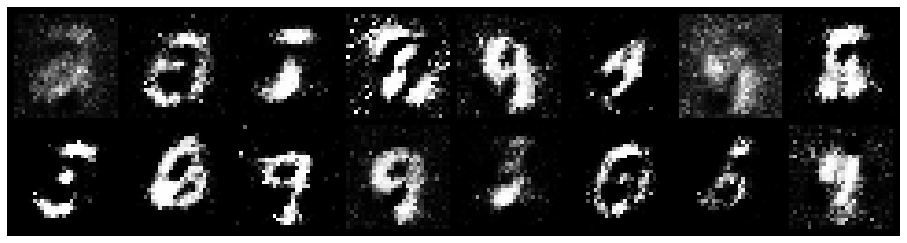

Epoch: [13/100], Batch Num: [300/600]
Discriminator Loss: 0.6259, Generator Loss: 2.1796
D(x): 0.7809, D(G(z)): 0.1760


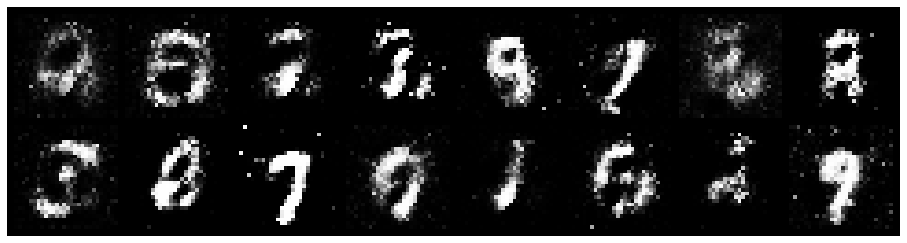

Epoch: [13/100], Batch Num: [400/600]
Discriminator Loss: 0.7475, Generator Loss: 2.3835
D(x): 0.8172, D(G(z)): 0.2507


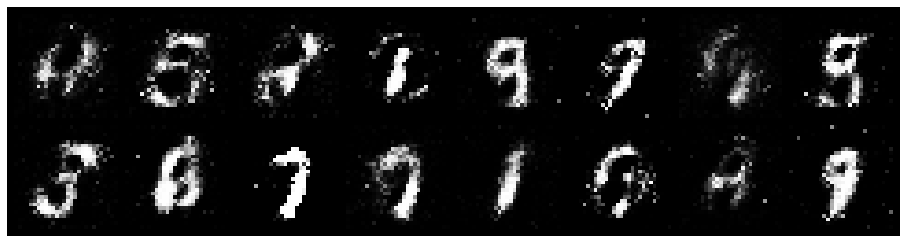

Epoch: [13/100], Batch Num: [500/600]
Discriminator Loss: 0.8587, Generator Loss: 1.8157
D(x): 0.7125, D(G(z)): 0.2525


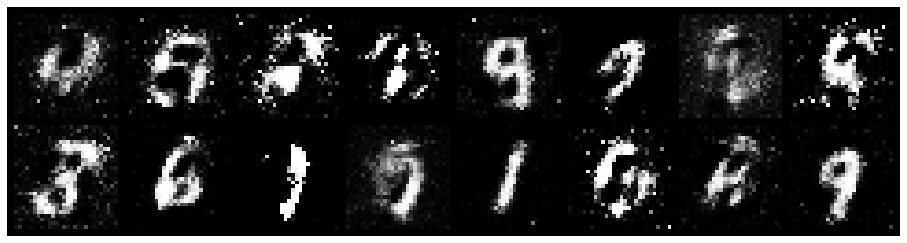

Epoch: [14/100], Batch Num: [0/600]
Discriminator Loss: 0.8174, Generator Loss: 2.0686
D(x): 0.8973, D(G(z)): 0.3572


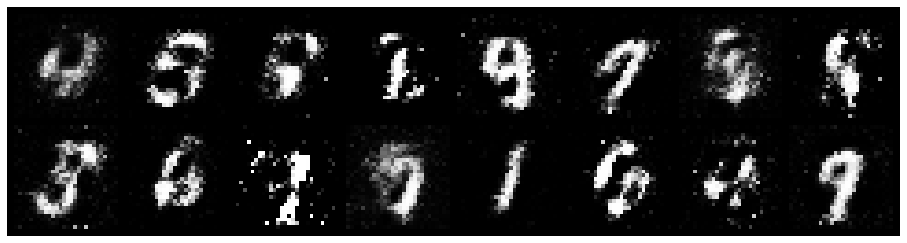

Epoch: [14/100], Batch Num: [100/600]
Discriminator Loss: 1.0260, Generator Loss: 1.8434
D(x): 0.7213, D(G(z)): 0.3128


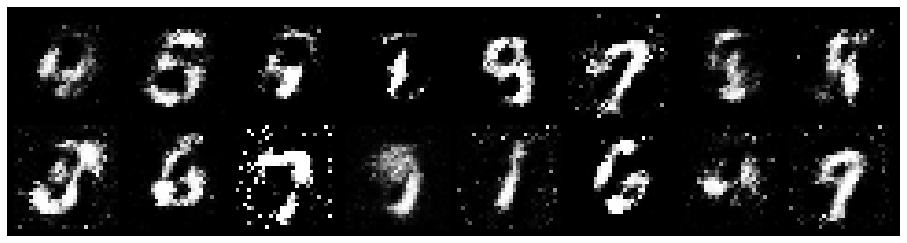

Epoch: [14/100], Batch Num: [200/600]
Discriminator Loss: 1.1608, Generator Loss: 1.4755
D(x): 0.7310, D(G(z)): 0.4096


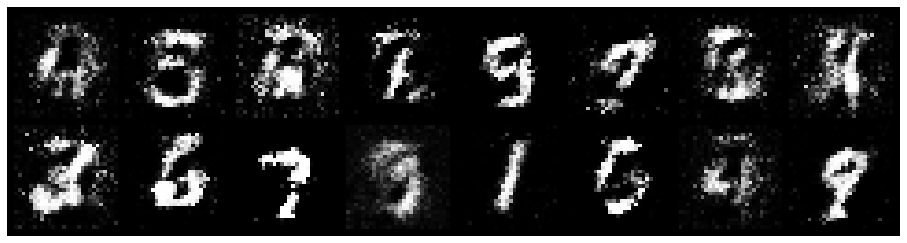

Epoch: [14/100], Batch Num: [300/600]
Discriminator Loss: 0.8113, Generator Loss: 2.1503
D(x): 0.7766, D(G(z)): 0.2557


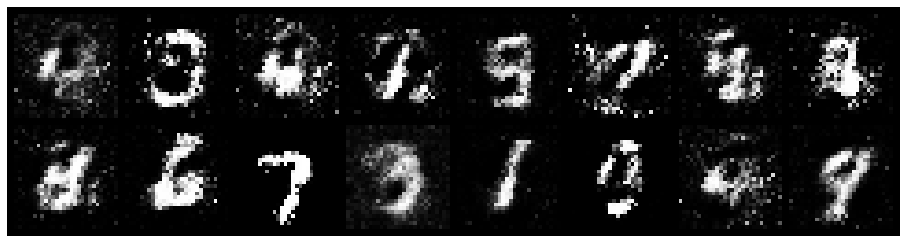

Epoch: [14/100], Batch Num: [400/600]
Discriminator Loss: 0.5455, Generator Loss: 2.1272
D(x): 0.8923, D(G(z)): 0.2453


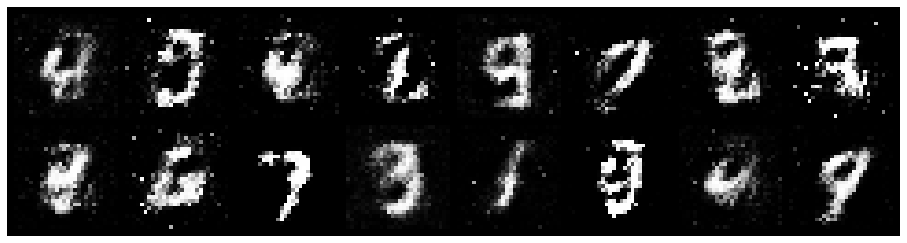

Epoch: [14/100], Batch Num: [500/600]
Discriminator Loss: 0.9134, Generator Loss: 1.5728
D(x): 0.7645, D(G(z)): 0.3306


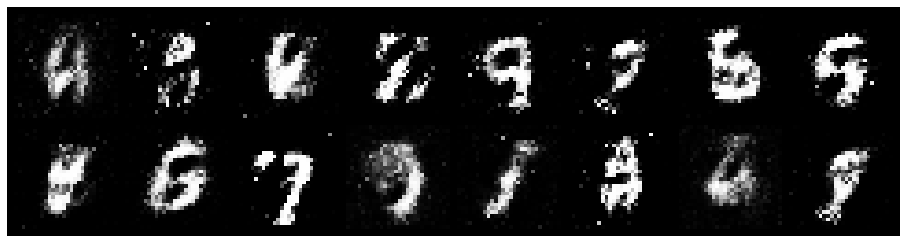

Epoch: [15/100], Batch Num: [0/600]
Discriminator Loss: 0.8404, Generator Loss: 2.3505
D(x): 0.7561, D(G(z)): 0.2610


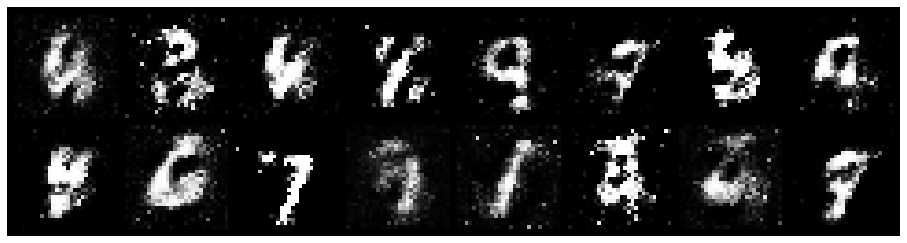

Epoch: [15/100], Batch Num: [100/600]
Discriminator Loss: 0.6687, Generator Loss: 1.5780
D(x): 0.8126, D(G(z)): 0.2889


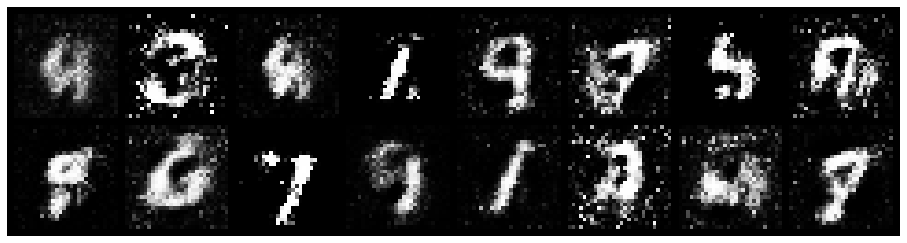

Epoch: [15/100], Batch Num: [200/600]
Discriminator Loss: 0.9333, Generator Loss: 1.2832
D(x): 0.6940, D(G(z)): 0.2980


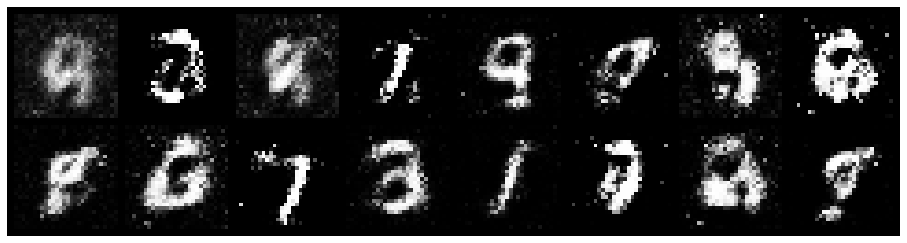

Epoch: [15/100], Batch Num: [300/600]
Discriminator Loss: 0.9477, Generator Loss: 1.7517
D(x): 0.6473, D(G(z)): 0.2745


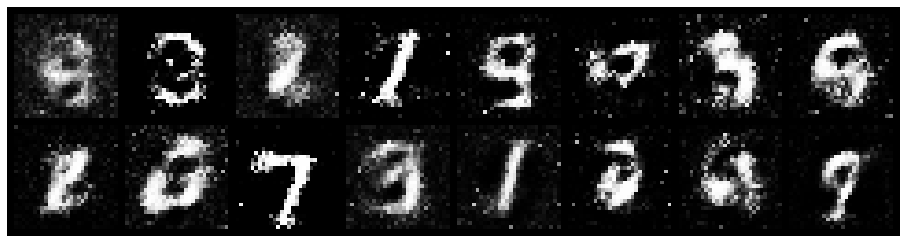

Epoch: [15/100], Batch Num: [400/600]
Discriminator Loss: 1.0657, Generator Loss: 1.6171
D(x): 0.6614, D(G(z)): 0.3235


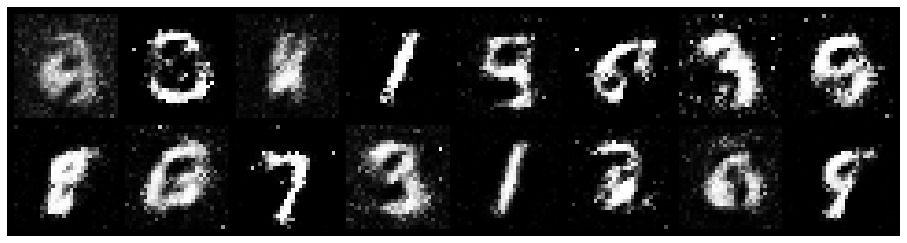

Epoch: [15/100], Batch Num: [500/600]
Discriminator Loss: 1.0012, Generator Loss: 1.7352
D(x): 0.6622, D(G(z)): 0.2788


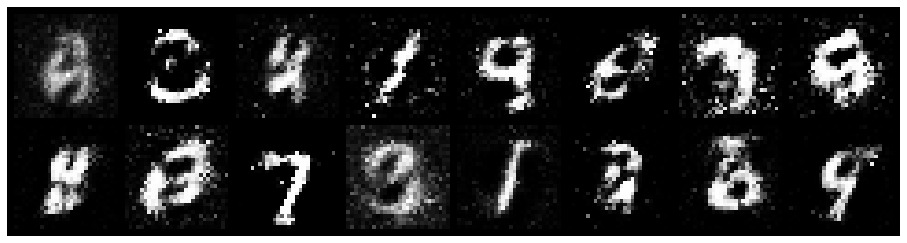

Epoch: [16/100], Batch Num: [0/600]
Discriminator Loss: 0.9004, Generator Loss: 2.0828
D(x): 0.6690, D(G(z)): 0.2422


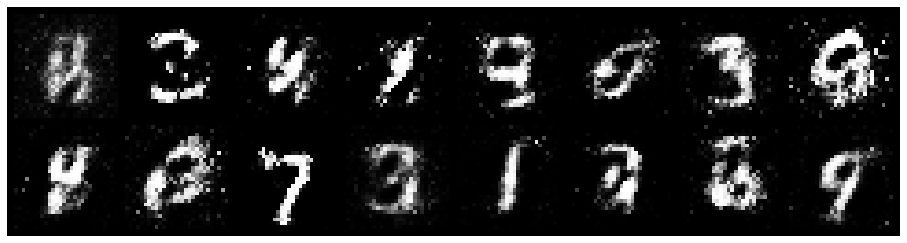

Epoch: [16/100], Batch Num: [100/600]
Discriminator Loss: 0.7197, Generator Loss: 1.9829
D(x): 0.6947, D(G(z)): 0.1724


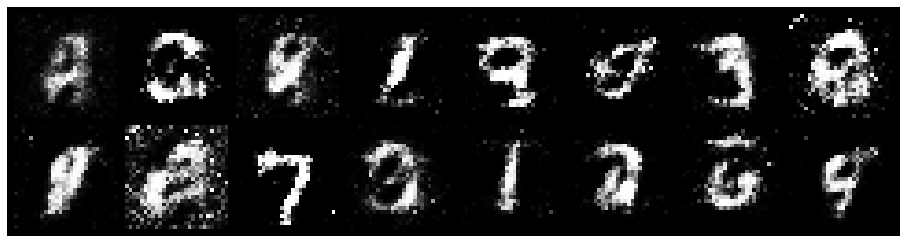

Epoch: [16/100], Batch Num: [200/600]
Discriminator Loss: 0.9839, Generator Loss: 1.7088
D(x): 0.6708, D(G(z)): 0.2643


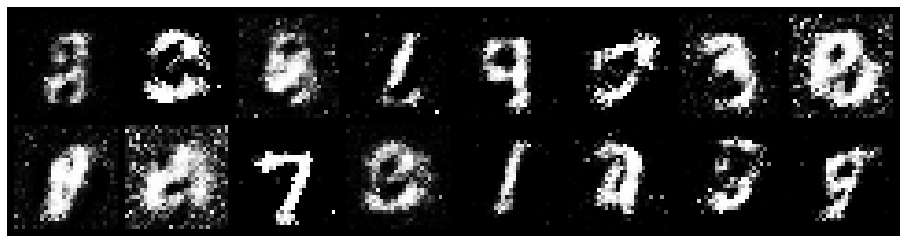

Epoch: [16/100], Batch Num: [300/600]
Discriminator Loss: 0.5984, Generator Loss: 1.9219
D(x): 0.7992, D(G(z)): 0.2131


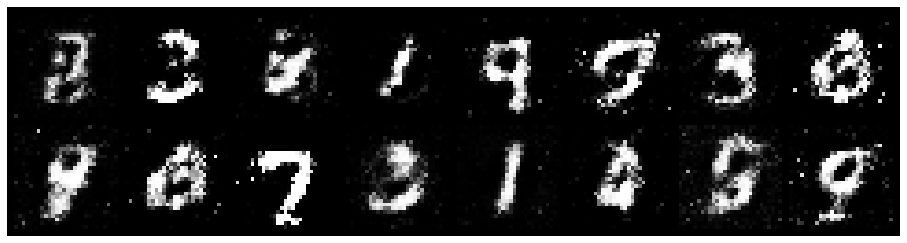

Epoch: [16/100], Batch Num: [400/600]
Discriminator Loss: 0.8561, Generator Loss: 2.3129
D(x): 0.7232, D(G(z)): 0.2431


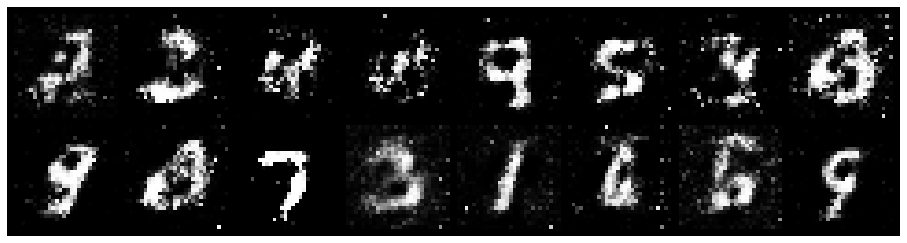

Epoch: [16/100], Batch Num: [500/600]
Discriminator Loss: 0.7129, Generator Loss: 1.6726
D(x): 0.7254, D(G(z)): 0.2205


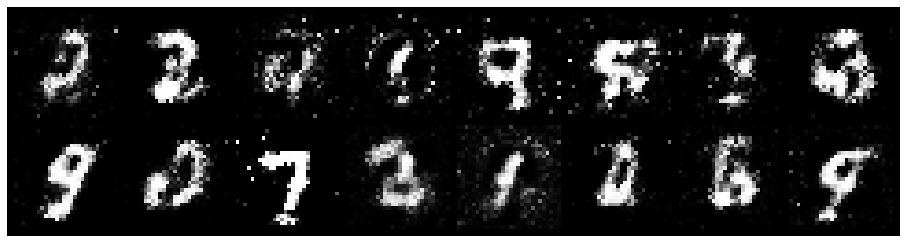

Epoch: [17/100], Batch Num: [0/600]
Discriminator Loss: 0.7317, Generator Loss: 1.9128
D(x): 0.7214, D(G(z)): 0.2110


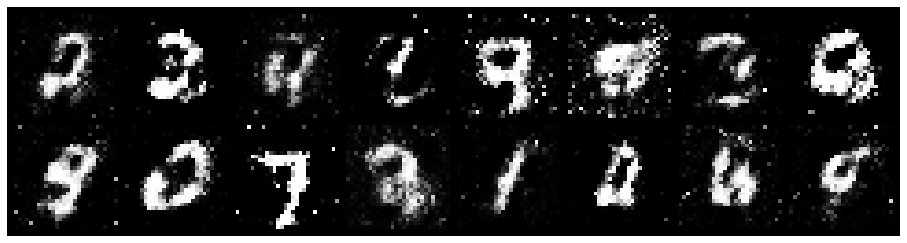

Epoch: [17/100], Batch Num: [100/600]
Discriminator Loss: 0.7852, Generator Loss: 1.8982
D(x): 0.7266, D(G(z)): 0.2078


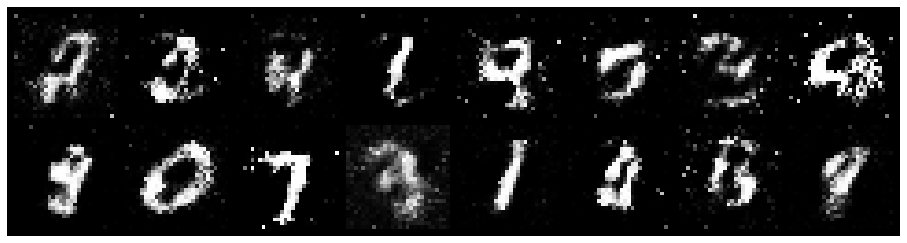

Epoch: [17/100], Batch Num: [200/600]
Discriminator Loss: 0.8051, Generator Loss: 1.7222
D(x): 0.7114, D(G(z)): 0.2314


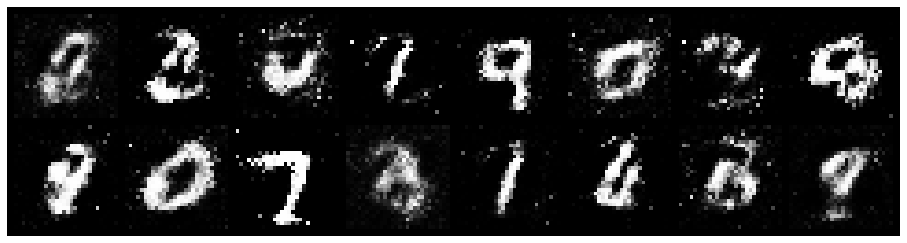

Epoch: [17/100], Batch Num: [300/600]
Discriminator Loss: 0.6356, Generator Loss: 2.0528
D(x): 0.7538, D(G(z)): 0.1864


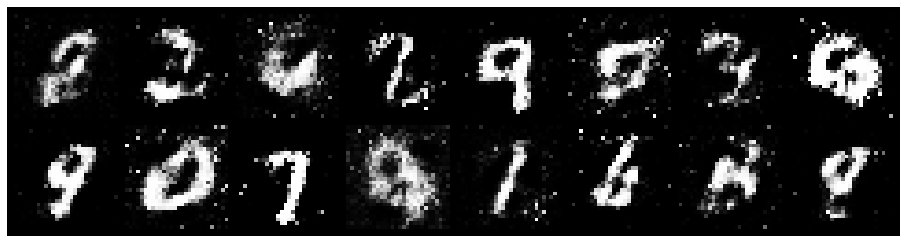

Epoch: [17/100], Batch Num: [400/600]
Discriminator Loss: 0.7810, Generator Loss: 2.1938
D(x): 0.7630, D(G(z)): 0.2460


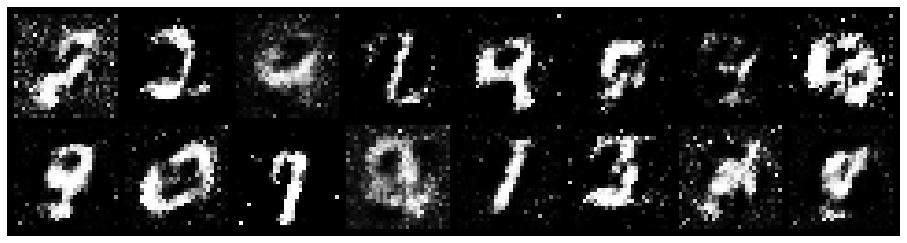

Epoch: [17/100], Batch Num: [500/600]
Discriminator Loss: 1.1755, Generator Loss: 1.7266
D(x): 0.7655, D(G(z)): 0.3966


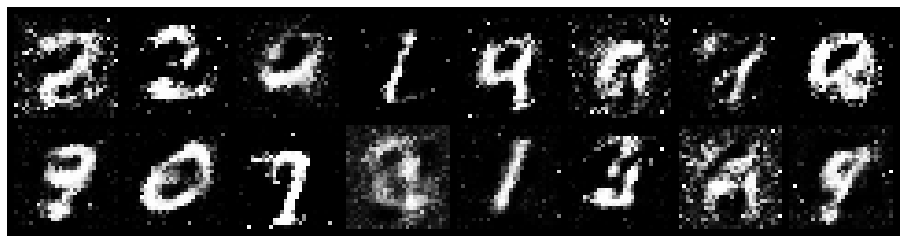

Epoch: [18/100], Batch Num: [0/600]
Discriminator Loss: 0.8728, Generator Loss: 1.5710
D(x): 0.7343, D(G(z)): 0.2718


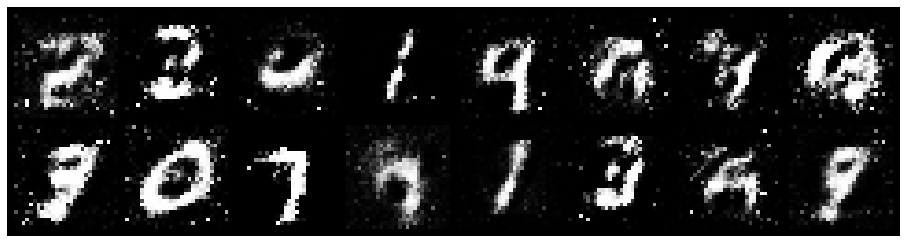

Epoch: [18/100], Batch Num: [100/600]
Discriminator Loss: 0.9490, Generator Loss: 1.5598
D(x): 0.7035, D(G(z)): 0.3069


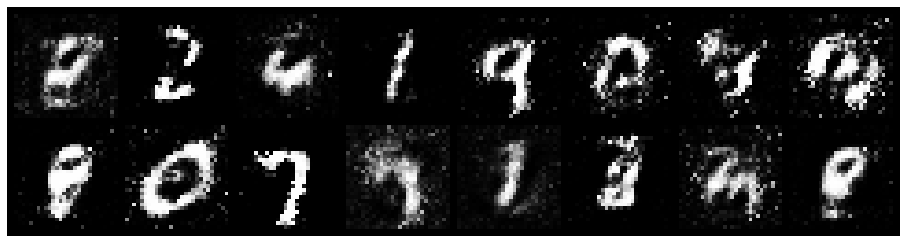

Epoch: [18/100], Batch Num: [200/600]
Discriminator Loss: 0.9504, Generator Loss: 1.3165
D(x): 0.7013, D(G(z)): 0.2982


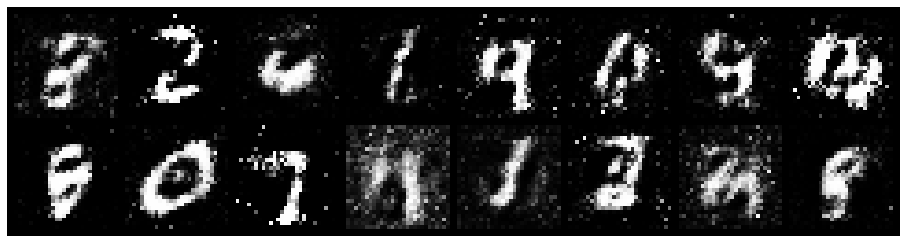

Epoch: [18/100], Batch Num: [300/600]
Discriminator Loss: 0.8215, Generator Loss: 2.0789
D(x): 0.7286, D(G(z)): 0.2560


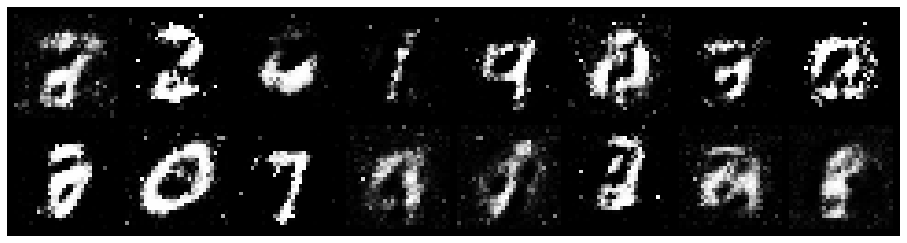

Epoch: [18/100], Batch Num: [400/600]
Discriminator Loss: 0.8194, Generator Loss: 1.9207
D(x): 0.7624, D(G(z)): 0.3127


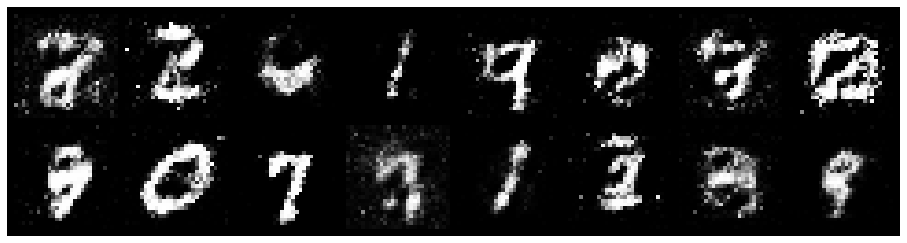

Epoch: [18/100], Batch Num: [500/600]
Discriminator Loss: 0.9527, Generator Loss: 1.4498
D(x): 0.7058, D(G(z)): 0.3285


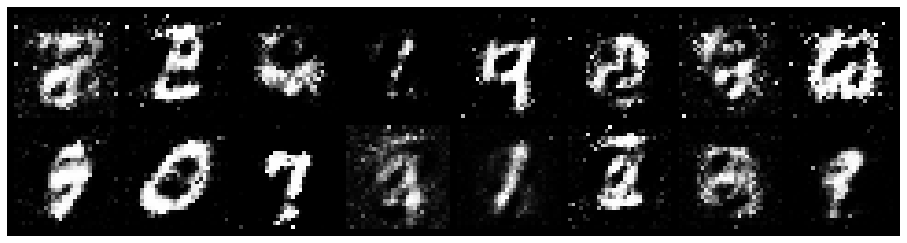

Epoch: [19/100], Batch Num: [0/600]
Discriminator Loss: 0.7651, Generator Loss: 1.4442
D(x): 0.8393, D(G(z)): 0.3601


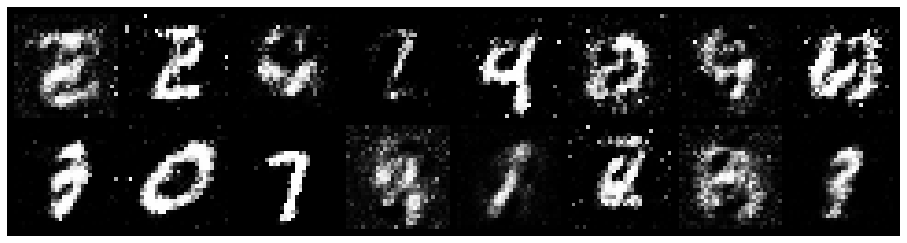

Epoch: [19/100], Batch Num: [100/600]
Discriminator Loss: 0.7435, Generator Loss: 1.4722
D(x): 0.7604, D(G(z)): 0.2863


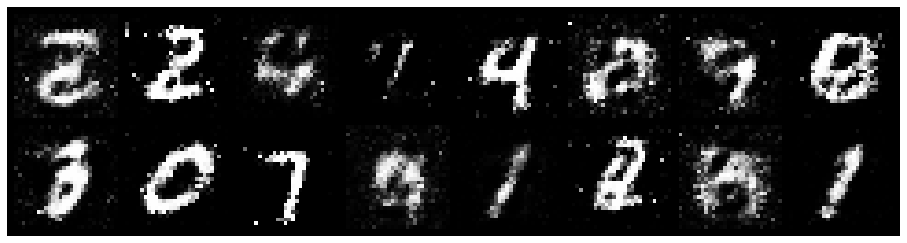

Epoch: [19/100], Batch Num: [200/600]
Discriminator Loss: 0.8807, Generator Loss: 1.6803
D(x): 0.6764, D(G(z)): 0.2322


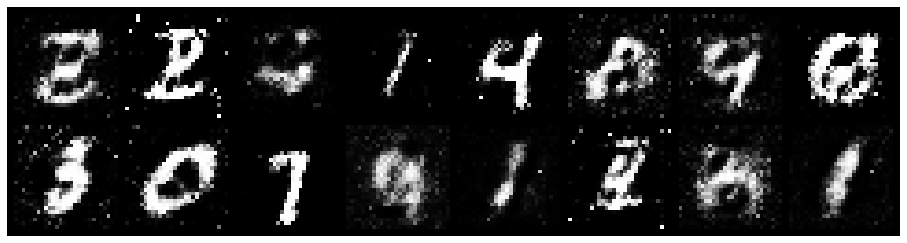

Epoch: [19/100], Batch Num: [300/600]
Discriminator Loss: 1.0299, Generator Loss: 1.4016
D(x): 0.7412, D(G(z)): 0.3705


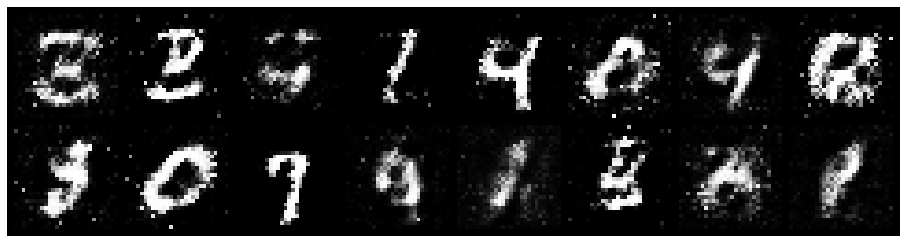

Epoch: [19/100], Batch Num: [400/600]
Discriminator Loss: 0.8538, Generator Loss: 0.8545
D(x): 0.7712, D(G(z)): 0.3493


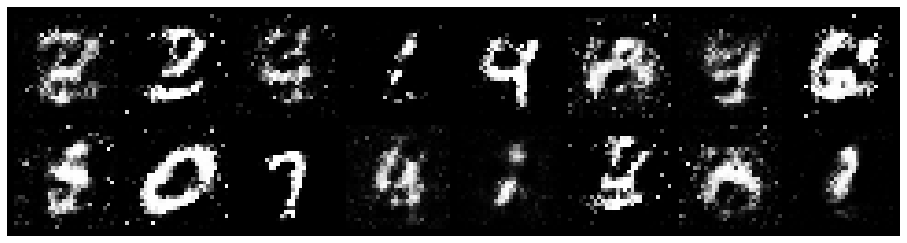

Epoch: [19/100], Batch Num: [500/600]
Discriminator Loss: 0.9009, Generator Loss: 1.7629
D(x): 0.6906, D(G(z)): 0.2791


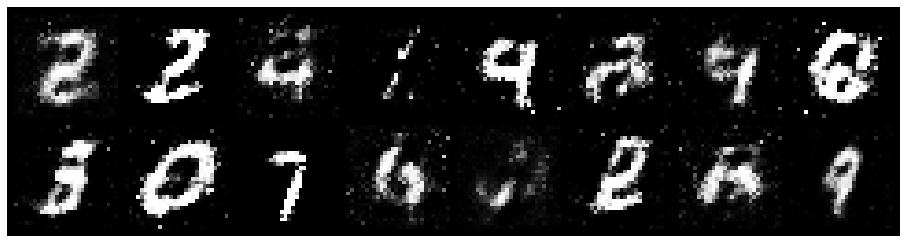

Epoch: [20/100], Batch Num: [0/600]
Discriminator Loss: 1.1063, Generator Loss: 1.8393
D(x): 0.7017, D(G(z)): 0.3551


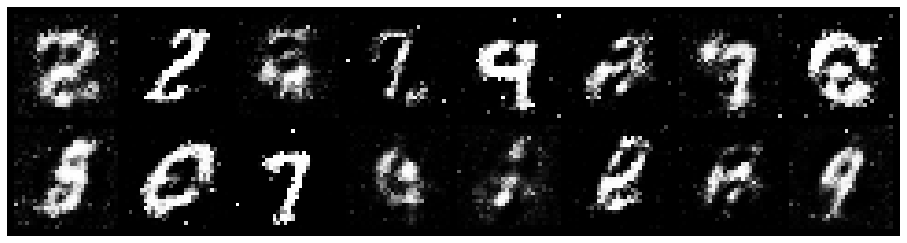

Epoch: [20/100], Batch Num: [100/600]
Discriminator Loss: 0.7858, Generator Loss: 1.6493
D(x): 0.6616, D(G(z)): 0.1929


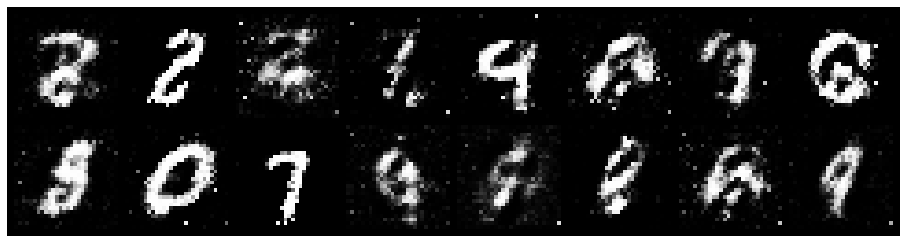

Epoch: [20/100], Batch Num: [200/600]
Discriminator Loss: 0.9273, Generator Loss: 1.6092
D(x): 0.6491, D(G(z)): 0.2558


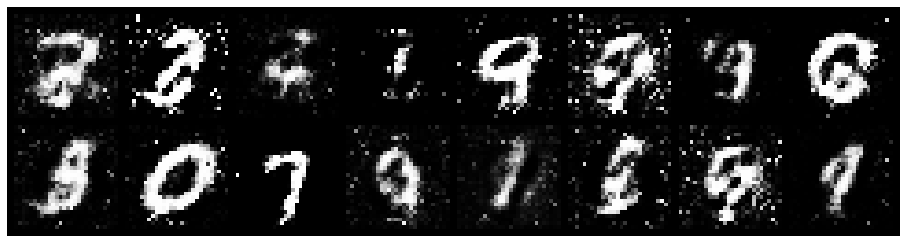

Epoch: [20/100], Batch Num: [300/600]
Discriminator Loss: 0.7912, Generator Loss: 1.5833
D(x): 0.7410, D(G(z)): 0.2951


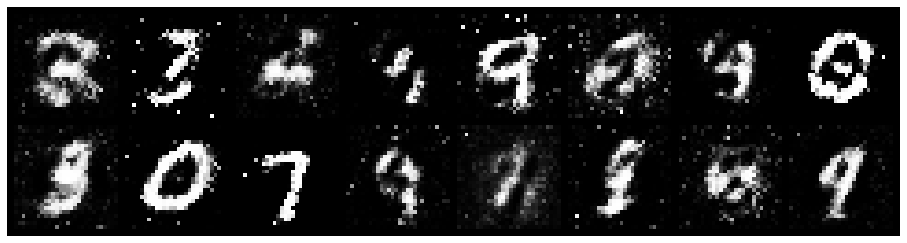

Epoch: [20/100], Batch Num: [400/600]
Discriminator Loss: 0.7049, Generator Loss: 1.7446
D(x): 0.7501, D(G(z)): 0.2565


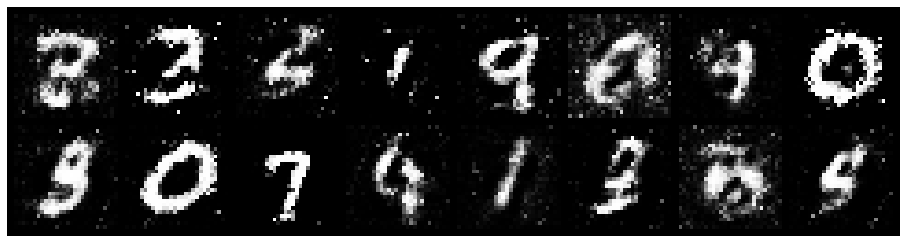

Epoch: [20/100], Batch Num: [500/600]
Discriminator Loss: 0.9686, Generator Loss: 1.1754
D(x): 0.6538, D(G(z)): 0.3444


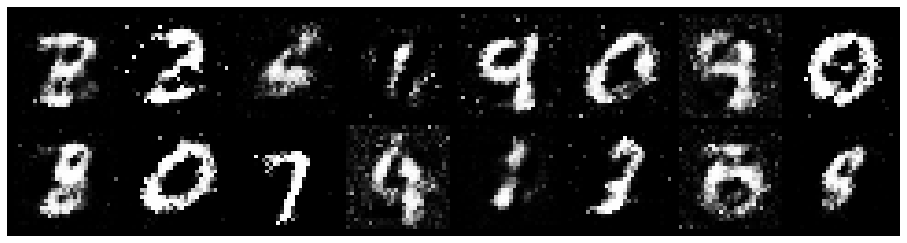

Epoch: [21/100], Batch Num: [0/600]
Discriminator Loss: 1.1510, Generator Loss: 1.1354
D(x): 0.6437, D(G(z)): 0.3617


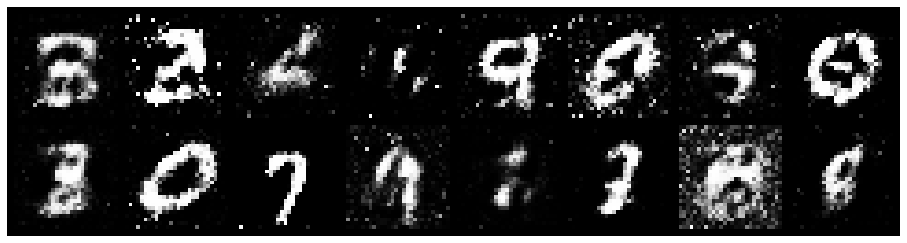

Epoch: [21/100], Batch Num: [100/600]
Discriminator Loss: 0.9530, Generator Loss: 1.6018
D(x): 0.6346, D(G(z)): 0.2448


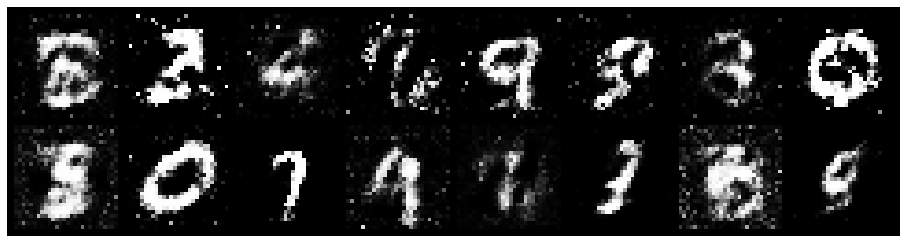

Epoch: [21/100], Batch Num: [200/600]
Discriminator Loss: 0.9407, Generator Loss: 1.2122
D(x): 0.7071, D(G(z)): 0.3230


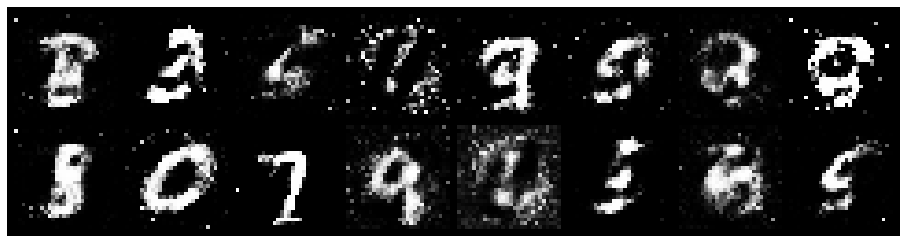

Epoch: [21/100], Batch Num: [300/600]
Discriminator Loss: 1.3420, Generator Loss: 1.6781
D(x): 0.5843, D(G(z)): 0.3488


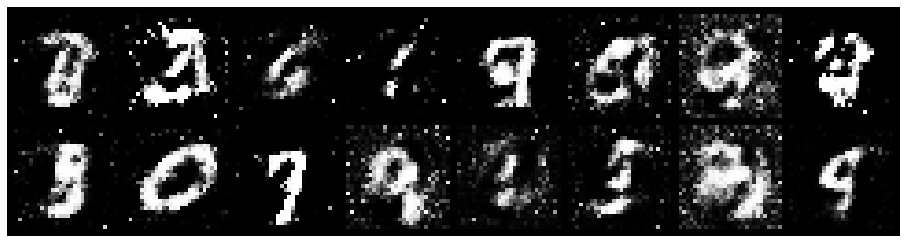

Epoch: [21/100], Batch Num: [400/600]
Discriminator Loss: 0.9749, Generator Loss: 1.4498
D(x): 0.7192, D(G(z)): 0.3506


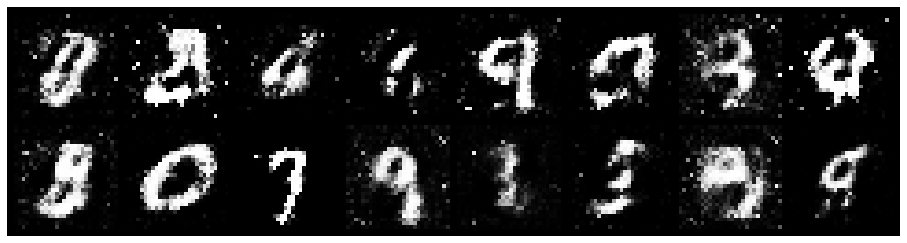

Epoch: [21/100], Batch Num: [500/600]
Discriminator Loss: 0.9137, Generator Loss: 1.2300
D(x): 0.7852, D(G(z)): 0.3785


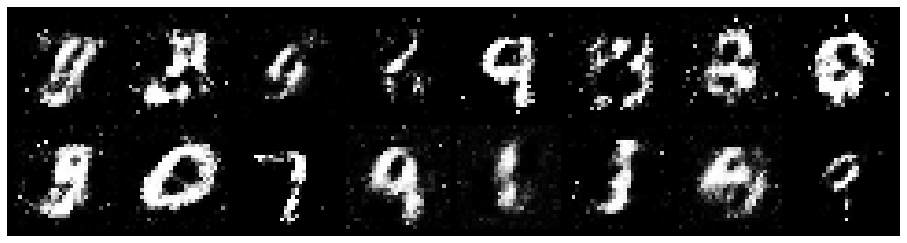

Epoch: [22/100], Batch Num: [0/600]
Discriminator Loss: 0.8798, Generator Loss: 1.6574
D(x): 0.7150, D(G(z)): 0.2812


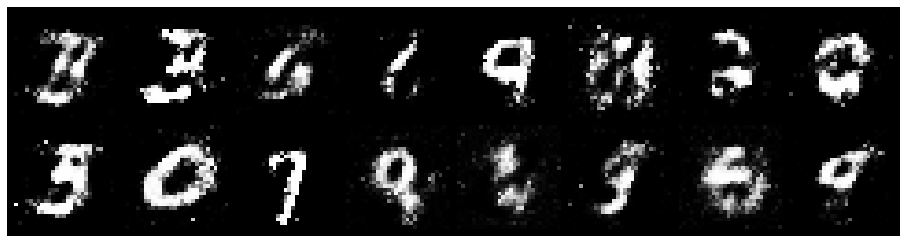

Epoch: [22/100], Batch Num: [100/600]
Discriminator Loss: 1.0070, Generator Loss: 1.3083
D(x): 0.7298, D(G(z)): 0.3717


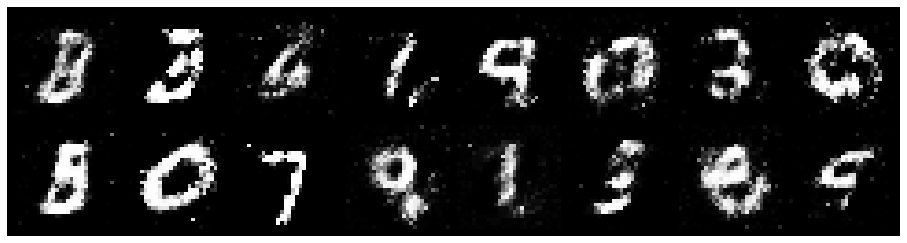

Epoch: [22/100], Batch Num: [200/600]
Discriminator Loss: 0.9022, Generator Loss: 1.6676
D(x): 0.6864, D(G(z)): 0.2901


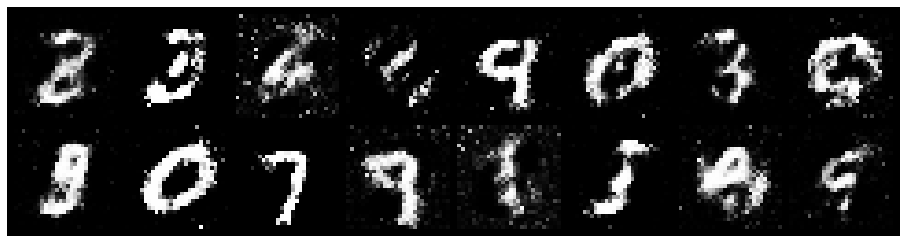

Epoch: [22/100], Batch Num: [300/600]
Discriminator Loss: 0.9548, Generator Loss: 1.4494
D(x): 0.7169, D(G(z)): 0.3546


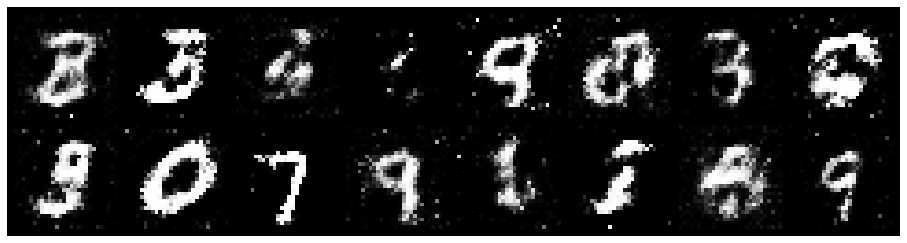

Epoch: [22/100], Batch Num: [400/600]
Discriminator Loss: 1.0089, Generator Loss: 1.5610
D(x): 0.6775, D(G(z)): 0.3180


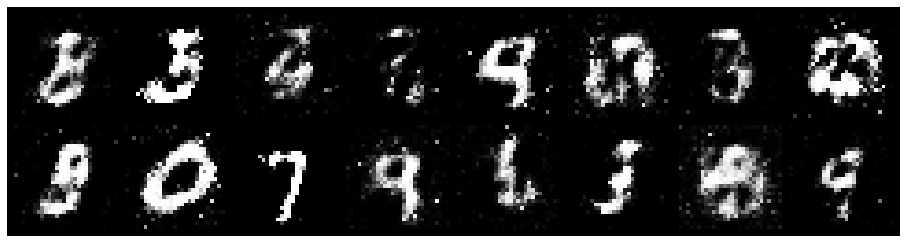

Epoch: [22/100], Batch Num: [500/600]
Discriminator Loss: 0.9087, Generator Loss: 1.6952
D(x): 0.6773, D(G(z)): 0.2833


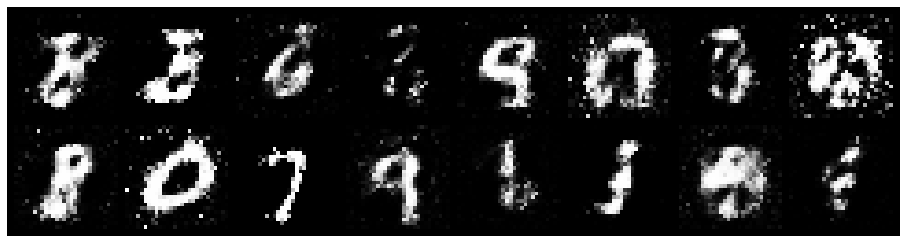

Epoch: [23/100], Batch Num: [0/600]
Discriminator Loss: 0.8289, Generator Loss: 2.0294
D(x): 0.7040, D(G(z)): 0.2486


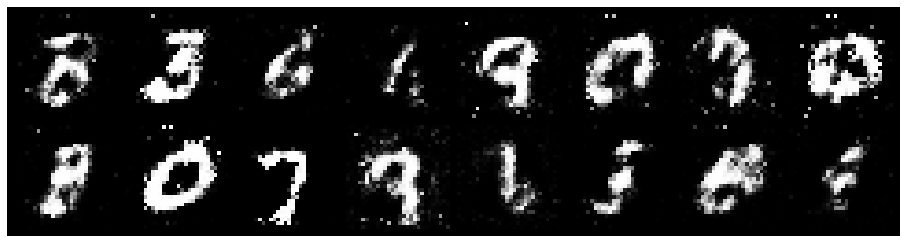

Epoch: [23/100], Batch Num: [100/600]
Discriminator Loss: 0.8930, Generator Loss: 1.6745
D(x): 0.6597, D(G(z)): 0.2479


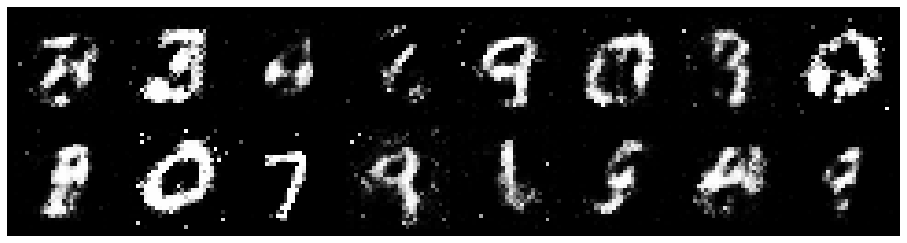

Epoch: [23/100], Batch Num: [200/600]
Discriminator Loss: 0.7881, Generator Loss: 1.4573
D(x): 0.7385, D(G(z)): 0.2730


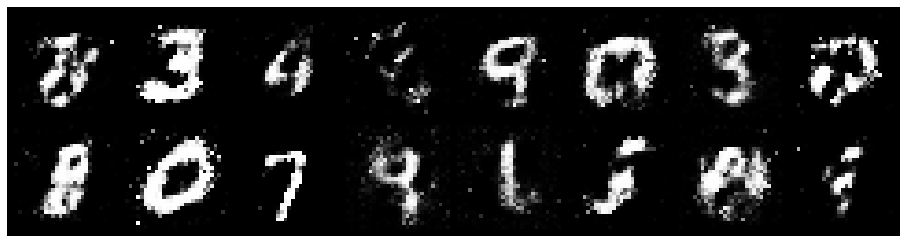

Epoch: [23/100], Batch Num: [300/600]
Discriminator Loss: 0.8341, Generator Loss: 1.4568
D(x): 0.6843, D(G(z)): 0.2350


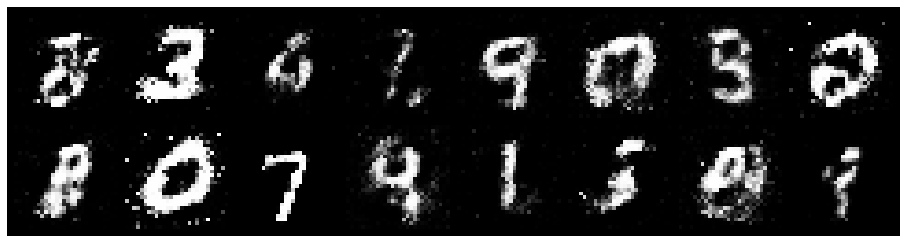

Epoch: [23/100], Batch Num: [400/600]
Discriminator Loss: 1.0476, Generator Loss: 1.7632
D(x): 0.6357, D(G(z)): 0.3111


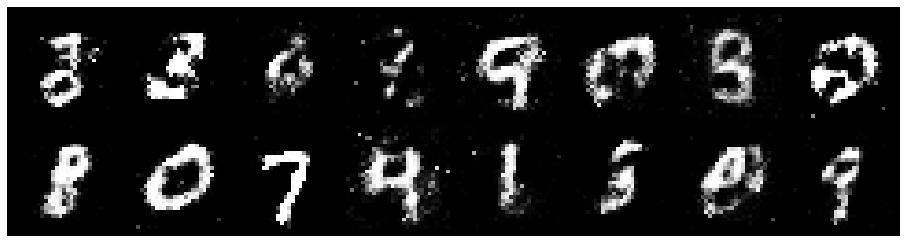

Epoch: [23/100], Batch Num: [500/600]
Discriminator Loss: 1.2027, Generator Loss: 1.2842
D(x): 0.6095, D(G(z)): 0.3208


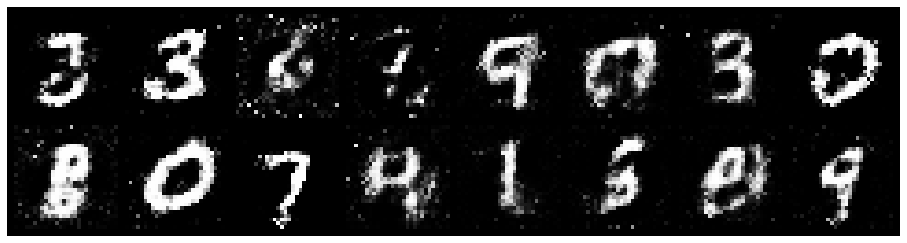

Epoch: [24/100], Batch Num: [0/600]
Discriminator Loss: 0.9359, Generator Loss: 1.2851
D(x): 0.6813, D(G(z)): 0.3177


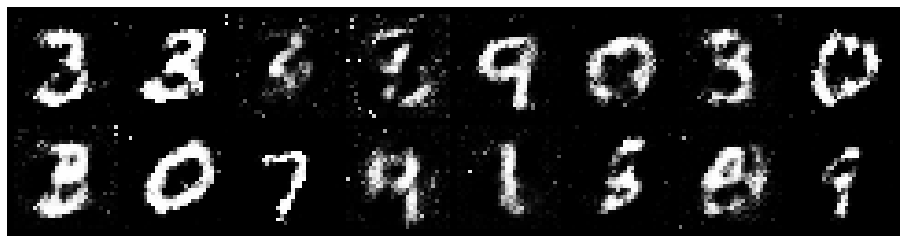

Epoch: [24/100], Batch Num: [100/600]
Discriminator Loss: 1.0761, Generator Loss: 1.2713
D(x): 0.6509, D(G(z)): 0.3588


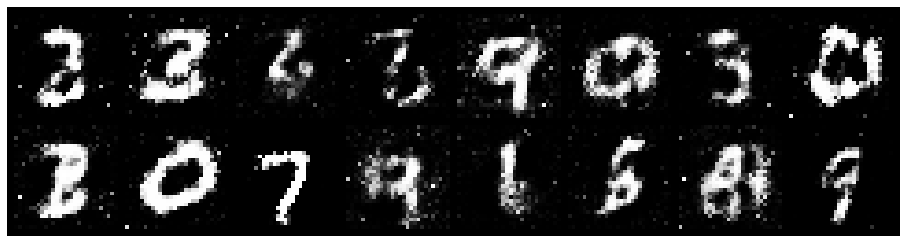

Epoch: [24/100], Batch Num: [200/600]
Discriminator Loss: 1.0172, Generator Loss: 1.6152
D(x): 0.6553, D(G(z)): 0.2769


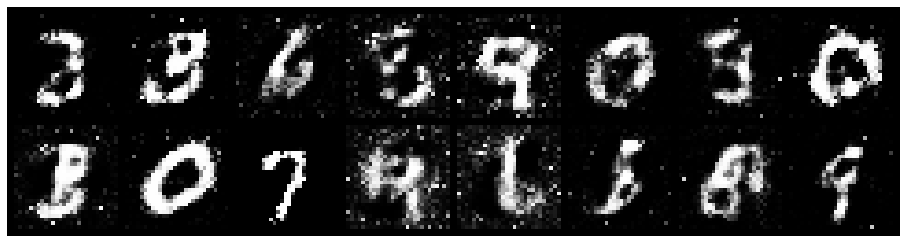

Epoch: [24/100], Batch Num: [300/600]
Discriminator Loss: 1.0193, Generator Loss: 1.5310
D(x): 0.6738, D(G(z)): 0.3505


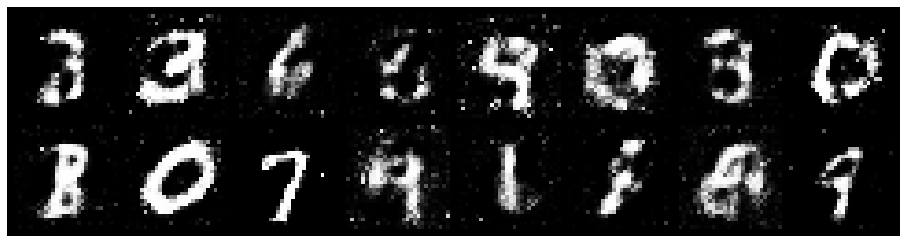

Epoch: [24/100], Batch Num: [400/600]
Discriminator Loss: 1.1417, Generator Loss: 1.4824
D(x): 0.5710, D(G(z)): 0.2902


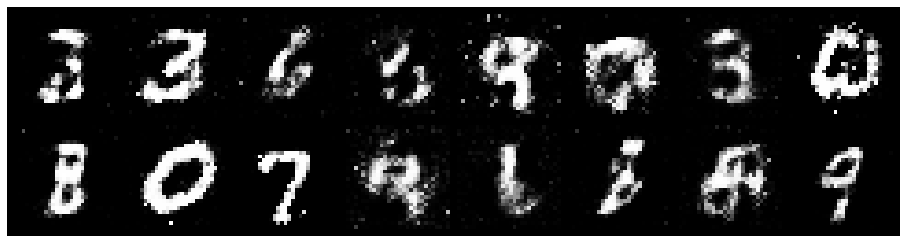

Epoch: [24/100], Batch Num: [500/600]
Discriminator Loss: 0.9769, Generator Loss: 1.3358
D(x): 0.6641, D(G(z)): 0.3059


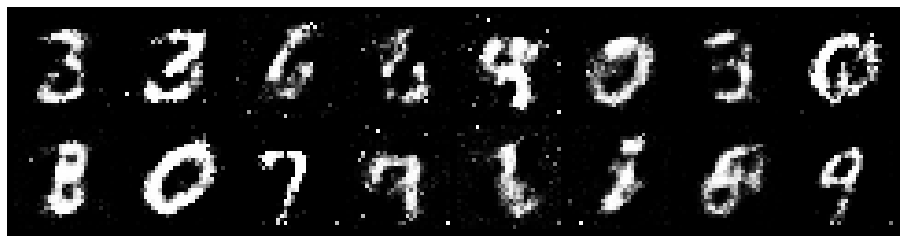

Epoch: [25/100], Batch Num: [0/600]
Discriminator Loss: 1.1599, Generator Loss: 1.2123
D(x): 0.6272, D(G(z)): 0.3466


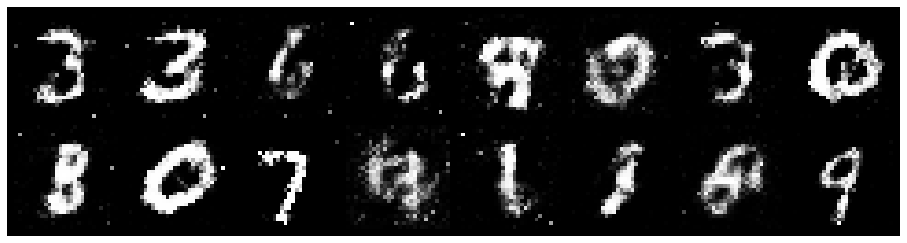

Epoch: [25/100], Batch Num: [100/600]
Discriminator Loss: 1.1456, Generator Loss: 0.9842
D(x): 0.7171, D(G(z)): 0.4478


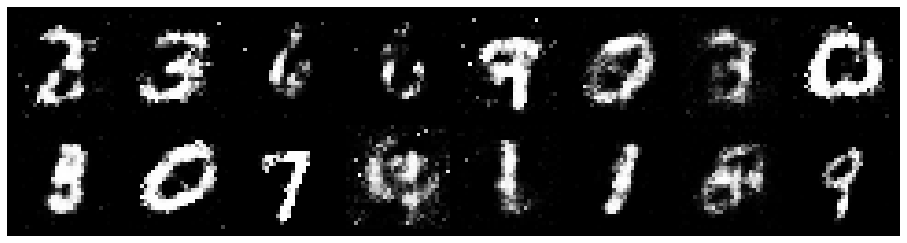

Epoch: [25/100], Batch Num: [200/600]
Discriminator Loss: 1.1865, Generator Loss: 1.1379
D(x): 0.6067, D(G(z)): 0.3723


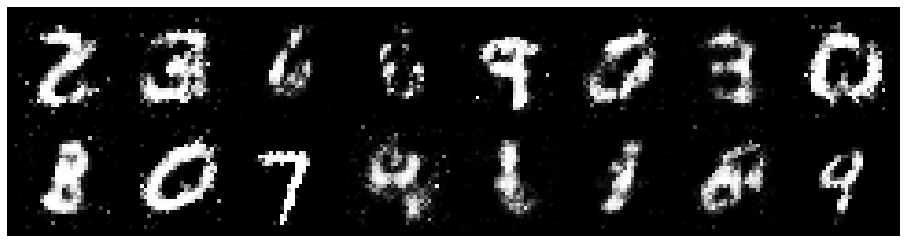

Epoch: [25/100], Batch Num: [300/600]
Discriminator Loss: 0.9816, Generator Loss: 1.4881
D(x): 0.6808, D(G(z)): 0.3092


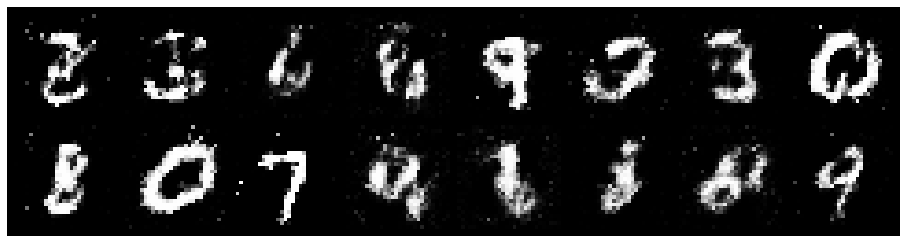

Epoch: [25/100], Batch Num: [400/600]
Discriminator Loss: 1.1322, Generator Loss: 1.2698
D(x): 0.7000, D(G(z)): 0.4256


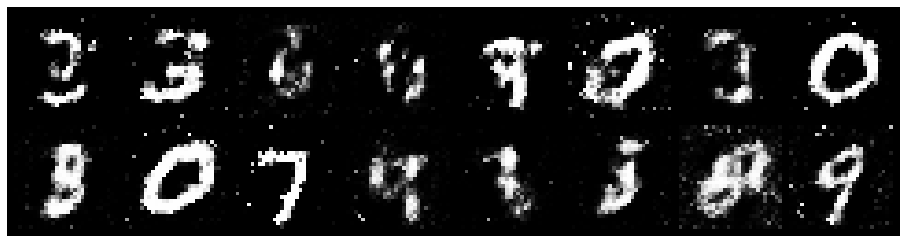

Epoch: [25/100], Batch Num: [500/600]
Discriminator Loss: 1.2172, Generator Loss: 1.2194
D(x): 0.5871, D(G(z)): 0.3417


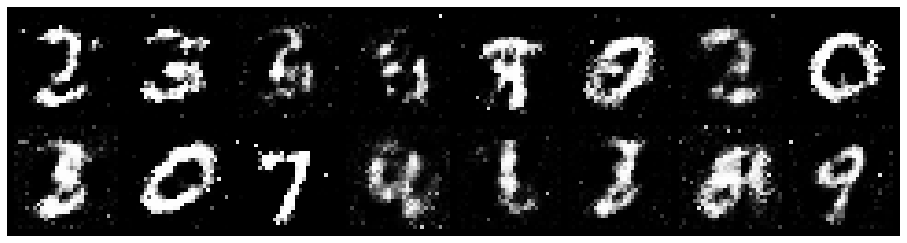

Epoch: [26/100], Batch Num: [0/600]
Discriminator Loss: 1.0224, Generator Loss: 1.4374
D(x): 0.6692, D(G(z)): 0.3345


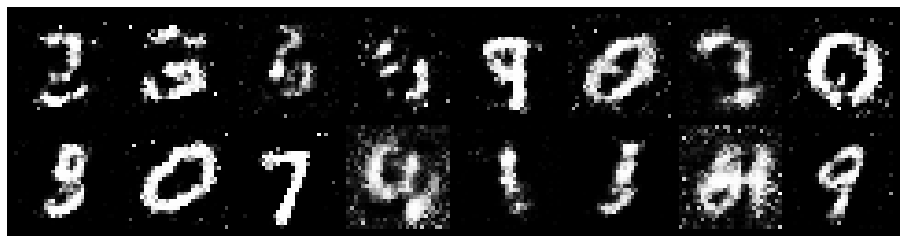

Epoch: [26/100], Batch Num: [100/600]
Discriminator Loss: 0.9721, Generator Loss: 1.5094
D(x): 0.6640, D(G(z)): 0.3074


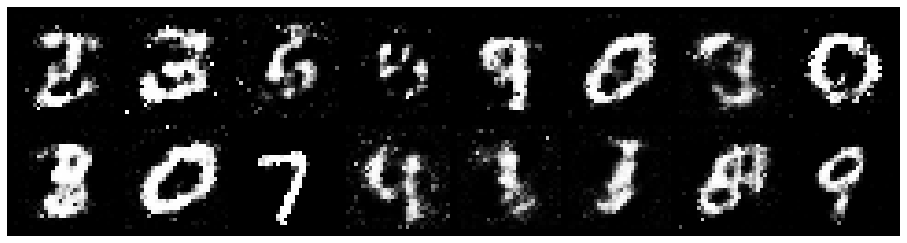

Epoch: [26/100], Batch Num: [200/600]
Discriminator Loss: 0.9890, Generator Loss: 1.5797
D(x): 0.5992, D(G(z)): 0.2407


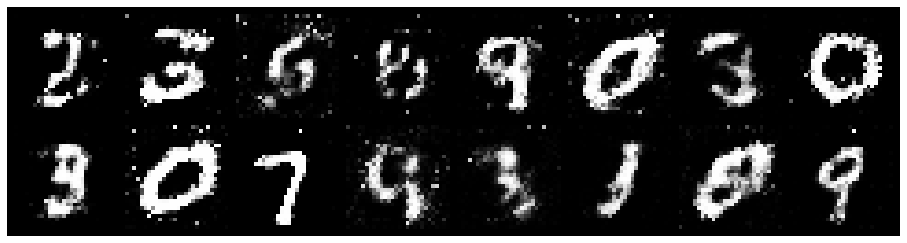

Epoch: [26/100], Batch Num: [300/600]
Discriminator Loss: 0.9312, Generator Loss: 1.3788
D(x): 0.6918, D(G(z)): 0.3290


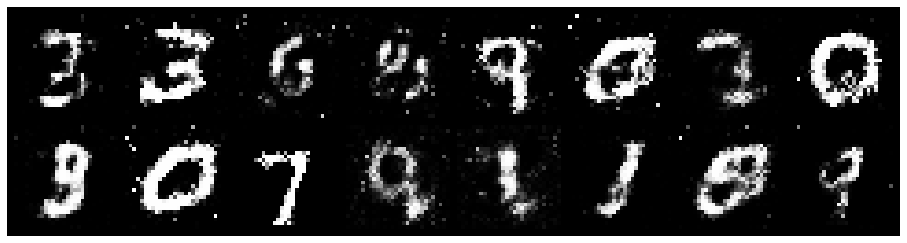

Epoch: [26/100], Batch Num: [400/600]
Discriminator Loss: 0.8519, Generator Loss: 1.4824
D(x): 0.7232, D(G(z)): 0.2902


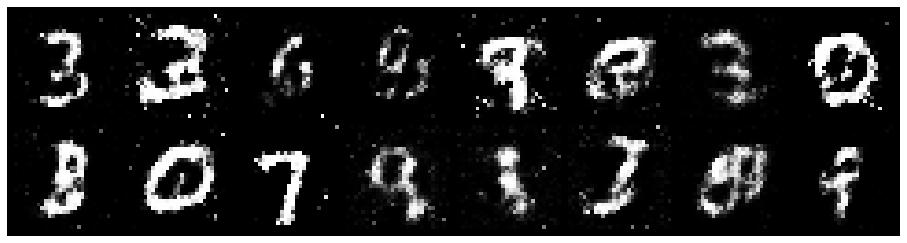

Epoch: [26/100], Batch Num: [500/600]
Discriminator Loss: 0.9157, Generator Loss: 1.5096
D(x): 0.7402, D(G(z)): 0.3667


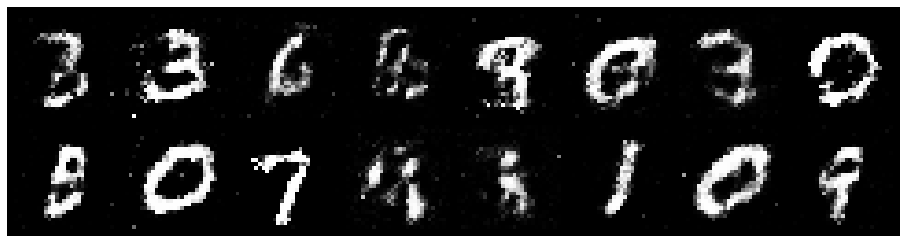

Epoch: [27/100], Batch Num: [0/600]
Discriminator Loss: 0.9382, Generator Loss: 1.4992
D(x): 0.7032, D(G(z)): 0.3303


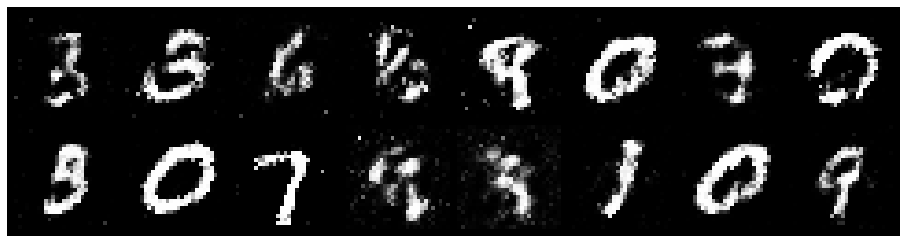

Epoch: [27/100], Batch Num: [100/600]
Discriminator Loss: 1.1619, Generator Loss: 1.3920
D(x): 0.6972, D(G(z)): 0.4455


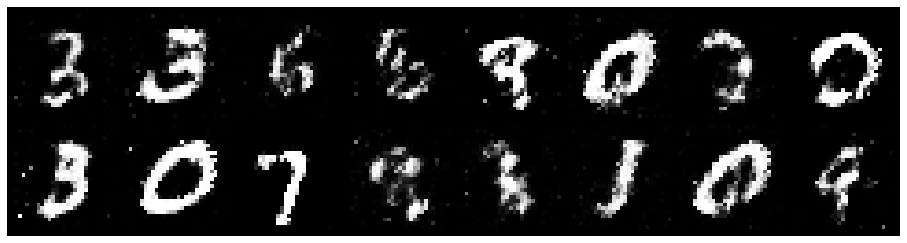

Epoch: [27/100], Batch Num: [200/600]
Discriminator Loss: 0.9533, Generator Loss: 1.3912
D(x): 0.6598, D(G(z)): 0.3150


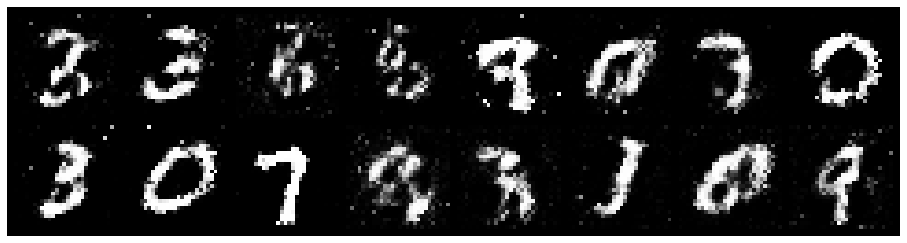

Epoch: [27/100], Batch Num: [300/600]
Discriminator Loss: 0.8485, Generator Loss: 1.1850
D(x): 0.6953, D(G(z)): 0.3147


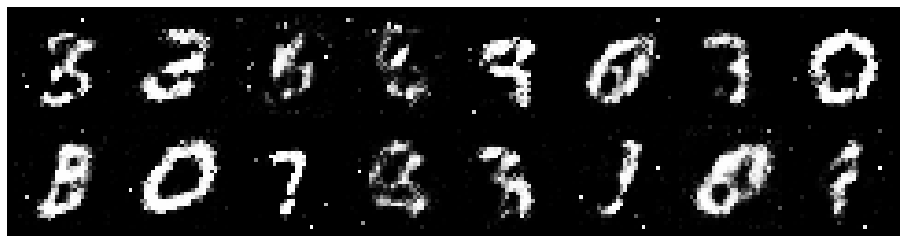

Epoch: [27/100], Batch Num: [400/600]
Discriminator Loss: 0.9873, Generator Loss: 1.2974
D(x): 0.6889, D(G(z)): 0.3578


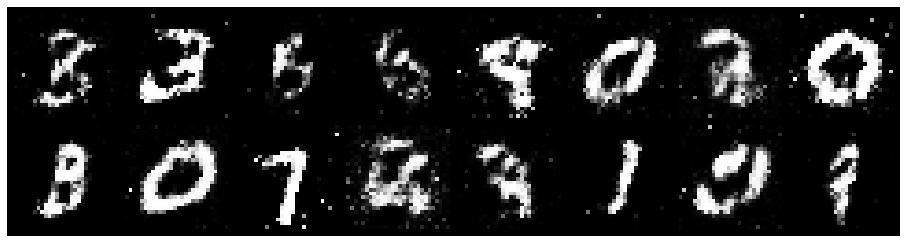

Epoch: [27/100], Batch Num: [500/600]
Discriminator Loss: 1.0103, Generator Loss: 1.1980
D(x): 0.6955, D(G(z)): 0.4022


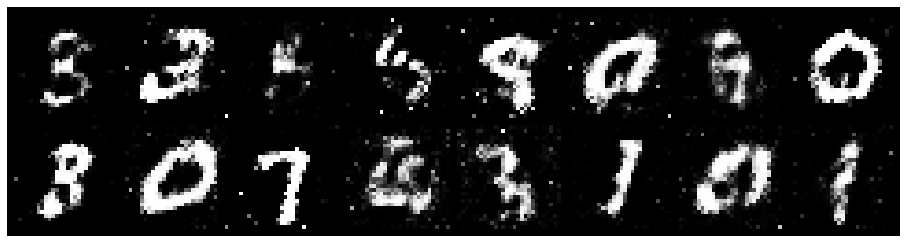

Epoch: [28/100], Batch Num: [0/600]
Discriminator Loss: 1.0017, Generator Loss: 1.3916
D(x): 0.7079, D(G(z)): 0.4006


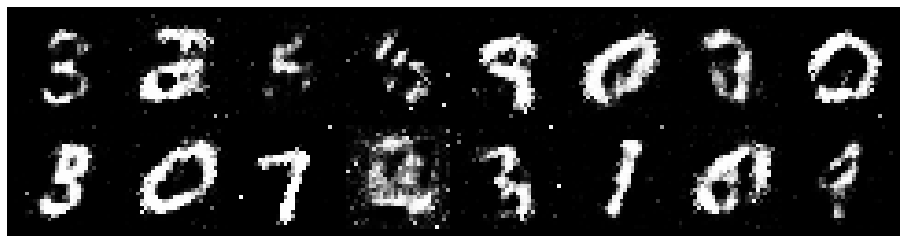

Epoch: [28/100], Batch Num: [100/600]
Discriminator Loss: 0.8850, Generator Loss: 1.3153
D(x): 0.6692, D(G(z)): 0.3079


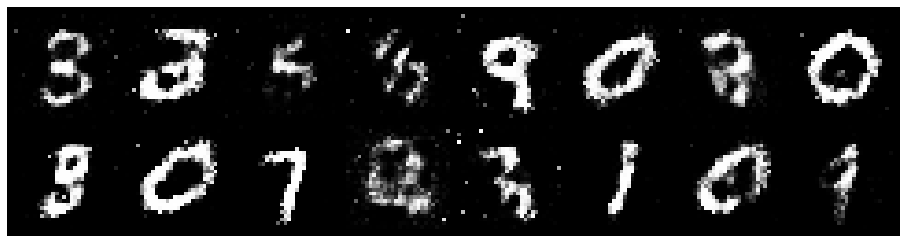

Epoch: [28/100], Batch Num: [200/600]
Discriminator Loss: 0.8211, Generator Loss: 1.8111
D(x): 0.6969, D(G(z)): 0.2204


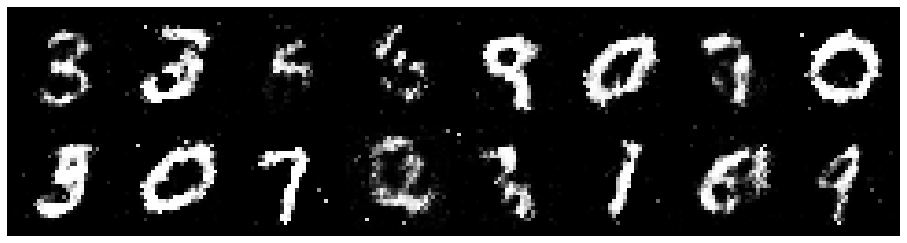

Epoch: [28/100], Batch Num: [300/600]
Discriminator Loss: 0.8746, Generator Loss: 1.2643
D(x): 0.7501, D(G(z)): 0.3412


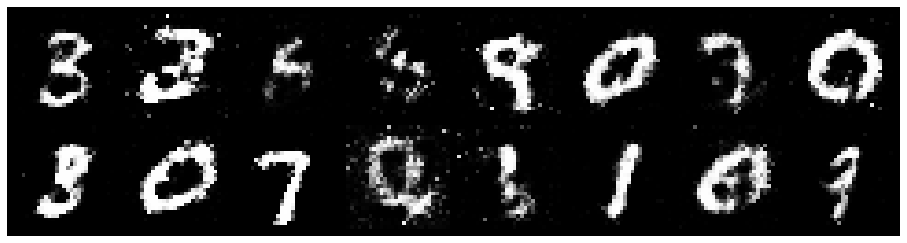

Epoch: [28/100], Batch Num: [400/600]
Discriminator Loss: 0.9494, Generator Loss: 1.6377
D(x): 0.7154, D(G(z)): 0.3205


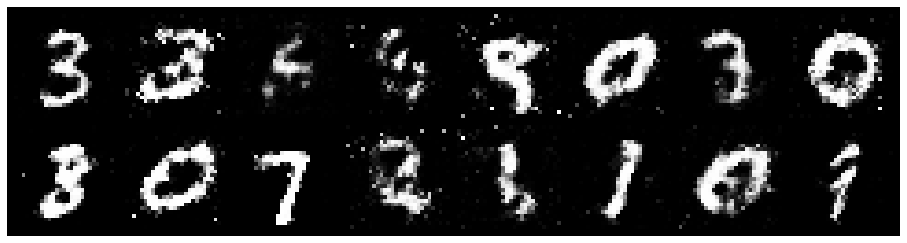

Epoch: [28/100], Batch Num: [500/600]
Discriminator Loss: 1.0518, Generator Loss: 1.5263
D(x): 0.6590, D(G(z)): 0.2991


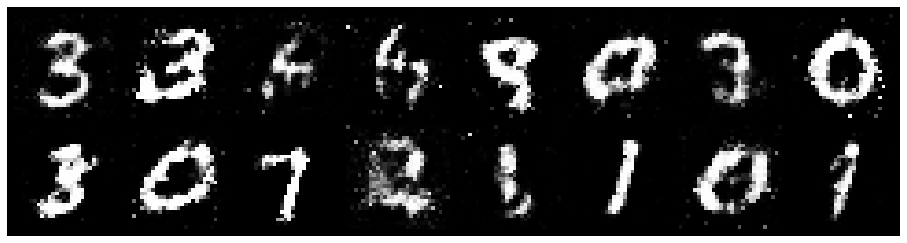

Epoch: [29/100], Batch Num: [0/600]
Discriminator Loss: 0.8371, Generator Loss: 1.3784
D(x): 0.6952, D(G(z)): 0.2730


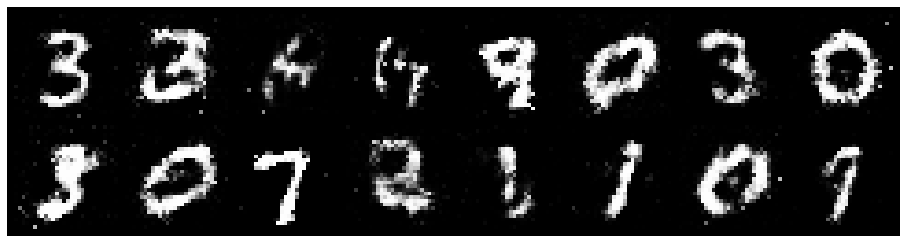

Epoch: [29/100], Batch Num: [100/600]
Discriminator Loss: 1.1978, Generator Loss: 1.1778
D(x): 0.6111, D(G(z)): 0.4088


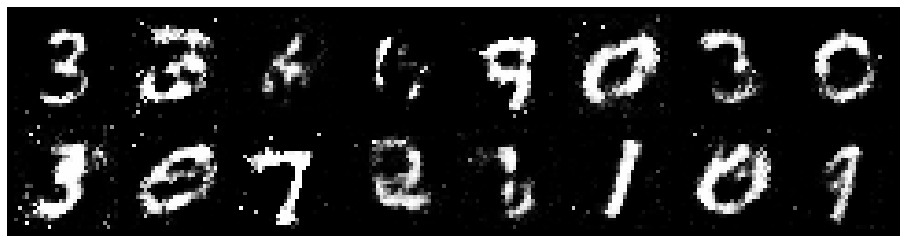

Epoch: [29/100], Batch Num: [200/600]
Discriminator Loss: 1.1893, Generator Loss: 1.3356
D(x): 0.5737, D(G(z)): 0.3538


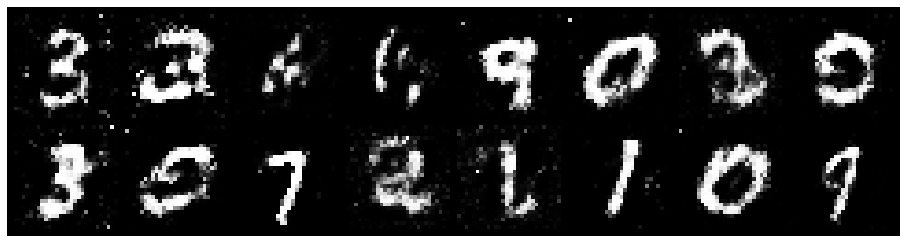

Epoch: [29/100], Batch Num: [300/600]
Discriminator Loss: 1.0834, Generator Loss: 1.2074
D(x): 0.6748, D(G(z)): 0.4055


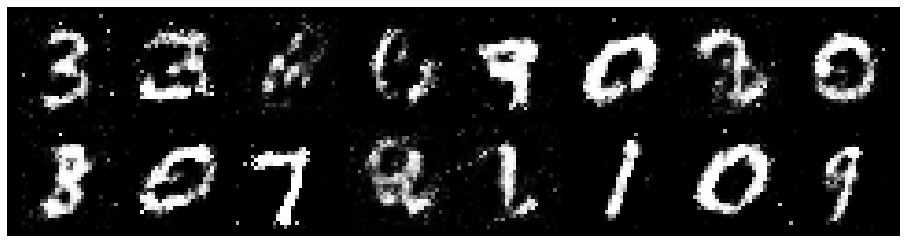

Epoch: [29/100], Batch Num: [400/600]
Discriminator Loss: 1.1256, Generator Loss: 1.1673
D(x): 0.6544, D(G(z)): 0.4005


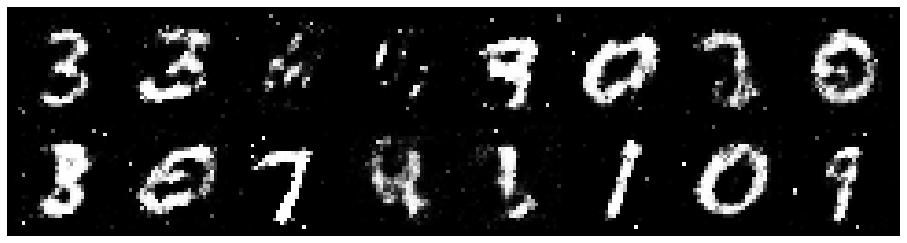

Epoch: [29/100], Batch Num: [500/600]
Discriminator Loss: 0.9540, Generator Loss: 1.1743
D(x): 0.6916, D(G(z)): 0.3725


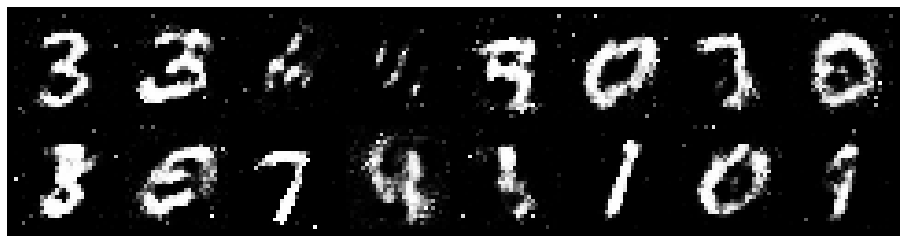

Epoch: [30/100], Batch Num: [0/600]
Discriminator Loss: 0.9823, Generator Loss: 1.2376
D(x): 0.6317, D(G(z)): 0.3159


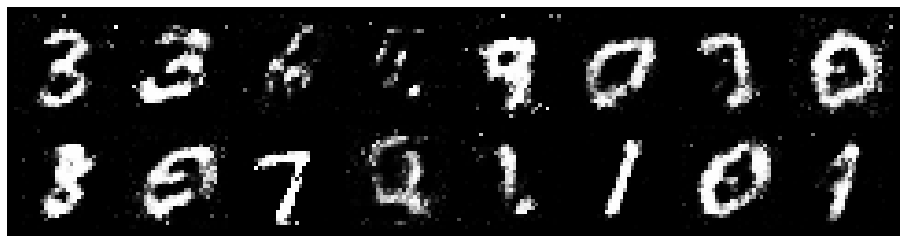

Epoch: [30/100], Batch Num: [100/600]
Discriminator Loss: 1.0195, Generator Loss: 1.5095
D(x): 0.6529, D(G(z)): 0.3422


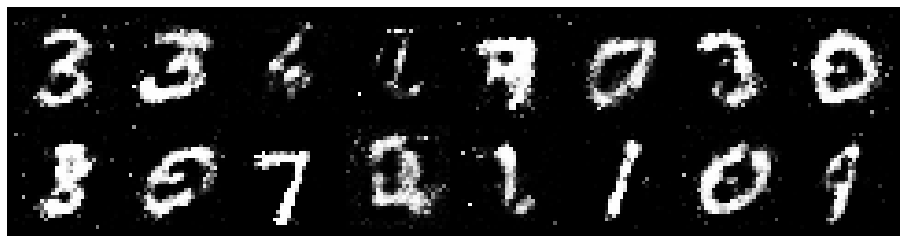

Epoch: [30/100], Batch Num: [200/600]
Discriminator Loss: 1.0517, Generator Loss: 1.1725
D(x): 0.6153, D(G(z)): 0.3382


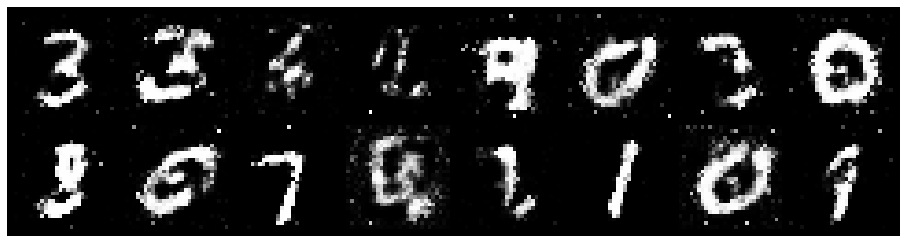

Epoch: [30/100], Batch Num: [300/600]
Discriminator Loss: 0.9443, Generator Loss: 1.7495
D(x): 0.6654, D(G(z)): 0.2998


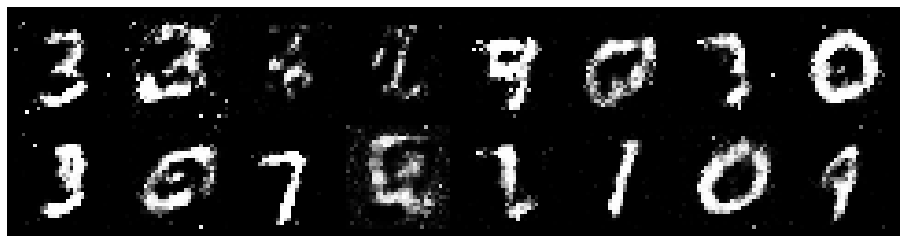

Epoch: [30/100], Batch Num: [400/600]
Discriminator Loss: 0.8845, Generator Loss: 1.1471
D(x): 0.7086, D(G(z)): 0.3371


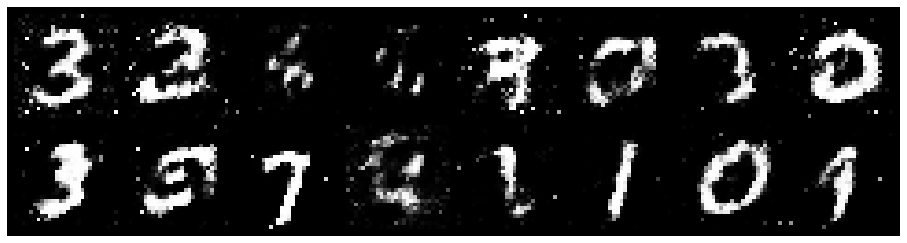

Epoch: [30/100], Batch Num: [500/600]
Discriminator Loss: 1.0247, Generator Loss: 1.2300
D(x): 0.6832, D(G(z)): 0.3850


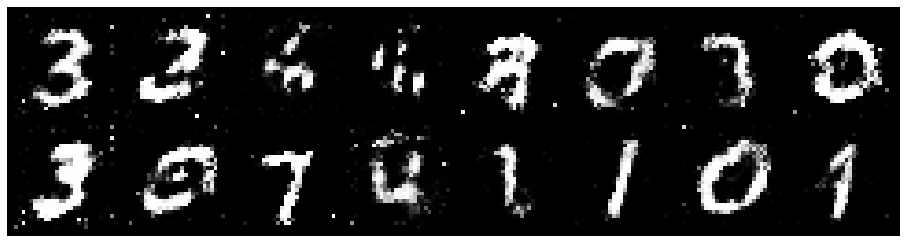

Epoch: [31/100], Batch Num: [0/600]
Discriminator Loss: 1.2596, Generator Loss: 1.3839
D(x): 0.5399, D(G(z)): 0.3249


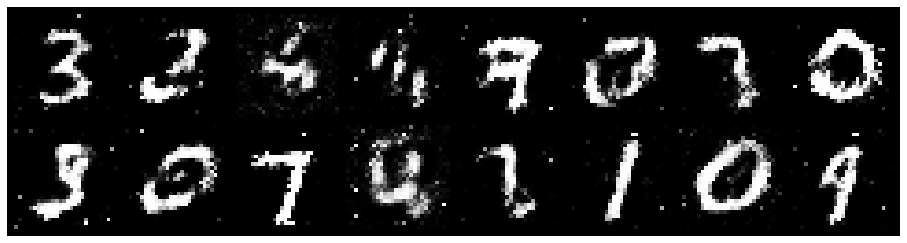

Epoch: [31/100], Batch Num: [100/600]
Discriminator Loss: 0.8874, Generator Loss: 1.3902
D(x): 0.7191, D(G(z)): 0.3407


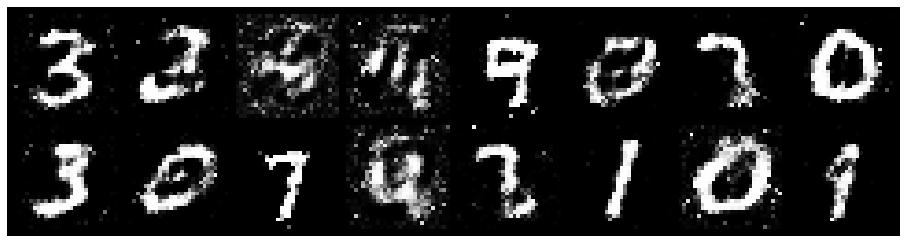

Epoch: [31/100], Batch Num: [200/600]
Discriminator Loss: 0.9681, Generator Loss: 1.2588
D(x): 0.7083, D(G(z)): 0.3436


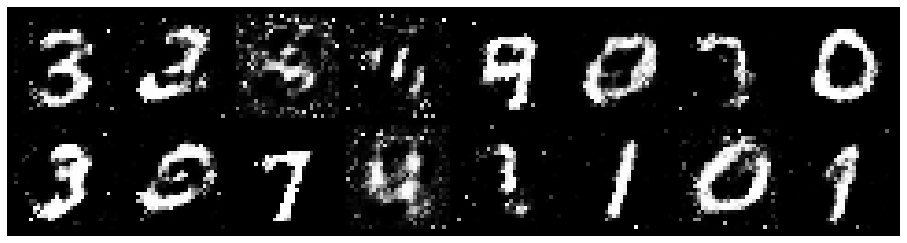

Epoch: [31/100], Batch Num: [300/600]
Discriminator Loss: 1.0902, Generator Loss: 1.4385
D(x): 0.5854, D(G(z)): 0.3343


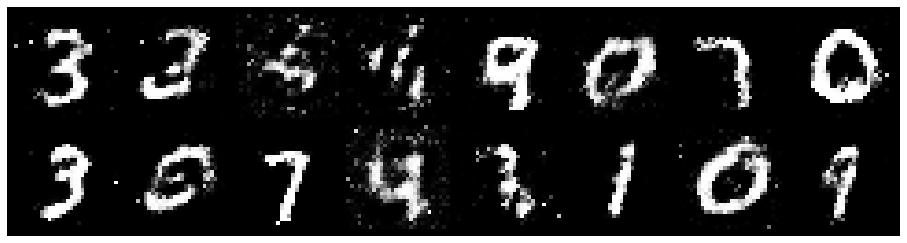

Epoch: [31/100], Batch Num: [400/600]
Discriminator Loss: 0.9152, Generator Loss: 1.4506
D(x): 0.6981, D(G(z)): 0.3097


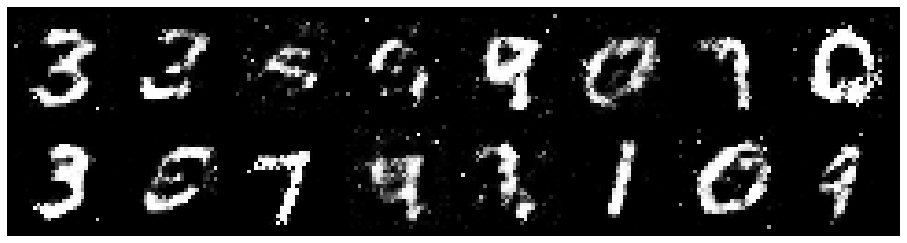

Epoch: [31/100], Batch Num: [500/600]
Discriminator Loss: 1.0989, Generator Loss: 1.3592
D(x): 0.5648, D(G(z)): 0.2924


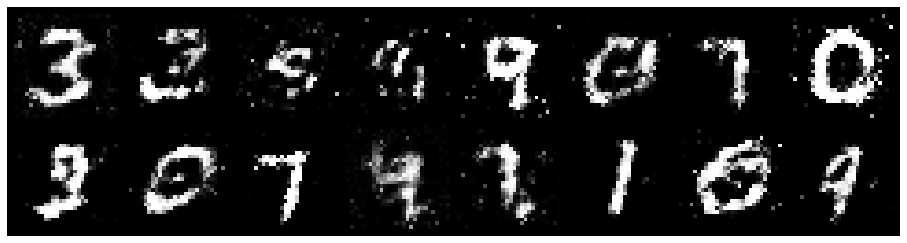

Epoch: [32/100], Batch Num: [0/600]
Discriminator Loss: 0.8992, Generator Loss: 1.4575
D(x): 0.6986, D(G(z)): 0.3448


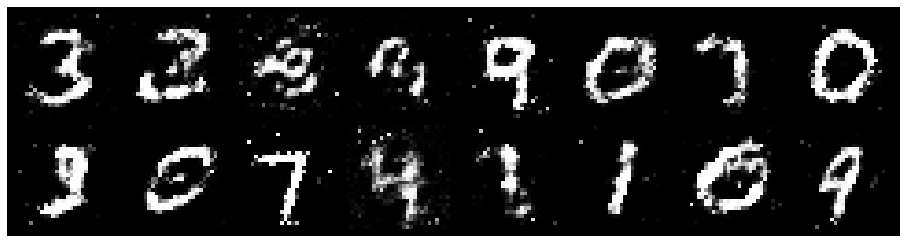

Epoch: [32/100], Batch Num: [100/600]
Discriminator Loss: 1.0576, Generator Loss: 1.2431
D(x): 0.6564, D(G(z)): 0.3445


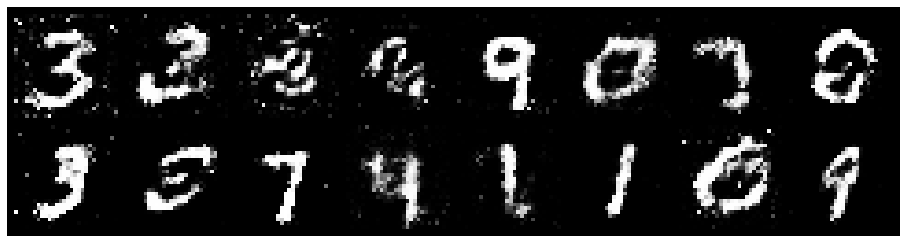

Epoch: [32/100], Batch Num: [200/600]
Discriminator Loss: 0.9513, Generator Loss: 1.3042
D(x): 0.6961, D(G(z)): 0.3515


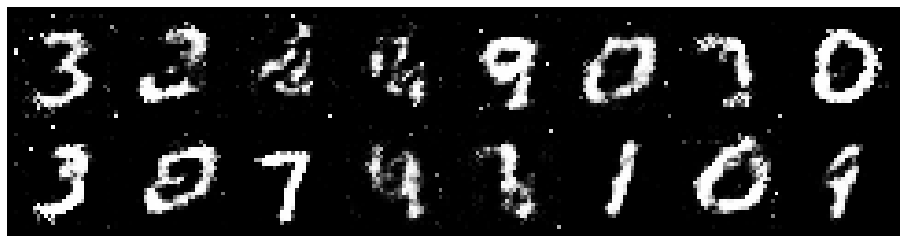

Epoch: [32/100], Batch Num: [300/600]
Discriminator Loss: 1.0879, Generator Loss: 1.8801
D(x): 0.7255, D(G(z)): 0.3782


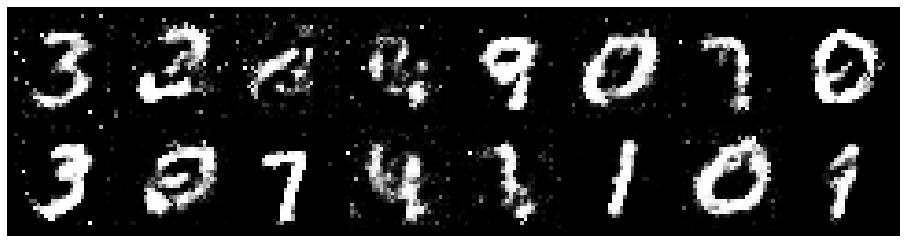

Epoch: [32/100], Batch Num: [400/600]
Discriminator Loss: 1.0381, Generator Loss: 1.2130
D(x): 0.6665, D(G(z)): 0.3436


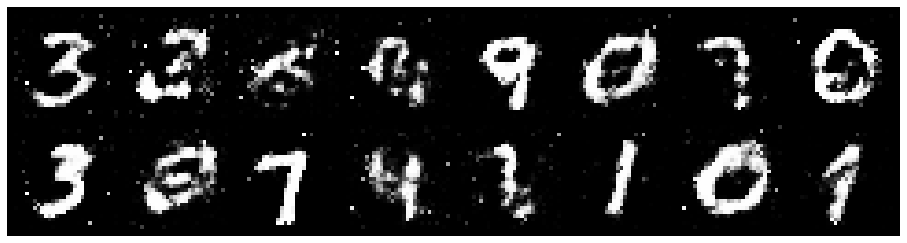

Epoch: [32/100], Batch Num: [500/600]
Discriminator Loss: 0.9610, Generator Loss: 1.5606
D(x): 0.7081, D(G(z)): 0.3334


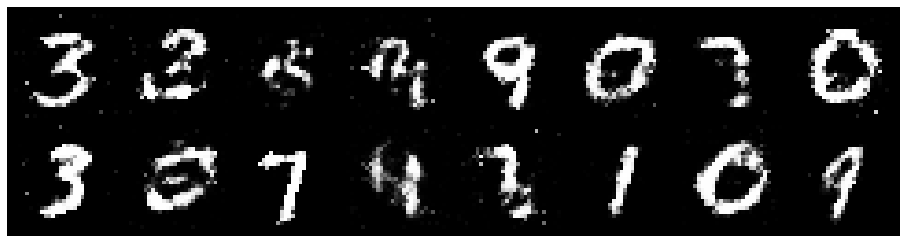

Epoch: [33/100], Batch Num: [0/600]
Discriminator Loss: 1.0394, Generator Loss: 1.2911
D(x): 0.6813, D(G(z)): 0.3628


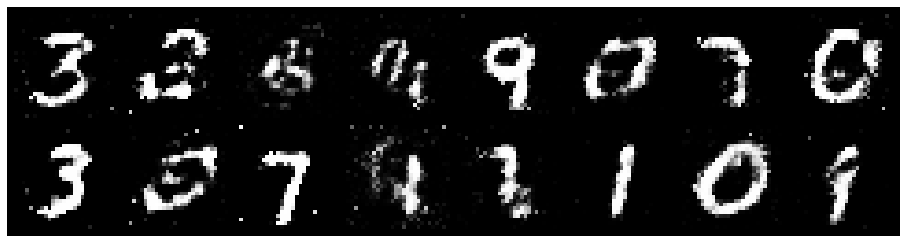

Epoch: [33/100], Batch Num: [100/600]
Discriminator Loss: 1.0522, Generator Loss: 1.2219
D(x): 0.6430, D(G(z)): 0.3570


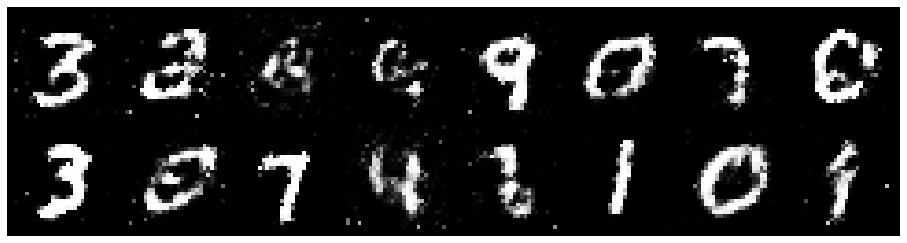

Epoch: [33/100], Batch Num: [200/600]
Discriminator Loss: 1.0484, Generator Loss: 1.2381
D(x): 0.6129, D(G(z)): 0.3148


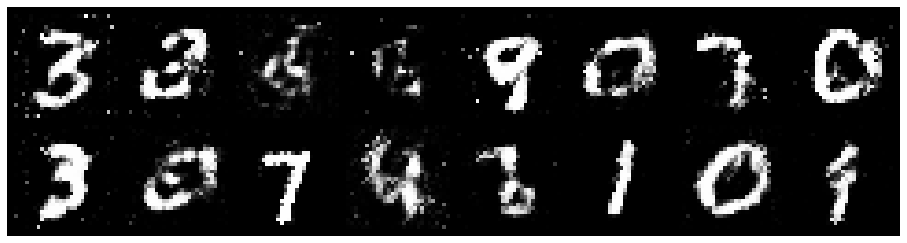

Epoch: [33/100], Batch Num: [300/600]
Discriminator Loss: 1.1294, Generator Loss: 1.1969
D(x): 0.6896, D(G(z)): 0.3785


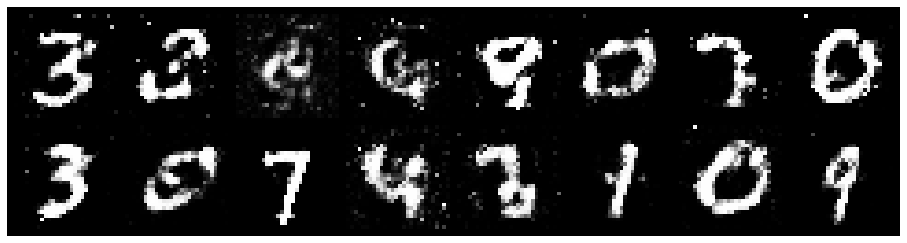

Epoch: [33/100], Batch Num: [400/600]
Discriminator Loss: 0.9580, Generator Loss: 1.4639
D(x): 0.6472, D(G(z)): 0.2907


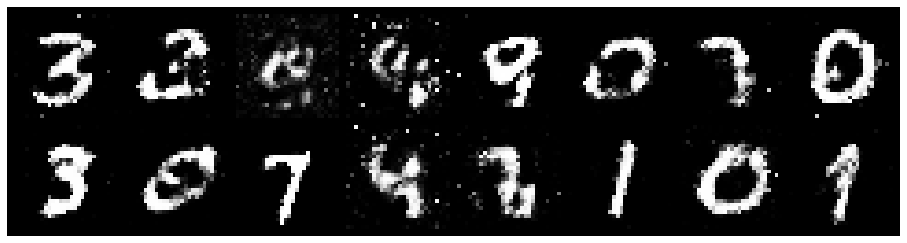

Epoch: [33/100], Batch Num: [500/600]
Discriminator Loss: 1.0205, Generator Loss: 1.4216
D(x): 0.5820, D(G(z)): 0.2533


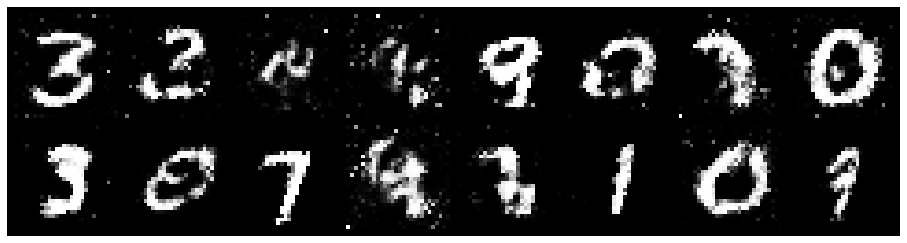

Epoch: [34/100], Batch Num: [0/600]
Discriminator Loss: 0.8602, Generator Loss: 1.3433
D(x): 0.6722, D(G(z)): 0.3013


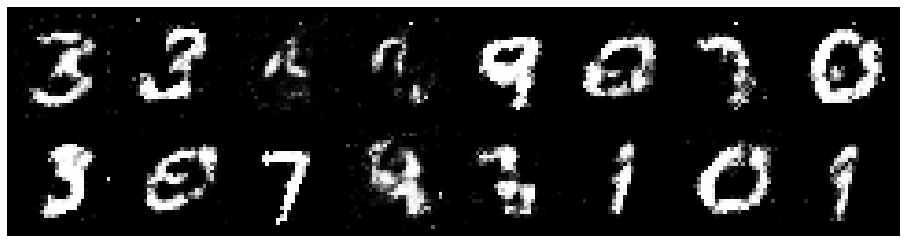

Epoch: [34/100], Batch Num: [100/600]
Discriminator Loss: 0.9536, Generator Loss: 1.2782
D(x): 0.7031, D(G(z)): 0.3669


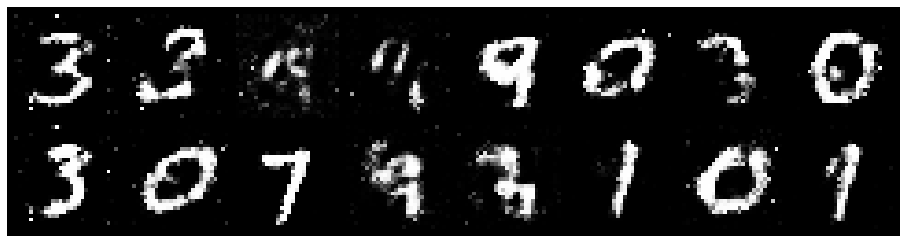

Epoch: [34/100], Batch Num: [200/600]
Discriminator Loss: 1.0231, Generator Loss: 1.1887
D(x): 0.6630, D(G(z)): 0.3705


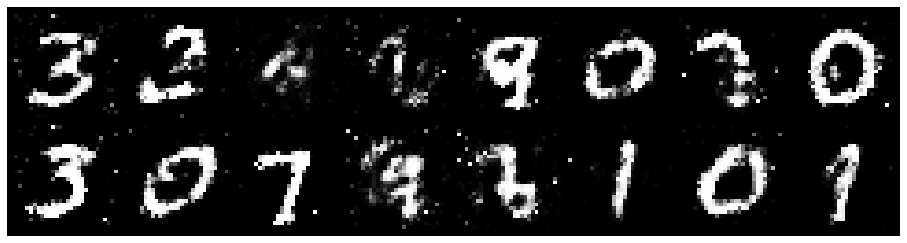

Epoch: [34/100], Batch Num: [300/600]
Discriminator Loss: 1.0836, Generator Loss: 1.1188
D(x): 0.6776, D(G(z)): 0.4051


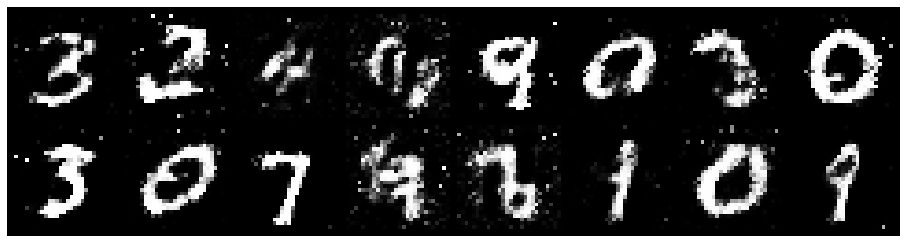

Epoch: [34/100], Batch Num: [400/600]
Discriminator Loss: 1.2382, Generator Loss: 1.3885
D(x): 0.6033, D(G(z)): 0.3854


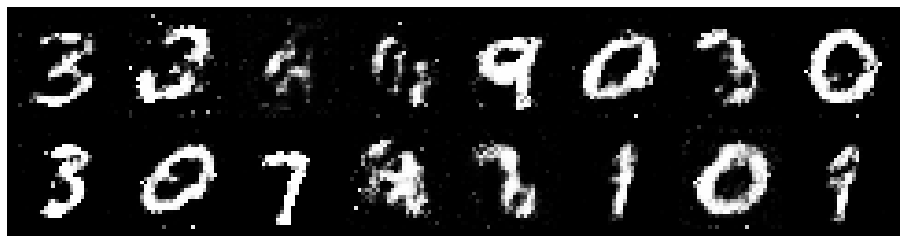

Epoch: [34/100], Batch Num: [500/600]
Discriminator Loss: 0.9502, Generator Loss: 1.3064
D(x): 0.6498, D(G(z)): 0.3250


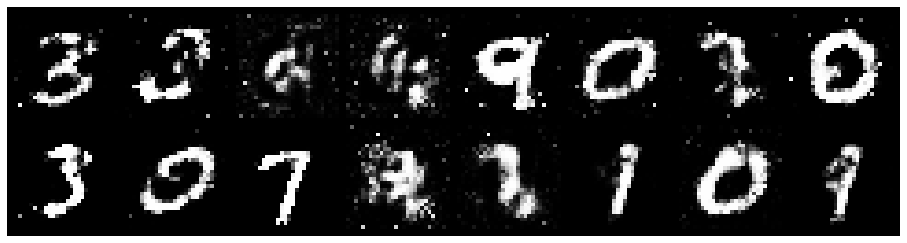

Epoch: [35/100], Batch Num: [0/600]
Discriminator Loss: 1.0405, Generator Loss: 1.3936
D(x): 0.6150, D(G(z)): 0.3426


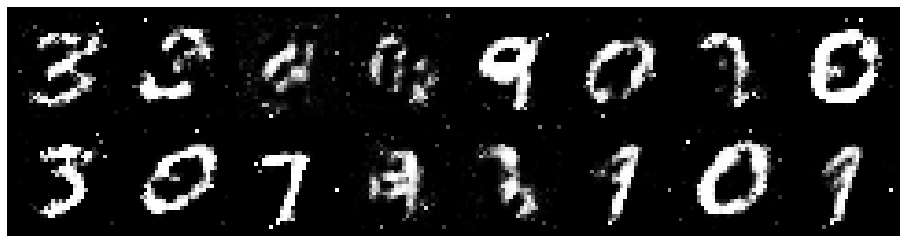

Epoch: [35/100], Batch Num: [100/600]
Discriminator Loss: 1.0981, Generator Loss: 1.3256
D(x): 0.6552, D(G(z)): 0.3804


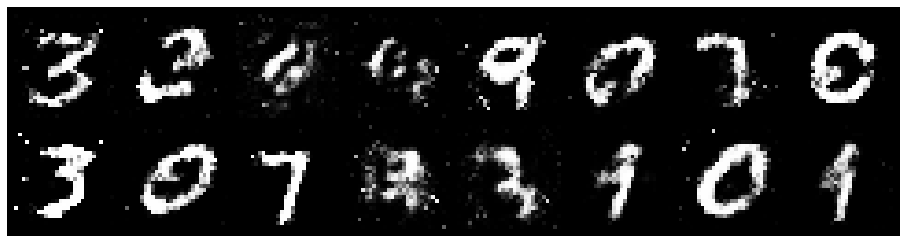

Epoch: [35/100], Batch Num: [200/600]
Discriminator Loss: 0.9615, Generator Loss: 1.2352
D(x): 0.6602, D(G(z)): 0.3363


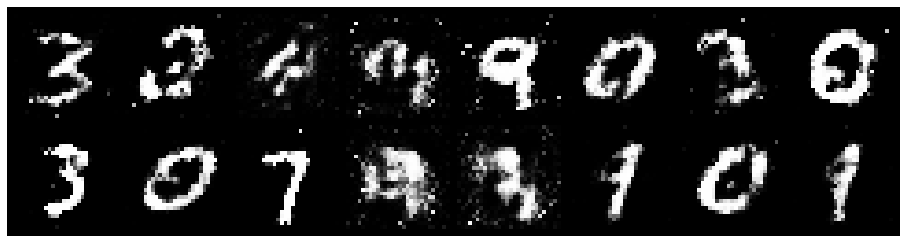

Epoch: [35/100], Batch Num: [300/600]
Discriminator Loss: 1.0839, Generator Loss: 1.8499
D(x): 0.6243, D(G(z)): 0.3241


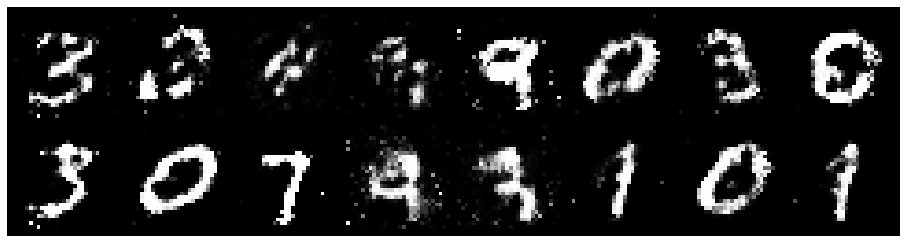

Epoch: [35/100], Batch Num: [400/600]
Discriminator Loss: 1.1120, Generator Loss: 1.0620
D(x): 0.6106, D(G(z)): 0.3279


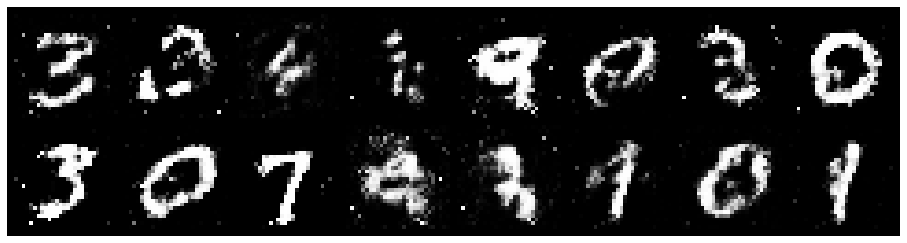

Epoch: [35/100], Batch Num: [500/600]
Discriminator Loss: 1.0867, Generator Loss: 1.0549
D(x): 0.6380, D(G(z)): 0.3777


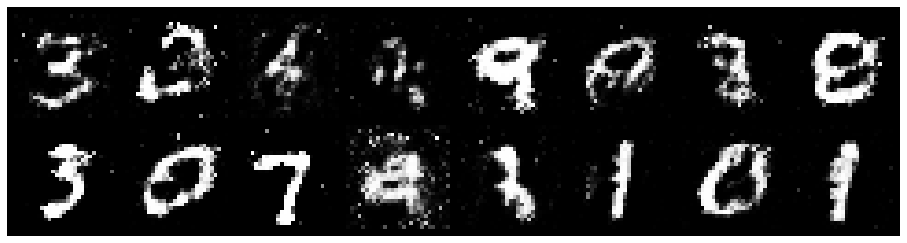

Epoch: [36/100], Batch Num: [0/600]
Discriminator Loss: 0.9862, Generator Loss: 1.4782
D(x): 0.6353, D(G(z)): 0.3212


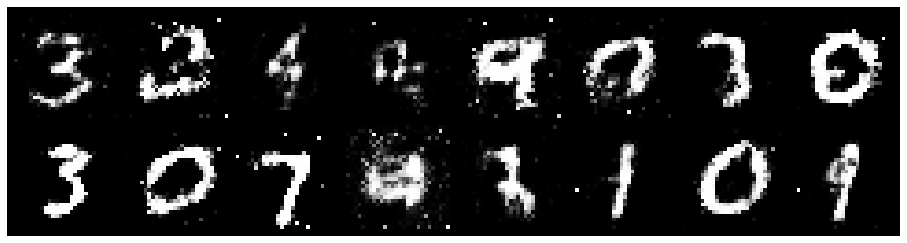

Epoch: [36/100], Batch Num: [100/600]
Discriminator Loss: 1.0408, Generator Loss: 1.2857
D(x): 0.6543, D(G(z)): 0.3534


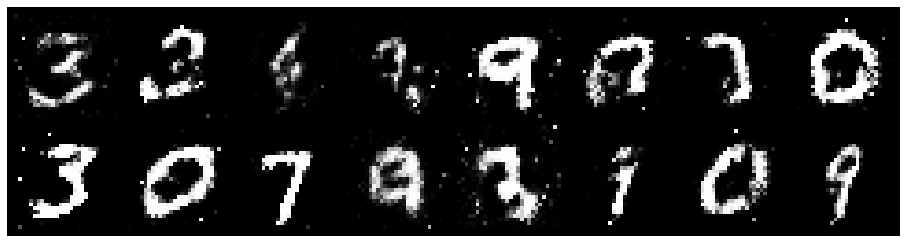

Epoch: [36/100], Batch Num: [200/600]
Discriminator Loss: 1.0107, Generator Loss: 1.2284
D(x): 0.6416, D(G(z)): 0.3513


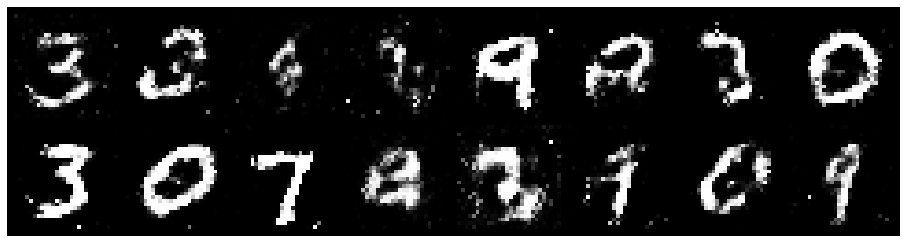

Epoch: [36/100], Batch Num: [300/600]
Discriminator Loss: 1.0680, Generator Loss: 1.2278
D(x): 0.5722, D(G(z)): 0.2853


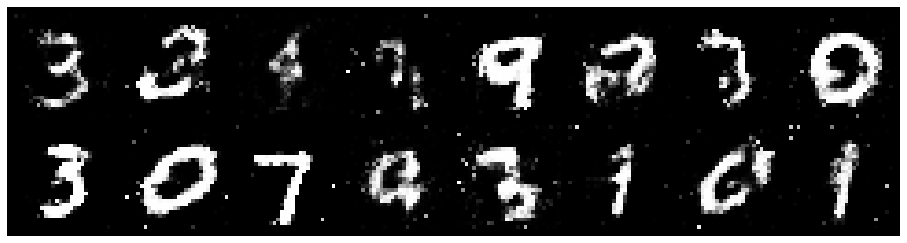

Epoch: [36/100], Batch Num: [400/600]
Discriminator Loss: 1.0512, Generator Loss: 1.2870
D(x): 0.6221, D(G(z)): 0.3457


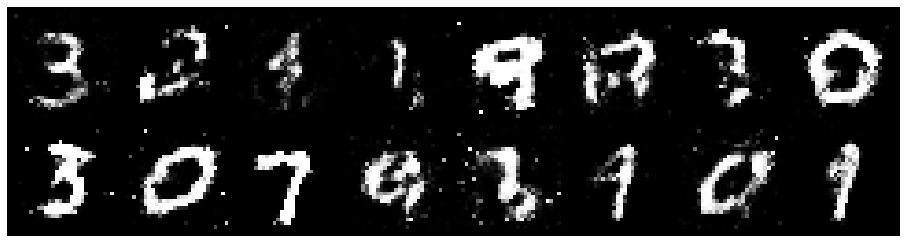

Epoch: [36/100], Batch Num: [500/600]
Discriminator Loss: 1.0050, Generator Loss: 1.0461
D(x): 0.6490, D(G(z)): 0.3463


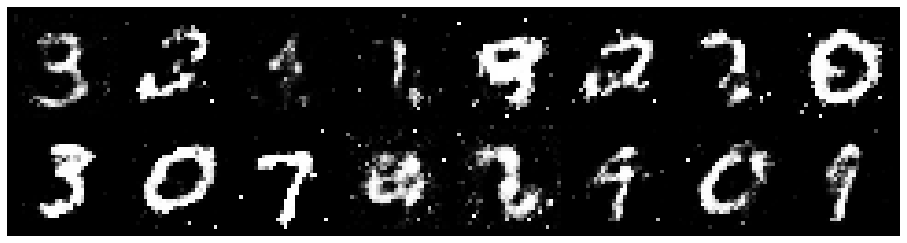

Epoch: [37/100], Batch Num: [0/600]
Discriminator Loss: 1.1080, Generator Loss: 1.3967
D(x): 0.5806, D(G(z)): 0.3256


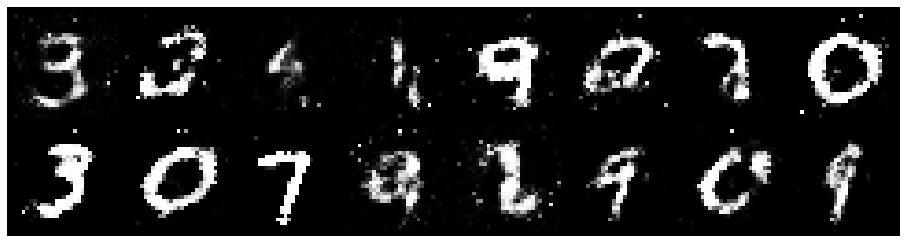

Epoch: [37/100], Batch Num: [100/600]
Discriminator Loss: 1.0511, Generator Loss: 1.3375
D(x): 0.6781, D(G(z)): 0.3866


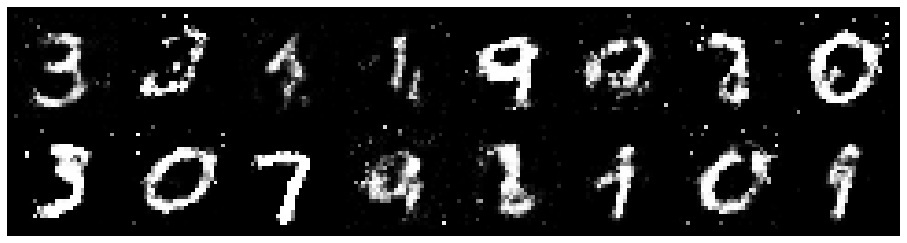

Epoch: [37/100], Batch Num: [200/600]
Discriminator Loss: 0.9544, Generator Loss: 1.6743
D(x): 0.6488, D(G(z)): 0.3120


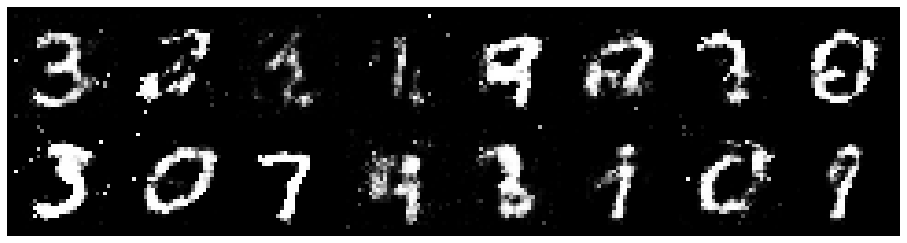

Epoch: [37/100], Batch Num: [300/600]
Discriminator Loss: 1.0798, Generator Loss: 1.3121
D(x): 0.6233, D(G(z)): 0.3500


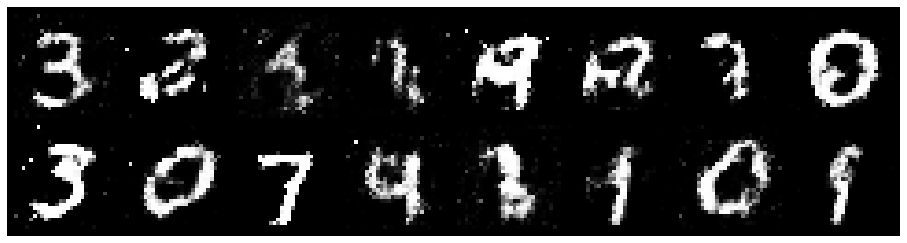

Epoch: [37/100], Batch Num: [400/600]
Discriminator Loss: 1.0060, Generator Loss: 1.2149
D(x): 0.6354, D(G(z)): 0.3506


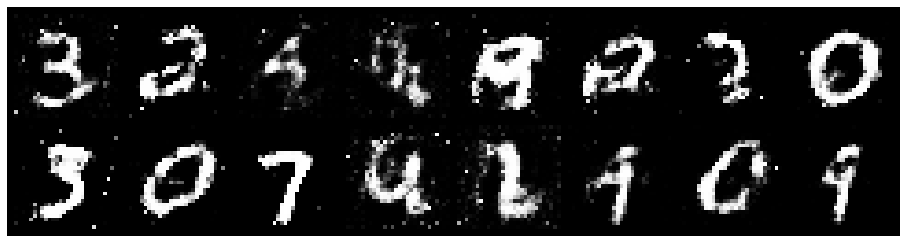

Epoch: [37/100], Batch Num: [500/600]
Discriminator Loss: 0.9296, Generator Loss: 1.4294
D(x): 0.6661, D(G(z)): 0.3067


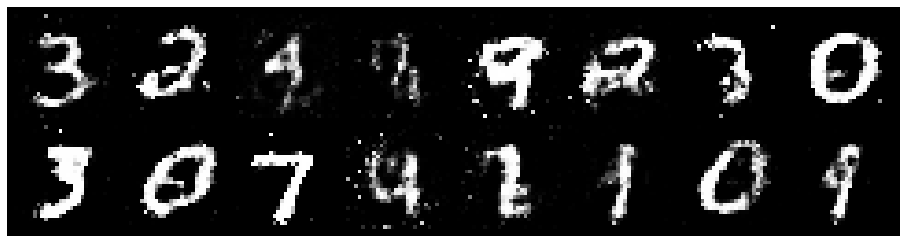

Epoch: [38/100], Batch Num: [0/600]
Discriminator Loss: 1.0962, Generator Loss: 1.3027
D(x): 0.7113, D(G(z)): 0.4168


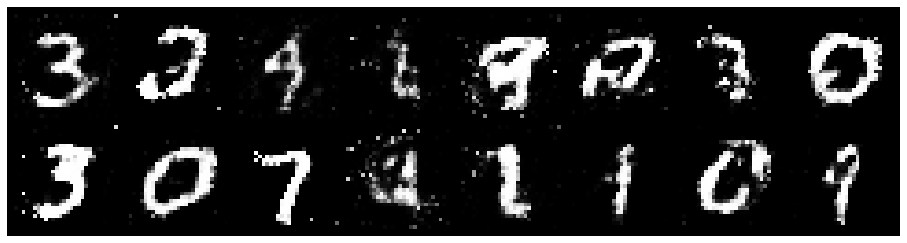

Epoch: [38/100], Batch Num: [100/600]
Discriminator Loss: 1.2832, Generator Loss: 1.2556
D(x): 0.6419, D(G(z)): 0.4228


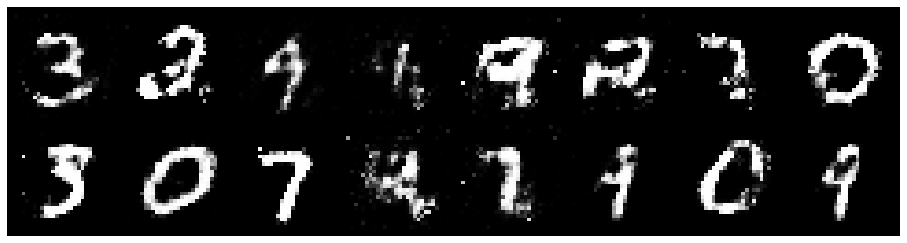

Epoch: [38/100], Batch Num: [200/600]
Discriminator Loss: 1.2075, Generator Loss: 1.3211
D(x): 0.6033, D(G(z)): 0.3498


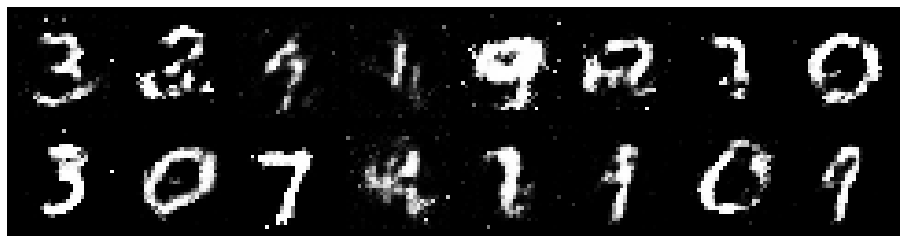

Epoch: [38/100], Batch Num: [300/600]
Discriminator Loss: 1.1143, Generator Loss: 1.0839
D(x): 0.6123, D(G(z)): 0.3555


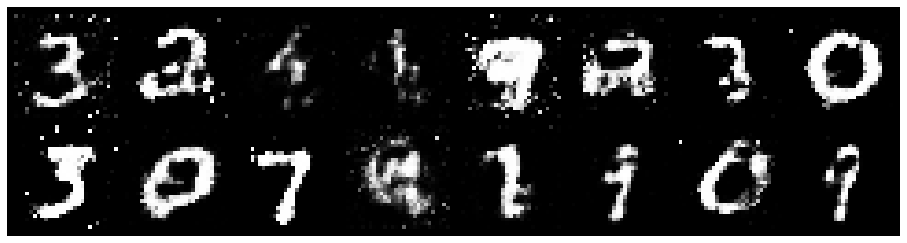

Epoch: [38/100], Batch Num: [400/600]
Discriminator Loss: 1.1182, Generator Loss: 1.6087
D(x): 0.5922, D(G(z)): 0.3361


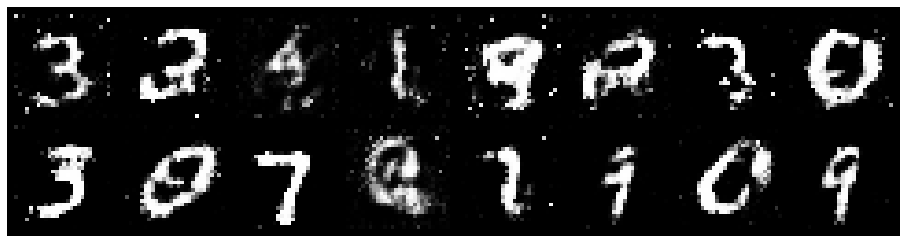

Epoch: [38/100], Batch Num: [500/600]
Discriminator Loss: 1.1673, Generator Loss: 1.1119
D(x): 0.6182, D(G(z)): 0.4105


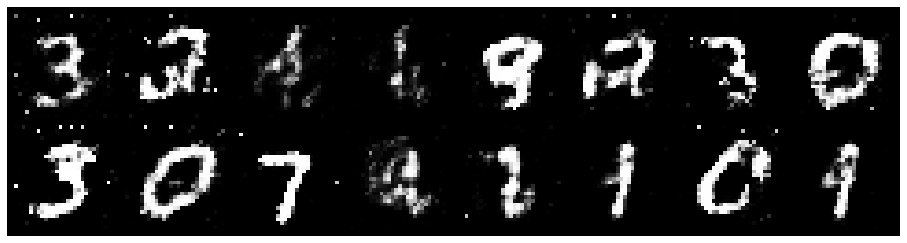

Epoch: [39/100], Batch Num: [0/600]
Discriminator Loss: 1.1814, Generator Loss: 0.9968
D(x): 0.5726, D(G(z)): 0.4015


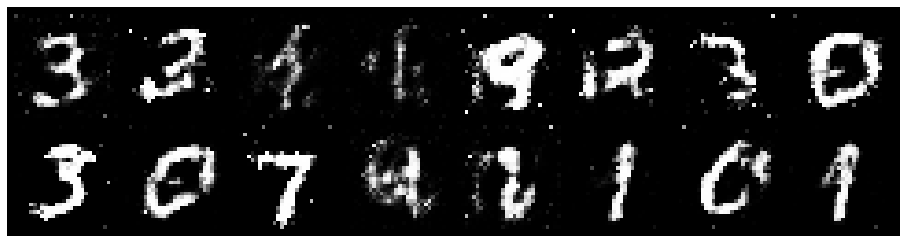

Epoch: [39/100], Batch Num: [100/600]
Discriminator Loss: 1.1047, Generator Loss: 1.0138
D(x): 0.6532, D(G(z)): 0.4094


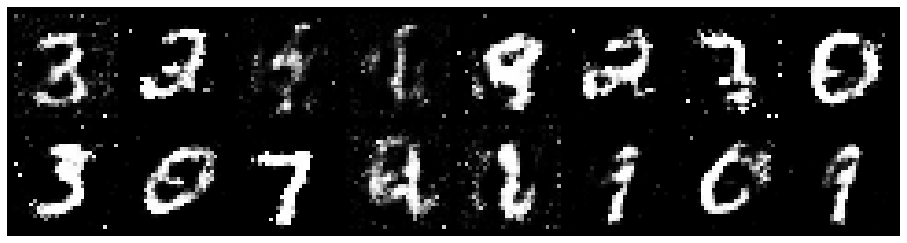

Epoch: [39/100], Batch Num: [200/600]
Discriminator Loss: 1.2198, Generator Loss: 1.2112
D(x): 0.5635, D(G(z)): 0.3746


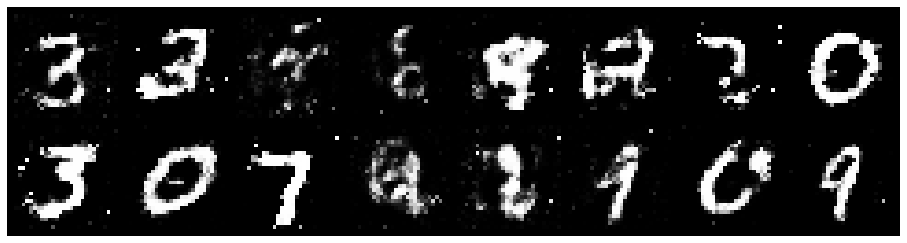

Epoch: [39/100], Batch Num: [300/600]
Discriminator Loss: 1.0662, Generator Loss: 1.7237
D(x): 0.6423, D(G(z)): 0.3281


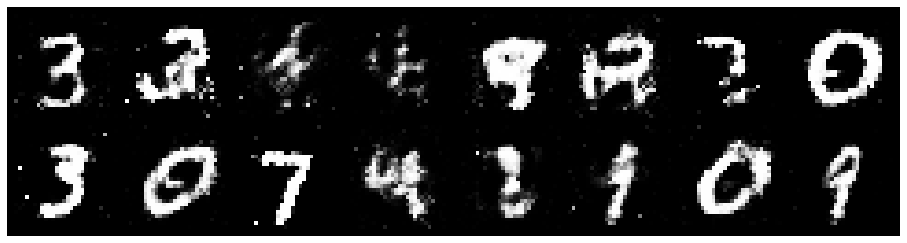

Epoch: [39/100], Batch Num: [400/600]
Discriminator Loss: 1.0851, Generator Loss: 1.1812
D(x): 0.6564, D(G(z)): 0.3617


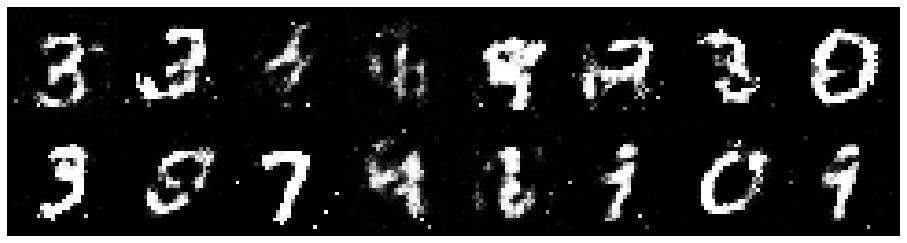

Epoch: [39/100], Batch Num: [500/600]
Discriminator Loss: 1.0959, Generator Loss: 0.9539
D(x): 0.5899, D(G(z)): 0.3716


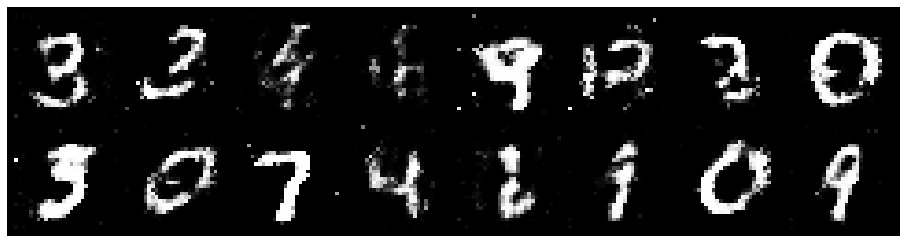

Epoch: [40/100], Batch Num: [0/600]
Discriminator Loss: 1.1966, Generator Loss: 0.9630
D(x): 0.6118, D(G(z)): 0.4349


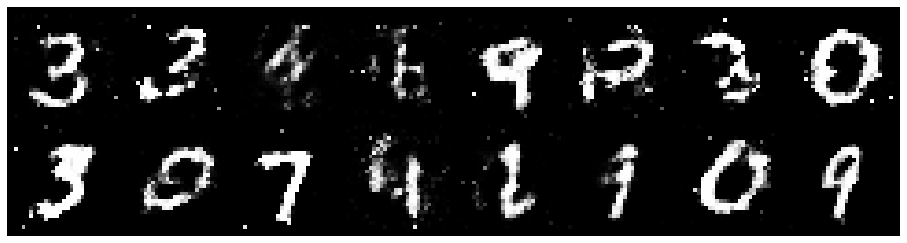

Epoch: [40/100], Batch Num: [100/600]
Discriminator Loss: 1.0045, Generator Loss: 1.2305
D(x): 0.6308, D(G(z)): 0.3281


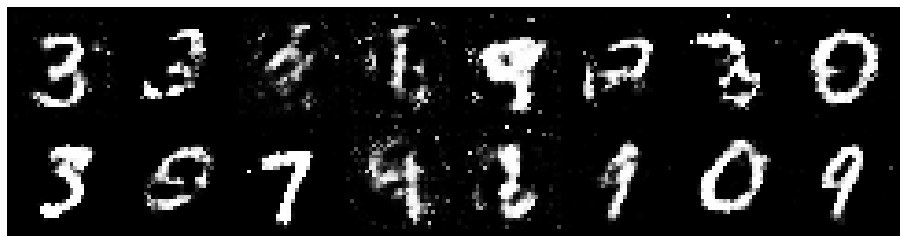

Epoch: [40/100], Batch Num: [200/600]
Discriminator Loss: 1.0891, Generator Loss: 1.4772
D(x): 0.6138, D(G(z)): 0.3603


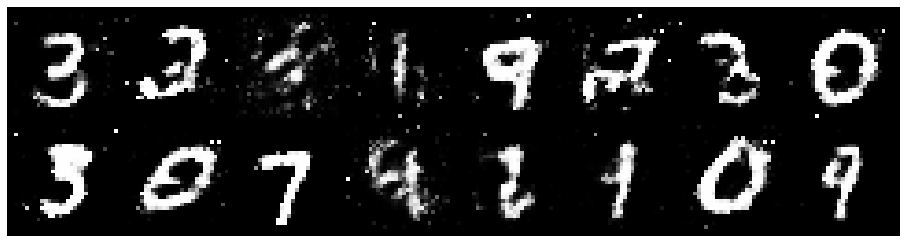

Epoch: [40/100], Batch Num: [300/600]
Discriminator Loss: 1.2850, Generator Loss: 1.2728
D(x): 0.5284, D(G(z)): 0.3565


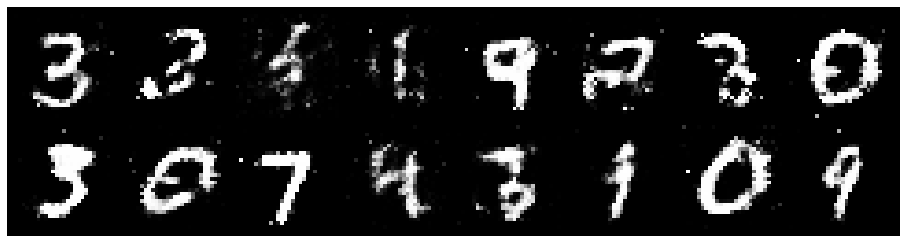

Epoch: [40/100], Batch Num: [400/600]
Discriminator Loss: 0.9411, Generator Loss: 1.3923
D(x): 0.6747, D(G(z)): 0.3357


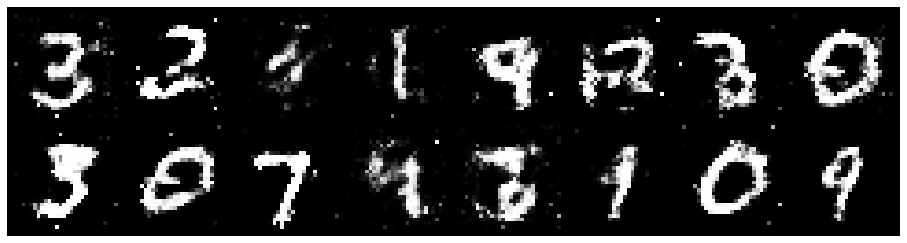

Epoch: [40/100], Batch Num: [500/600]
Discriminator Loss: 1.0467, Generator Loss: 1.4414
D(x): 0.6142, D(G(z)): 0.3216


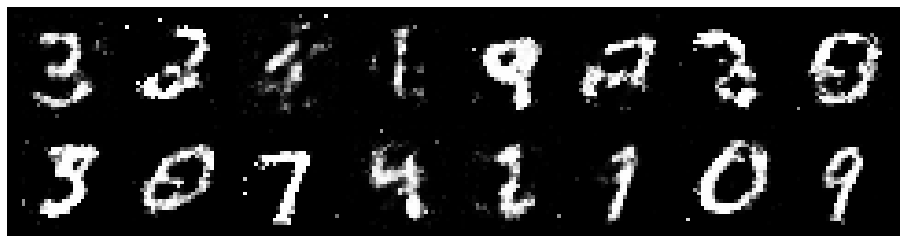

Epoch: [41/100], Batch Num: [0/600]
Discriminator Loss: 1.0701, Generator Loss: 1.1430
D(x): 0.6137, D(G(z)): 0.3458


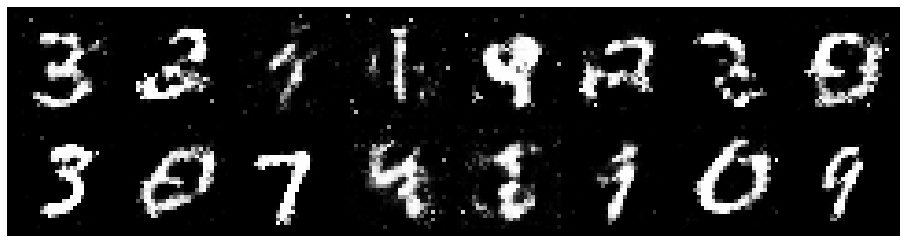

Epoch: [41/100], Batch Num: [100/600]
Discriminator Loss: 1.0958, Generator Loss: 1.1020
D(x): 0.6182, D(G(z)): 0.3776


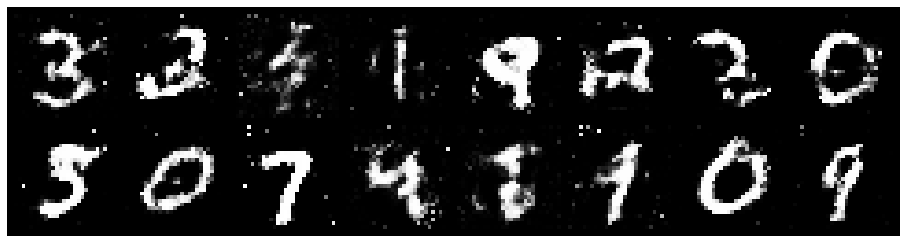

Epoch: [41/100], Batch Num: [200/600]
Discriminator Loss: 1.1324, Generator Loss: 1.2338
D(x): 0.6072, D(G(z)): 0.3864


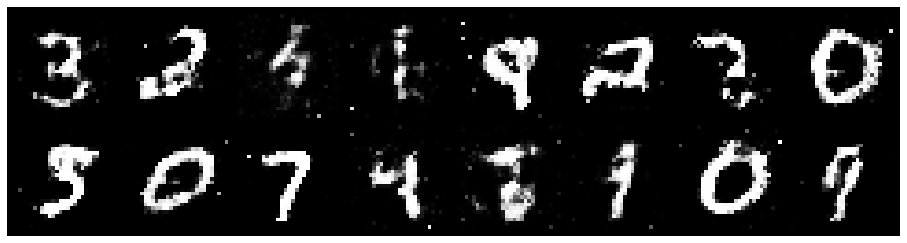

Epoch: [41/100], Batch Num: [300/600]
Discriminator Loss: 1.1676, Generator Loss: 0.9696
D(x): 0.6055, D(G(z)): 0.4151


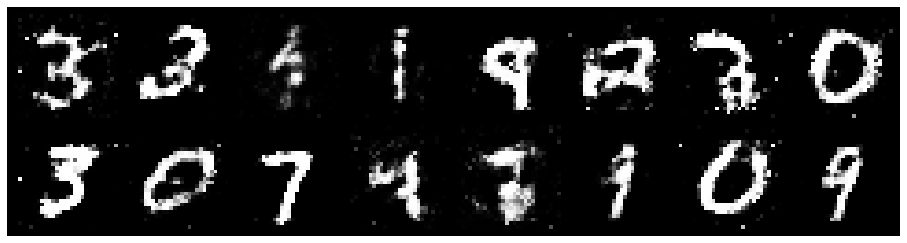

Epoch: [41/100], Batch Num: [400/600]
Discriminator Loss: 1.1812, Generator Loss: 1.1029
D(x): 0.6196, D(G(z)): 0.4171


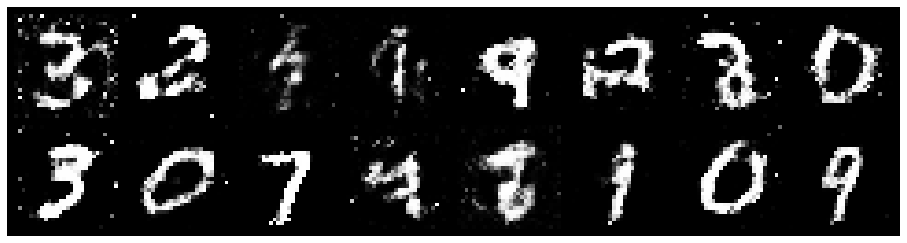

Epoch: [41/100], Batch Num: [500/600]
Discriminator Loss: 1.2829, Generator Loss: 1.0637
D(x): 0.5836, D(G(z)): 0.4555


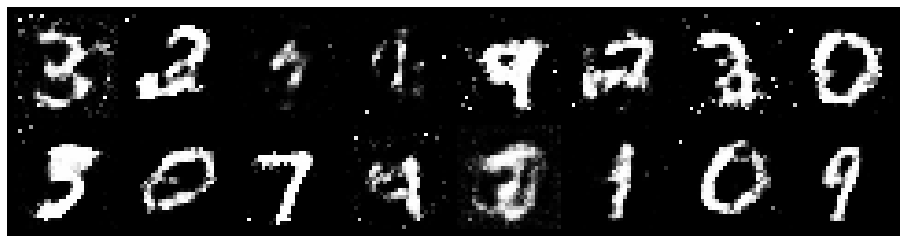

Epoch: [42/100], Batch Num: [0/600]
Discriminator Loss: 1.0619, Generator Loss: 0.8961
D(x): 0.6895, D(G(z)): 0.4302


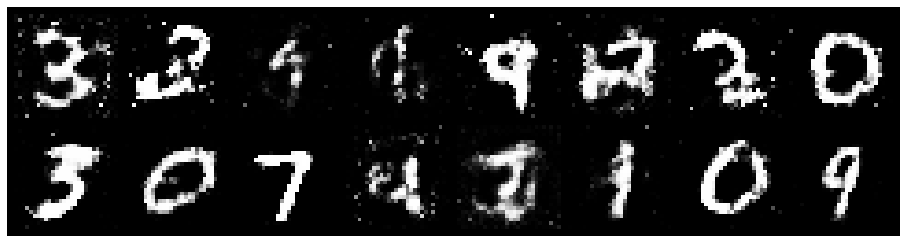

Epoch: [42/100], Batch Num: [100/600]
Discriminator Loss: 1.1779, Generator Loss: 0.9707
D(x): 0.6243, D(G(z)): 0.4317


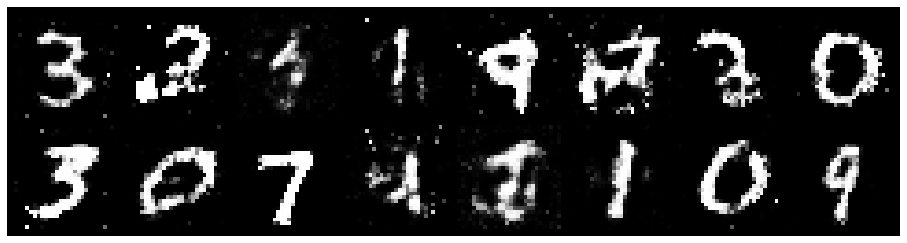

Epoch: [42/100], Batch Num: [200/600]
Discriminator Loss: 1.1717, Generator Loss: 0.9190
D(x): 0.5993, D(G(z)): 0.4197


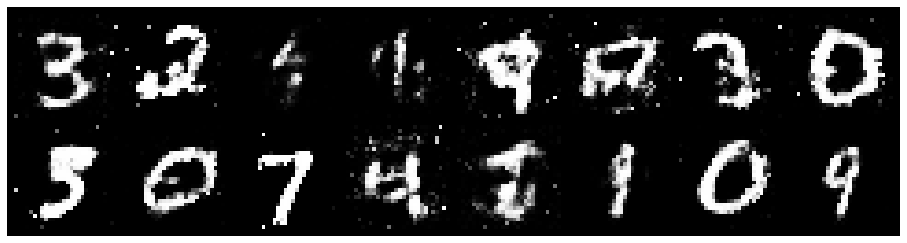

Epoch: [42/100], Batch Num: [300/600]
Discriminator Loss: 1.2074, Generator Loss: 0.9383
D(x): 0.5966, D(G(z)): 0.3880


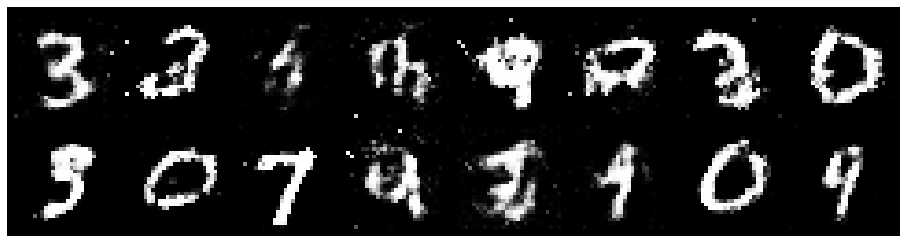

Epoch: [42/100], Batch Num: [400/600]
Discriminator Loss: 1.0878, Generator Loss: 1.0785
D(x): 0.6072, D(G(z)): 0.3726


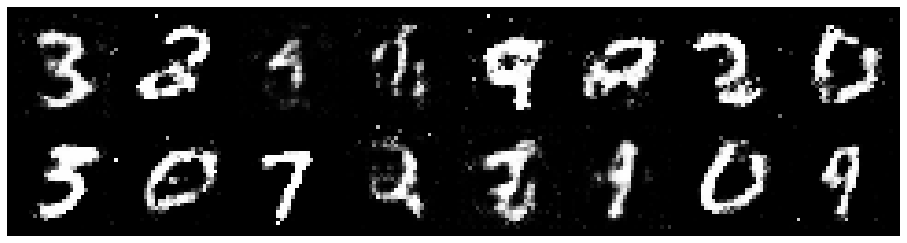

Epoch: [42/100], Batch Num: [500/600]
Discriminator Loss: 1.3481, Generator Loss: 1.0498
D(x): 0.5542, D(G(z)): 0.4204


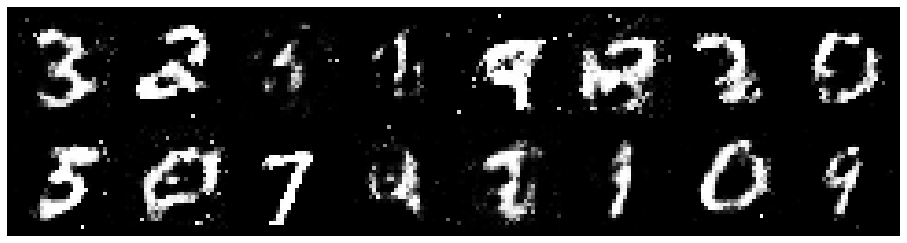

Epoch: [43/100], Batch Num: [0/600]
Discriminator Loss: 0.9697, Generator Loss: 1.1572
D(x): 0.6361, D(G(z)): 0.3239


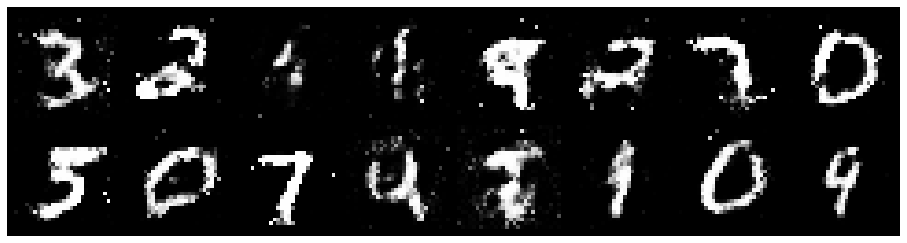

Epoch: [43/100], Batch Num: [100/600]
Discriminator Loss: 1.1167, Generator Loss: 0.9901
D(x): 0.5861, D(G(z)): 0.3504


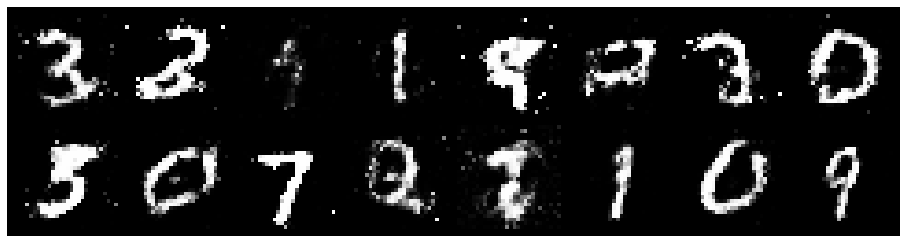

Epoch: [43/100], Batch Num: [200/600]
Discriminator Loss: 1.0818, Generator Loss: 1.0307
D(x): 0.6448, D(G(z)): 0.4095


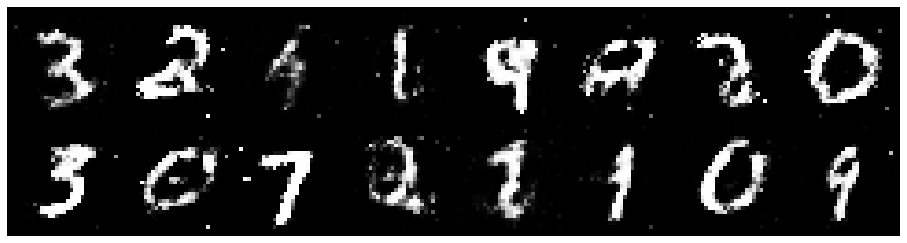

Epoch: [43/100], Batch Num: [300/600]
Discriminator Loss: 1.2623, Generator Loss: 1.3979
D(x): 0.5242, D(G(z)): 0.3478


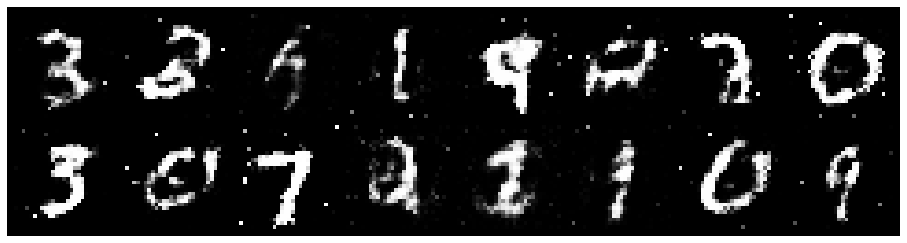

Epoch: [43/100], Batch Num: [400/600]
Discriminator Loss: 1.0227, Generator Loss: 1.1710
D(x): 0.6670, D(G(z)): 0.3841


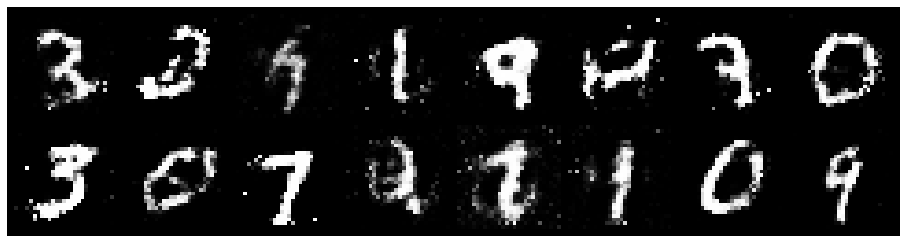

Epoch: [43/100], Batch Num: [500/600]
Discriminator Loss: 1.0700, Generator Loss: 1.1839
D(x): 0.6103, D(G(z)): 0.3426


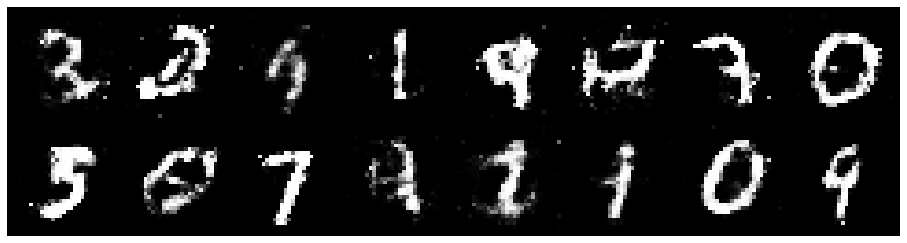

Epoch: [44/100], Batch Num: [0/600]
Discriminator Loss: 1.1470, Generator Loss: 0.9832
D(x): 0.6292, D(G(z)): 0.4278


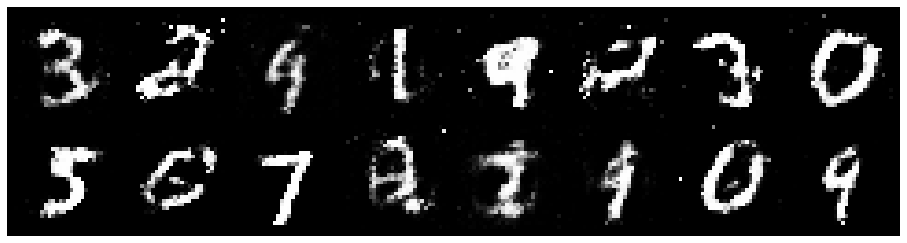

Epoch: [44/100], Batch Num: [100/600]
Discriminator Loss: 1.0594, Generator Loss: 1.0157
D(x): 0.5741, D(G(z)): 0.3356


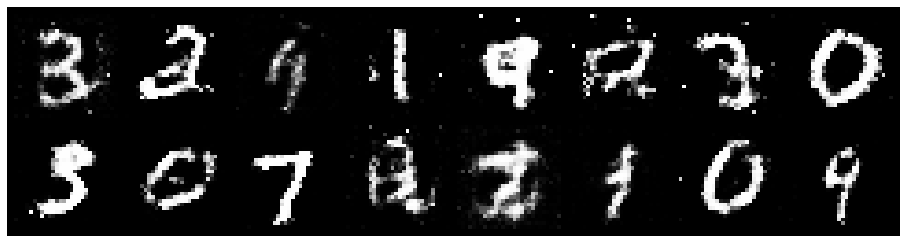

Epoch: [44/100], Batch Num: [200/600]
Discriminator Loss: 1.1821, Generator Loss: 0.9153
D(x): 0.6418, D(G(z)): 0.4570


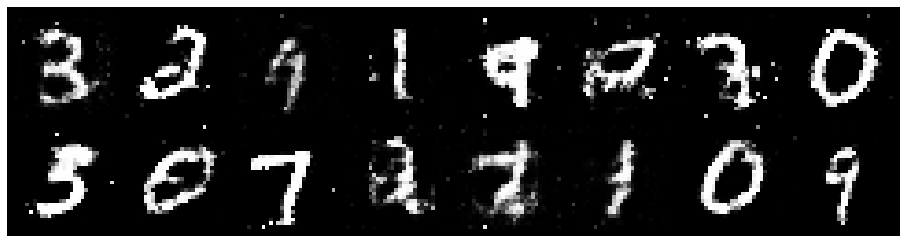

Epoch: [44/100], Batch Num: [300/600]
Discriminator Loss: 1.1732, Generator Loss: 0.9733
D(x): 0.5639, D(G(z)): 0.3970


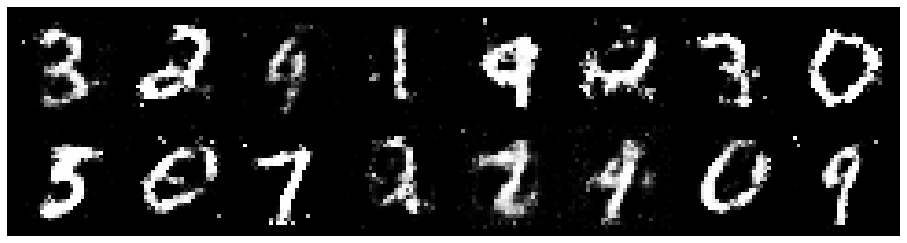

Epoch: [44/100], Batch Num: [400/600]
Discriminator Loss: 1.1042, Generator Loss: 1.0112
D(x): 0.6049, D(G(z)): 0.3884


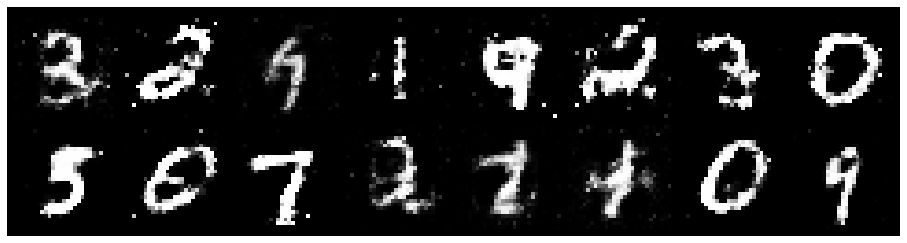

Epoch: [44/100], Batch Num: [500/600]
Discriminator Loss: 1.1964, Generator Loss: 0.9967
D(x): 0.5748, D(G(z)): 0.4033


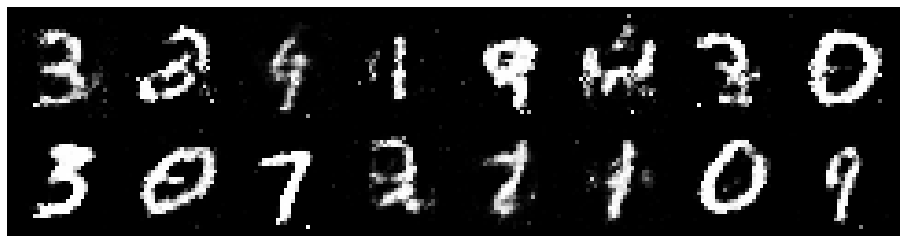

Epoch: [45/100], Batch Num: [0/600]
Discriminator Loss: 1.2232, Generator Loss: 0.9527
D(x): 0.5668, D(G(z)): 0.4275


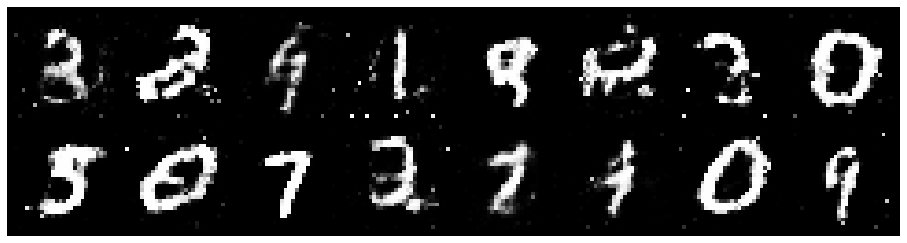

Epoch: [45/100], Batch Num: [100/600]
Discriminator Loss: 1.2198, Generator Loss: 0.8716
D(x): 0.5688, D(G(z)): 0.4173


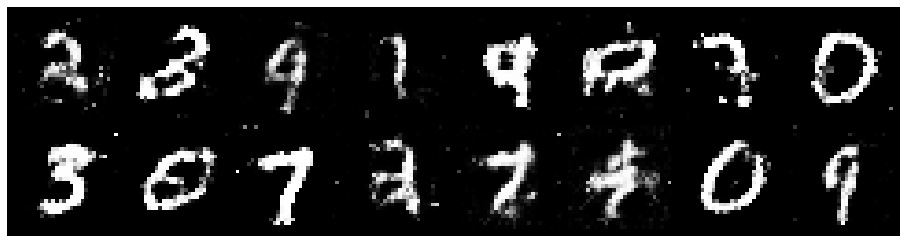

Epoch: [45/100], Batch Num: [200/600]
Discriminator Loss: 1.1265, Generator Loss: 0.8943
D(x): 0.5904, D(G(z)): 0.4009


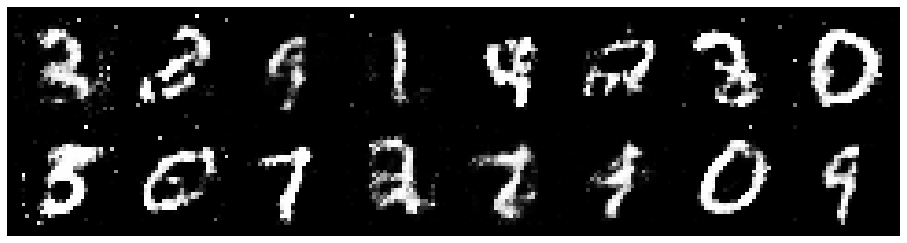

Epoch: [45/100], Batch Num: [300/600]
Discriminator Loss: 1.2026, Generator Loss: 0.9542
D(x): 0.5937, D(G(z)): 0.4405


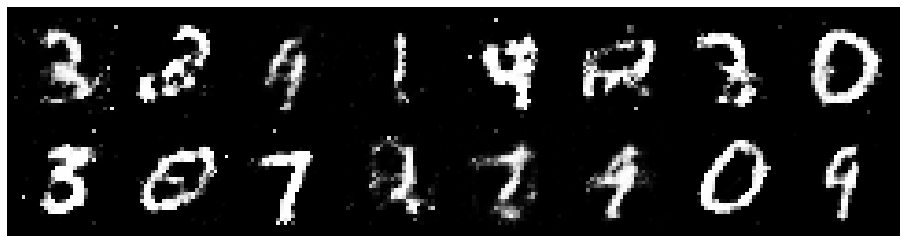

Epoch: [45/100], Batch Num: [400/600]
Discriminator Loss: 1.2232, Generator Loss: 1.0342
D(x): 0.6036, D(G(z)): 0.4317


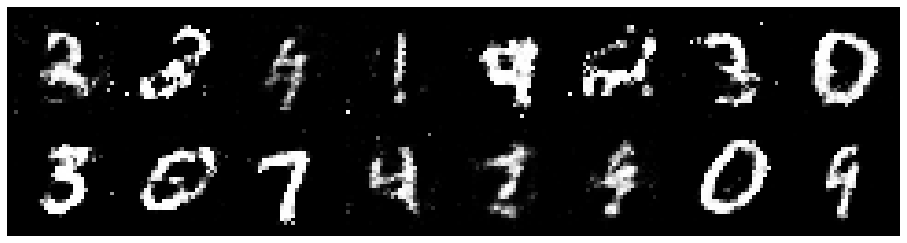

Epoch: [45/100], Batch Num: [500/600]
Discriminator Loss: 1.2533, Generator Loss: 0.8585
D(x): 0.5709, D(G(z)): 0.4596


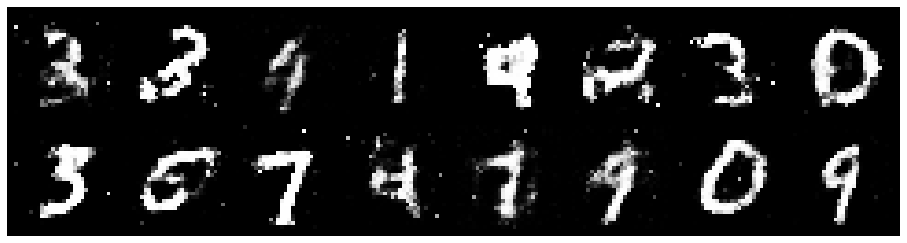

Epoch: [46/100], Batch Num: [0/600]
Discriminator Loss: 1.3363, Generator Loss: 0.9636
D(x): 0.4776, D(G(z)): 0.3938


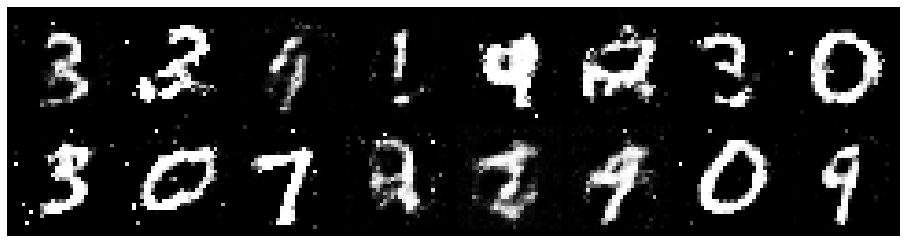

Epoch: [46/100], Batch Num: [100/600]
Discriminator Loss: 1.2127, Generator Loss: 1.0387
D(x): 0.5511, D(G(z)): 0.3832


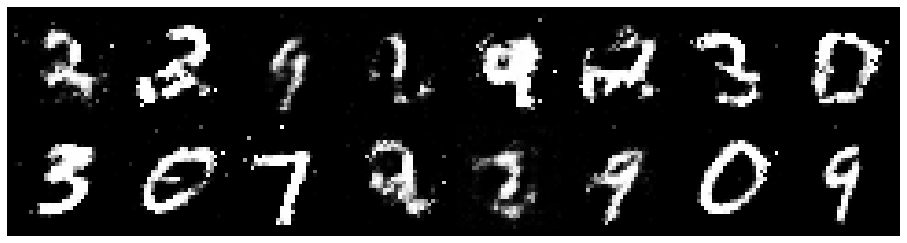

Epoch: [46/100], Batch Num: [200/600]
Discriminator Loss: 1.2029, Generator Loss: 1.3158
D(x): 0.5726, D(G(z)): 0.3664


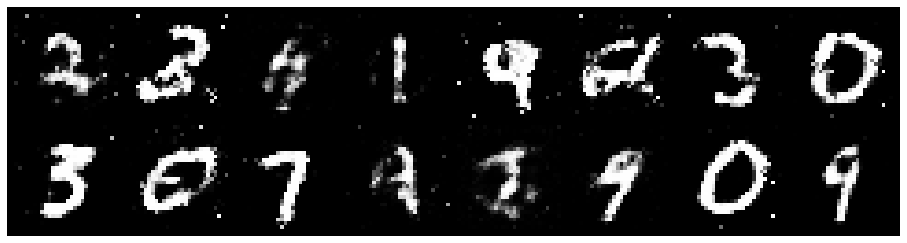

Epoch: [46/100], Batch Num: [300/600]
Discriminator Loss: 1.0577, Generator Loss: 1.1044
D(x): 0.6351, D(G(z)): 0.3825


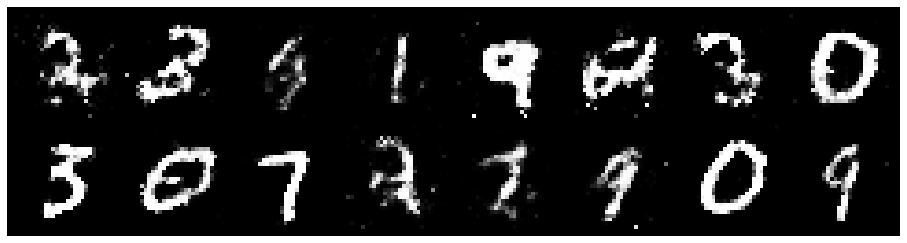

Epoch: [46/100], Batch Num: [400/600]
Discriminator Loss: 1.2330, Generator Loss: 1.0988
D(x): 0.5612, D(G(z)): 0.4039


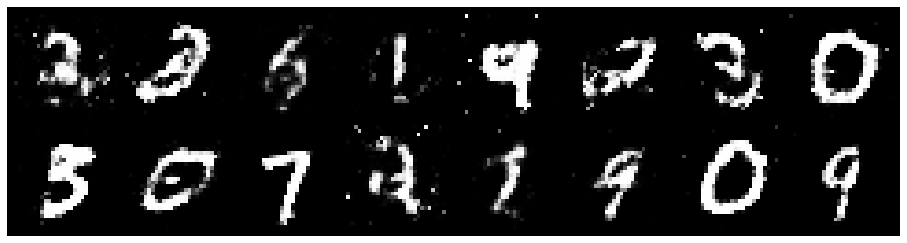

Epoch: [46/100], Batch Num: [500/600]
Discriminator Loss: 1.1532, Generator Loss: 0.9333
D(x): 0.6419, D(G(z)): 0.4229


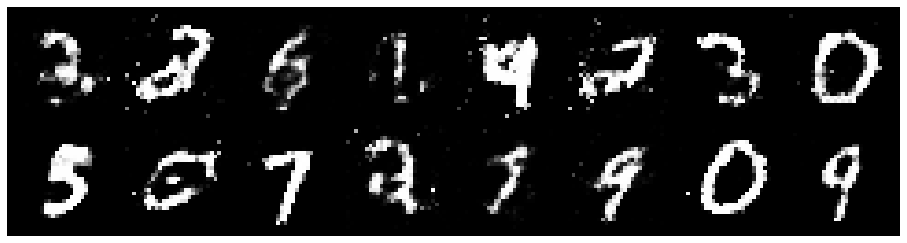

Epoch: [47/100], Batch Num: [0/600]
Discriminator Loss: 1.2028, Generator Loss: 1.1896
D(x): 0.5387, D(G(z)): 0.3394


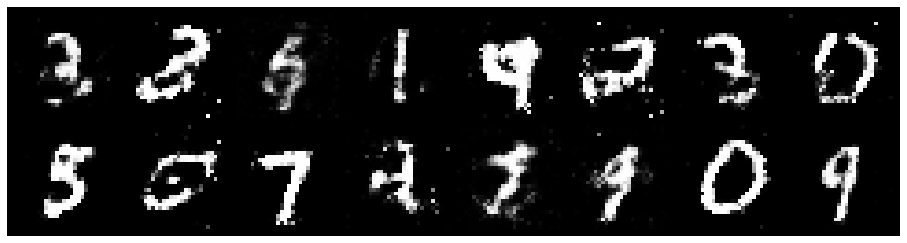

Epoch: [47/100], Batch Num: [100/600]
Discriminator Loss: 1.0488, Generator Loss: 1.0854
D(x): 0.6403, D(G(z)): 0.3953


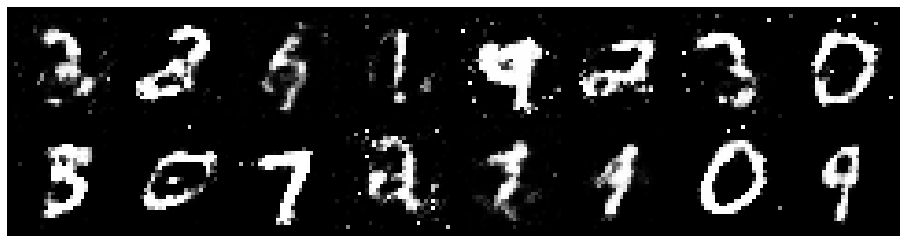

Epoch: [47/100], Batch Num: [200/600]
Discriminator Loss: 1.2010, Generator Loss: 1.1157
D(x): 0.5575, D(G(z)): 0.3736


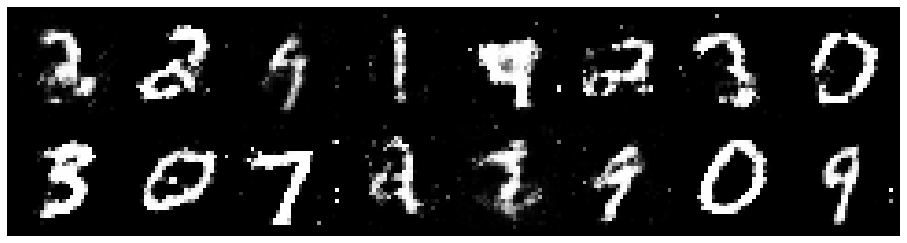

Epoch: [47/100], Batch Num: [300/600]
Discriminator Loss: 1.1281, Generator Loss: 1.3389
D(x): 0.6723, D(G(z)): 0.4187


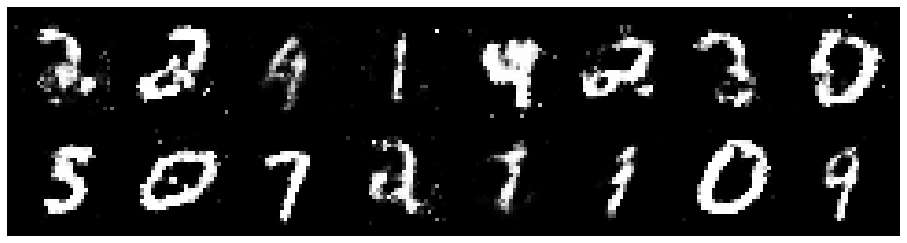

Epoch: [47/100], Batch Num: [400/600]
Discriminator Loss: 1.2530, Generator Loss: 1.3685
D(x): 0.5482, D(G(z)): 0.3236


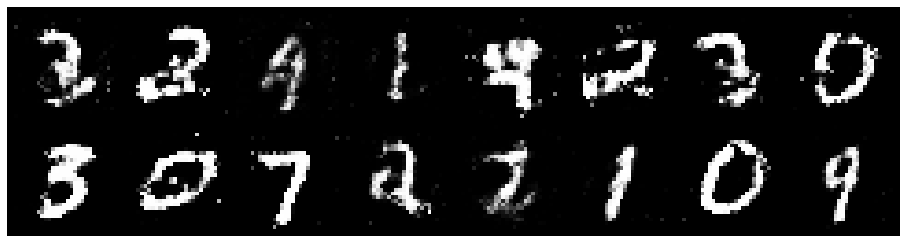

Epoch: [47/100], Batch Num: [500/600]
Discriminator Loss: 1.0484, Generator Loss: 1.0778
D(x): 0.6009, D(G(z)): 0.3402


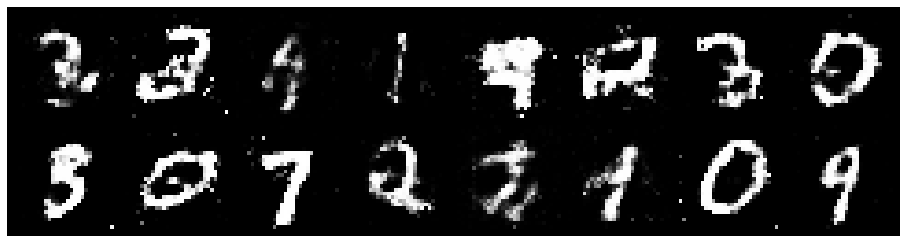

Epoch: [48/100], Batch Num: [0/600]
Discriminator Loss: 1.1988, Generator Loss: 0.9519
D(x): 0.6258, D(G(z)): 0.4296


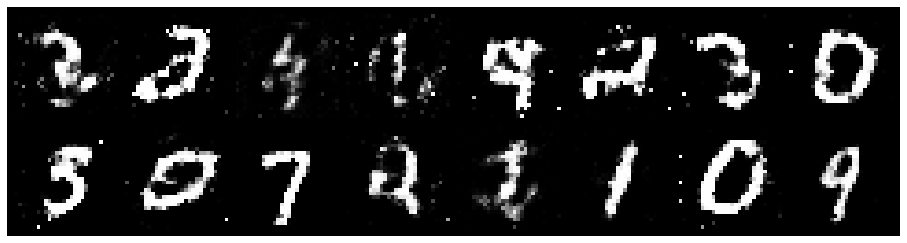

Epoch: [48/100], Batch Num: [100/600]
Discriminator Loss: 1.1278, Generator Loss: 1.1220
D(x): 0.5991, D(G(z)): 0.3896


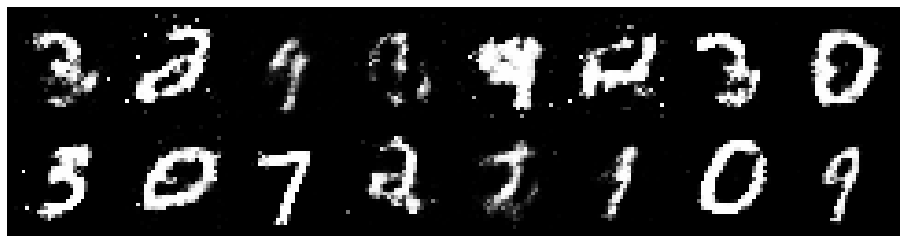

Epoch: [48/100], Batch Num: [200/600]
Discriminator Loss: 1.1019, Generator Loss: 1.0556
D(x): 0.6096, D(G(z)): 0.3710


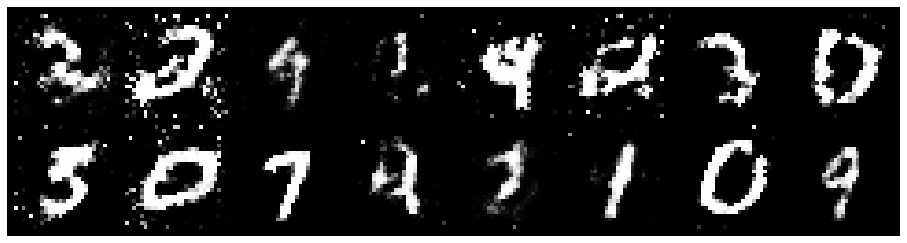

Epoch: [48/100], Batch Num: [300/600]
Discriminator Loss: 1.2073, Generator Loss: 0.8758
D(x): 0.5737, D(G(z)): 0.4298


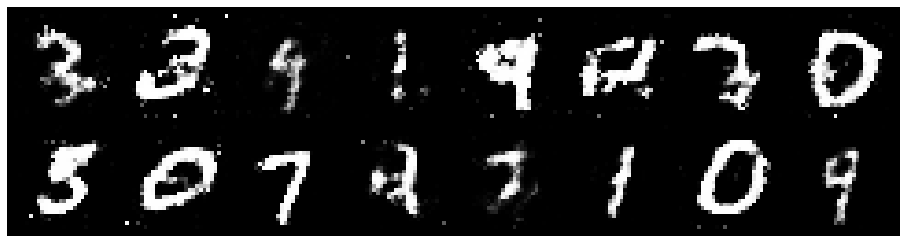

Epoch: [48/100], Batch Num: [400/600]
Discriminator Loss: 1.2880, Generator Loss: 0.8927
D(x): 0.5941, D(G(z)): 0.4508


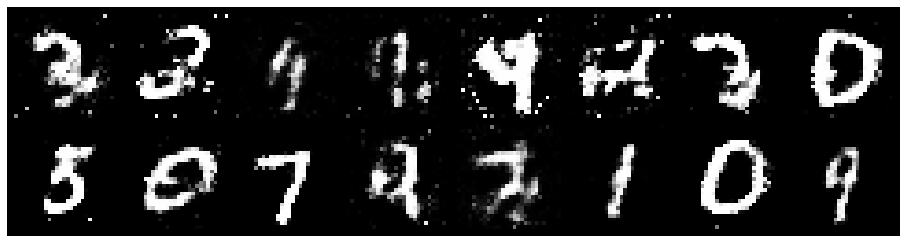

Epoch: [48/100], Batch Num: [500/600]
Discriminator Loss: 1.2380, Generator Loss: 1.1107
D(x): 0.5197, D(G(z)): 0.3585


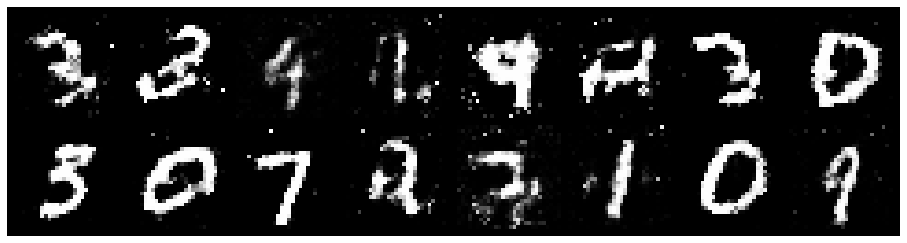

Epoch: [49/100], Batch Num: [0/600]
Discriminator Loss: 1.1778, Generator Loss: 1.0278
D(x): 0.6081, D(G(z)): 0.4186


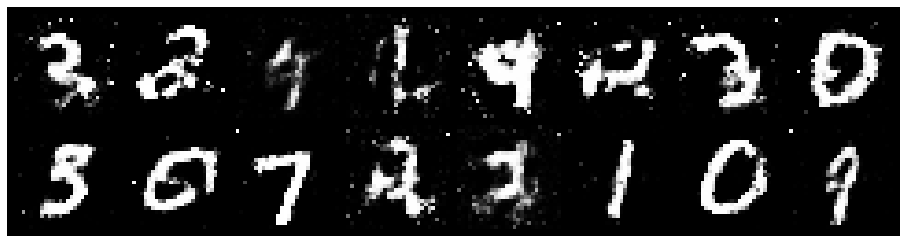

Epoch: [49/100], Batch Num: [100/600]
Discriminator Loss: 1.0814, Generator Loss: 0.9739
D(x): 0.6582, D(G(z)): 0.4110


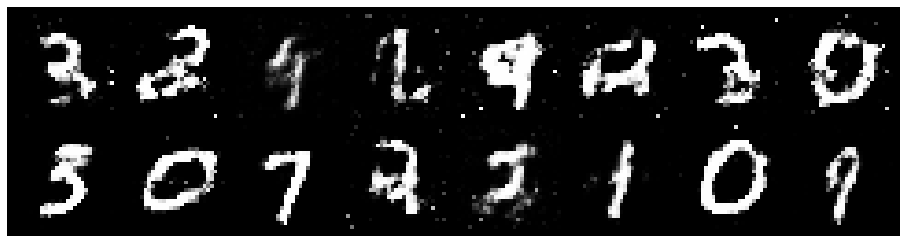

Epoch: [49/100], Batch Num: [200/600]
Discriminator Loss: 1.3299, Generator Loss: 1.1362
D(x): 0.5978, D(G(z)): 0.4291


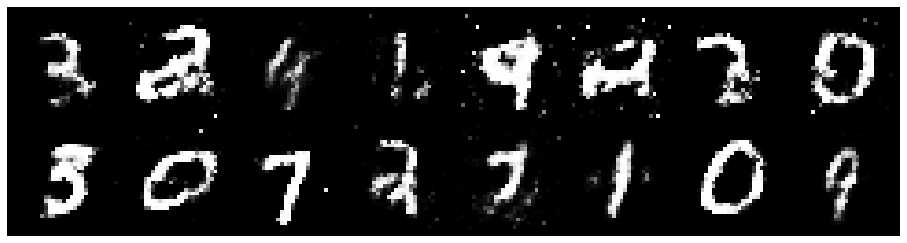

Epoch: [49/100], Batch Num: [300/600]
Discriminator Loss: 1.2371, Generator Loss: 0.9439
D(x): 0.5733, D(G(z)): 0.4125


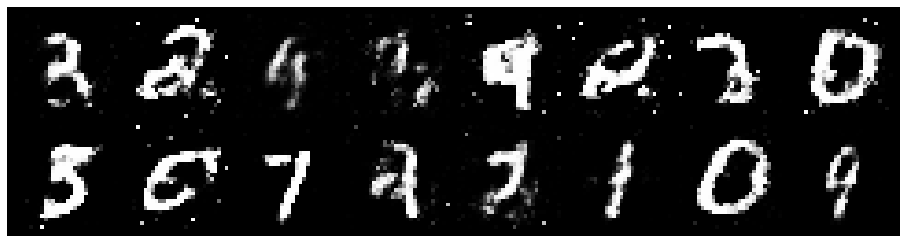

Epoch: [49/100], Batch Num: [400/600]
Discriminator Loss: 1.4091, Generator Loss: 0.9337
D(x): 0.5062, D(G(z)): 0.4249


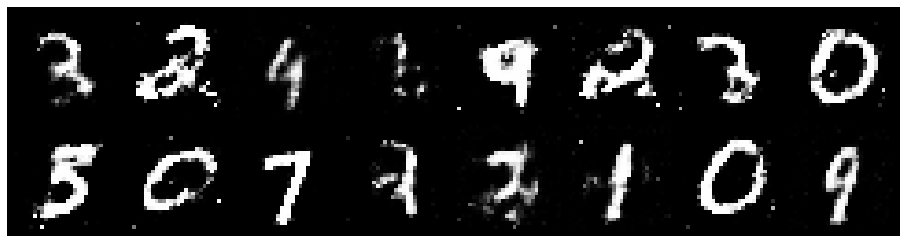

Epoch: [49/100], Batch Num: [500/600]
Discriminator Loss: 1.1896, Generator Loss: 1.0467
D(x): 0.5497, D(G(z)): 0.3765


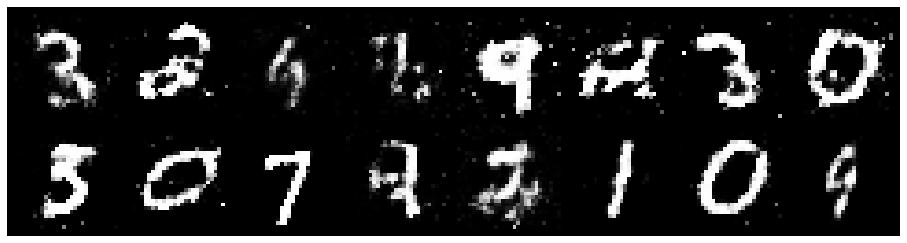

Epoch: [50/100], Batch Num: [0/600]
Discriminator Loss: 1.2874, Generator Loss: 0.9046
D(x): 0.5889, D(G(z)): 0.4577


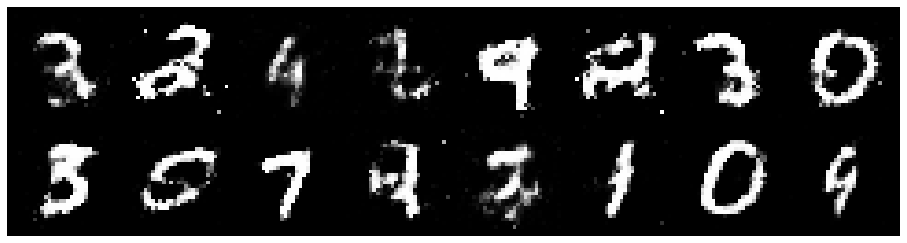

Epoch: [50/100], Batch Num: [100/600]
Discriminator Loss: 1.0695, Generator Loss: 1.2901
D(x): 0.6425, D(G(z)): 0.3619


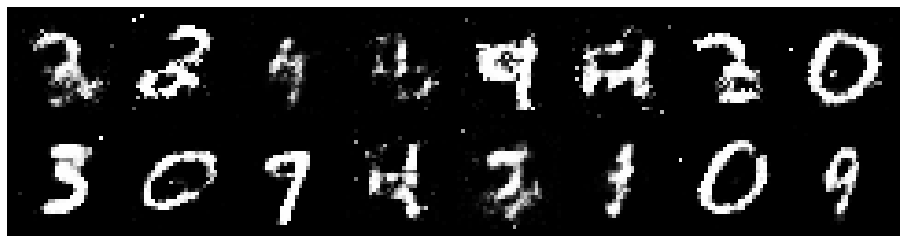

Epoch: [50/100], Batch Num: [200/600]
Discriminator Loss: 1.1203, Generator Loss: 1.0171
D(x): 0.6415, D(G(z)): 0.4319


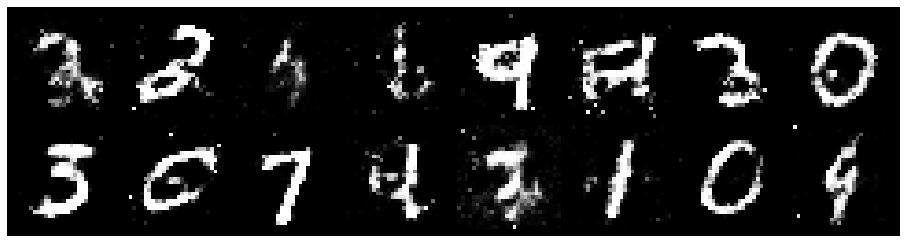

Epoch: [50/100], Batch Num: [300/600]
Discriminator Loss: 1.2249, Generator Loss: 0.9491
D(x): 0.5779, D(G(z)): 0.4250


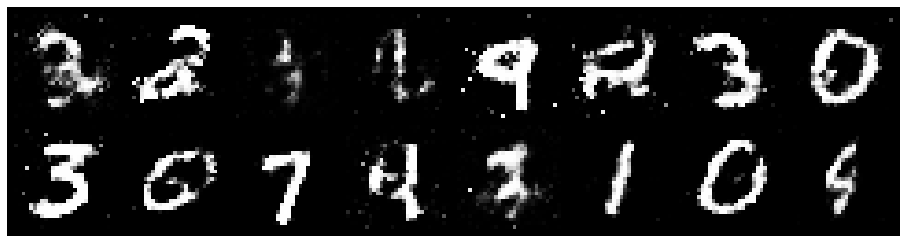

Epoch: [50/100], Batch Num: [400/600]
Discriminator Loss: 1.0774, Generator Loss: 1.1368
D(x): 0.6152, D(G(z)): 0.3810


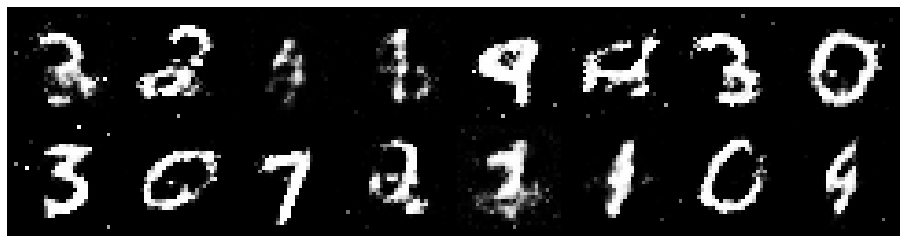

Epoch: [50/100], Batch Num: [500/600]
Discriminator Loss: 0.9942, Generator Loss: 1.1745
D(x): 0.6627, D(G(z)): 0.3705


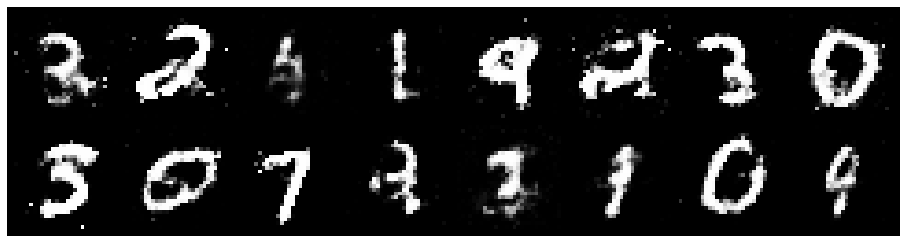

Epoch: [51/100], Batch Num: [0/600]
Discriminator Loss: 1.0952, Generator Loss: 1.1043
D(x): 0.6104, D(G(z)): 0.3815


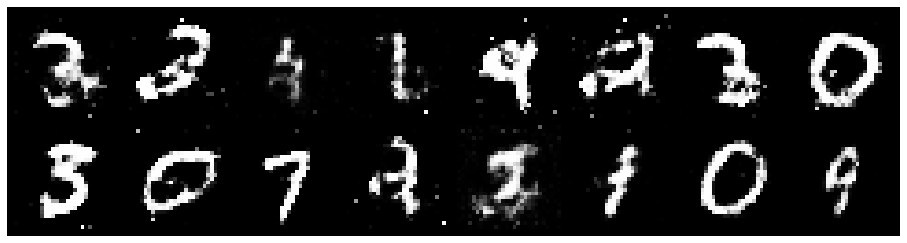

Epoch: [51/100], Batch Num: [100/600]
Discriminator Loss: 1.0681, Generator Loss: 0.9811
D(x): 0.6084, D(G(z)): 0.3770


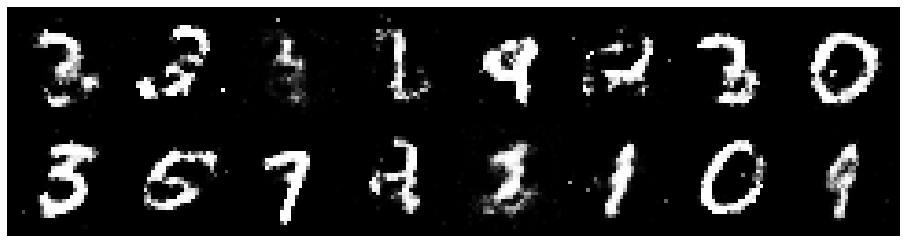

Epoch: [51/100], Batch Num: [200/600]
Discriminator Loss: 1.1082, Generator Loss: 0.9966
D(x): 0.6157, D(G(z)): 0.4092


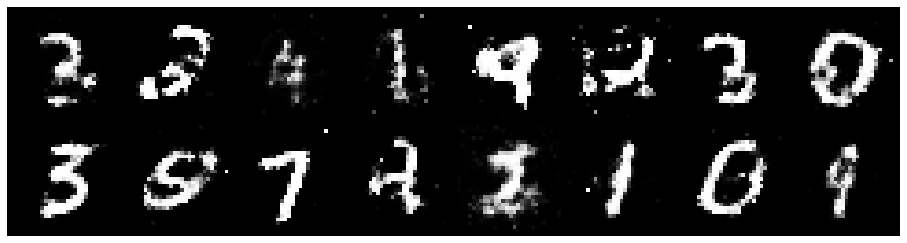

Epoch: [51/100], Batch Num: [300/600]
Discriminator Loss: 1.1753, Generator Loss: 1.1163
D(x): 0.5765, D(G(z)): 0.4029


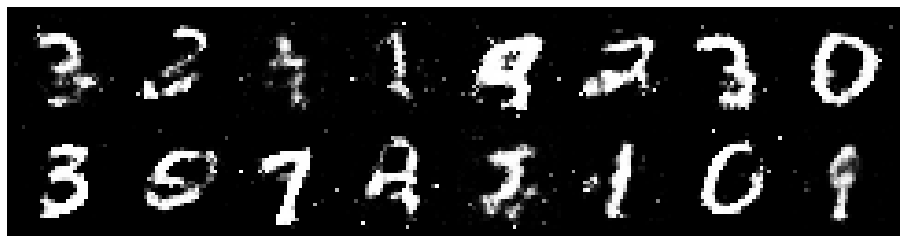

Epoch: [51/100], Batch Num: [400/600]
Discriminator Loss: 1.0808, Generator Loss: 1.1910
D(x): 0.5861, D(G(z)): 0.3639


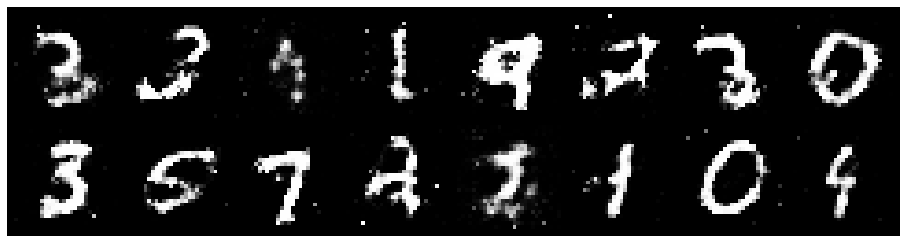

Epoch: [51/100], Batch Num: [500/600]
Discriminator Loss: 1.1998, Generator Loss: 1.0482
D(x): 0.5829, D(G(z)): 0.4137


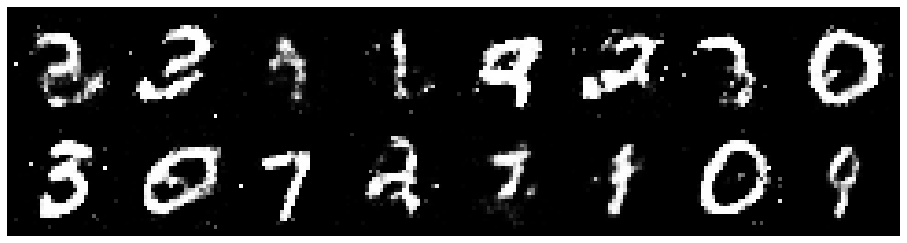

Epoch: [52/100], Batch Num: [0/600]
Discriminator Loss: 1.3055, Generator Loss: 0.9706
D(x): 0.5478, D(G(z)): 0.4169


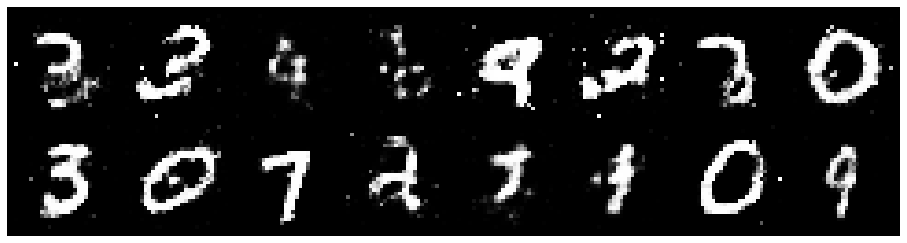

Epoch: [52/100], Batch Num: [100/600]
Discriminator Loss: 1.2113, Generator Loss: 1.1584
D(x): 0.6067, D(G(z)): 0.4104


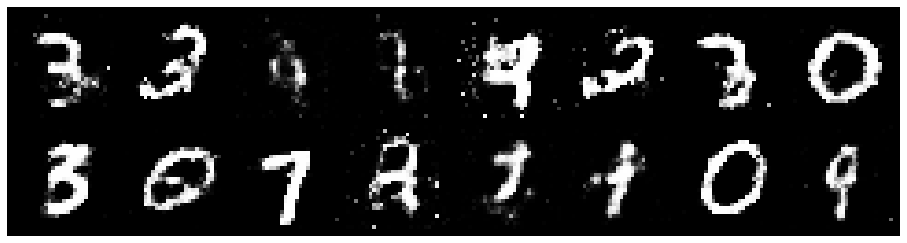

Epoch: [52/100], Batch Num: [200/600]
Discriminator Loss: 1.2751, Generator Loss: 1.0294
D(x): 0.5454, D(G(z)): 0.4048


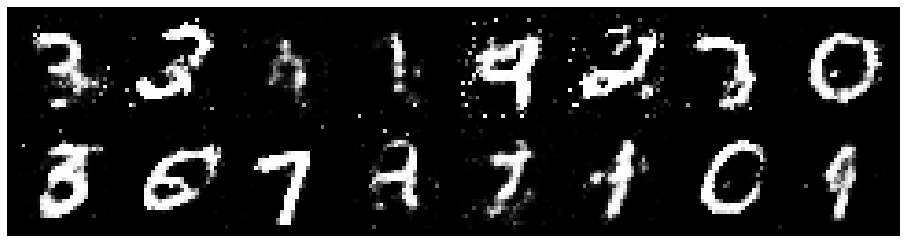

Epoch: [52/100], Batch Num: [300/600]
Discriminator Loss: 1.0485, Generator Loss: 1.2584
D(x): 0.6292, D(G(z)): 0.3556


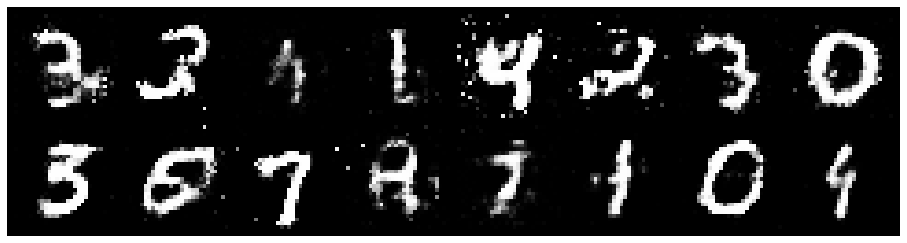

Epoch: [52/100], Batch Num: [400/600]
Discriminator Loss: 1.2363, Generator Loss: 0.9523
D(x): 0.6519, D(G(z)): 0.4509


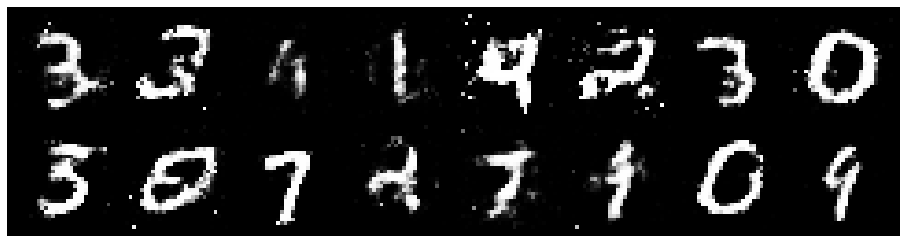

Epoch: [52/100], Batch Num: [500/600]
Discriminator Loss: 1.1559, Generator Loss: 1.0123
D(x): 0.6231, D(G(z)): 0.4095


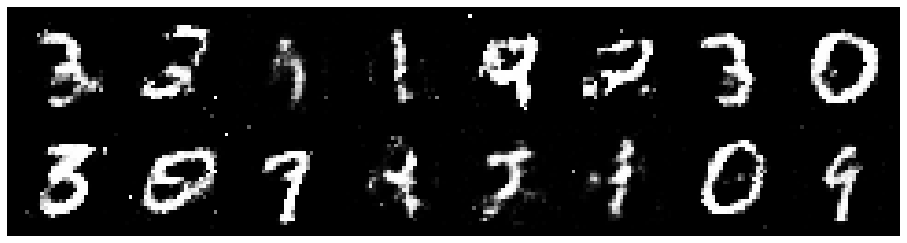

Epoch: [53/100], Batch Num: [0/600]
Discriminator Loss: 1.1311, Generator Loss: 1.0866
D(x): 0.5919, D(G(z)): 0.3862


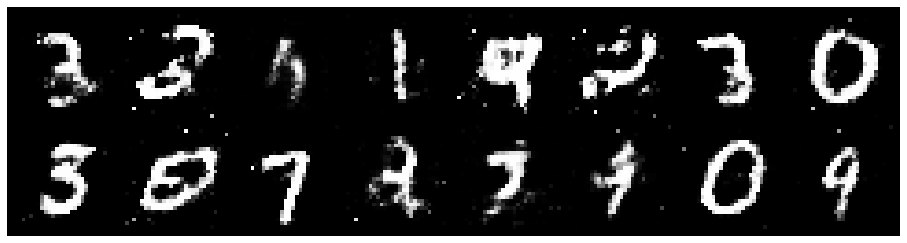

Epoch: [53/100], Batch Num: [100/600]
Discriminator Loss: 1.1568, Generator Loss: 0.9334
D(x): 0.6422, D(G(z)): 0.4383


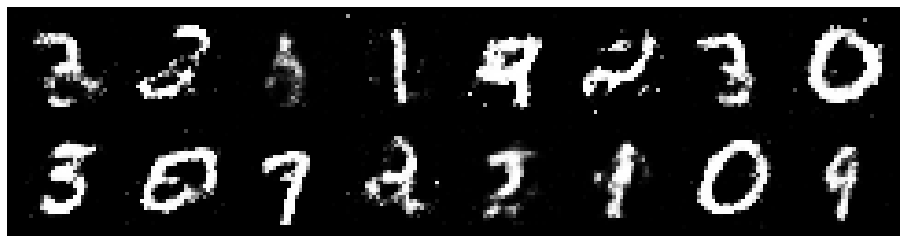

Epoch: [53/100], Batch Num: [200/600]
Discriminator Loss: 1.1034, Generator Loss: 1.0725
D(x): 0.5749, D(G(z)): 0.3647


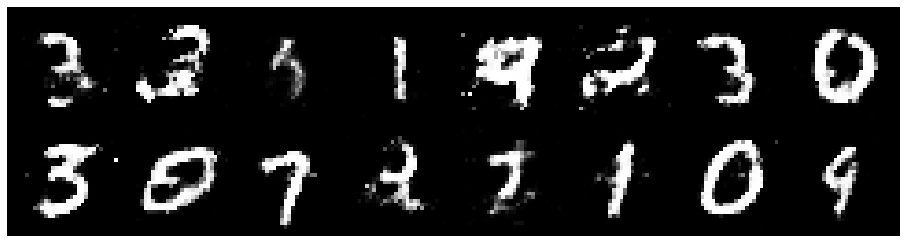

Epoch: [53/100], Batch Num: [300/600]
Discriminator Loss: 1.0132, Generator Loss: 1.0938
D(x): 0.5977, D(G(z)): 0.3397


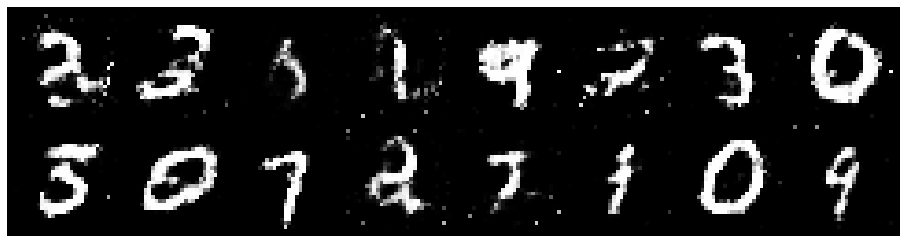

Epoch: [53/100], Batch Num: [400/600]
Discriminator Loss: 1.2899, Generator Loss: 0.9387
D(x): 0.5072, D(G(z)): 0.3945


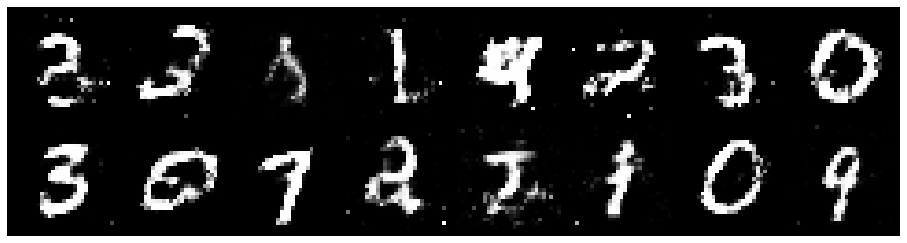

Epoch: [53/100], Batch Num: [500/600]
Discriminator Loss: 1.1592, Generator Loss: 0.9494
D(x): 0.6226, D(G(z)): 0.4314


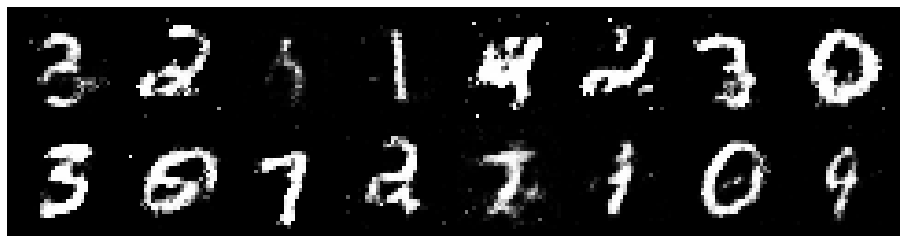

Epoch: [54/100], Batch Num: [0/600]
Discriminator Loss: 1.2698, Generator Loss: 0.9141
D(x): 0.5982, D(G(z)): 0.4581


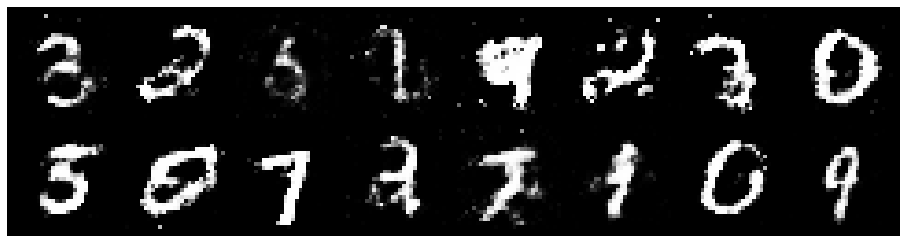

Epoch: [54/100], Batch Num: [100/600]
Discriminator Loss: 1.3870, Generator Loss: 1.0232
D(x): 0.5174, D(G(z)): 0.4308


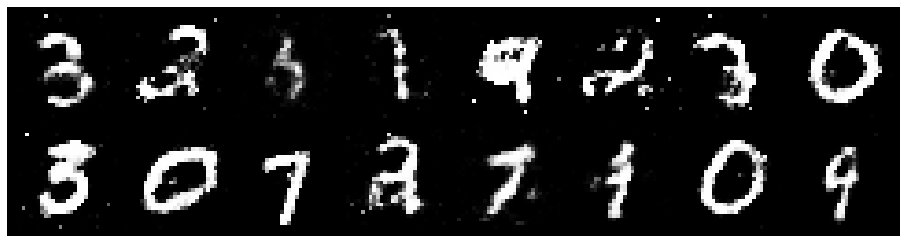

Epoch: [54/100], Batch Num: [200/600]
Discriminator Loss: 1.1360, Generator Loss: 1.1260
D(x): 0.5713, D(G(z)): 0.3713


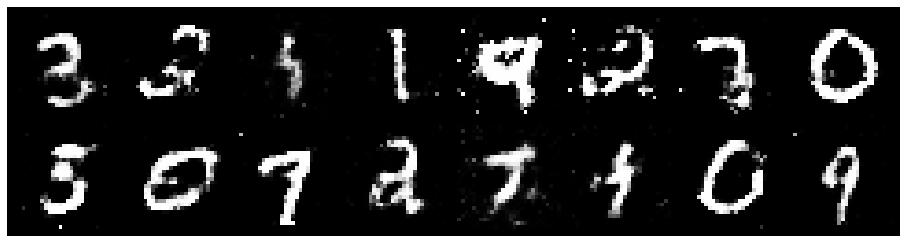

Epoch: [54/100], Batch Num: [300/600]
Discriminator Loss: 1.2925, Generator Loss: 0.9591
D(x): 0.5934, D(G(z)): 0.4645


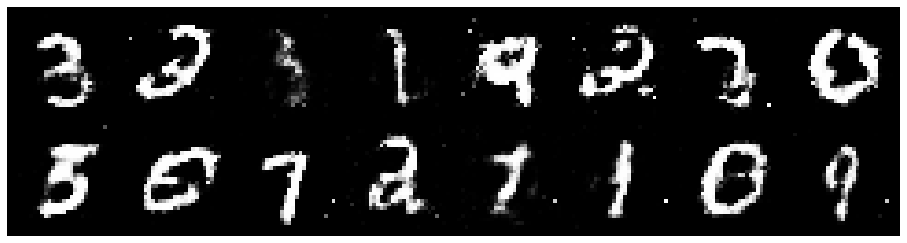

Epoch: [54/100], Batch Num: [400/600]
Discriminator Loss: 1.3205, Generator Loss: 1.1089
D(x): 0.6173, D(G(z)): 0.4837


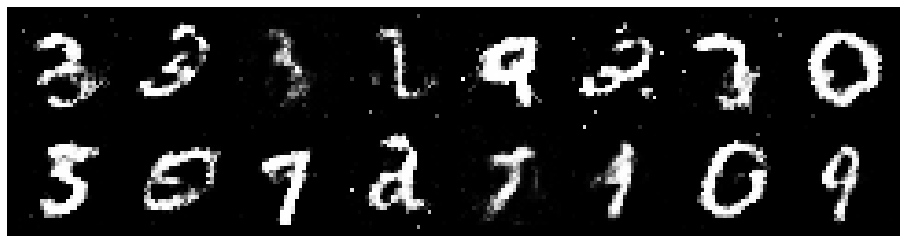

Epoch: [54/100], Batch Num: [500/600]
Discriminator Loss: 1.2556, Generator Loss: 0.9950
D(x): 0.5760, D(G(z)): 0.4314


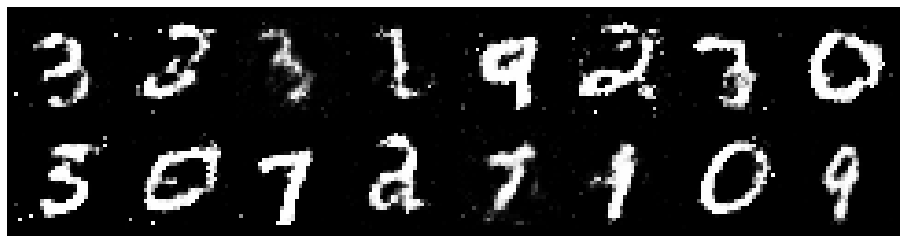

Epoch: [55/100], Batch Num: [0/600]
Discriminator Loss: 1.3394, Generator Loss: 0.9742
D(x): 0.5709, D(G(z)): 0.4480


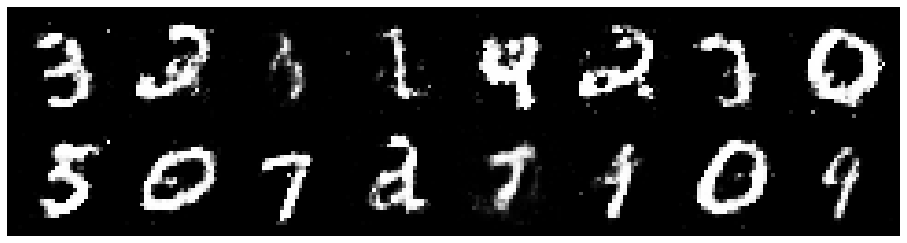

Epoch: [55/100], Batch Num: [100/600]
Discriminator Loss: 1.3903, Generator Loss: 0.8862
D(x): 0.6156, D(G(z)): 0.5143


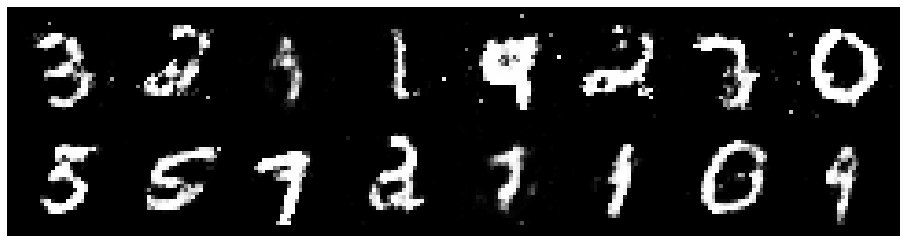

Epoch: [55/100], Batch Num: [200/600]
Discriminator Loss: 1.2617, Generator Loss: 1.0466
D(x): 0.6160, D(G(z)): 0.4619


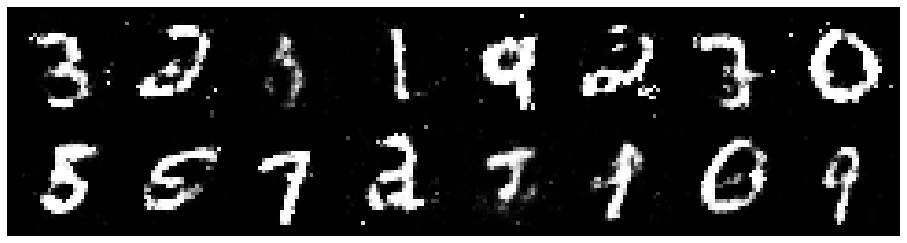

Epoch: [55/100], Batch Num: [300/600]
Discriminator Loss: 1.1646, Generator Loss: 1.4148
D(x): 0.6392, D(G(z)): 0.4069


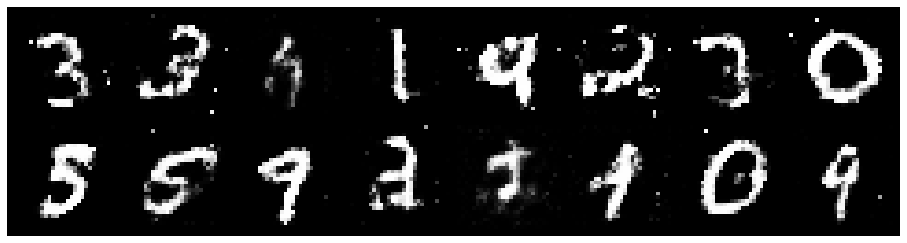

Epoch: [55/100], Batch Num: [400/600]
Discriminator Loss: 1.1029, Generator Loss: 1.0002
D(x): 0.6238, D(G(z)): 0.4071


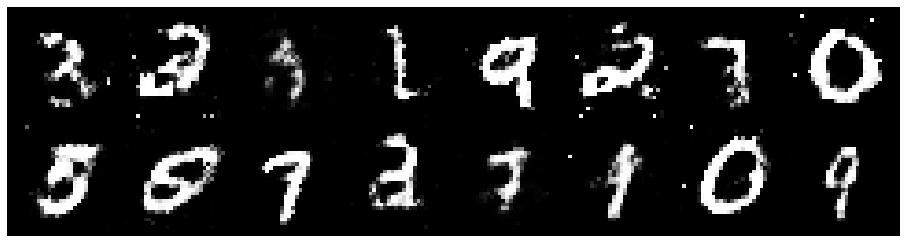

Epoch: [55/100], Batch Num: [500/600]
Discriminator Loss: 1.1243, Generator Loss: 1.0201
D(x): 0.6059, D(G(z)): 0.3820


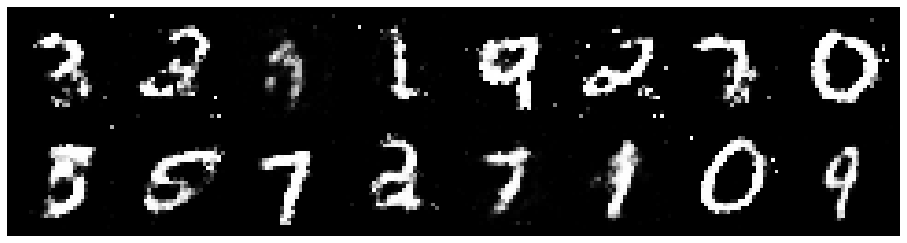

Epoch: [56/100], Batch Num: [0/600]
Discriminator Loss: 1.2098, Generator Loss: 0.8789
D(x): 0.6100, D(G(z)): 0.4407


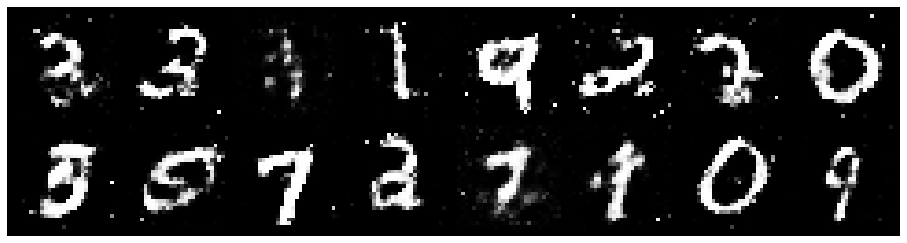

Epoch: [56/100], Batch Num: [100/600]
Discriminator Loss: 1.0428, Generator Loss: 1.0156
D(x): 0.6571, D(G(z)): 0.4050


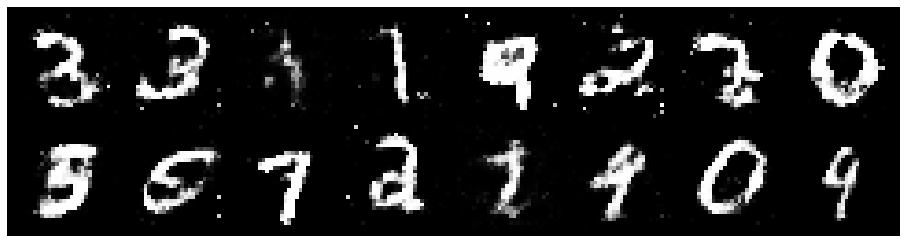

Epoch: [56/100], Batch Num: [200/600]
Discriminator Loss: 1.1215, Generator Loss: 1.0423
D(x): 0.6026, D(G(z)): 0.3964


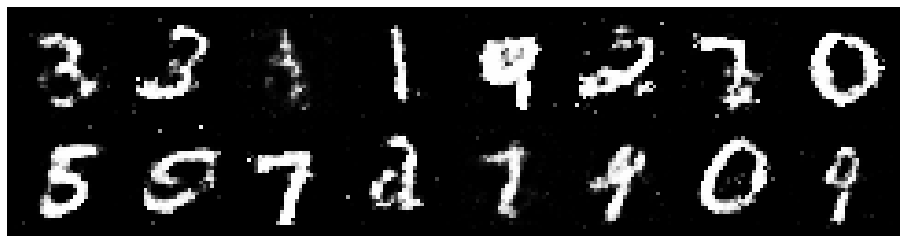

Epoch: [56/100], Batch Num: [300/600]
Discriminator Loss: 1.2048, Generator Loss: 1.1293
D(x): 0.5741, D(G(z)): 0.4141


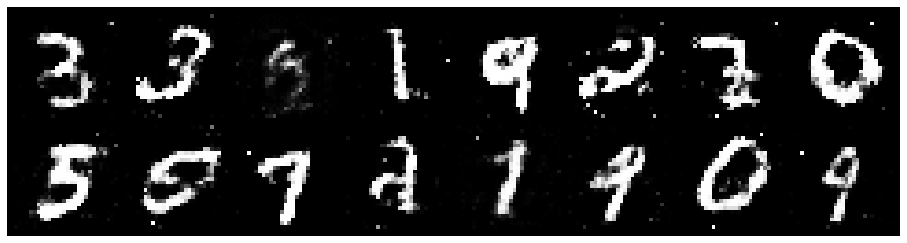

Epoch: [56/100], Batch Num: [400/600]
Discriminator Loss: 1.0969, Generator Loss: 0.9849
D(x): 0.6217, D(G(z)): 0.3741


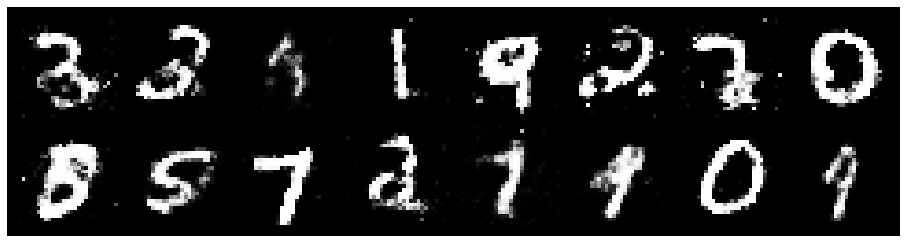

Epoch: [56/100], Batch Num: [500/600]
Discriminator Loss: 1.1111, Generator Loss: 1.0592
D(x): 0.6355, D(G(z)): 0.4033


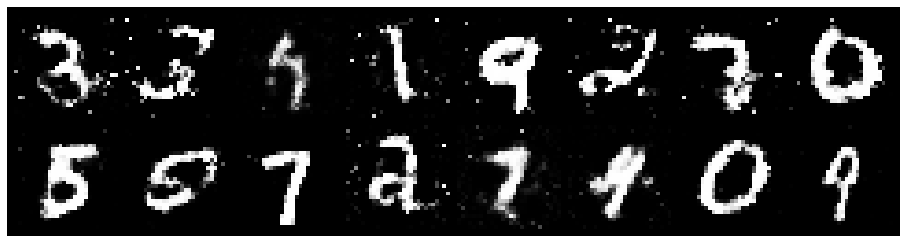

Epoch: [57/100], Batch Num: [0/600]
Discriminator Loss: 1.1545, Generator Loss: 0.9820
D(x): 0.5918, D(G(z)): 0.4144


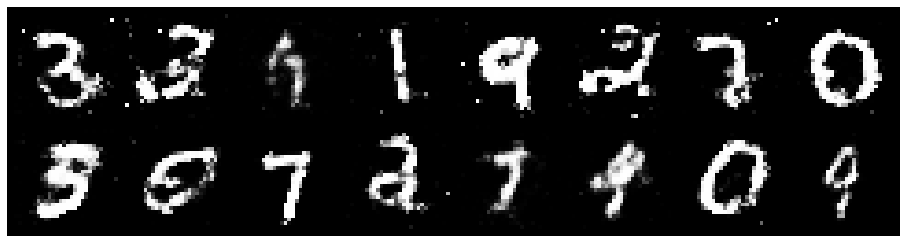

Epoch: [57/100], Batch Num: [100/600]
Discriminator Loss: 1.1169, Generator Loss: 0.9894
D(x): 0.5998, D(G(z)): 0.4030


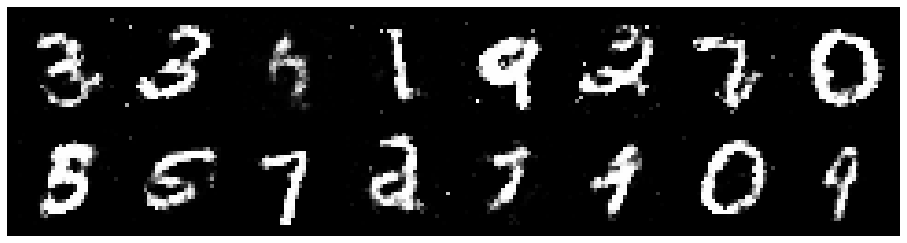

Epoch: [57/100], Batch Num: [200/600]
Discriminator Loss: 1.1854, Generator Loss: 0.9237
D(x): 0.5949, D(G(z)): 0.4483


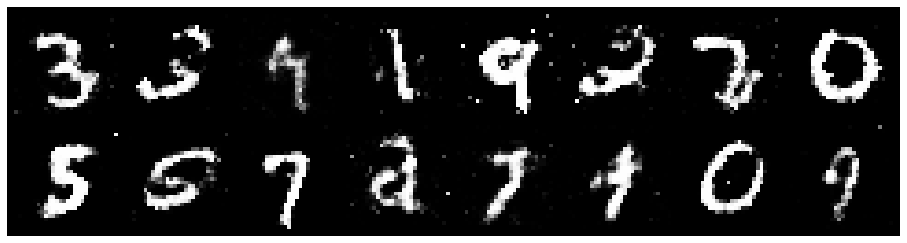

Epoch: [57/100], Batch Num: [300/600]
Discriminator Loss: 1.1709, Generator Loss: 0.9656
D(x): 0.5952, D(G(z)): 0.4276


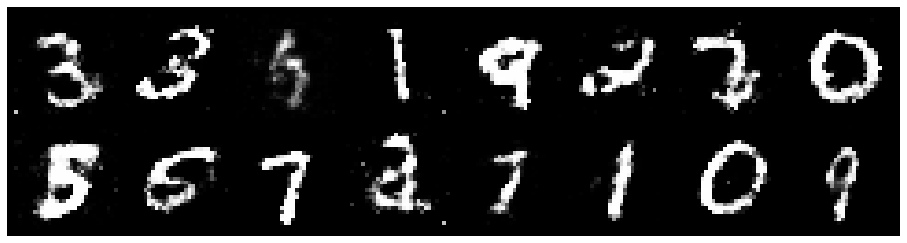

Epoch: [57/100], Batch Num: [400/600]
Discriminator Loss: 1.2598, Generator Loss: 0.9181
D(x): 0.5607, D(G(z)): 0.4100


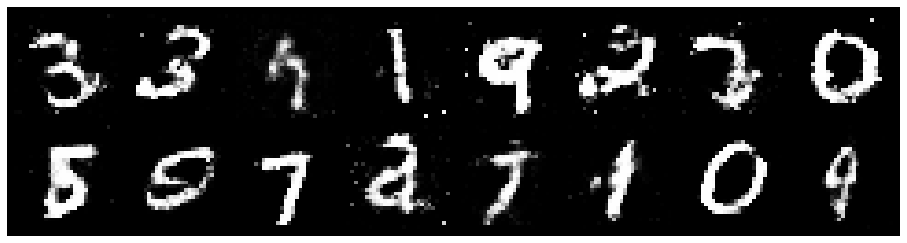

Epoch: [57/100], Batch Num: [500/600]
Discriminator Loss: 1.1574, Generator Loss: 1.0850
D(x): 0.5606, D(G(z)): 0.3702


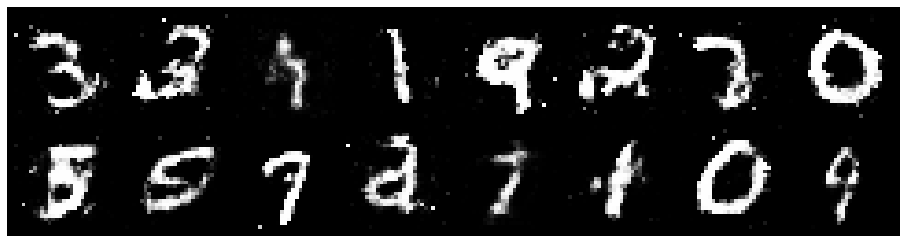

Epoch: [58/100], Batch Num: [0/600]
Discriminator Loss: 1.2252, Generator Loss: 1.0920
D(x): 0.5775, D(G(z)): 0.4232


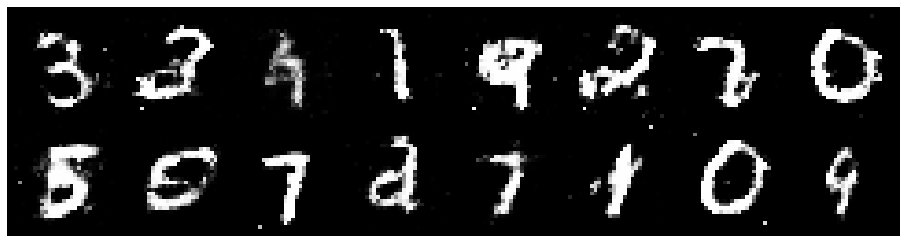

Epoch: [58/100], Batch Num: [100/600]
Discriminator Loss: 1.2649, Generator Loss: 0.9653
D(x): 0.5202, D(G(z)): 0.4248


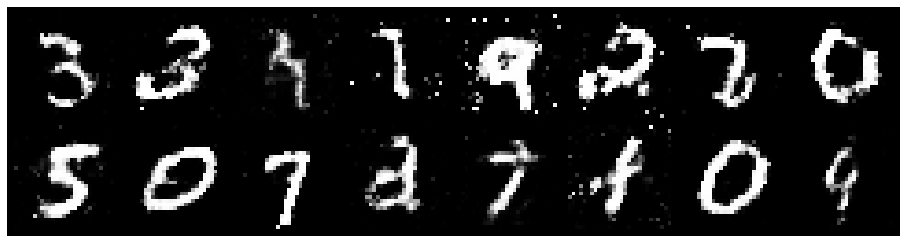

Epoch: [58/100], Batch Num: [200/600]
Discriminator Loss: 1.2160, Generator Loss: 0.9074
D(x): 0.5653, D(G(z)): 0.3896


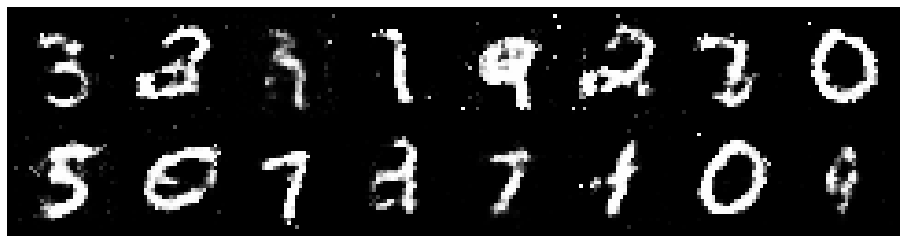

Epoch: [58/100], Batch Num: [300/600]
Discriminator Loss: 0.9825, Generator Loss: 1.0349
D(x): 0.6538, D(G(z)): 0.3537


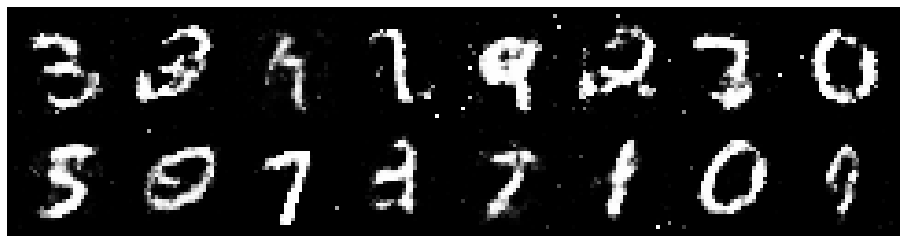

Epoch: [58/100], Batch Num: [400/600]
Discriminator Loss: 1.1596, Generator Loss: 1.0262
D(x): 0.6588, D(G(z)): 0.4299


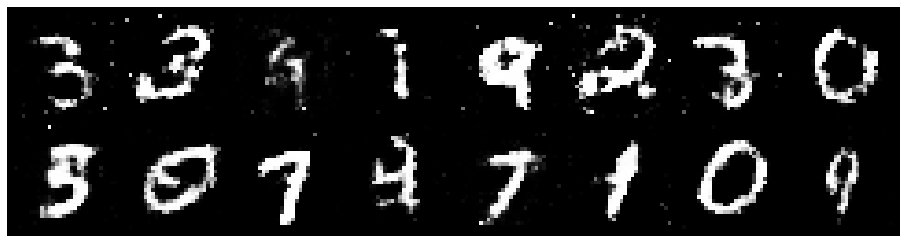

Epoch: [58/100], Batch Num: [500/600]
Discriminator Loss: 1.1287, Generator Loss: 1.1114
D(x): 0.6442, D(G(z)): 0.3997


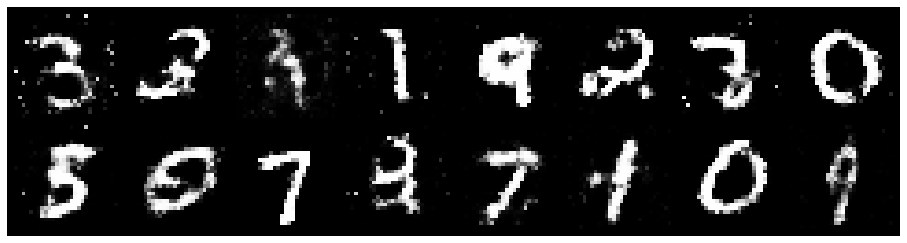

Epoch: [59/100], Batch Num: [0/600]
Discriminator Loss: 1.1356, Generator Loss: 1.0341
D(x): 0.6573, D(G(z)): 0.4427


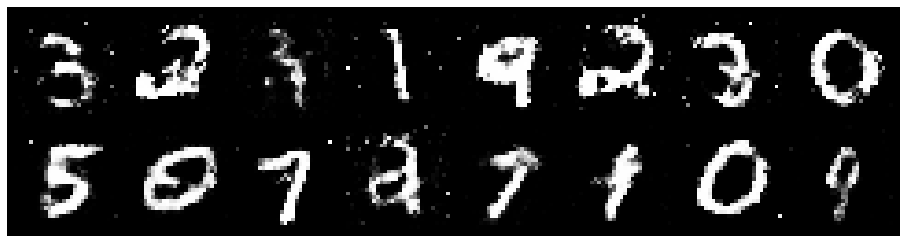

Epoch: [59/100], Batch Num: [100/600]
Discriminator Loss: 1.1503, Generator Loss: 1.0985
D(x): 0.5753, D(G(z)): 0.3812


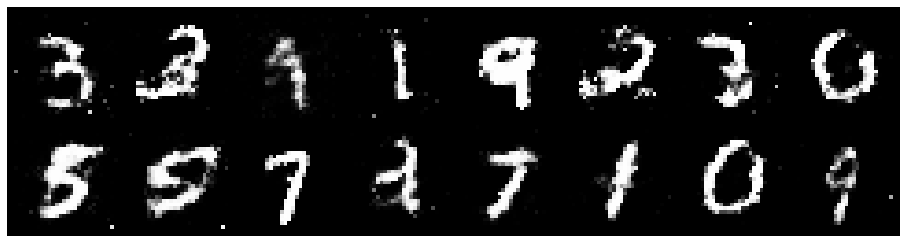

Epoch: [59/100], Batch Num: [200/600]
Discriminator Loss: 1.1666, Generator Loss: 0.9652
D(x): 0.6027, D(G(z)): 0.4251


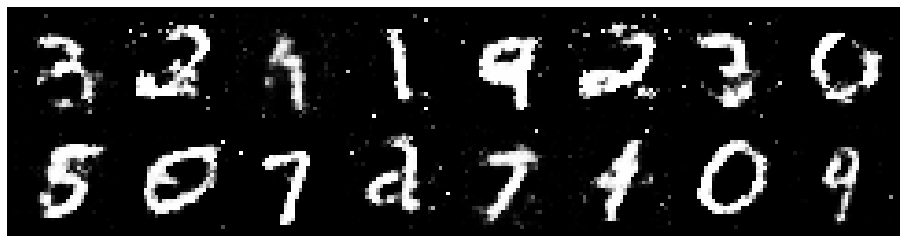

Epoch: [59/100], Batch Num: [300/600]
Discriminator Loss: 1.1360, Generator Loss: 1.0413
D(x): 0.5600, D(G(z)): 0.3444


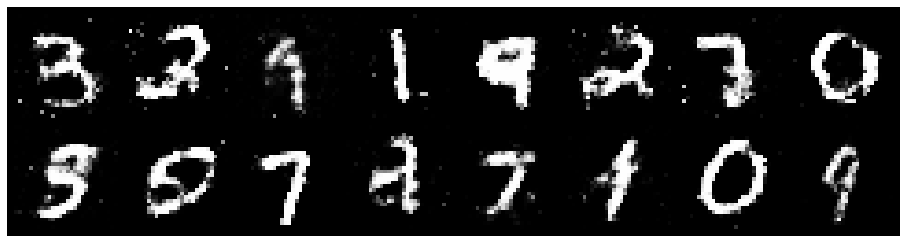

Epoch: [59/100], Batch Num: [400/600]
Discriminator Loss: 1.1238, Generator Loss: 1.0283
D(x): 0.6056, D(G(z)): 0.4017


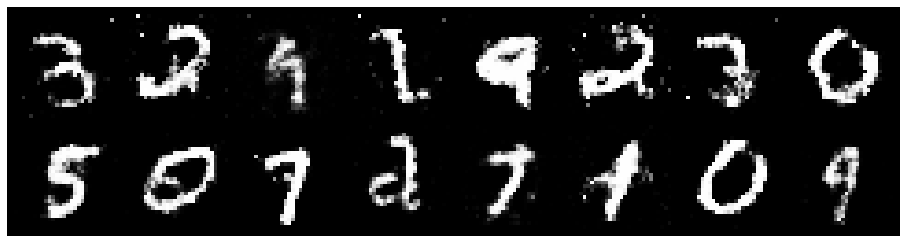

Epoch: [59/100], Batch Num: [500/600]
Discriminator Loss: 1.1170, Generator Loss: 0.9621
D(x): 0.6213, D(G(z)): 0.4066


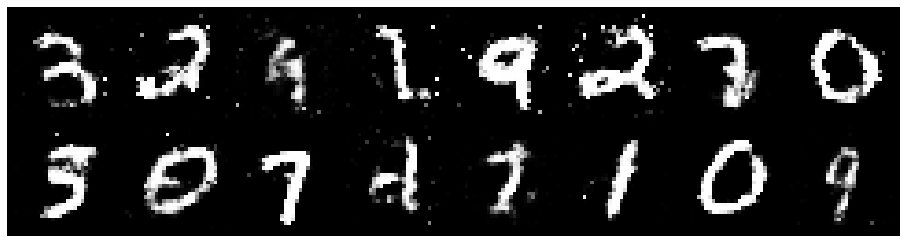

Epoch: [60/100], Batch Num: [0/600]
Discriminator Loss: 1.2037, Generator Loss: 1.1343
D(x): 0.5380, D(G(z)): 0.3830


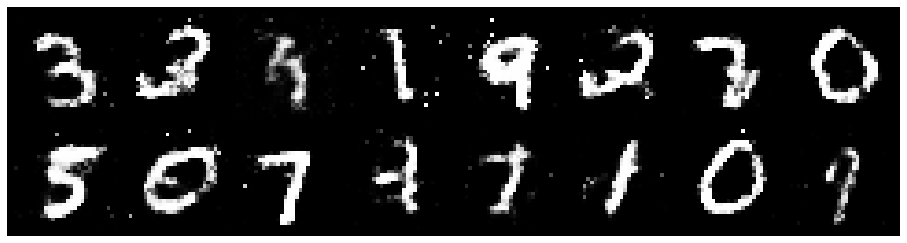

Epoch: [60/100], Batch Num: [100/600]
Discriminator Loss: 1.1059, Generator Loss: 1.0050
D(x): 0.5648, D(G(z)): 0.3584


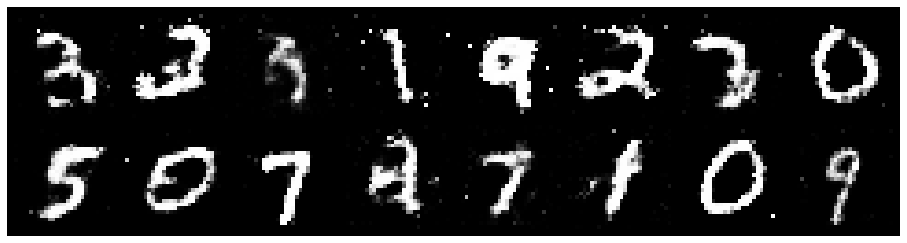

Epoch: [60/100], Batch Num: [200/600]
Discriminator Loss: 1.2292, Generator Loss: 1.0039
D(x): 0.5779, D(G(z)): 0.4055


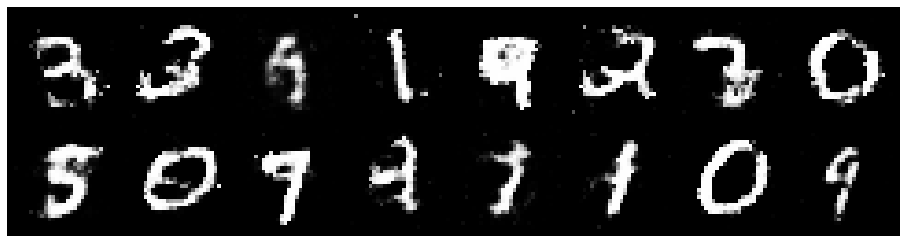

Epoch: [60/100], Batch Num: [300/600]
Discriminator Loss: 1.2917, Generator Loss: 0.9974
D(x): 0.5665, D(G(z)): 0.4262


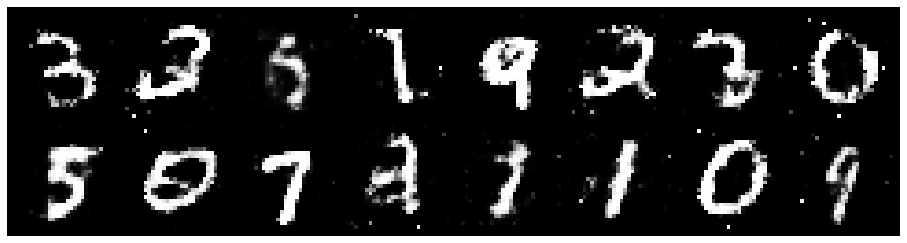

Epoch: [60/100], Batch Num: [400/600]
Discriminator Loss: 1.1901, Generator Loss: 1.0656
D(x): 0.5840, D(G(z)): 0.4077


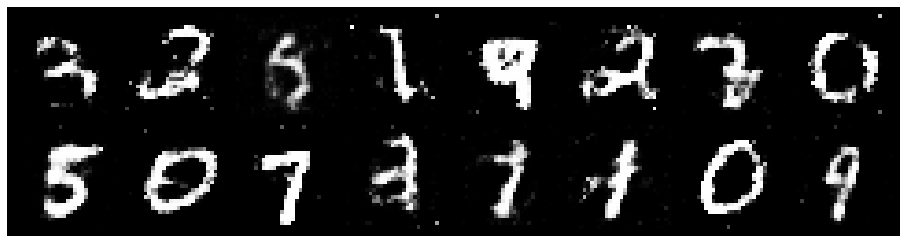

Epoch: [60/100], Batch Num: [500/600]
Discriminator Loss: 1.1741, Generator Loss: 1.0069
D(x): 0.5880, D(G(z)): 0.3946


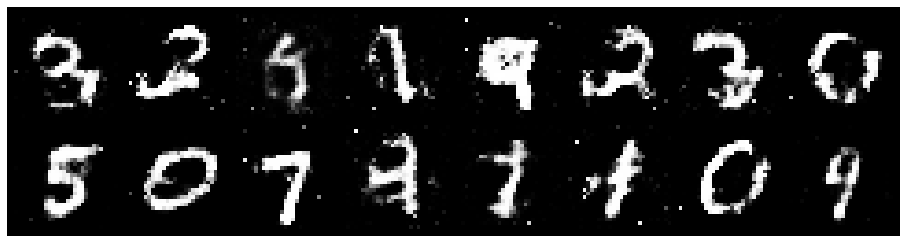

Epoch: [61/100], Batch Num: [0/600]
Discriminator Loss: 1.1806, Generator Loss: 0.9216
D(x): 0.5994, D(G(z)): 0.4180


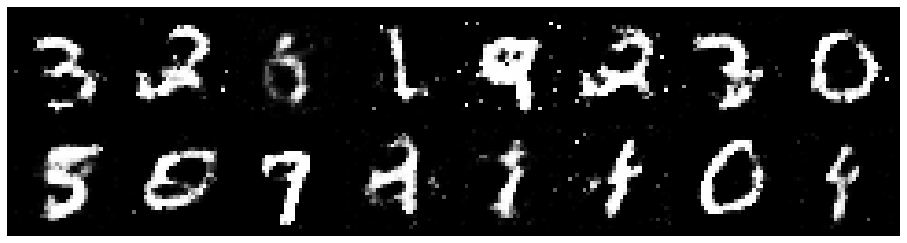

Epoch: [61/100], Batch Num: [100/600]
Discriminator Loss: 1.2435, Generator Loss: 0.8119
D(x): 0.5647, D(G(z)): 0.4329


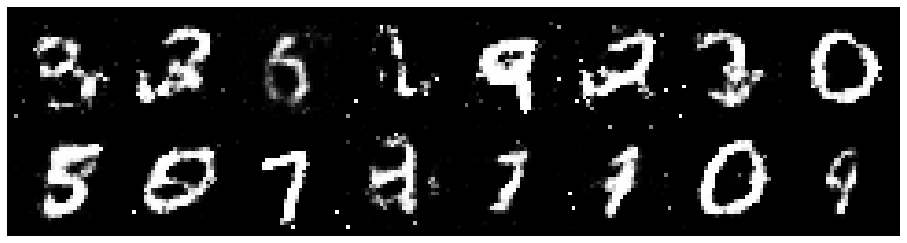

Epoch: [61/100], Batch Num: [200/600]
Discriminator Loss: 1.2780, Generator Loss: 0.8078
D(x): 0.5986, D(G(z)): 0.4855


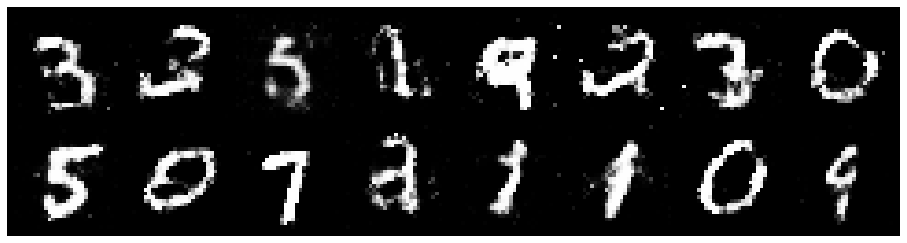

Epoch: [61/100], Batch Num: [300/600]
Discriminator Loss: 1.2565, Generator Loss: 0.9031
D(x): 0.6151, D(G(z)): 0.4659


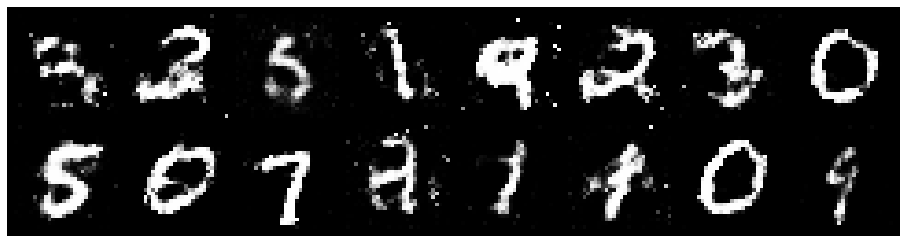

Epoch: [61/100], Batch Num: [400/600]
Discriminator Loss: 1.2300, Generator Loss: 0.9736
D(x): 0.5748, D(G(z)): 0.4189


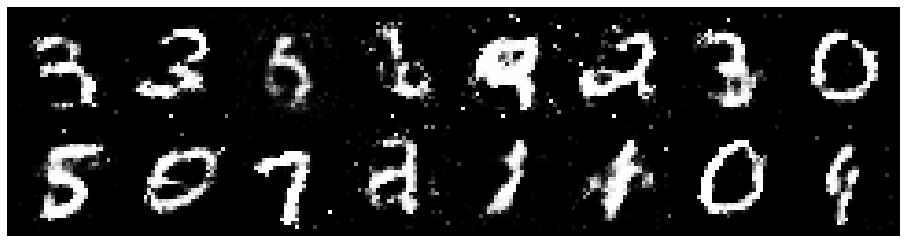

Epoch: [61/100], Batch Num: [500/600]
Discriminator Loss: 1.3281, Generator Loss: 0.9418
D(x): 0.5527, D(G(z)): 0.4547


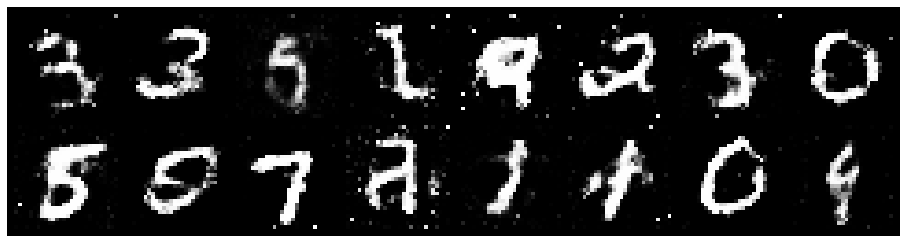

Epoch: [62/100], Batch Num: [0/600]
Discriminator Loss: 1.2204, Generator Loss: 0.9814
D(x): 0.5874, D(G(z)): 0.4219


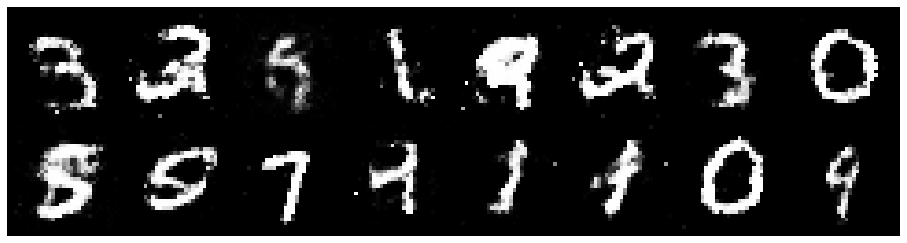

Epoch: [62/100], Batch Num: [100/600]
Discriminator Loss: 1.2368, Generator Loss: 0.8919
D(x): 0.5824, D(G(z)): 0.4436


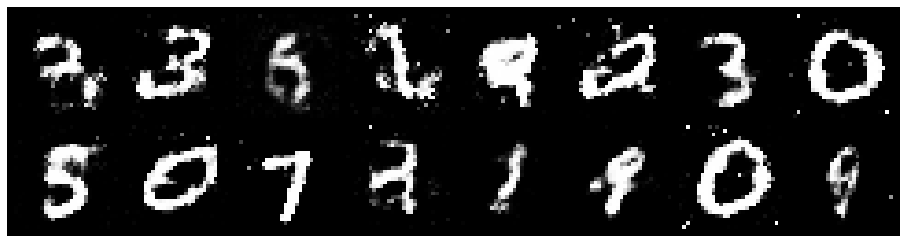

Epoch: [62/100], Batch Num: [200/600]
Discriminator Loss: 1.2974, Generator Loss: 0.9185
D(x): 0.5872, D(G(z)): 0.4595


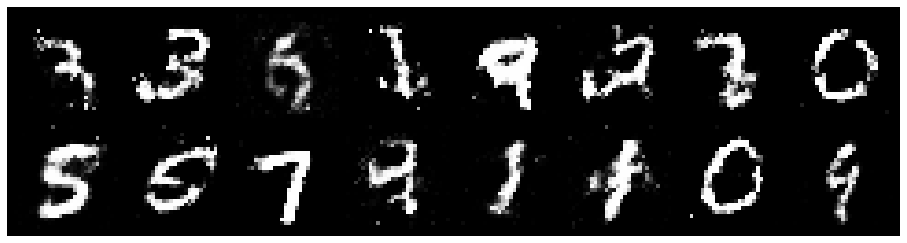

Epoch: [62/100], Batch Num: [300/600]
Discriminator Loss: 1.0882, Generator Loss: 1.2457
D(x): 0.6430, D(G(z)): 0.3836


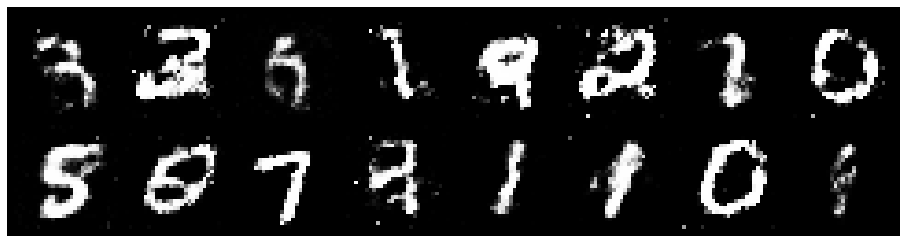

Epoch: [62/100], Batch Num: [400/600]
Discriminator Loss: 1.3196, Generator Loss: 0.8383
D(x): 0.6207, D(G(z)): 0.5012


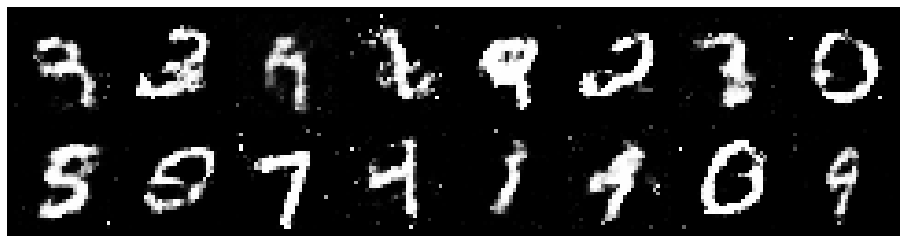

Epoch: [62/100], Batch Num: [500/600]
Discriminator Loss: 1.3187, Generator Loss: 0.9400
D(x): 0.5934, D(G(z)): 0.4730


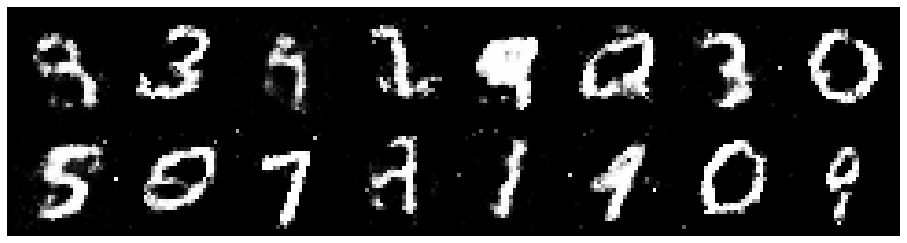

Epoch: [63/100], Batch Num: [0/600]
Discriminator Loss: 1.2494, Generator Loss: 0.8728
D(x): 0.5655, D(G(z)): 0.4438


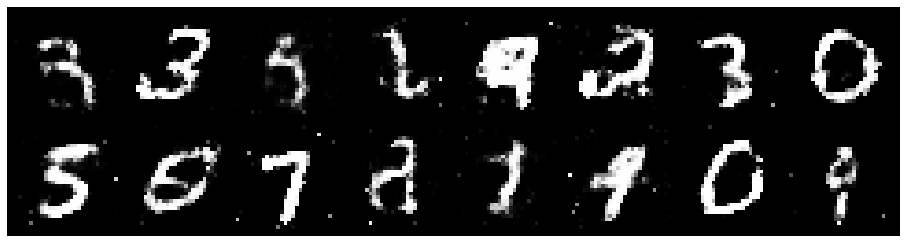

Epoch: [63/100], Batch Num: [100/600]
Discriminator Loss: 1.2223, Generator Loss: 0.9514
D(x): 0.5462, D(G(z)): 0.4107


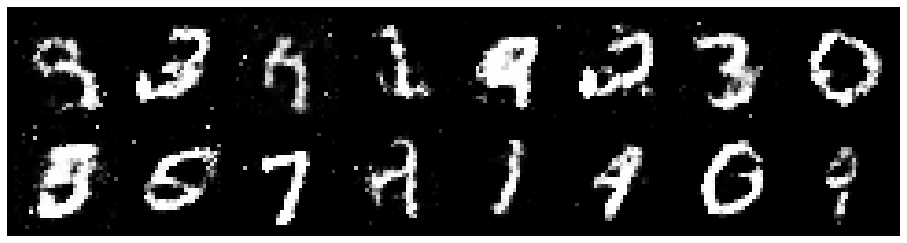

Epoch: [63/100], Batch Num: [200/600]
Discriminator Loss: 1.1590, Generator Loss: 0.9249
D(x): 0.5859, D(G(z)): 0.4197


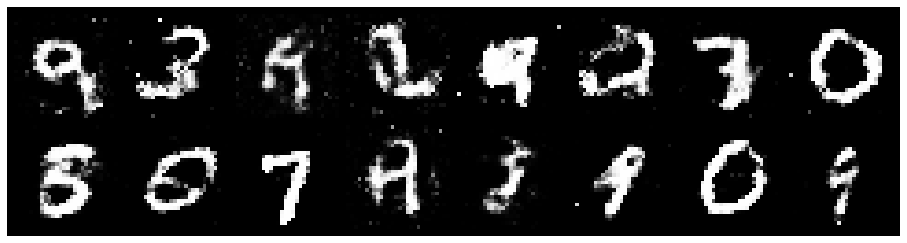

Epoch: [63/100], Batch Num: [300/600]
Discriminator Loss: 1.1865, Generator Loss: 0.8679
D(x): 0.5726, D(G(z)): 0.4365


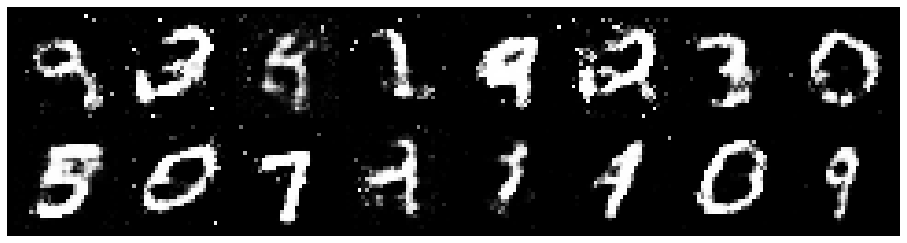

Epoch: [63/100], Batch Num: [400/600]
Discriminator Loss: 1.2307, Generator Loss: 0.8759
D(x): 0.5828, D(G(z)): 0.4372


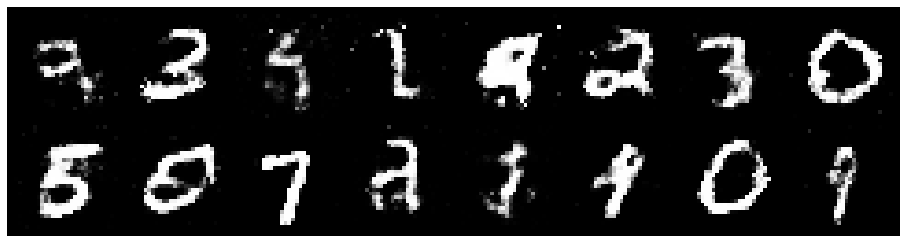

Epoch: [63/100], Batch Num: [500/600]
Discriminator Loss: 1.3092, Generator Loss: 0.7848
D(x): 0.6215, D(G(z)): 0.5059


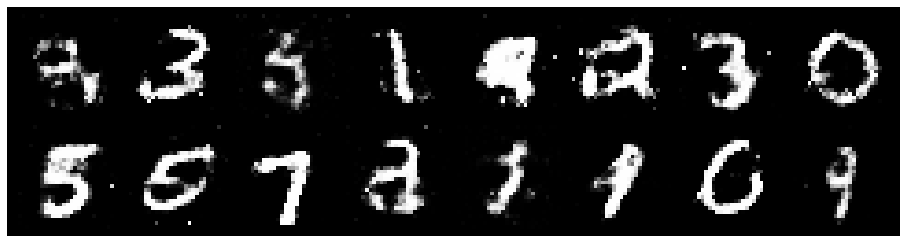

Epoch: [64/100], Batch Num: [0/600]
Discriminator Loss: 1.3052, Generator Loss: 0.9072
D(x): 0.6186, D(G(z)): 0.4849


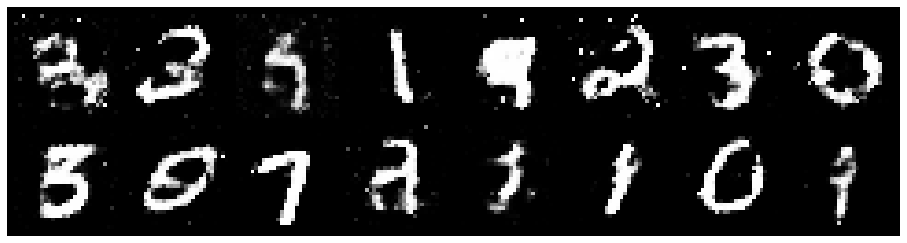

Epoch: [64/100], Batch Num: [100/600]
Discriminator Loss: 1.2625, Generator Loss: 0.9390
D(x): 0.6026, D(G(z)): 0.4478


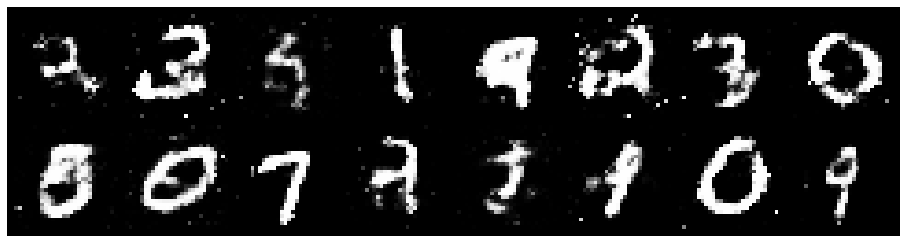

Epoch: [64/100], Batch Num: [200/600]
Discriminator Loss: 1.2123, Generator Loss: 0.9716
D(x): 0.5619, D(G(z)): 0.3953


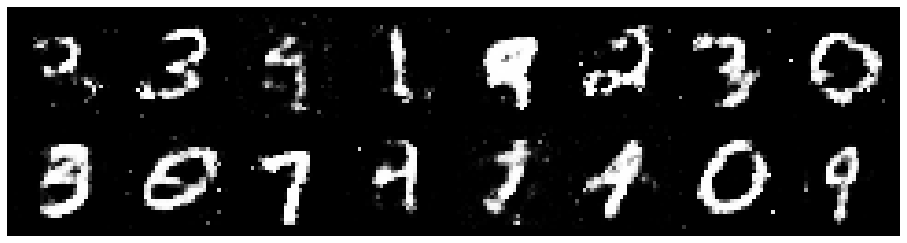

Epoch: [64/100], Batch Num: [300/600]
Discriminator Loss: 1.1870, Generator Loss: 0.8525
D(x): 0.6055, D(G(z)): 0.4219


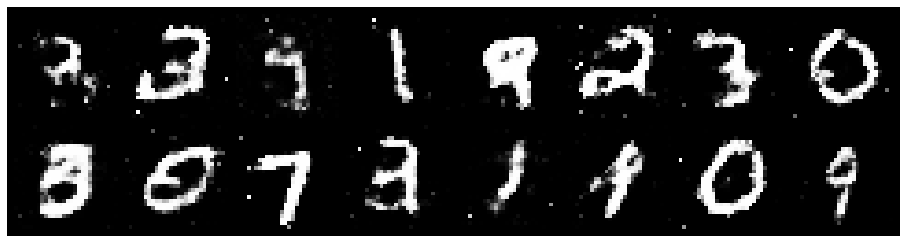

Epoch: [64/100], Batch Num: [400/600]
Discriminator Loss: 1.1506, Generator Loss: 1.0585
D(x): 0.6289, D(G(z)): 0.4087


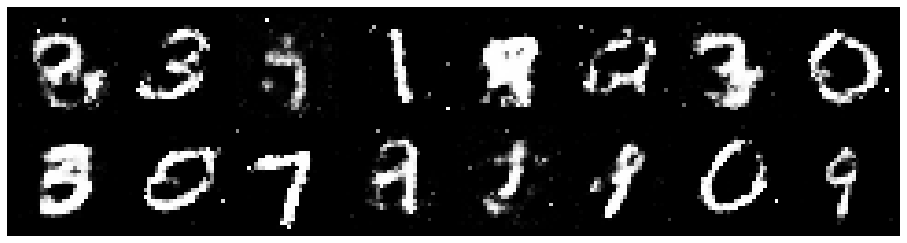

Epoch: [64/100], Batch Num: [500/600]
Discriminator Loss: 1.1946, Generator Loss: 1.1446
D(x): 0.5914, D(G(z)): 0.4090


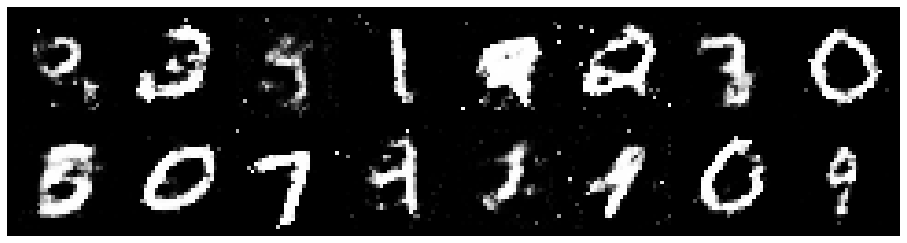

Epoch: [65/100], Batch Num: [0/600]
Discriminator Loss: 1.2952, Generator Loss: 0.9583
D(x): 0.5511, D(G(z)): 0.4451


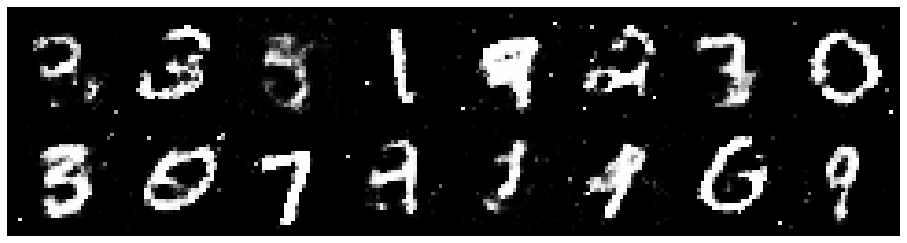

Epoch: [65/100], Batch Num: [100/600]
Discriminator Loss: 1.2072, Generator Loss: 0.8343
D(x): 0.6267, D(G(z)): 0.4418


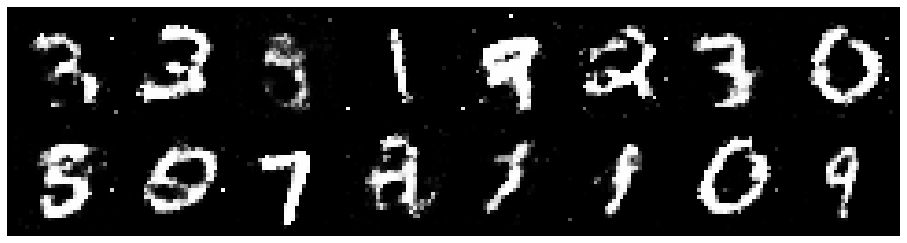

Epoch: [65/100], Batch Num: [200/600]
Discriminator Loss: 1.1815, Generator Loss: 1.0017
D(x): 0.5930, D(G(z)): 0.4149


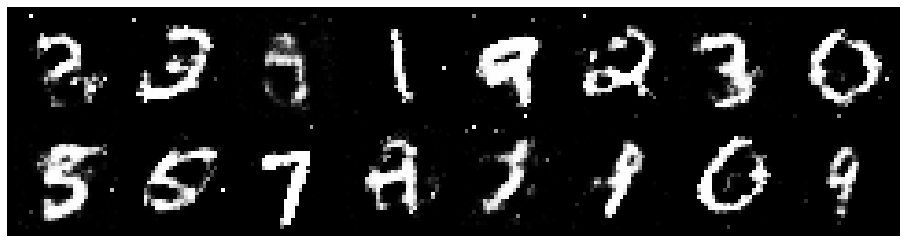

Epoch: [65/100], Batch Num: [300/600]
Discriminator Loss: 1.2862, Generator Loss: 0.8149
D(x): 0.5844, D(G(z)): 0.4759


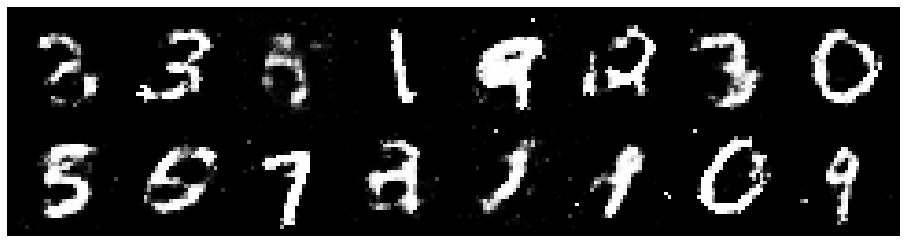

Epoch: [65/100], Batch Num: [400/600]
Discriminator Loss: 1.1495, Generator Loss: 0.9520
D(x): 0.6387, D(G(z)): 0.4461


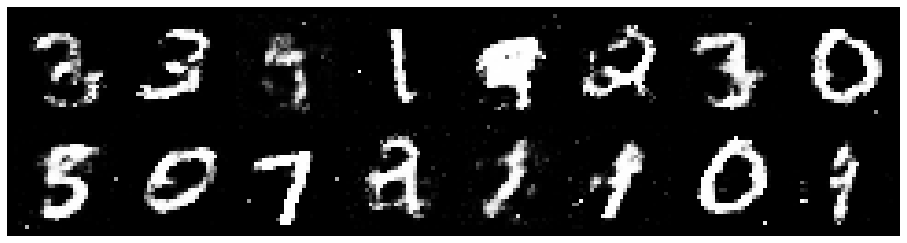

Epoch: [65/100], Batch Num: [500/600]
Discriminator Loss: 1.1962, Generator Loss: 1.0376
D(x): 0.5852, D(G(z)): 0.4196


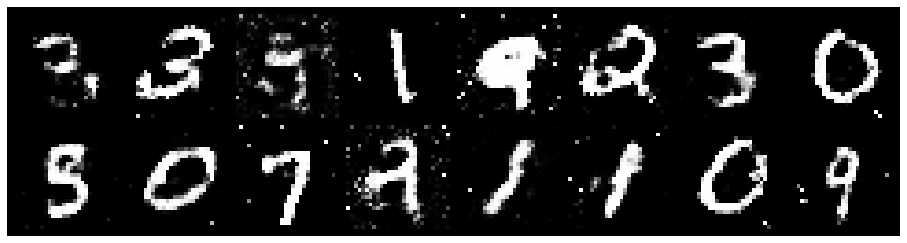

Epoch: [66/100], Batch Num: [0/600]
Discriminator Loss: 1.2576, Generator Loss: 1.1234
D(x): 0.5667, D(G(z)): 0.4153


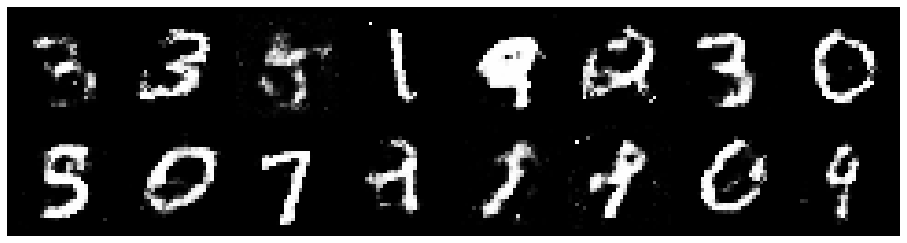

Epoch: [66/100], Batch Num: [100/600]
Discriminator Loss: 1.1859, Generator Loss: 0.9474
D(x): 0.5977, D(G(z)): 0.4532


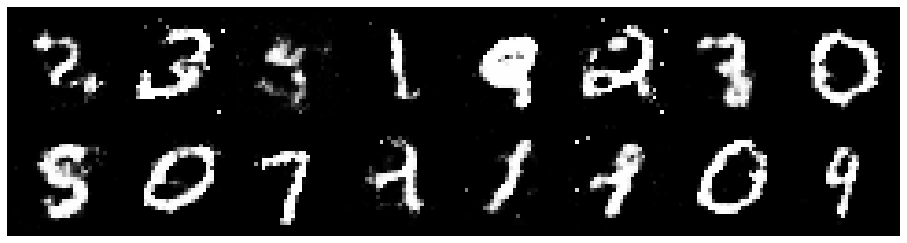

Epoch: [66/100], Batch Num: [200/600]
Discriminator Loss: 1.1622, Generator Loss: 0.8234
D(x): 0.5879, D(G(z)): 0.4288


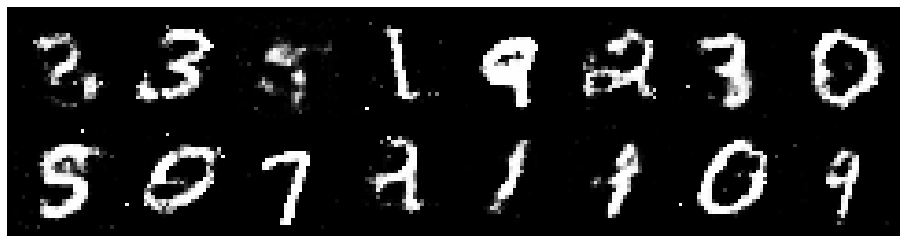

Epoch: [66/100], Batch Num: [300/600]
Discriminator Loss: 1.2839, Generator Loss: 0.8868
D(x): 0.5572, D(G(z)): 0.4271


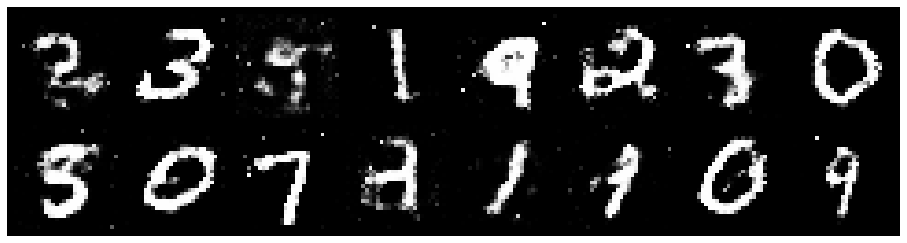

Epoch: [66/100], Batch Num: [400/600]
Discriminator Loss: 1.1563, Generator Loss: 0.9888
D(x): 0.6131, D(G(z)): 0.4221


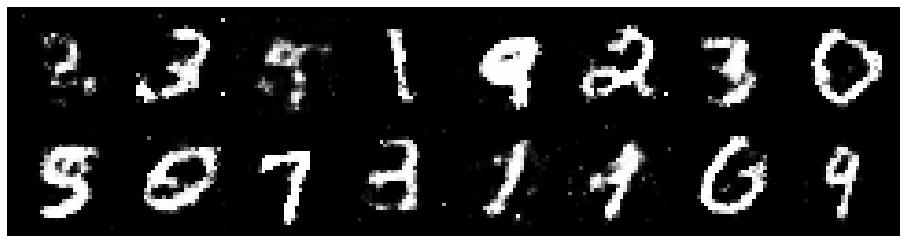

Epoch: [66/100], Batch Num: [500/600]
Discriminator Loss: 1.1780, Generator Loss: 0.9152
D(x): 0.6217, D(G(z)): 0.4578


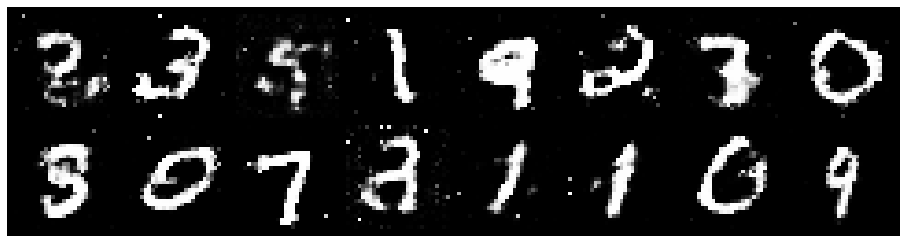

Epoch: [67/100], Batch Num: [0/600]
Discriminator Loss: 1.1792, Generator Loss: 0.9509
D(x): 0.5978, D(G(z)): 0.4062


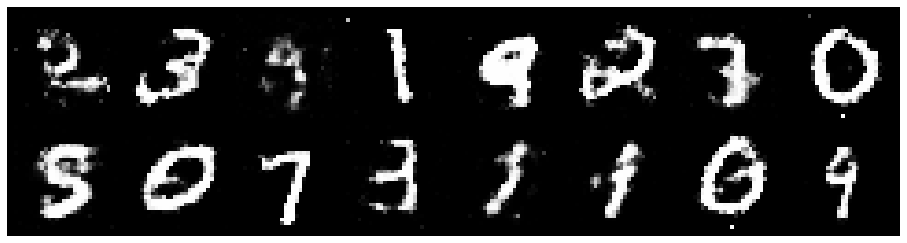

Epoch: [67/100], Batch Num: [100/600]
Discriminator Loss: 1.1964, Generator Loss: 0.9146
D(x): 0.5937, D(G(z)): 0.4237


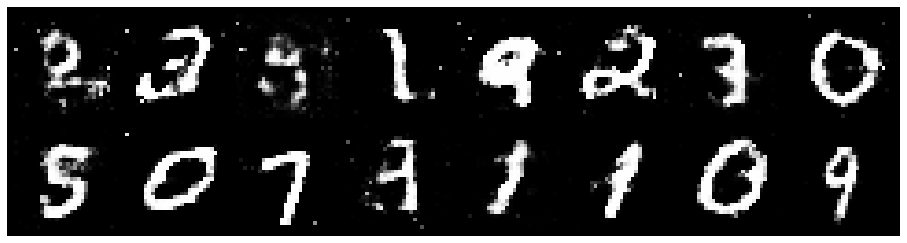

Epoch: [67/100], Batch Num: [200/600]
Discriminator Loss: 1.3233, Generator Loss: 0.9717
D(x): 0.5994, D(G(z)): 0.4451


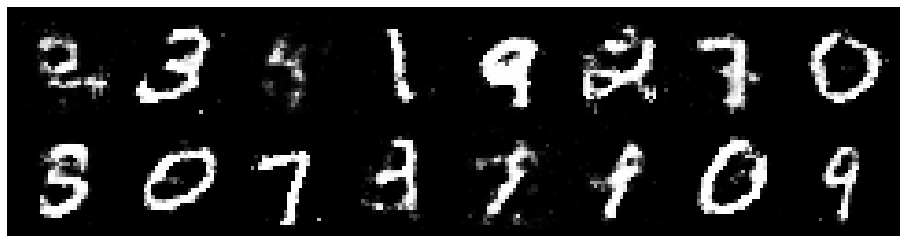

Epoch: [67/100], Batch Num: [300/600]
Discriminator Loss: 1.1924, Generator Loss: 0.9426
D(x): 0.5812, D(G(z)): 0.4126


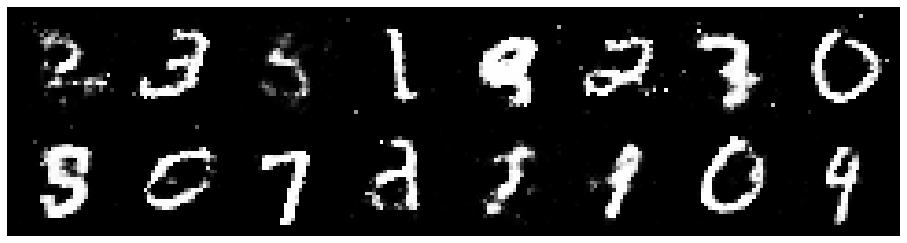

Epoch: [67/100], Batch Num: [400/600]
Discriminator Loss: 1.3484, Generator Loss: 0.8705
D(x): 0.5357, D(G(z)): 0.4486


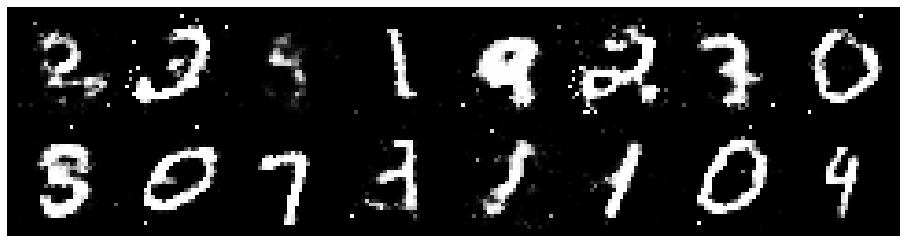

Epoch: [67/100], Batch Num: [500/600]
Discriminator Loss: 1.1454, Generator Loss: 0.9521
D(x): 0.6138, D(G(z)): 0.4085


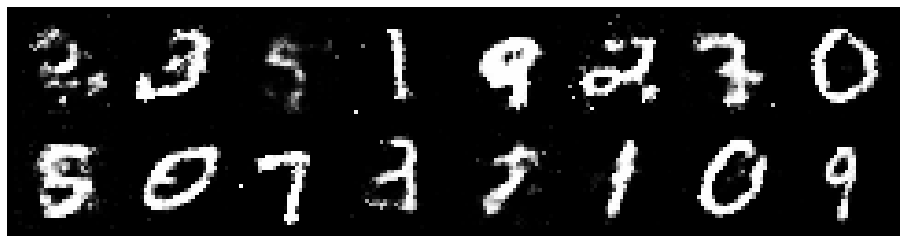

Epoch: [68/100], Batch Num: [0/600]
Discriminator Loss: 1.1913, Generator Loss: 0.9177
D(x): 0.5974, D(G(z)): 0.4493


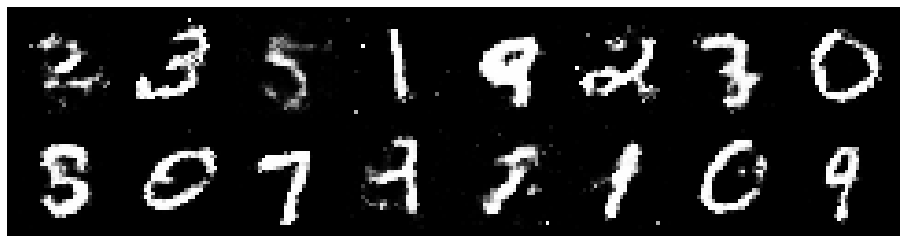

Epoch: [68/100], Batch Num: [100/600]
Discriminator Loss: 1.2615, Generator Loss: 0.8253
D(x): 0.5481, D(G(z)): 0.4357


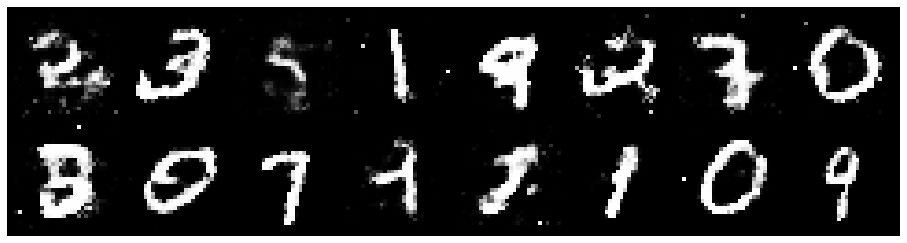

Epoch: [68/100], Batch Num: [200/600]
Discriminator Loss: 1.2024, Generator Loss: 0.8695
D(x): 0.5717, D(G(z)): 0.4272


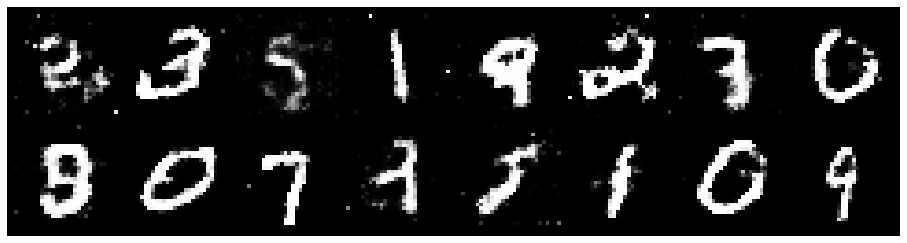

Epoch: [68/100], Batch Num: [300/600]
Discriminator Loss: 1.3266, Generator Loss: 0.8722
D(x): 0.5140, D(G(z)): 0.4304


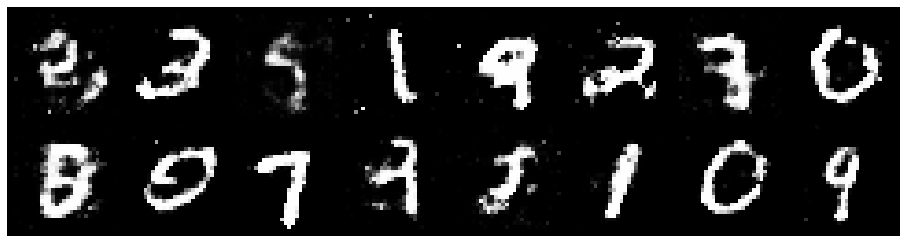

Epoch: [68/100], Batch Num: [400/600]
Discriminator Loss: 1.1948, Generator Loss: 0.8394
D(x): 0.6411, D(G(z)): 0.4618


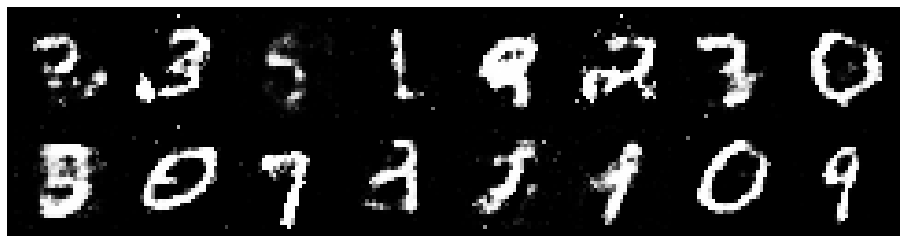

Epoch: [68/100], Batch Num: [500/600]
Discriminator Loss: 1.3205, Generator Loss: 0.9534
D(x): 0.5738, D(G(z)): 0.4563


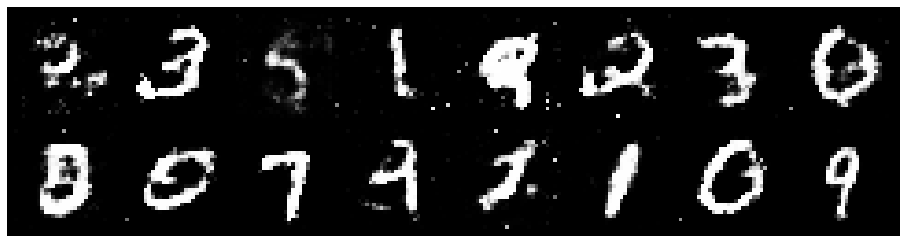

Epoch: [69/100], Batch Num: [0/600]
Discriminator Loss: 1.2068, Generator Loss: 0.8745
D(x): 0.6227, D(G(z)): 0.4546


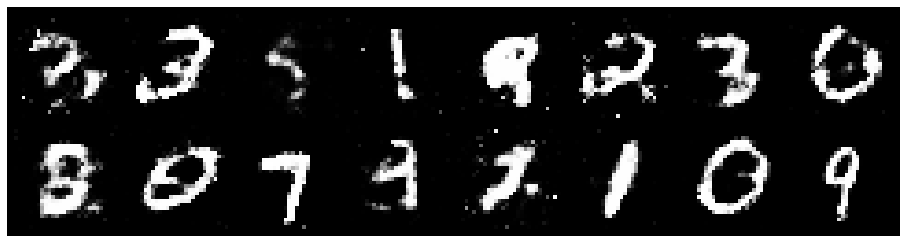

Epoch: [69/100], Batch Num: [100/600]
Discriminator Loss: 1.3557, Generator Loss: 1.0439
D(x): 0.6094, D(G(z)): 0.4866


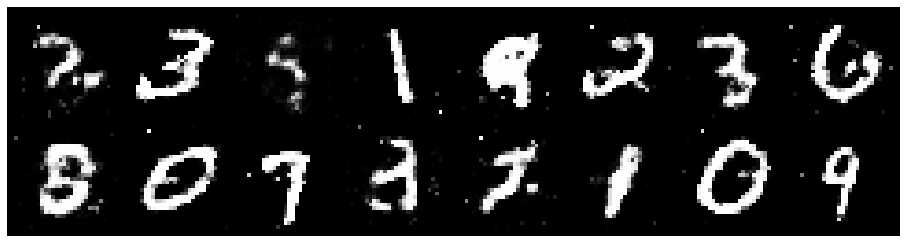

Epoch: [69/100], Batch Num: [200/600]
Discriminator Loss: 1.2470, Generator Loss: 1.3741
D(x): 0.5787, D(G(z)): 0.4087


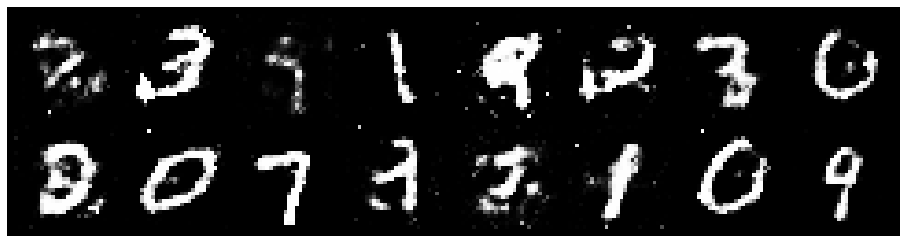

Epoch: [69/100], Batch Num: [300/600]
Discriminator Loss: 1.2871, Generator Loss: 1.1256
D(x): 0.5721, D(G(z)): 0.4024


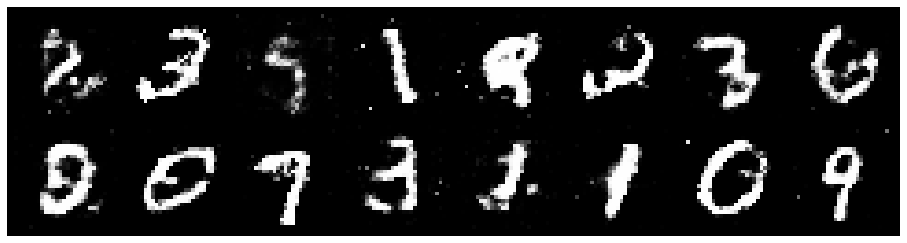

Epoch: [69/100], Batch Num: [400/600]
Discriminator Loss: 1.1249, Generator Loss: 1.1740
D(x): 0.6225, D(G(z)): 0.3989


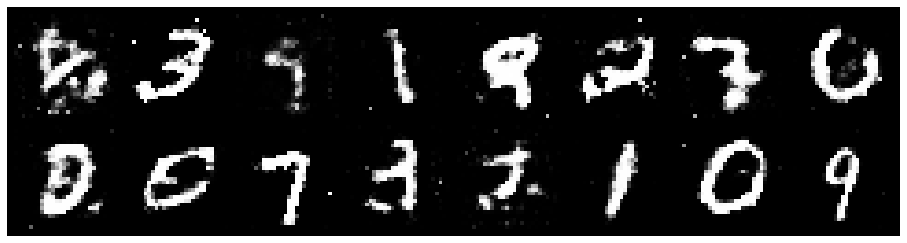

Epoch: [69/100], Batch Num: [500/600]
Discriminator Loss: 1.2648, Generator Loss: 0.8524
D(x): 0.5576, D(G(z)): 0.4325


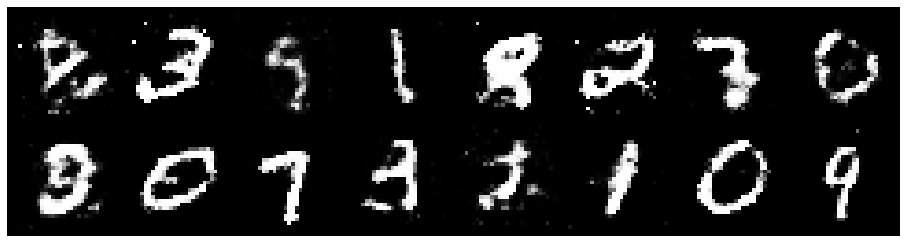

Epoch: [70/100], Batch Num: [0/600]
Discriminator Loss: 1.1931, Generator Loss: 0.9024
D(x): 0.5631, D(G(z)): 0.3951


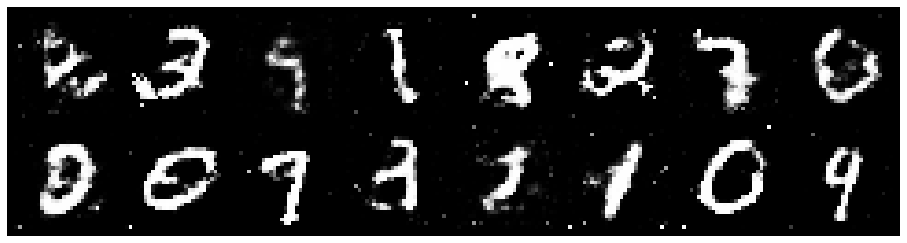

Epoch: [70/100], Batch Num: [100/600]
Discriminator Loss: 1.2601, Generator Loss: 0.8668
D(x): 0.5490, D(G(z)): 0.4217


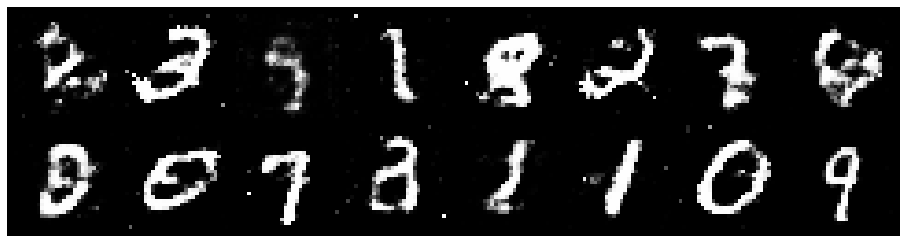

Epoch: [70/100], Batch Num: [200/600]
Discriminator Loss: 1.1792, Generator Loss: 1.0277
D(x): 0.6167, D(G(z)): 0.4316


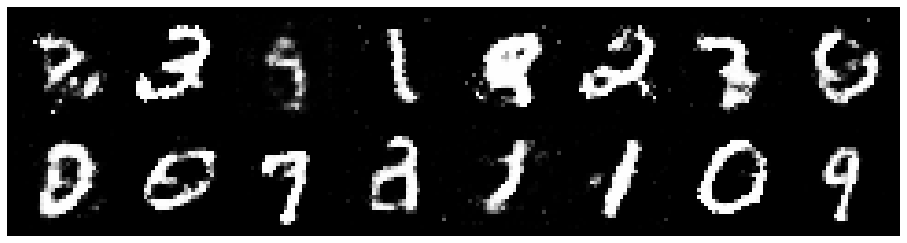

Epoch: [70/100], Batch Num: [300/600]
Discriminator Loss: 1.1110, Generator Loss: 1.1582
D(x): 0.5522, D(G(z)): 0.3299


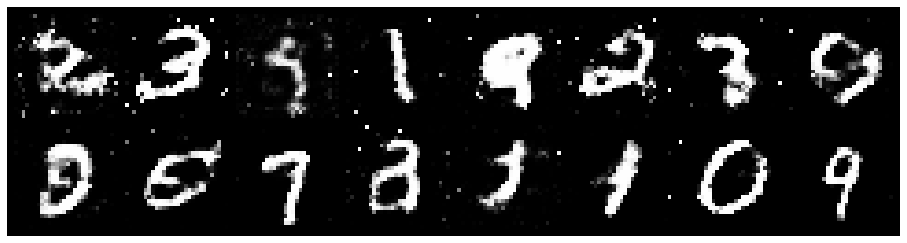

Epoch: [70/100], Batch Num: [400/600]
Discriminator Loss: 1.1678, Generator Loss: 1.0087
D(x): 0.5841, D(G(z)): 0.3933


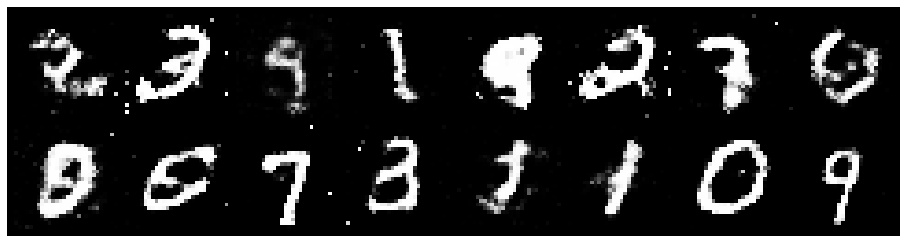

Epoch: [70/100], Batch Num: [500/600]
Discriminator Loss: 1.1062, Generator Loss: 1.2132
D(x): 0.6277, D(G(z)): 0.4181


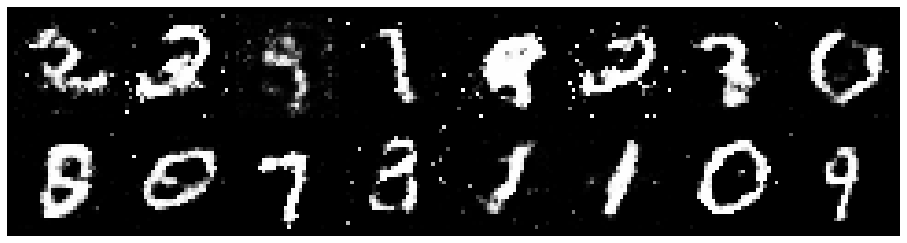

Epoch: [71/100], Batch Num: [0/600]
Discriminator Loss: 1.2132, Generator Loss: 0.9650
D(x): 0.5454, D(G(z)): 0.3866


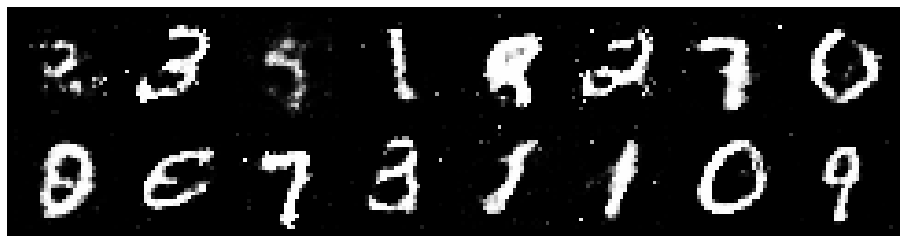

Epoch: [71/100], Batch Num: [100/600]
Discriminator Loss: 1.1818, Generator Loss: 1.0083
D(x): 0.6080, D(G(z)): 0.4246


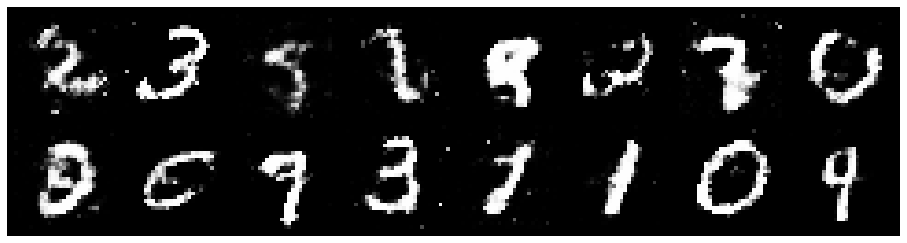

Epoch: [71/100], Batch Num: [200/600]
Discriminator Loss: 1.1427, Generator Loss: 1.0863
D(x): 0.5959, D(G(z)): 0.3968


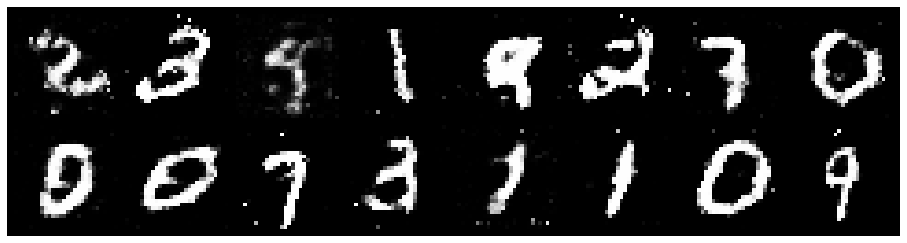

Epoch: [71/100], Batch Num: [300/600]
Discriminator Loss: 1.3141, Generator Loss: 0.8141
D(x): 0.5634, D(G(z)): 0.4521


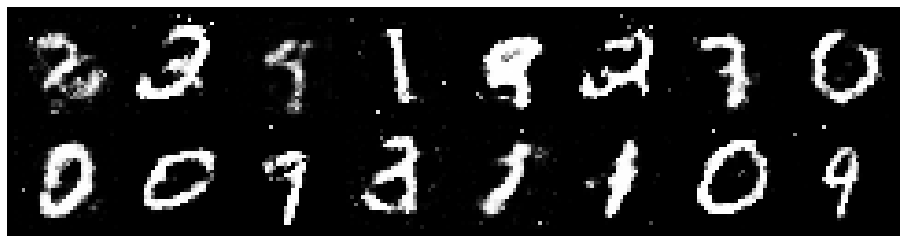

Epoch: [71/100], Batch Num: [400/600]
Discriminator Loss: 1.2848, Generator Loss: 0.9803
D(x): 0.5591, D(G(z)): 0.4229


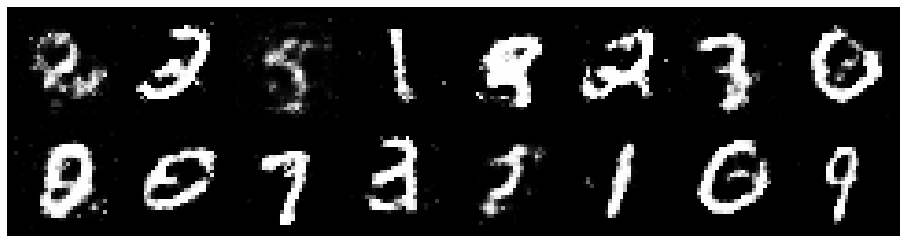

Epoch: [71/100], Batch Num: [500/600]
Discriminator Loss: 1.3247, Generator Loss: 0.9806
D(x): 0.5321, D(G(z)): 0.4462


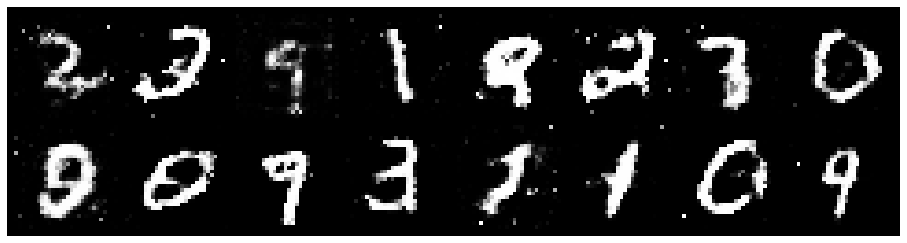

Epoch: [72/100], Batch Num: [0/600]
Discriminator Loss: 1.2382, Generator Loss: 1.0312
D(x): 0.5241, D(G(z)): 0.3915


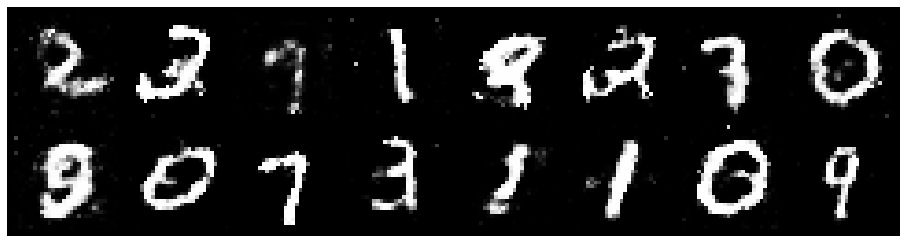

Epoch: [72/100], Batch Num: [100/600]
Discriminator Loss: 1.1341, Generator Loss: 0.8750
D(x): 0.6102, D(G(z)): 0.4297


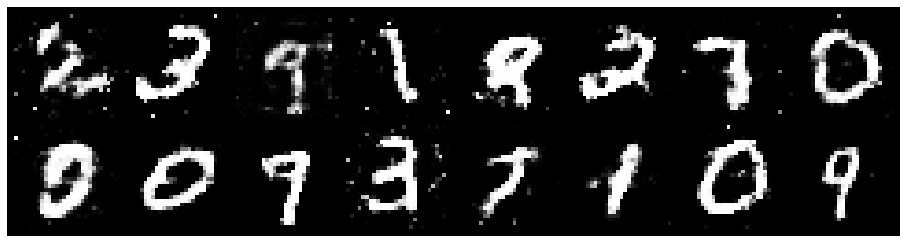

Epoch: [72/100], Batch Num: [200/600]
Discriminator Loss: 1.2010, Generator Loss: 0.9081
D(x): 0.5884, D(G(z)): 0.4130


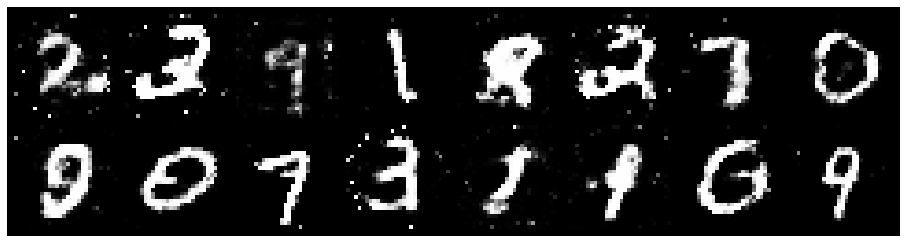

Epoch: [72/100], Batch Num: [300/600]
Discriminator Loss: 1.2271, Generator Loss: 0.9651
D(x): 0.5878, D(G(z)): 0.4548


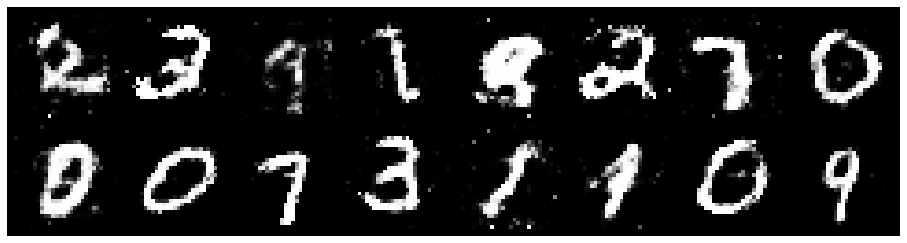

Epoch: [72/100], Batch Num: [400/600]
Discriminator Loss: 1.2577, Generator Loss: 0.7819
D(x): 0.6016, D(G(z)): 0.4703


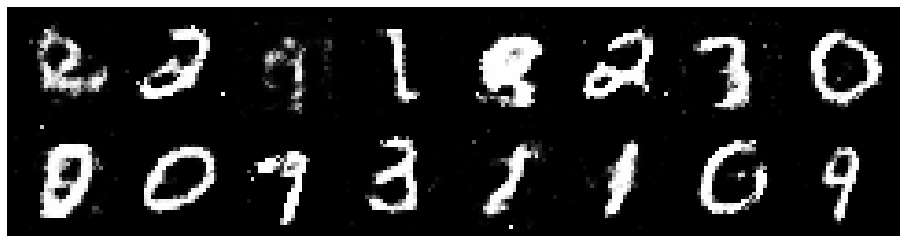

Epoch: [72/100], Batch Num: [500/600]
Discriminator Loss: 1.2778, Generator Loss: 0.8983
D(x): 0.5240, D(G(z)): 0.4148


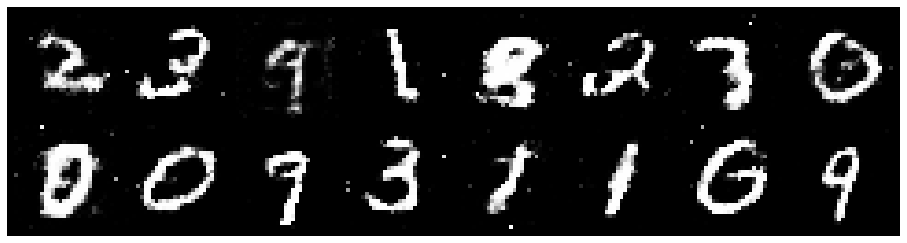

Epoch: [73/100], Batch Num: [0/600]
Discriminator Loss: 1.3149, Generator Loss: 0.9886
D(x): 0.6095, D(G(z)): 0.4706


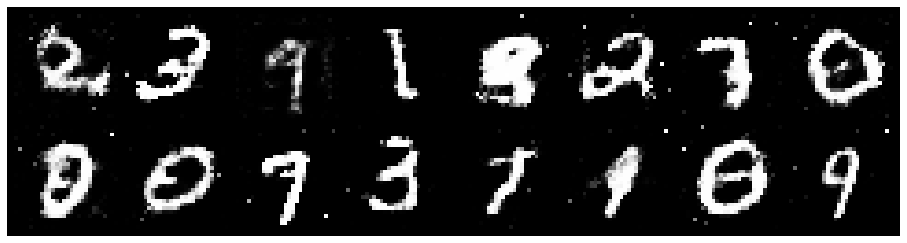

Epoch: [73/100], Batch Num: [100/600]
Discriminator Loss: 1.2216, Generator Loss: 1.1317
D(x): 0.5737, D(G(z)): 0.4114


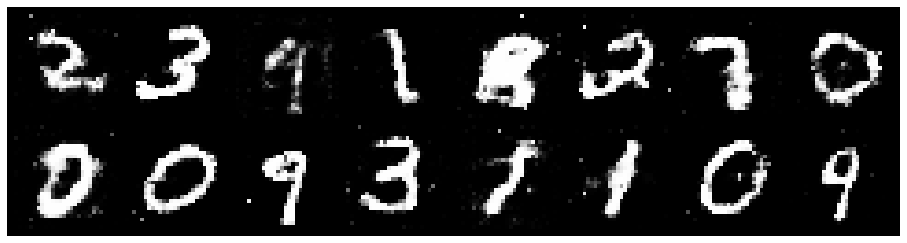

Epoch: [73/100], Batch Num: [200/600]
Discriminator Loss: 1.2444, Generator Loss: 0.9015
D(x): 0.5793, D(G(z)): 0.4372


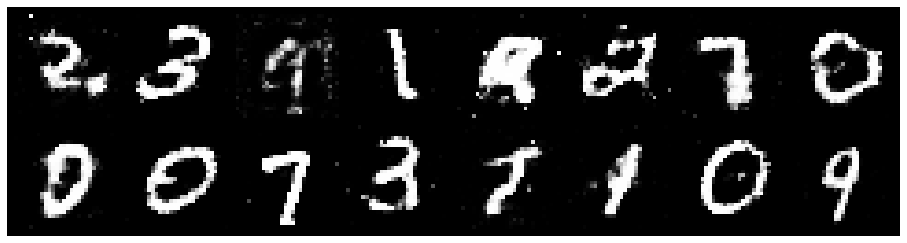

Epoch: [73/100], Batch Num: [300/600]
Discriminator Loss: 1.2649, Generator Loss: 1.0971
D(x): 0.5615, D(G(z)): 0.4255


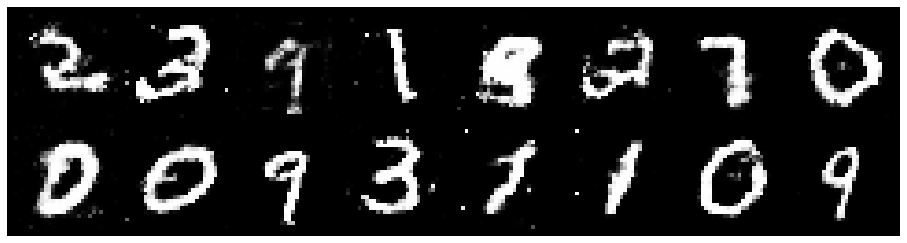

Epoch: [73/100], Batch Num: [400/600]
Discriminator Loss: 1.2114, Generator Loss: 0.8062
D(x): 0.5892, D(G(z)): 0.4518


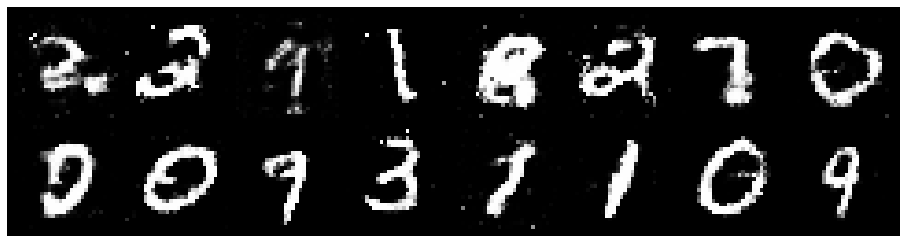

Epoch: [73/100], Batch Num: [500/600]
Discriminator Loss: 1.2022, Generator Loss: 0.8300
D(x): 0.6037, D(G(z)): 0.4578


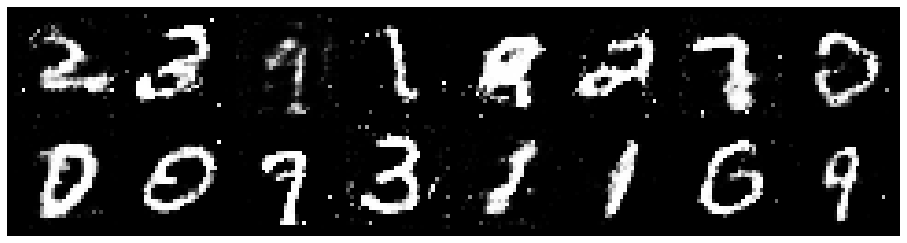

Epoch: [74/100], Batch Num: [0/600]
Discriminator Loss: 1.2411, Generator Loss: 0.8348
D(x): 0.5850, D(G(z)): 0.4556


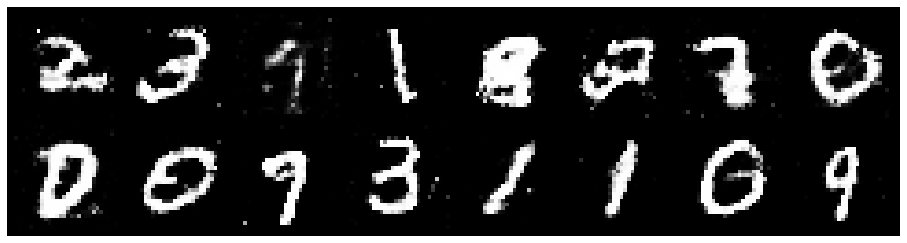

Epoch: [74/100], Batch Num: [100/600]
Discriminator Loss: 1.3443, Generator Loss: 1.0237
D(x): 0.5256, D(G(z)): 0.4342


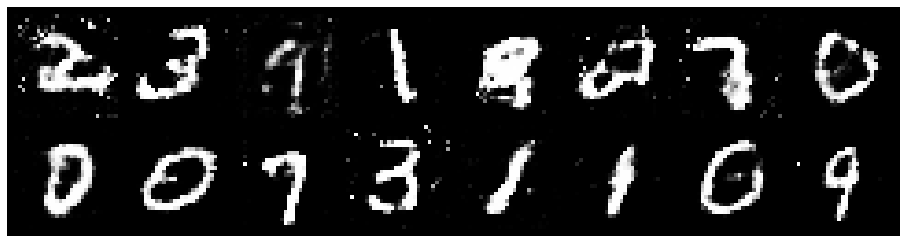

Epoch: [74/100], Batch Num: [200/600]
Discriminator Loss: 1.1791, Generator Loss: 1.0081
D(x): 0.5448, D(G(z)): 0.3705


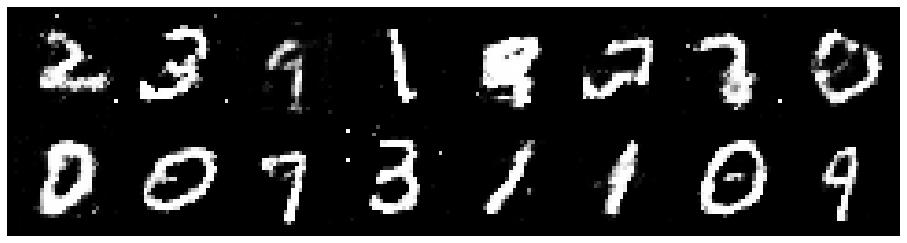

Epoch: [74/100], Batch Num: [300/600]
Discriminator Loss: 1.2348, Generator Loss: 1.0035
D(x): 0.5522, D(G(z)): 0.4049


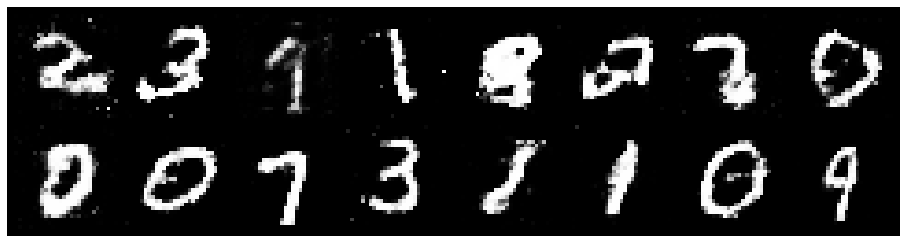

Epoch: [74/100], Batch Num: [400/600]
Discriminator Loss: 1.2620, Generator Loss: 0.7930
D(x): 0.6158, D(G(z)): 0.4713


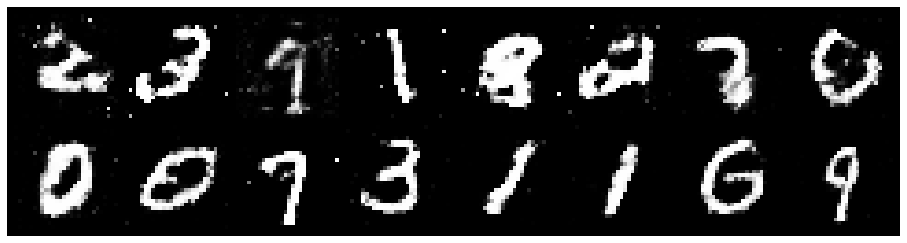

Epoch: [74/100], Batch Num: [500/600]
Discriminator Loss: 1.2398, Generator Loss: 0.8840
D(x): 0.5816, D(G(z)): 0.4412


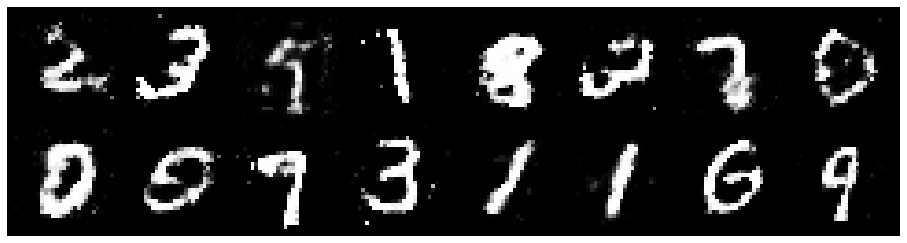

Epoch: [75/100], Batch Num: [0/600]
Discriminator Loss: 1.4573, Generator Loss: 0.8262
D(x): 0.5708, D(G(z)): 0.5119


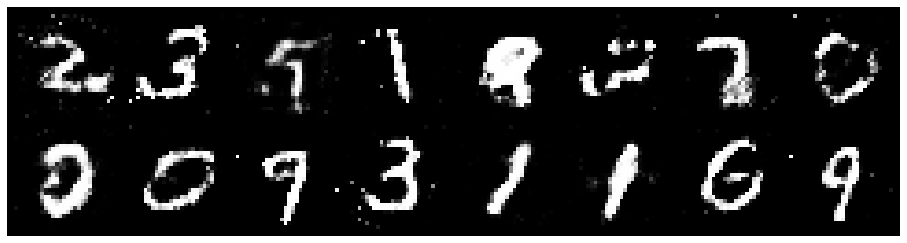

Epoch: [75/100], Batch Num: [100/600]
Discriminator Loss: 1.1573, Generator Loss: 1.0598
D(x): 0.5522, D(G(z)): 0.3602


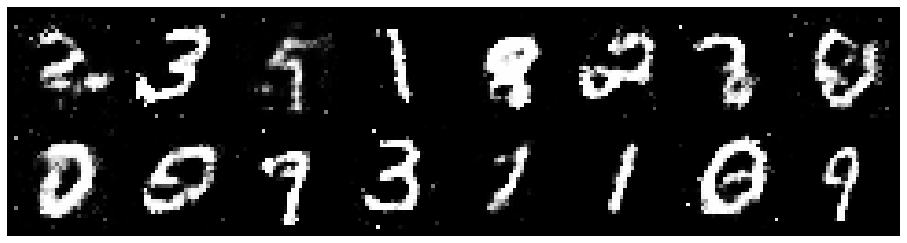

Epoch: [75/100], Batch Num: [200/600]
Discriminator Loss: 1.2641, Generator Loss: 1.0224
D(x): 0.5604, D(G(z)): 0.4173


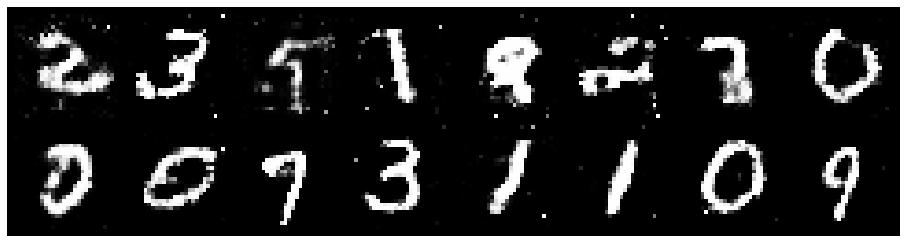

Epoch: [75/100], Batch Num: [300/600]
Discriminator Loss: 1.2305, Generator Loss: 1.0181
D(x): 0.5362, D(G(z)): 0.3984


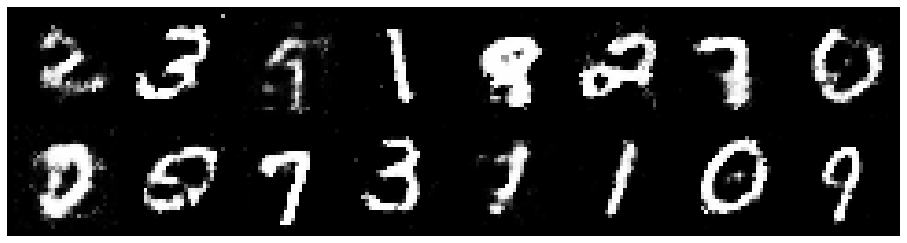

Epoch: [75/100], Batch Num: [400/600]
Discriminator Loss: 1.1878, Generator Loss: 1.1074
D(x): 0.5983, D(G(z)): 0.4059


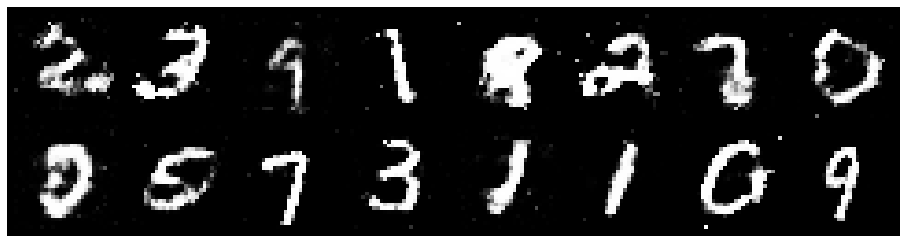

Epoch: [75/100], Batch Num: [500/600]
Discriminator Loss: 1.2166, Generator Loss: 1.1726
D(x): 0.5673, D(G(z)): 0.3980


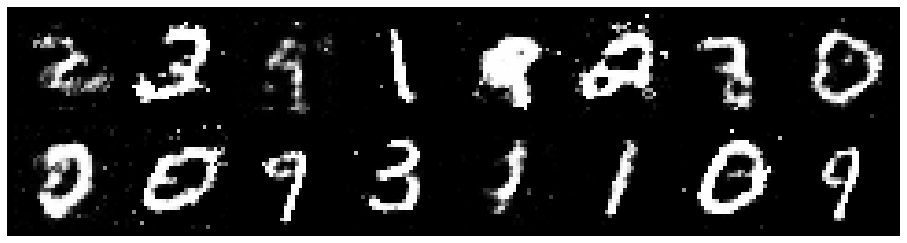

Epoch: [76/100], Batch Num: [0/600]
Discriminator Loss: 1.1105, Generator Loss: 1.0374
D(x): 0.5818, D(G(z)): 0.3682


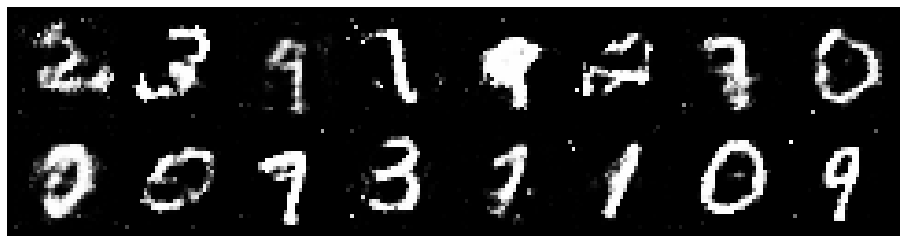

Epoch: [76/100], Batch Num: [100/600]
Discriminator Loss: 1.2450, Generator Loss: 0.8777
D(x): 0.6083, D(G(z)): 0.4498


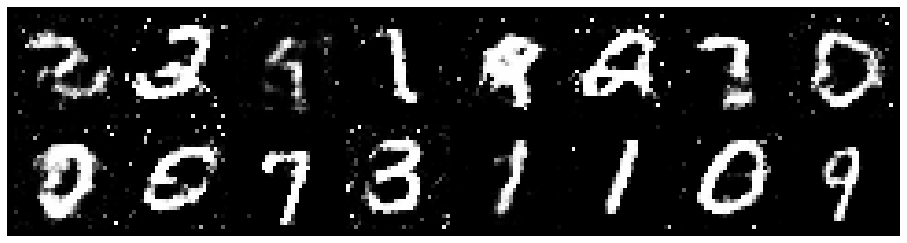

Epoch: [76/100], Batch Num: [200/600]
Discriminator Loss: 1.2956, Generator Loss: 0.8882
D(x): 0.5492, D(G(z)): 0.4508


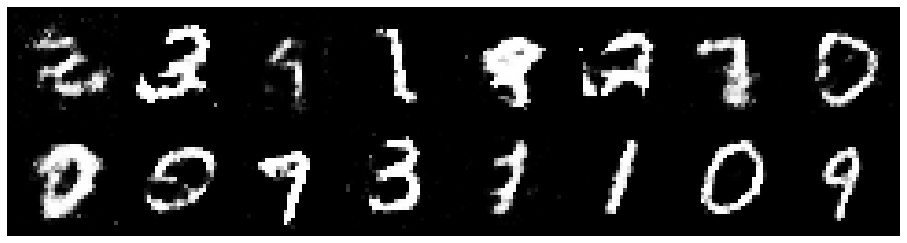

Epoch: [76/100], Batch Num: [300/600]
Discriminator Loss: 1.3192, Generator Loss: 0.7940
D(x): 0.5367, D(G(z)): 0.4517


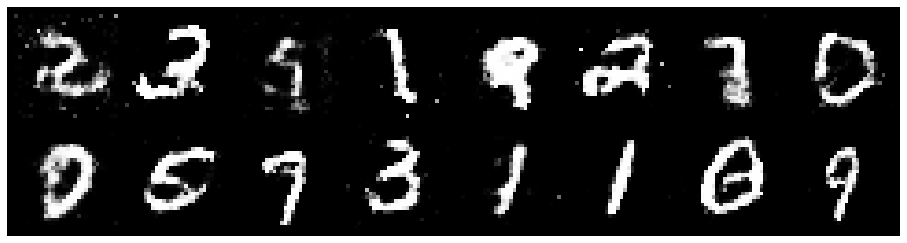

Epoch: [76/100], Batch Num: [400/600]
Discriminator Loss: 1.1469, Generator Loss: 0.8853
D(x): 0.6309, D(G(z)): 0.4320


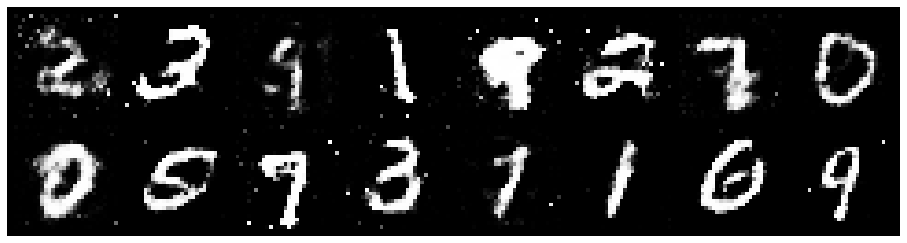

Epoch: [76/100], Batch Num: [500/600]
Discriminator Loss: 1.2615, Generator Loss: 0.9999
D(x): 0.5660, D(G(z)): 0.4281


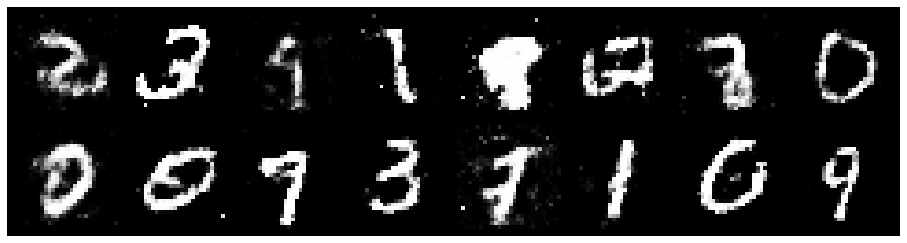

Epoch: [77/100], Batch Num: [0/600]
Discriminator Loss: 1.2003, Generator Loss: 0.8909
D(x): 0.5959, D(G(z)): 0.4380


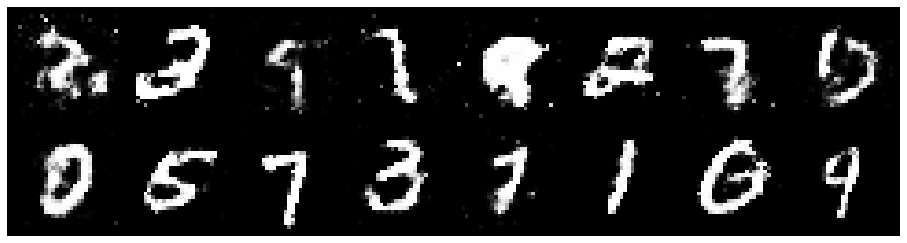

Epoch: [77/100], Batch Num: [100/600]
Discriminator Loss: 1.2010, Generator Loss: 0.8545
D(x): 0.5851, D(G(z)): 0.4377


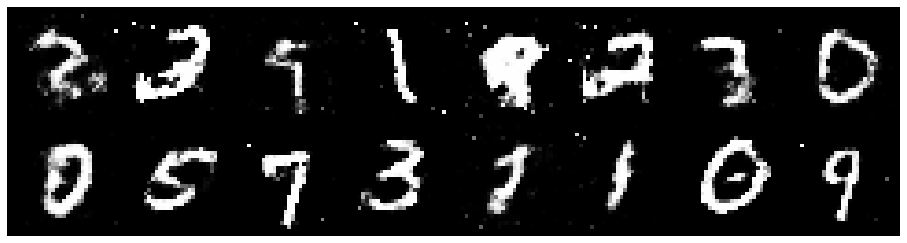

Epoch: [77/100], Batch Num: [200/600]
Discriminator Loss: 1.3066, Generator Loss: 0.9272
D(x): 0.5727, D(G(z)): 0.4575


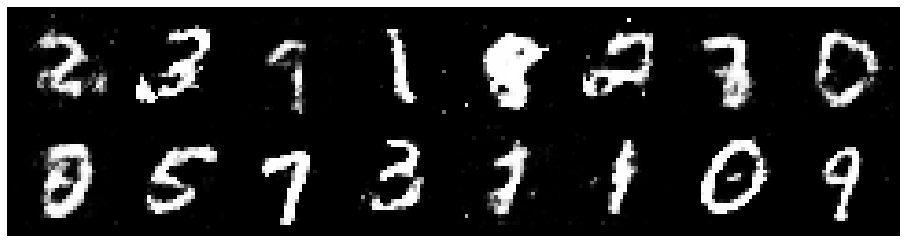

Epoch: [77/100], Batch Num: [300/600]
Discriminator Loss: 1.1507, Generator Loss: 1.1614
D(x): 0.5751, D(G(z)): 0.3761


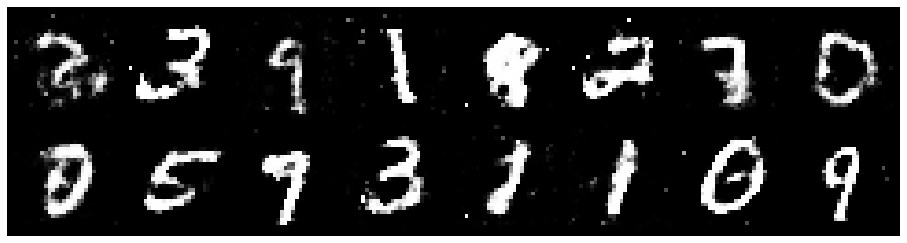

Epoch: [77/100], Batch Num: [400/600]
Discriminator Loss: 1.2628, Generator Loss: 1.1923
D(x): 0.5347, D(G(z)): 0.4015


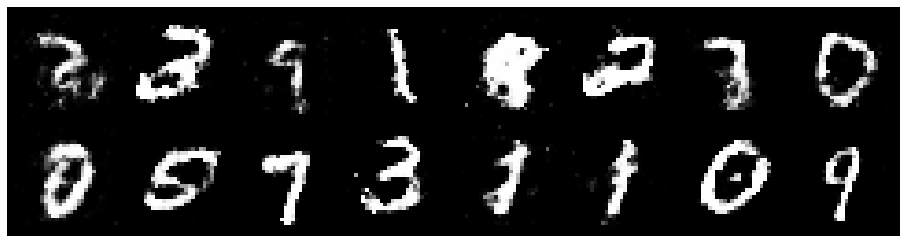

Epoch: [77/100], Batch Num: [500/600]
Discriminator Loss: 1.0923, Generator Loss: 1.0676
D(x): 0.6377, D(G(z)): 0.4059


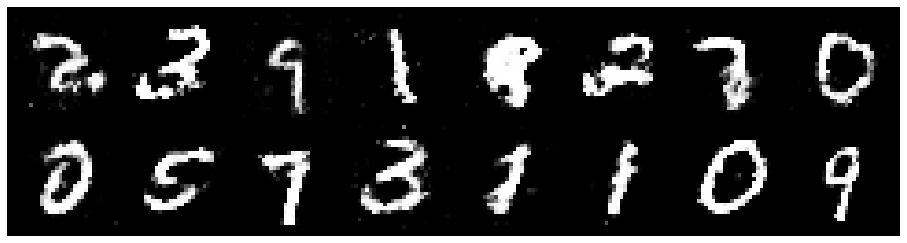

Epoch: [78/100], Batch Num: [0/600]
Discriminator Loss: 1.1816, Generator Loss: 0.9282
D(x): 0.5539, D(G(z)): 0.4070


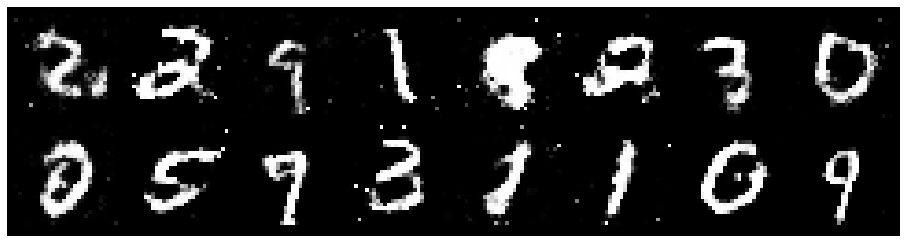

Epoch: [78/100], Batch Num: [100/600]
Discriminator Loss: 1.2042, Generator Loss: 0.9112
D(x): 0.5826, D(G(z)): 0.4303


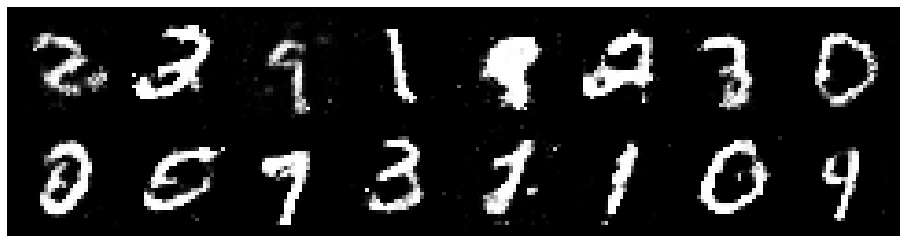

Epoch: [78/100], Batch Num: [200/600]
Discriminator Loss: 1.3504, Generator Loss: 0.8451
D(x): 0.5313, D(G(z)): 0.4541


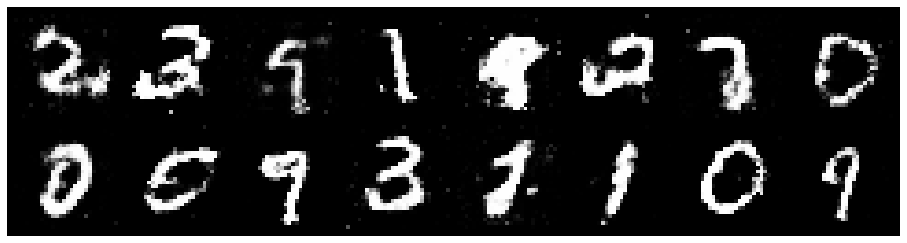

Epoch: [78/100], Batch Num: [300/600]
Discriminator Loss: 1.3539, Generator Loss: 0.9278
D(x): 0.5098, D(G(z)): 0.4276


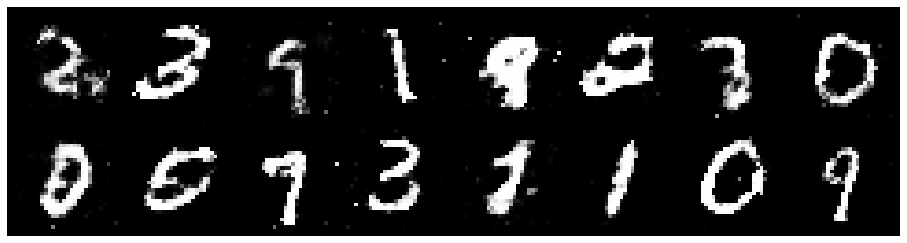

Epoch: [78/100], Batch Num: [400/600]
Discriminator Loss: 1.3826, Generator Loss: 0.9522
D(x): 0.5463, D(G(z)): 0.4707


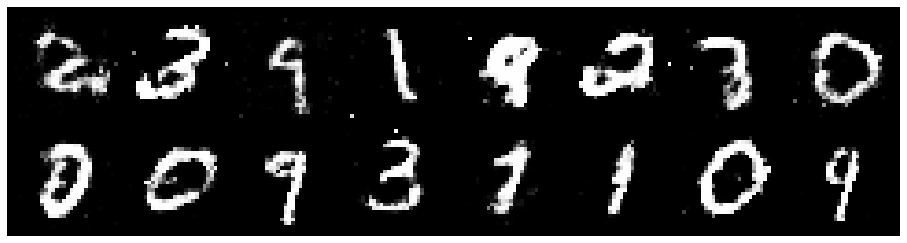

Epoch: [78/100], Batch Num: [500/600]
Discriminator Loss: 1.1983, Generator Loss: 0.9051
D(x): 0.6140, D(G(z)): 0.4369


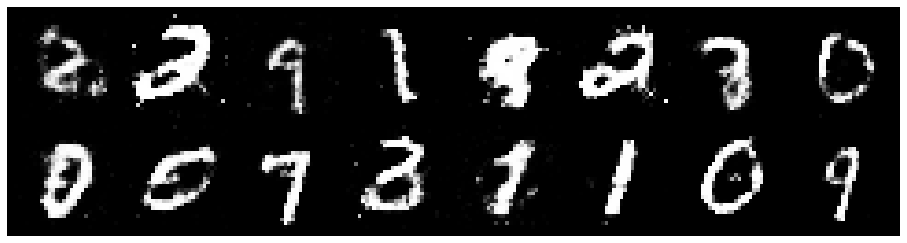

Epoch: [79/100], Batch Num: [0/600]
Discriminator Loss: 1.1733, Generator Loss: 1.2203
D(x): 0.5965, D(G(z)): 0.3914


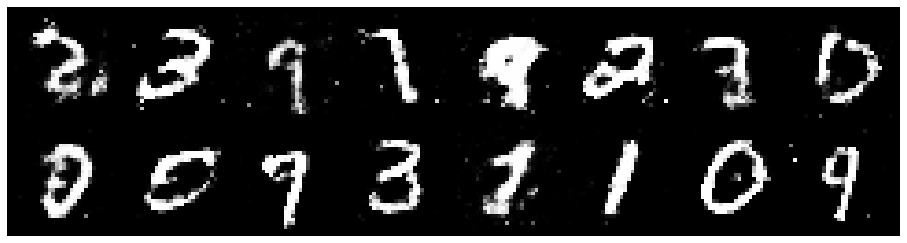

Epoch: [79/100], Batch Num: [100/600]
Discriminator Loss: 1.2919, Generator Loss: 0.8627
D(x): 0.5742, D(G(z)): 0.4499


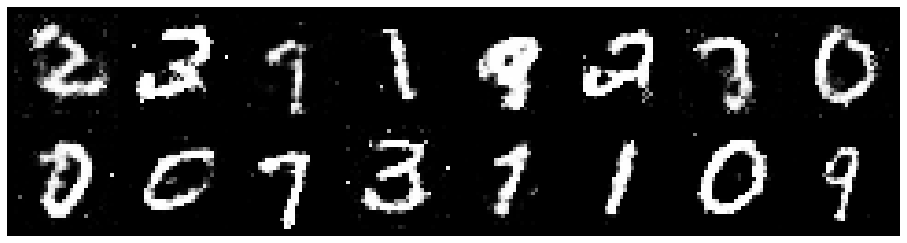

Epoch: [79/100], Batch Num: [200/600]
Discriminator Loss: 1.1987, Generator Loss: 0.8081
D(x): 0.5948, D(G(z)): 0.4481


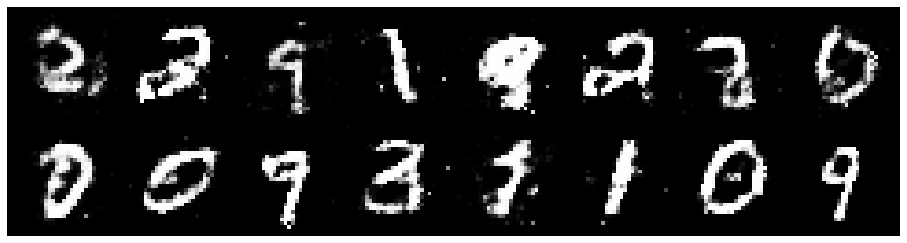

Epoch: [79/100], Batch Num: [300/600]
Discriminator Loss: 1.3005, Generator Loss: 0.8039
D(x): 0.5575, D(G(z)): 0.4659


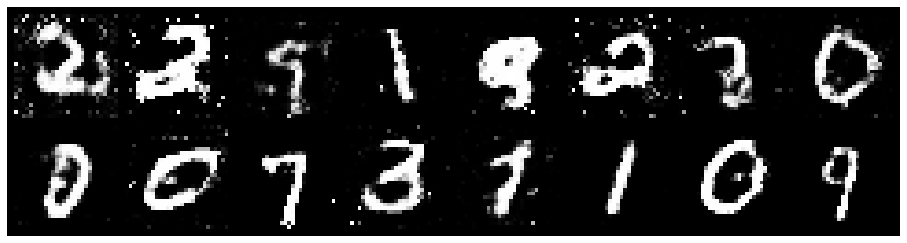

Epoch: [79/100], Batch Num: [400/600]
Discriminator Loss: 1.1488, Generator Loss: 1.0842
D(x): 0.5838, D(G(z)): 0.4072


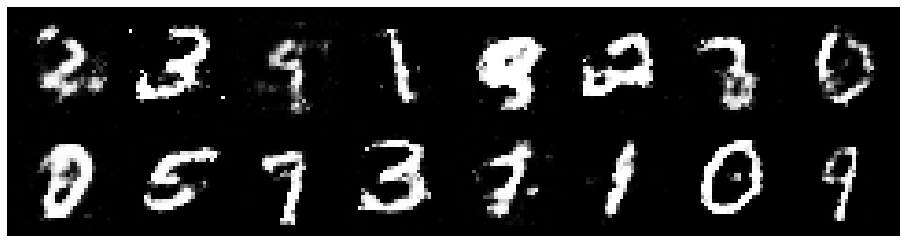

Epoch: [79/100], Batch Num: [500/600]
Discriminator Loss: 1.1461, Generator Loss: 1.0350
D(x): 0.6811, D(G(z)): 0.4554


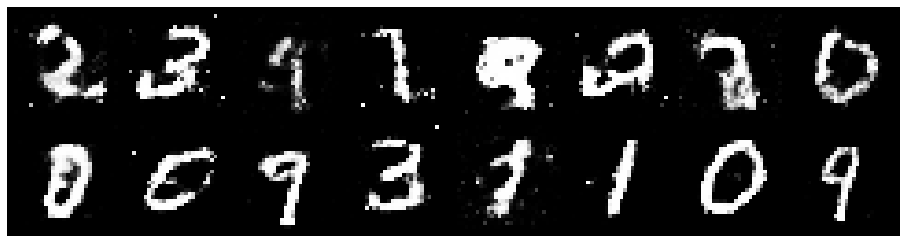

Epoch: [80/100], Batch Num: [0/600]
Discriminator Loss: 1.2152, Generator Loss: 0.9542
D(x): 0.5358, D(G(z)): 0.3831


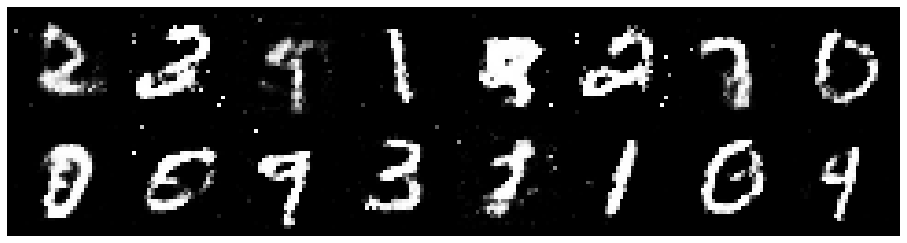

Epoch: [80/100], Batch Num: [100/600]
Discriminator Loss: 1.2884, Generator Loss: 0.9413
D(x): 0.5121, D(G(z)): 0.4125


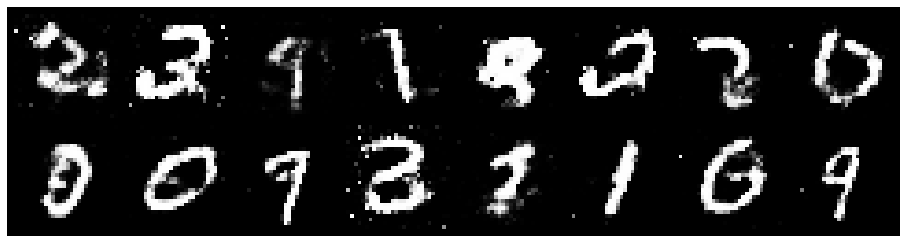

Epoch: [80/100], Batch Num: [200/600]
Discriminator Loss: 1.1141, Generator Loss: 0.9461
D(x): 0.5752, D(G(z)): 0.3742


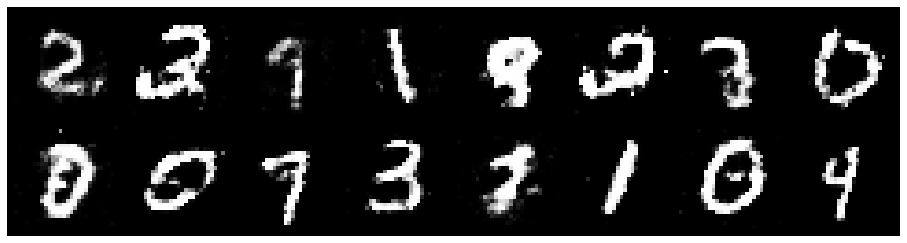

Epoch: [80/100], Batch Num: [300/600]
Discriminator Loss: 1.3170, Generator Loss: 0.9365
D(x): 0.5717, D(G(z)): 0.4703


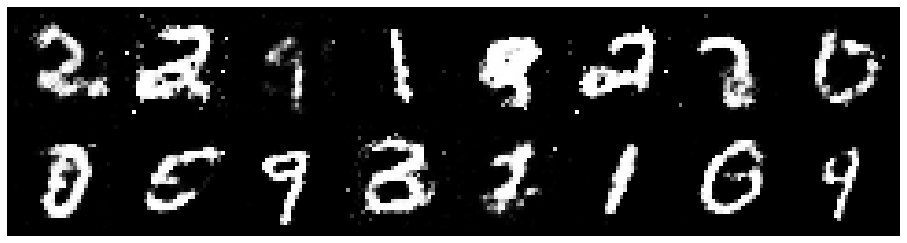

Epoch: [80/100], Batch Num: [400/600]
Discriminator Loss: 1.1940, Generator Loss: 1.0919
D(x): 0.5653, D(G(z)): 0.3929


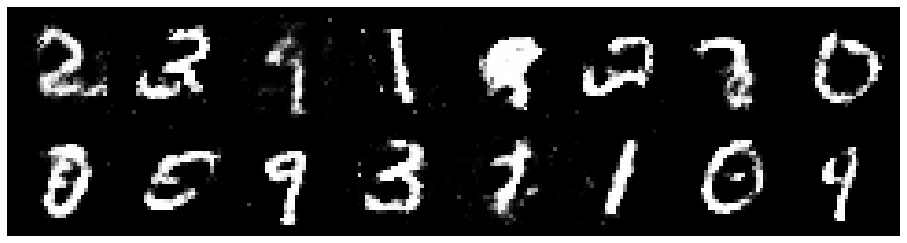

Epoch: [80/100], Batch Num: [500/600]
Discriminator Loss: 1.3312, Generator Loss: 0.9617
D(x): 0.5501, D(G(z)): 0.4550


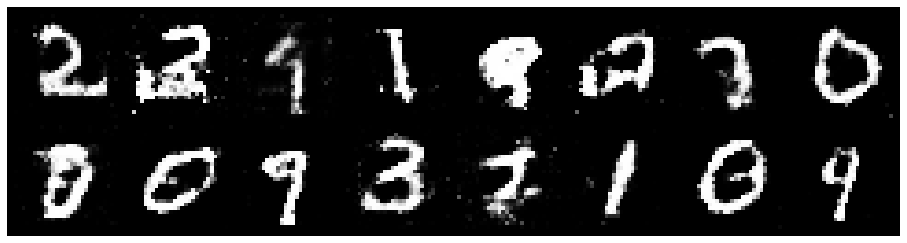

Epoch: [81/100], Batch Num: [0/600]
Discriminator Loss: 1.2498, Generator Loss: 0.8498
D(x): 0.5546, D(G(z)): 0.4279


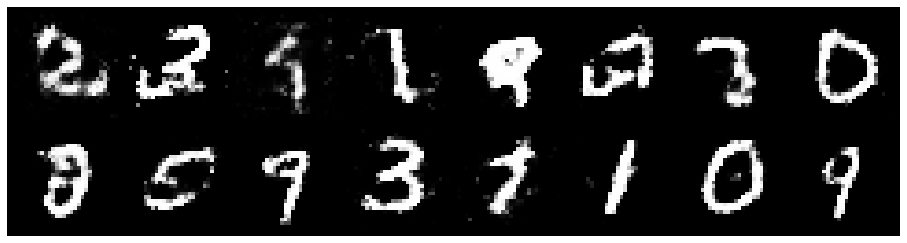

Epoch: [81/100], Batch Num: [100/600]
Discriminator Loss: 1.2397, Generator Loss: 0.8537
D(x): 0.5591, D(G(z)): 0.4304


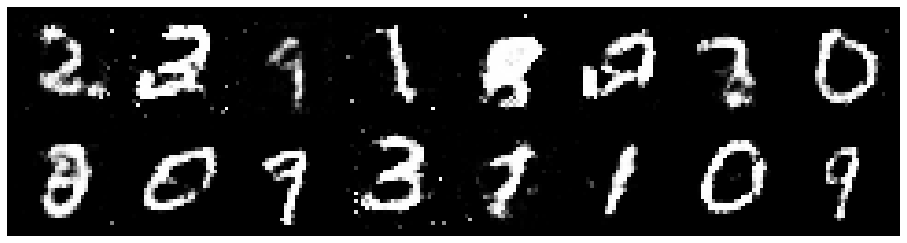

Epoch: [81/100], Batch Num: [200/600]
Discriminator Loss: 1.3391, Generator Loss: 0.9115
D(x): 0.5701, D(G(z)): 0.4848


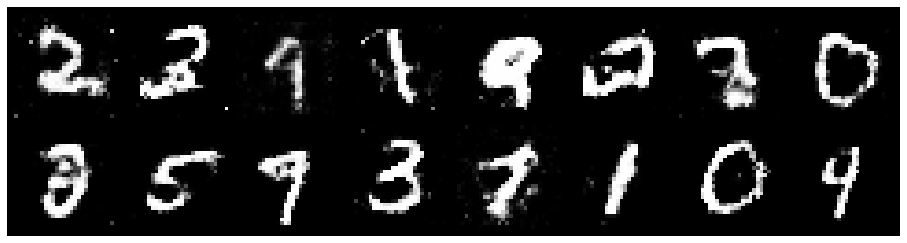

Epoch: [81/100], Batch Num: [300/600]
Discriminator Loss: 1.3314, Generator Loss: 0.9175
D(x): 0.5455, D(G(z)): 0.4534


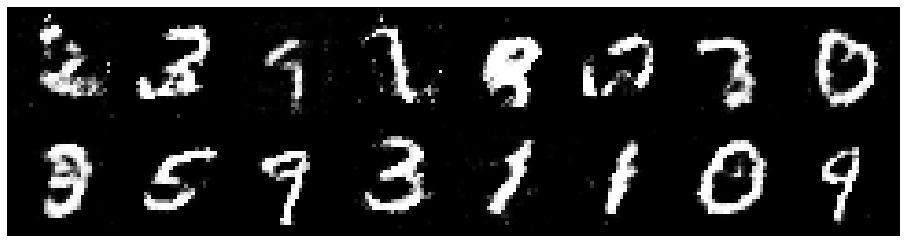

Epoch: [81/100], Batch Num: [400/600]
Discriminator Loss: 1.3267, Generator Loss: 0.7818
D(x): 0.5687, D(G(z)): 0.4860


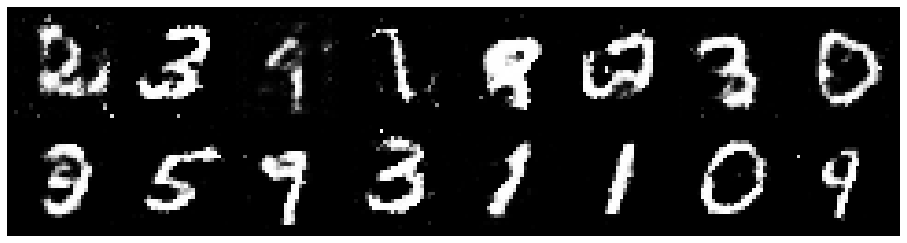

Epoch: [81/100], Batch Num: [500/600]
Discriminator Loss: 1.3475, Generator Loss: 0.8814
D(x): 0.5616, D(G(z)): 0.4499


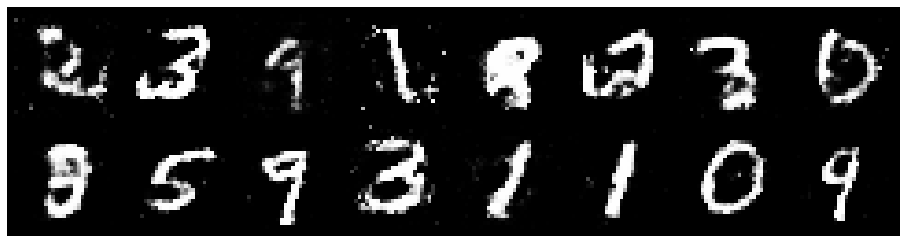

Epoch: [82/100], Batch Num: [0/600]
Discriminator Loss: 1.2155, Generator Loss: 0.8934
D(x): 0.5597, D(G(z)): 0.4274


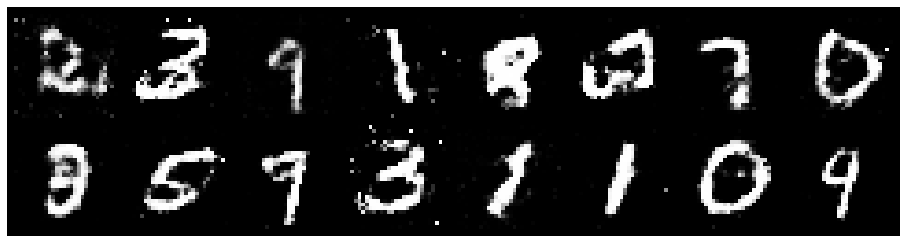

Epoch: [82/100], Batch Num: [100/600]
Discriminator Loss: 1.3015, Generator Loss: 0.9394
D(x): 0.5733, D(G(z)): 0.4545


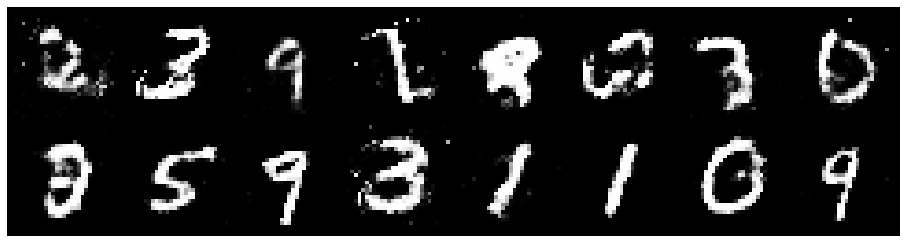

Epoch: [82/100], Batch Num: [200/600]
Discriminator Loss: 1.1798, Generator Loss: 0.9279
D(x): 0.5504, D(G(z)): 0.3875


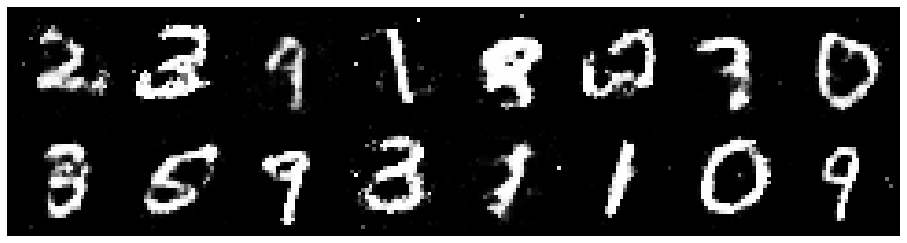

Epoch: [82/100], Batch Num: [300/600]
Discriminator Loss: 1.2049, Generator Loss: 0.9384
D(x): 0.6054, D(G(z)): 0.4433


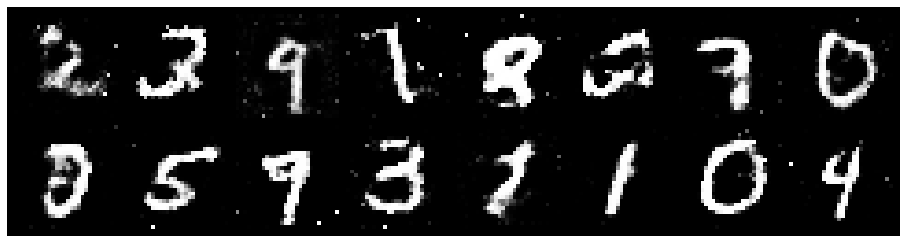

Epoch: [82/100], Batch Num: [400/600]
Discriminator Loss: 1.2588, Generator Loss: 1.0015
D(x): 0.5632, D(G(z)): 0.4075


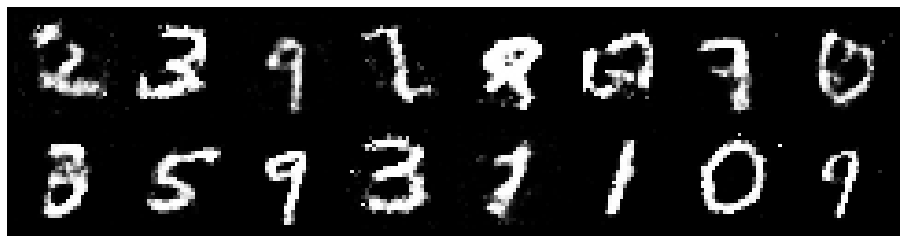

Epoch: [82/100], Batch Num: [500/600]
Discriminator Loss: 1.2552, Generator Loss: 1.1466
D(x): 0.5435, D(G(z)): 0.3992


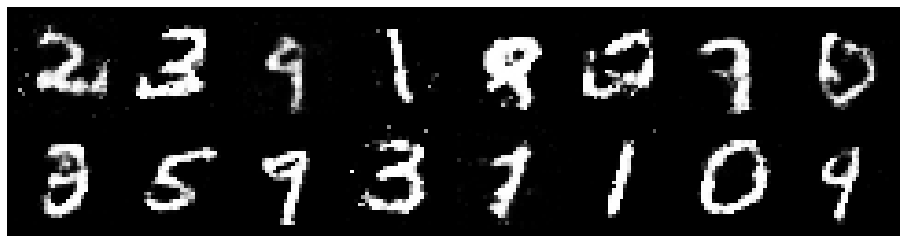

Epoch: [83/100], Batch Num: [0/600]
Discriminator Loss: 1.1543, Generator Loss: 1.1249
D(x): 0.6262, D(G(z)): 0.4259


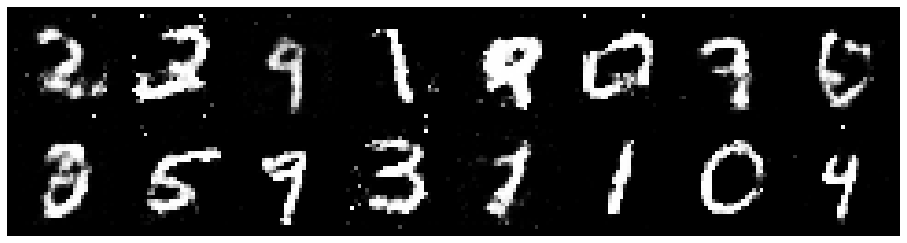

Epoch: [83/100], Batch Num: [100/600]
Discriminator Loss: 1.3698, Generator Loss: 0.9561
D(x): 0.5187, D(G(z)): 0.4288


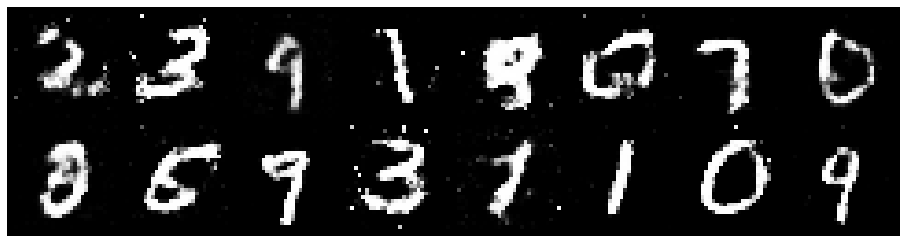

Epoch: [83/100], Batch Num: [200/600]
Discriminator Loss: 1.2421, Generator Loss: 1.1139
D(x): 0.5794, D(G(z)): 0.4162


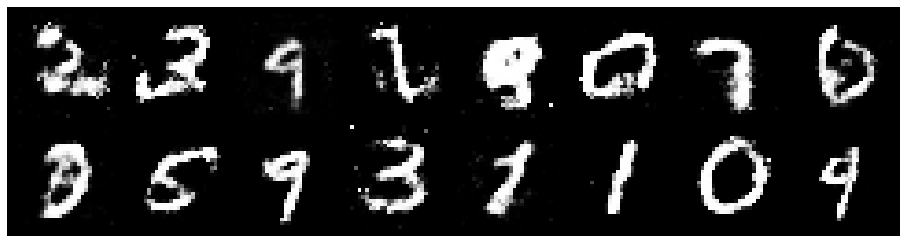

Epoch: [83/100], Batch Num: [300/600]
Discriminator Loss: 1.1323, Generator Loss: 0.8290
D(x): 0.6456, D(G(z)): 0.4599


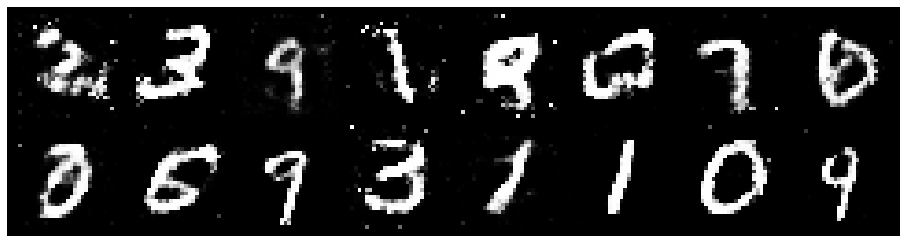

Epoch: [83/100], Batch Num: [400/600]
Discriminator Loss: 1.3614, Generator Loss: 0.9620
D(x): 0.5560, D(G(z)): 0.4690


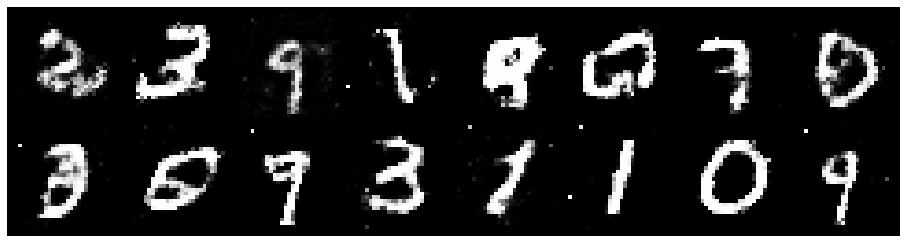

Epoch: [83/100], Batch Num: [500/600]
Discriminator Loss: 1.1242, Generator Loss: 0.9209
D(x): 0.5994, D(G(z)): 0.3946


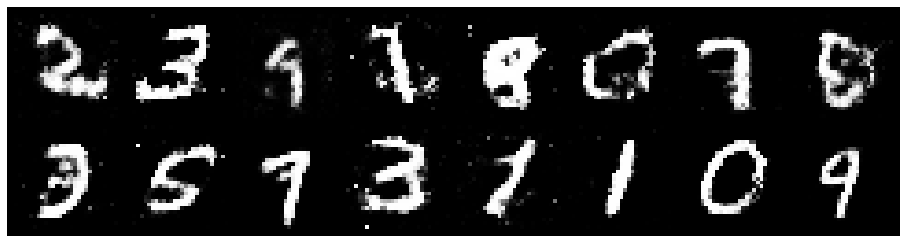

Epoch: [84/100], Batch Num: [0/600]
Discriminator Loss: 1.1796, Generator Loss: 0.9971
D(x): 0.5790, D(G(z)): 0.3986


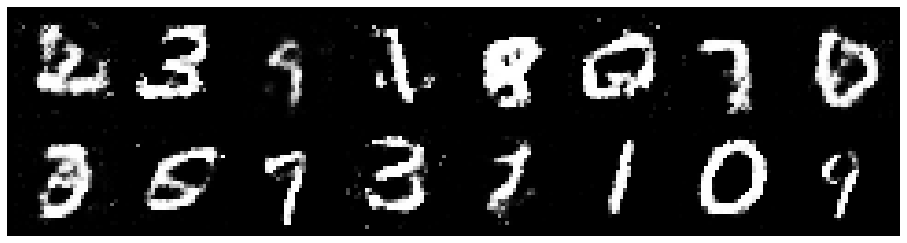

Epoch: [84/100], Batch Num: [100/600]
Discriminator Loss: 1.1873, Generator Loss: 0.8455
D(x): 0.5661, D(G(z)): 0.4121


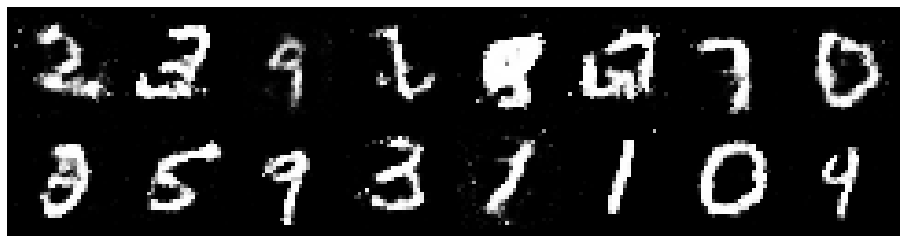

Epoch: [84/100], Batch Num: [200/600]
Discriminator Loss: 1.1799, Generator Loss: 0.9494
D(x): 0.6271, D(G(z)): 0.4359


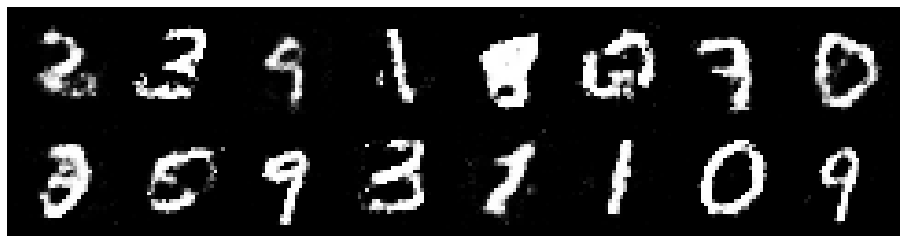

Epoch: [84/100], Batch Num: [300/600]
Discriminator Loss: 1.1775, Generator Loss: 0.8771
D(x): 0.5984, D(G(z)): 0.4416


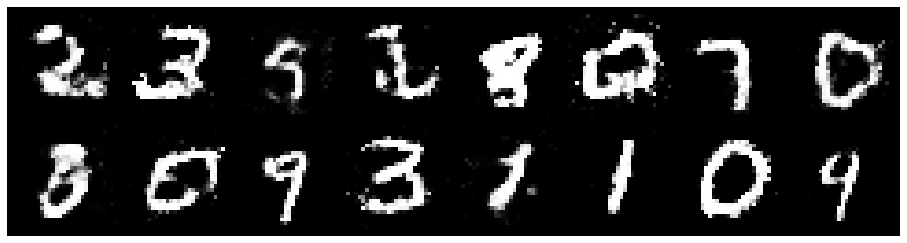

Epoch: [84/100], Batch Num: [400/600]
Discriminator Loss: 1.2443, Generator Loss: 1.0177
D(x): 0.5676, D(G(z)): 0.4402


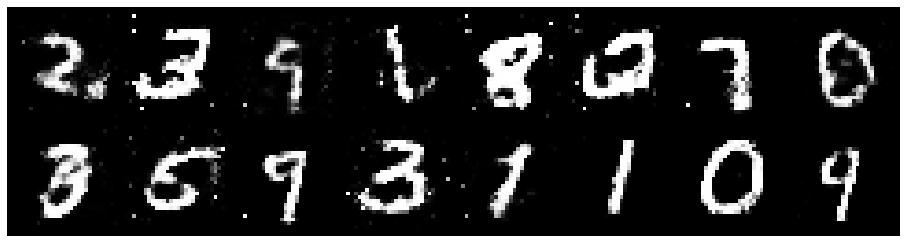

Epoch: [84/100], Batch Num: [500/600]
Discriminator Loss: 1.2676, Generator Loss: 0.8406
D(x): 0.5333, D(G(z)): 0.4301


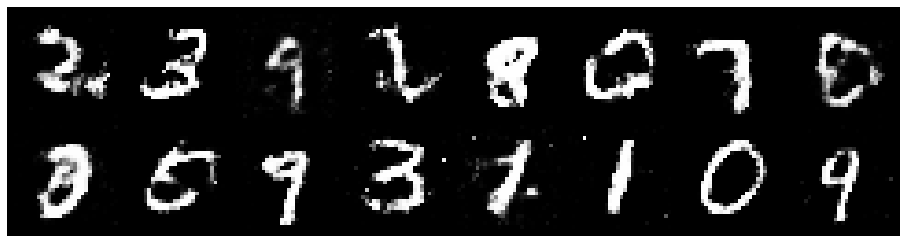

Epoch: [85/100], Batch Num: [0/600]
Discriminator Loss: 1.3397, Generator Loss: 1.0020
D(x): 0.5608, D(G(z)): 0.4482


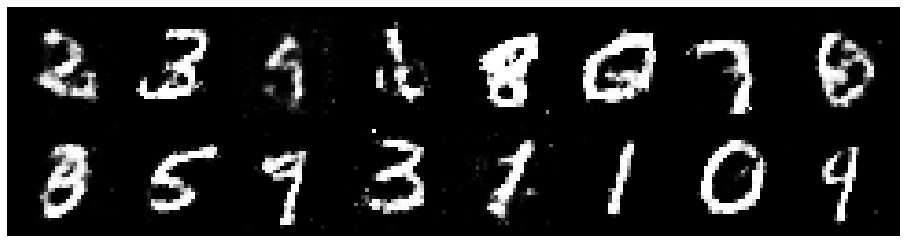

Epoch: [85/100], Batch Num: [100/600]
Discriminator Loss: 1.2017, Generator Loss: 0.8765
D(x): 0.5723, D(G(z)): 0.4206


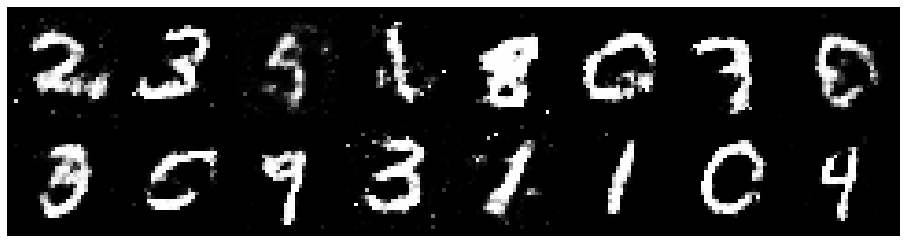

Epoch: [85/100], Batch Num: [200/600]
Discriminator Loss: 1.3256, Generator Loss: 0.8664
D(x): 0.5187, D(G(z)): 0.4275


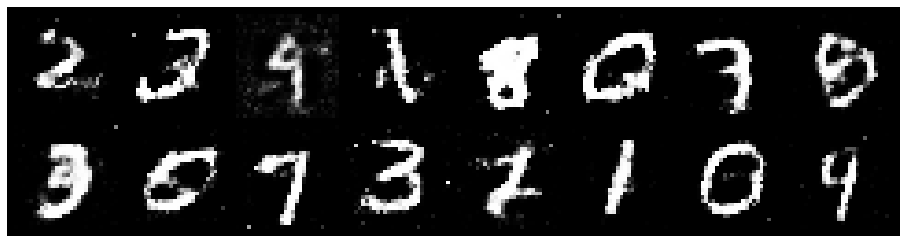

Epoch: [85/100], Batch Num: [300/600]
Discriminator Loss: 1.3664, Generator Loss: 0.8192
D(x): 0.5359, D(G(z)): 0.4680


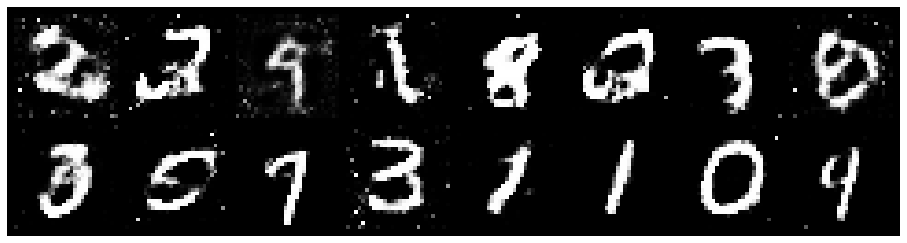

Epoch: [85/100], Batch Num: [400/600]
Discriminator Loss: 1.2523, Generator Loss: 1.0735
D(x): 0.5501, D(G(z)): 0.4130


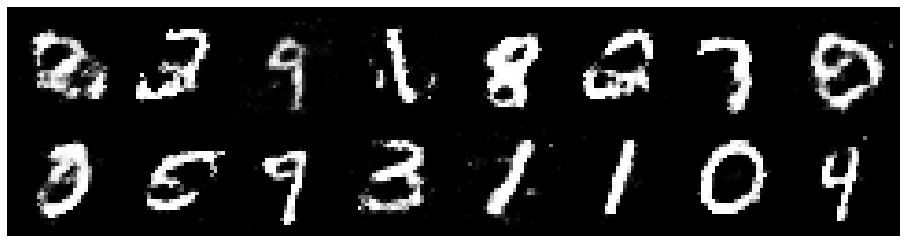

Epoch: [85/100], Batch Num: [500/600]
Discriminator Loss: 1.2993, Generator Loss: 0.9758
D(x): 0.5741, D(G(z)): 0.4528


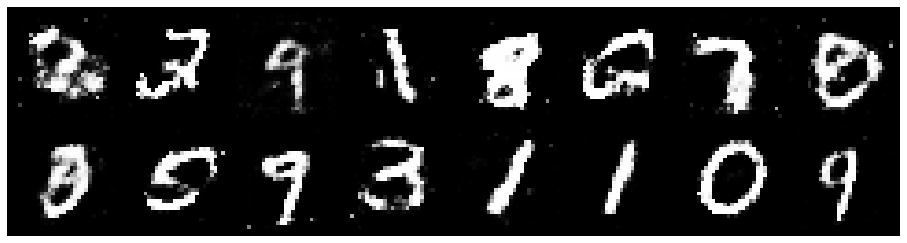

Epoch: [86/100], Batch Num: [0/600]
Discriminator Loss: 1.1653, Generator Loss: 1.0509
D(x): 0.5873, D(G(z)): 0.4156


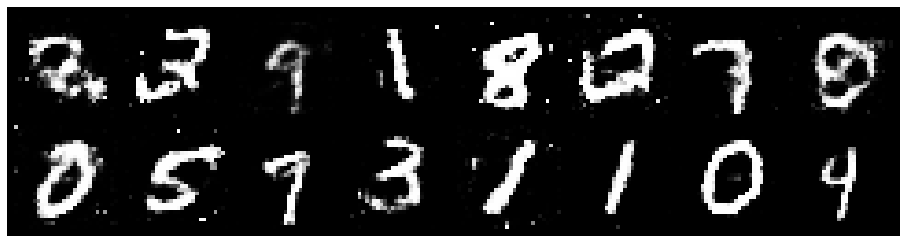

Epoch: [86/100], Batch Num: [100/600]
Discriminator Loss: 1.2660, Generator Loss: 1.1188
D(x): 0.5268, D(G(z)): 0.3963


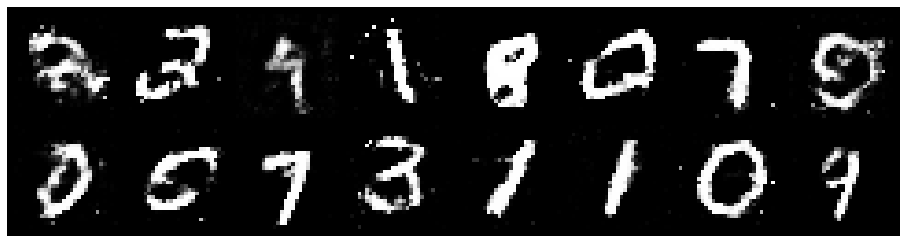

Epoch: [86/100], Batch Num: [200/600]
Discriminator Loss: 1.2298, Generator Loss: 0.8115
D(x): 0.6008, D(G(z)): 0.4808


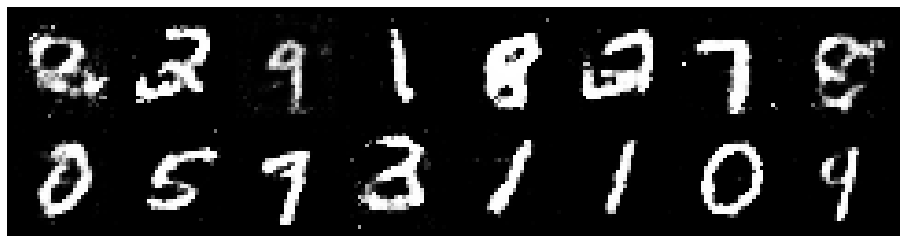

Epoch: [86/100], Batch Num: [300/600]
Discriminator Loss: 1.4192, Generator Loss: 0.9785
D(x): 0.5201, D(G(z)): 0.4456


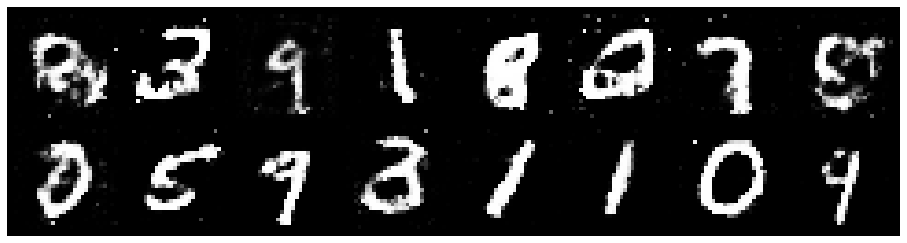

Epoch: [86/100], Batch Num: [400/600]
Discriminator Loss: 1.2586, Generator Loss: 0.9138
D(x): 0.5489, D(G(z)): 0.4185


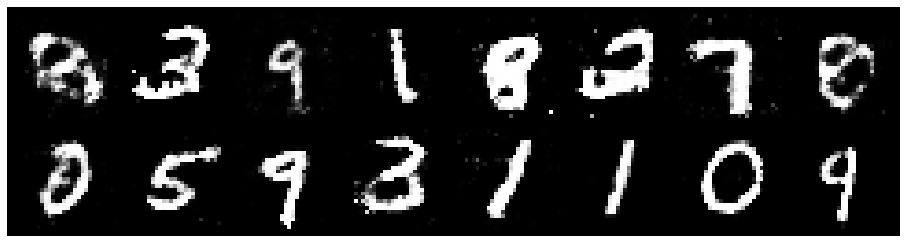

Epoch: [86/100], Batch Num: [500/600]
Discriminator Loss: 1.2413, Generator Loss: 0.9533
D(x): 0.6017, D(G(z)): 0.4564


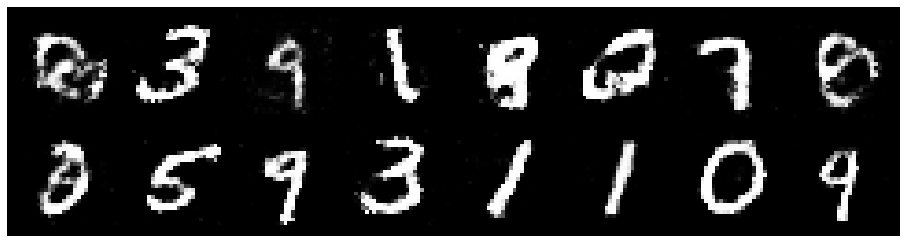

Epoch: [87/100], Batch Num: [0/600]
Discriminator Loss: 1.3171, Generator Loss: 0.8184
D(x): 0.5499, D(G(z)): 0.4883


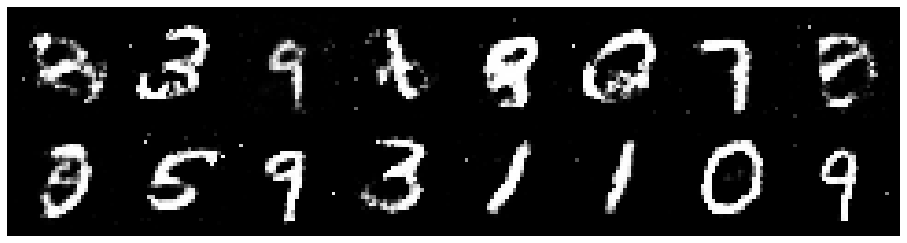

Epoch: [87/100], Batch Num: [100/600]
Discriminator Loss: 1.3144, Generator Loss: 0.8116
D(x): 0.5460, D(G(z)): 0.4567


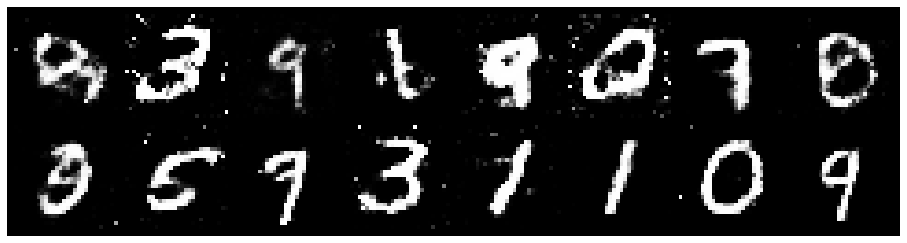

Epoch: [87/100], Batch Num: [200/600]
Discriminator Loss: 1.2873, Generator Loss: 0.9443
D(x): 0.5602, D(G(z)): 0.4383


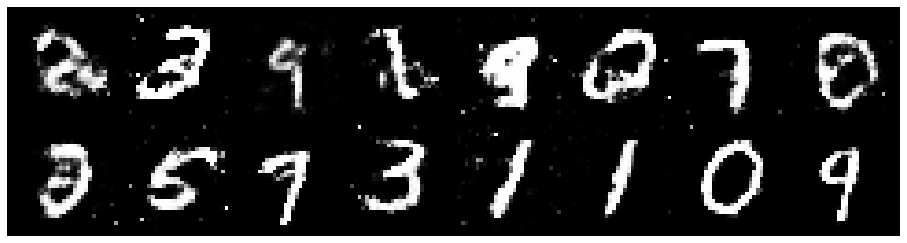

Epoch: [87/100], Batch Num: [300/600]
Discriminator Loss: 1.2629, Generator Loss: 0.8038
D(x): 0.5676, D(G(z)): 0.4306


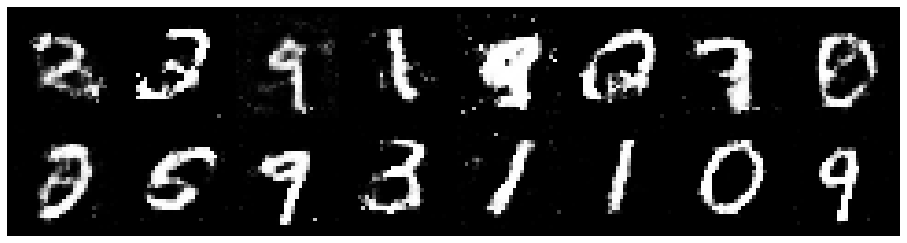

Epoch: [87/100], Batch Num: [400/600]
Discriminator Loss: 1.3055, Generator Loss: 0.9830
D(x): 0.5537, D(G(z)): 0.4517


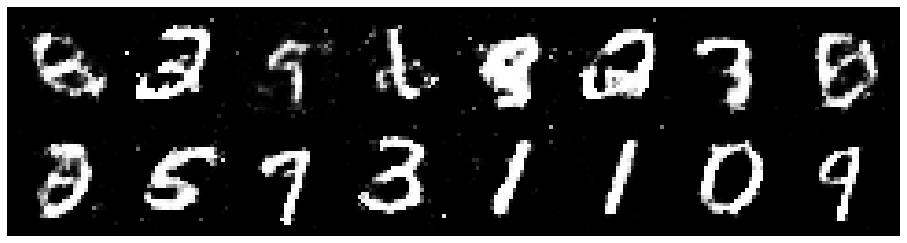

Epoch: [87/100], Batch Num: [500/600]
Discriminator Loss: 1.2169, Generator Loss: 0.9207
D(x): 0.5631, D(G(z)): 0.4265


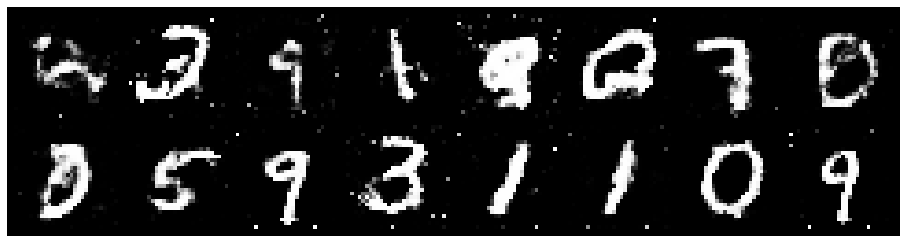

Epoch: [88/100], Batch Num: [0/600]
Discriminator Loss: 1.2320, Generator Loss: 0.8028
D(x): 0.5986, D(G(z)): 0.4637


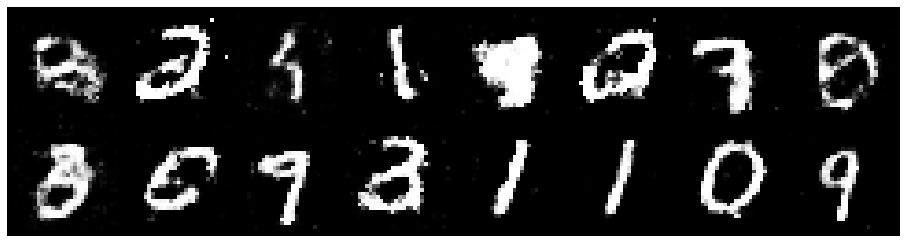

Epoch: [88/100], Batch Num: [100/600]
Discriminator Loss: 1.2959, Generator Loss: 0.8469
D(x): 0.5441, D(G(z)): 0.4319


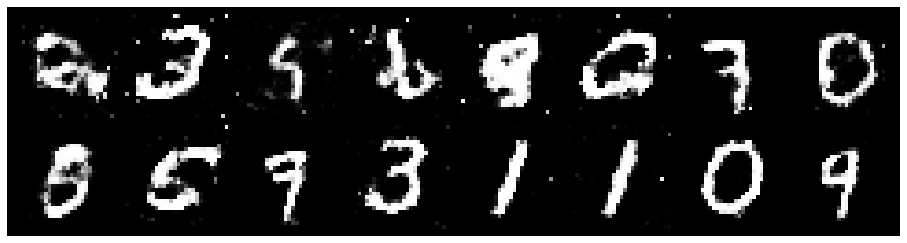

Epoch: [88/100], Batch Num: [200/600]
Discriminator Loss: 1.3181, Generator Loss: 0.8132
D(x): 0.5890, D(G(z)): 0.4891


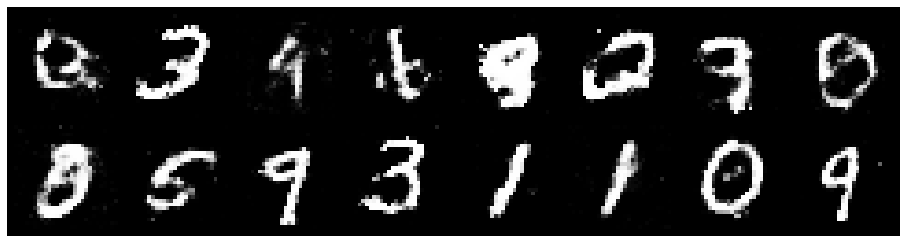

Epoch: [88/100], Batch Num: [300/600]
Discriminator Loss: 1.2701, Generator Loss: 0.9731
D(x): 0.5296, D(G(z)): 0.4062


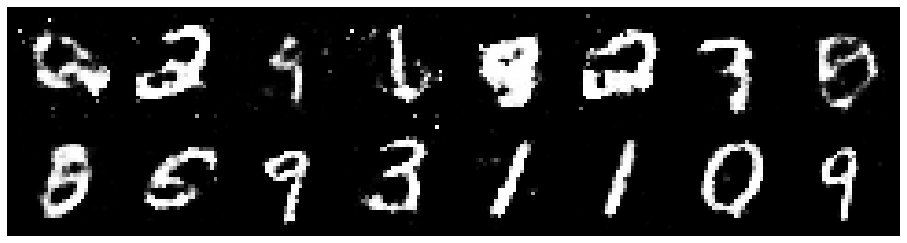

Epoch: [88/100], Batch Num: [400/600]
Discriminator Loss: 1.3252, Generator Loss: 0.8617
D(x): 0.5825, D(G(z)): 0.4759


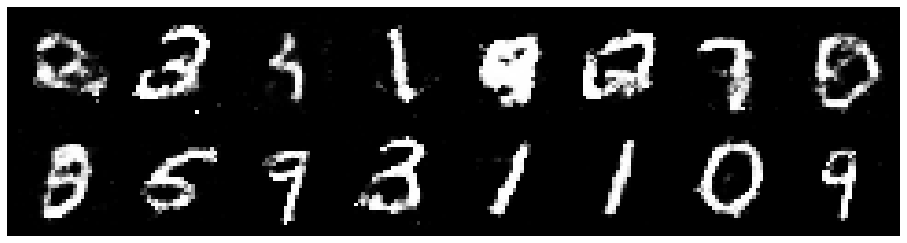

Epoch: [88/100], Batch Num: [500/600]
Discriminator Loss: 1.1844, Generator Loss: 0.8548
D(x): 0.5628, D(G(z)): 0.4342


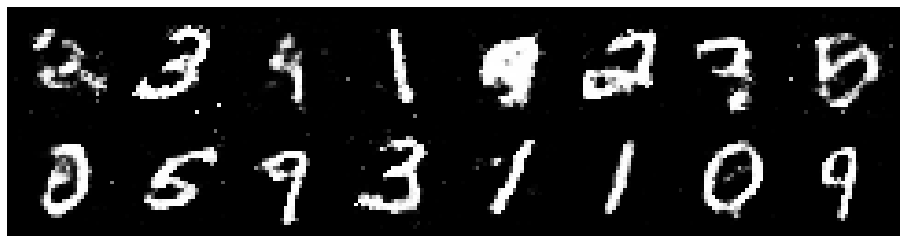

Epoch: [89/100], Batch Num: [0/600]
Discriminator Loss: 1.2165, Generator Loss: 0.9406
D(x): 0.5324, D(G(z)): 0.3962


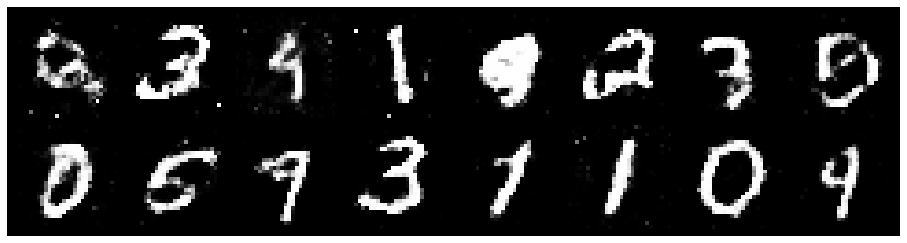

Epoch: [89/100], Batch Num: [100/600]
Discriminator Loss: 1.3118, Generator Loss: 0.8874
D(x): 0.5433, D(G(z)): 0.4589


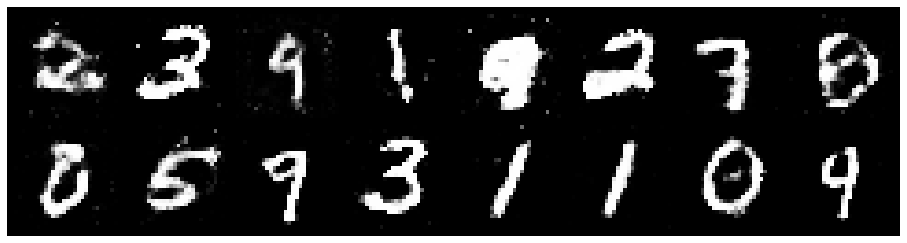

Epoch: [89/100], Batch Num: [200/600]
Discriminator Loss: 1.4094, Generator Loss: 0.8192
D(x): 0.5517, D(G(z)): 0.4854


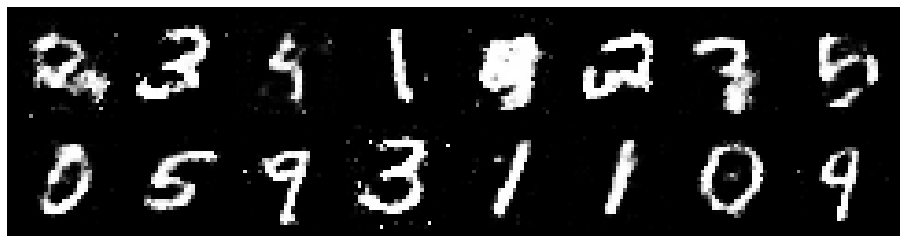

Epoch: [89/100], Batch Num: [300/600]
Discriminator Loss: 1.1317, Generator Loss: 1.0179
D(x): 0.5963, D(G(z)): 0.3995


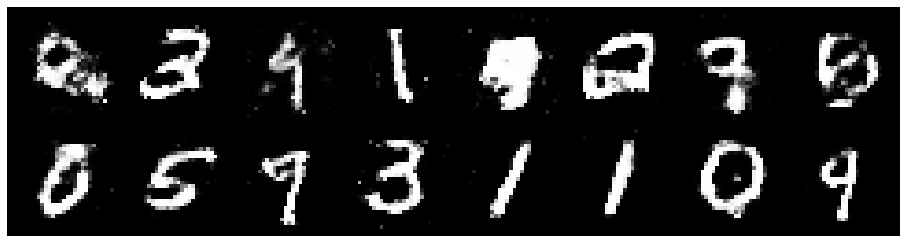

Epoch: [89/100], Batch Num: [400/600]
Discriminator Loss: 1.2301, Generator Loss: 1.0369
D(x): 0.5371, D(G(z)): 0.3886


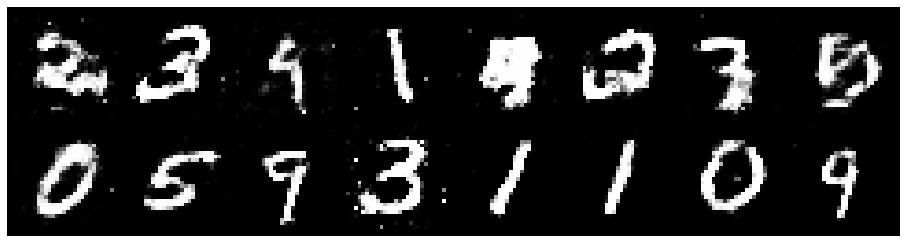

Epoch: [89/100], Batch Num: [500/600]
Discriminator Loss: 1.2167, Generator Loss: 0.9445
D(x): 0.6257, D(G(z)): 0.4712


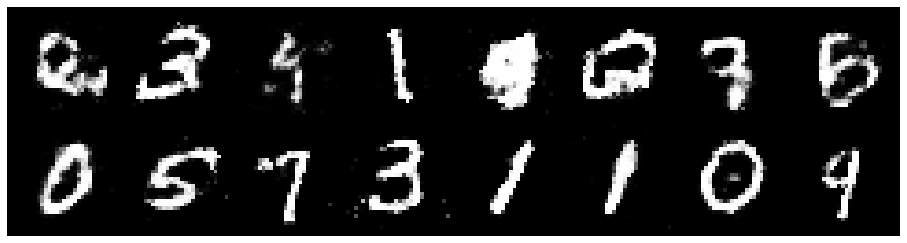

Epoch: [90/100], Batch Num: [0/600]
Discriminator Loss: 1.1507, Generator Loss: 1.0484
D(x): 0.5882, D(G(z)): 0.4089


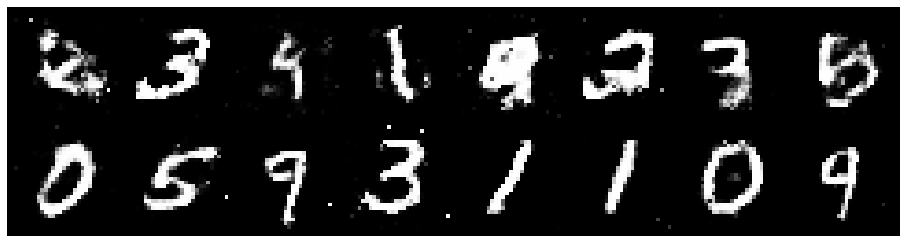

Epoch: [90/100], Batch Num: [100/600]
Discriminator Loss: 1.1525, Generator Loss: 0.9462
D(x): 0.5929, D(G(z)): 0.4243


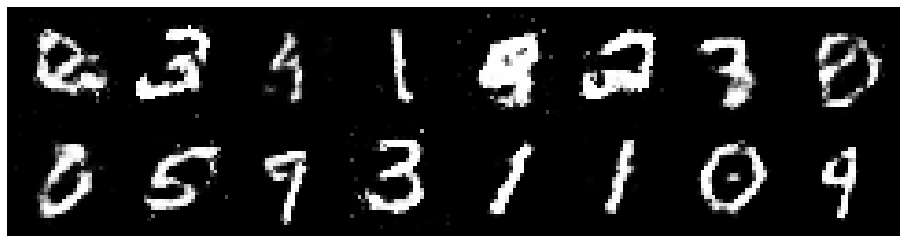

Epoch: [90/100], Batch Num: [200/600]
Discriminator Loss: 1.4163, Generator Loss: 0.7975
D(x): 0.5070, D(G(z)): 0.4711


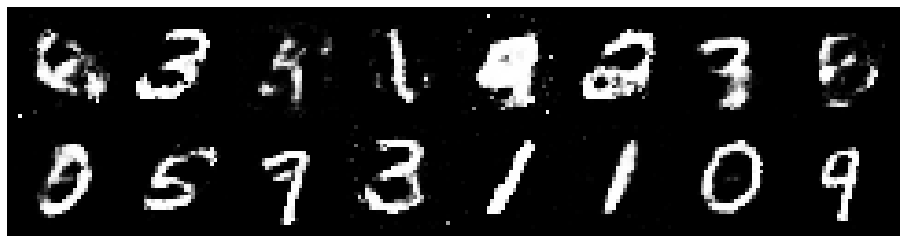

Epoch: [90/100], Batch Num: [300/600]
Discriminator Loss: 1.2964, Generator Loss: 0.8558
D(x): 0.5236, D(G(z)): 0.4404


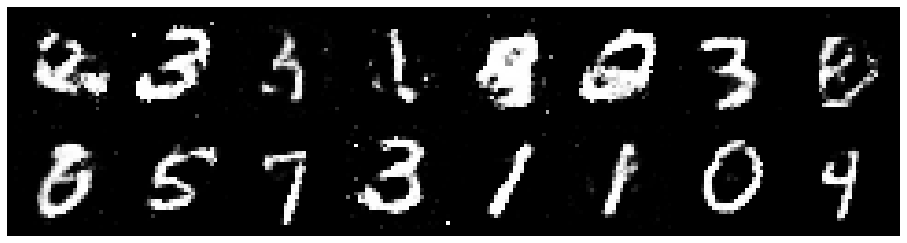

Epoch: [90/100], Batch Num: [400/600]
Discriminator Loss: 1.2382, Generator Loss: 0.9156
D(x): 0.5597, D(G(z)): 0.4166


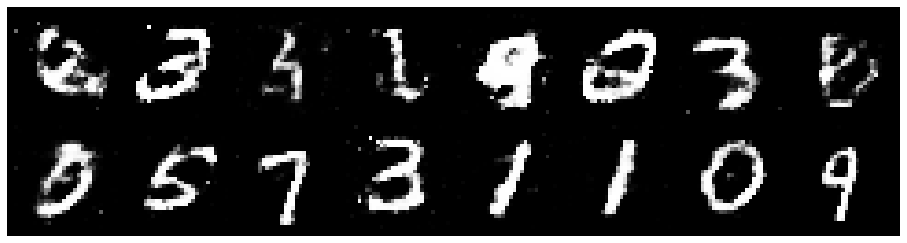

Epoch: [90/100], Batch Num: [500/600]
Discriminator Loss: 1.3918, Generator Loss: 0.7062
D(x): 0.5945, D(G(z)): 0.5202


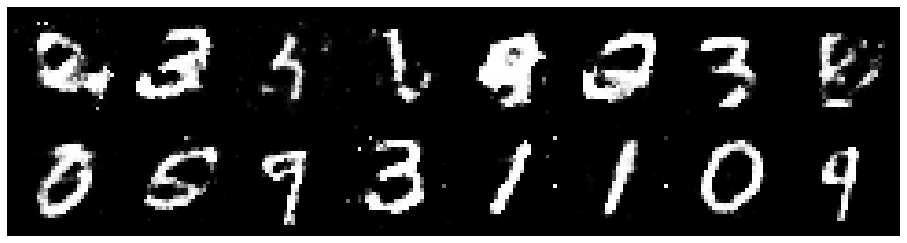

Epoch: [91/100], Batch Num: [0/600]
Discriminator Loss: 1.2717, Generator Loss: 1.0994
D(x): 0.5827, D(G(z)): 0.4328


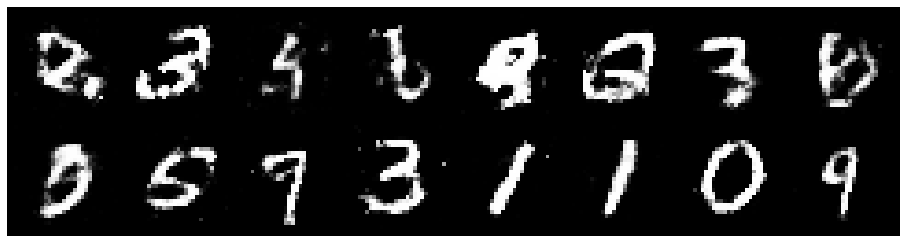

Epoch: [91/100], Batch Num: [100/600]
Discriminator Loss: 1.3662, Generator Loss: 0.7356
D(x): 0.5865, D(G(z)): 0.5169


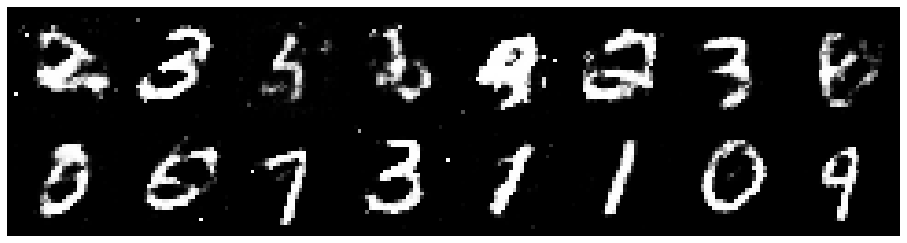

Epoch: [91/100], Batch Num: [200/600]
Discriminator Loss: 1.3116, Generator Loss: 1.1211
D(x): 0.5154, D(G(z)): 0.3792


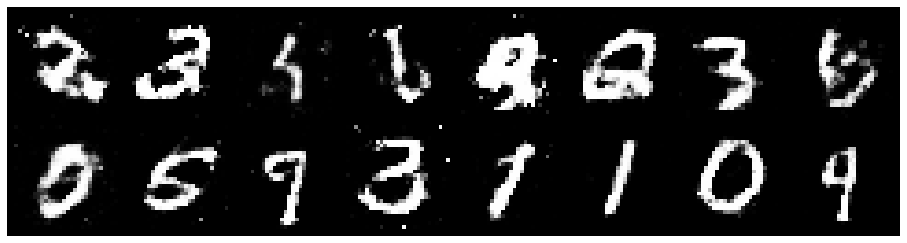

Epoch: [91/100], Batch Num: [300/600]
Discriminator Loss: 1.2240, Generator Loss: 0.9445
D(x): 0.5496, D(G(z)): 0.4060


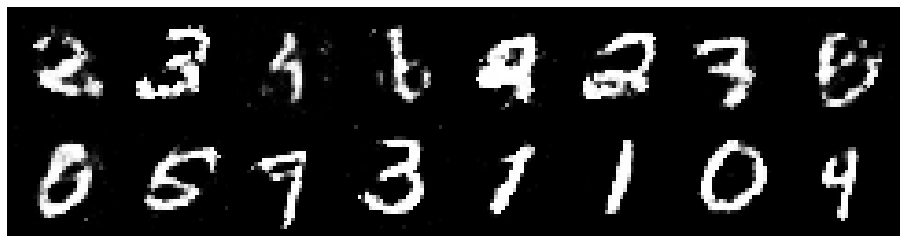

Epoch: [91/100], Batch Num: [400/600]
Discriminator Loss: 1.2218, Generator Loss: 0.9439
D(x): 0.5546, D(G(z)): 0.4113


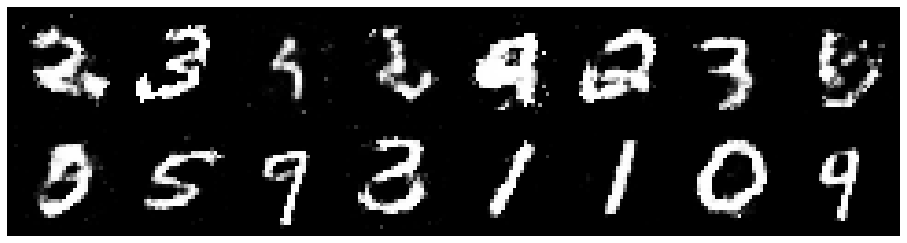

Epoch: [91/100], Batch Num: [500/600]
Discriminator Loss: 1.2479, Generator Loss: 0.9131
D(x): 0.6191, D(G(z)): 0.4757


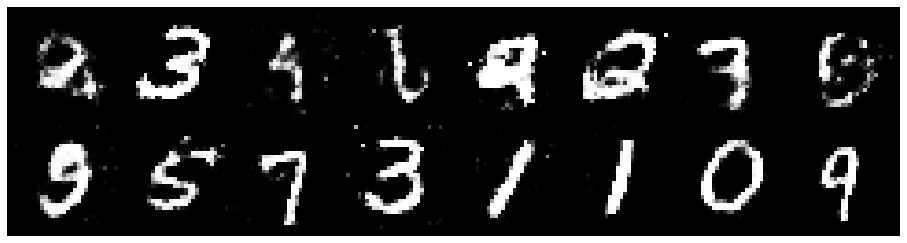

Epoch: [92/100], Batch Num: [0/600]
Discriminator Loss: 1.3014, Generator Loss: 0.9254
D(x): 0.5473, D(G(z)): 0.4513


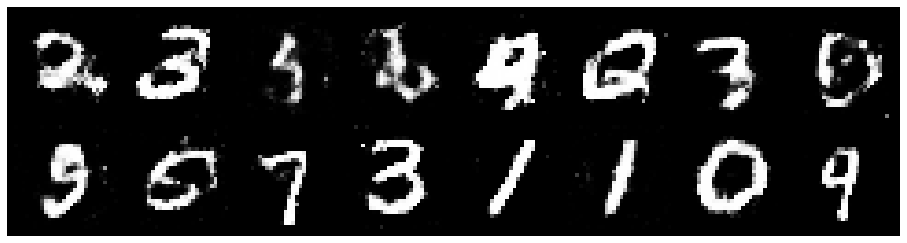

Epoch: [92/100], Batch Num: [100/600]
Discriminator Loss: 1.4634, Generator Loss: 0.9546
D(x): 0.5576, D(G(z)): 0.4789


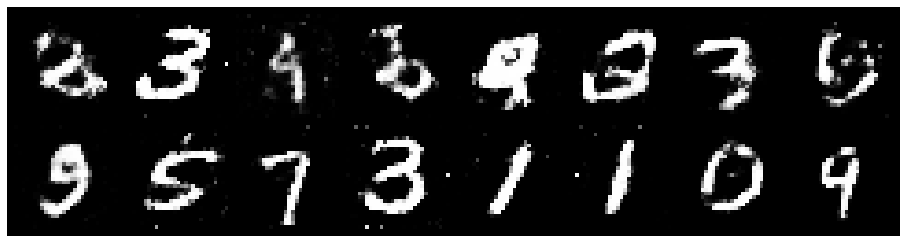

Epoch: [92/100], Batch Num: [200/600]
Discriminator Loss: 1.0972, Generator Loss: 0.9490
D(x): 0.5993, D(G(z)): 0.3866


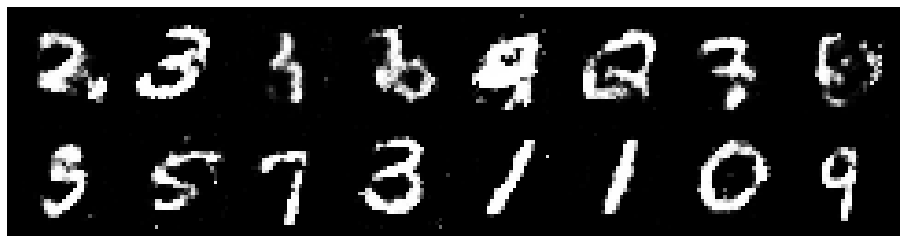

Epoch: [92/100], Batch Num: [300/600]
Discriminator Loss: 1.2875, Generator Loss: 0.7901
D(x): 0.5225, D(G(z)): 0.4316


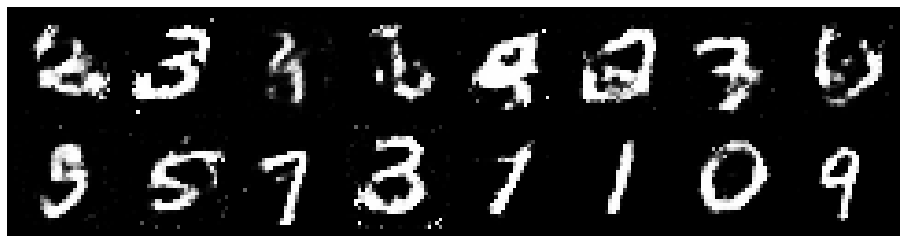

Epoch: [92/100], Batch Num: [400/600]
Discriminator Loss: 1.2816, Generator Loss: 0.8620
D(x): 0.5465, D(G(z)): 0.4460


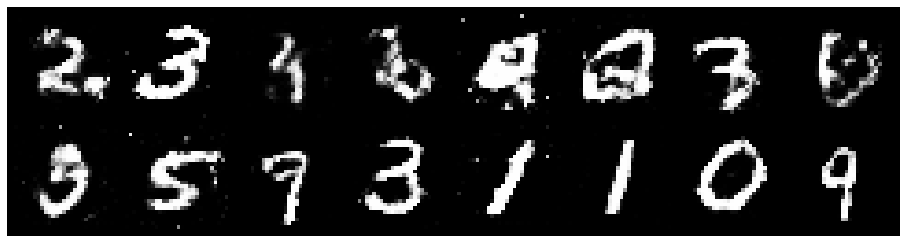

Epoch: [92/100], Batch Num: [500/600]
Discriminator Loss: 1.2134, Generator Loss: 0.8489
D(x): 0.5775, D(G(z)): 0.4249


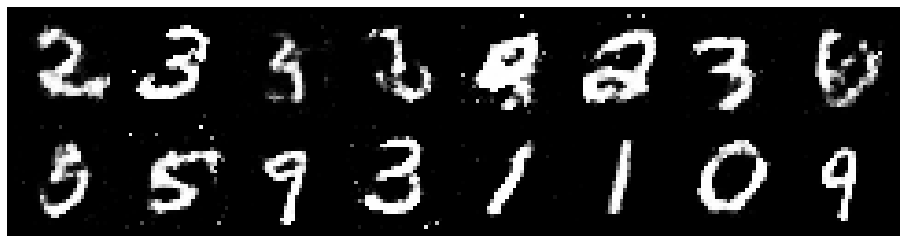

Epoch: [93/100], Batch Num: [0/600]
Discriminator Loss: 1.2167, Generator Loss: 0.8686
D(x): 0.5628, D(G(z)): 0.4307


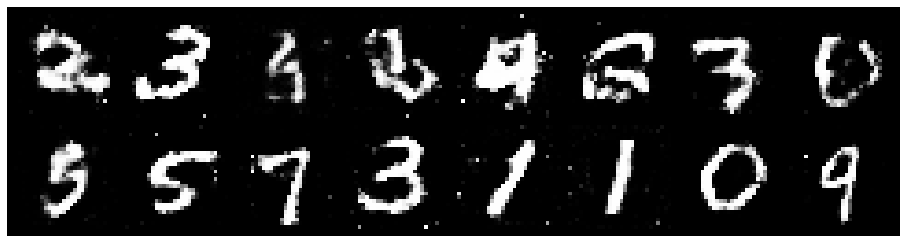

Epoch: [93/100], Batch Num: [100/600]
Discriminator Loss: 1.2470, Generator Loss: 0.8321
D(x): 0.5378, D(G(z)): 0.4277


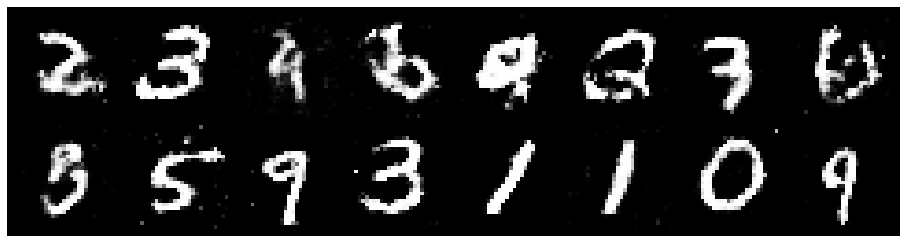

Epoch: [93/100], Batch Num: [200/600]
Discriminator Loss: 1.2714, Generator Loss: 0.9455
D(x): 0.5488, D(G(z)): 0.4480


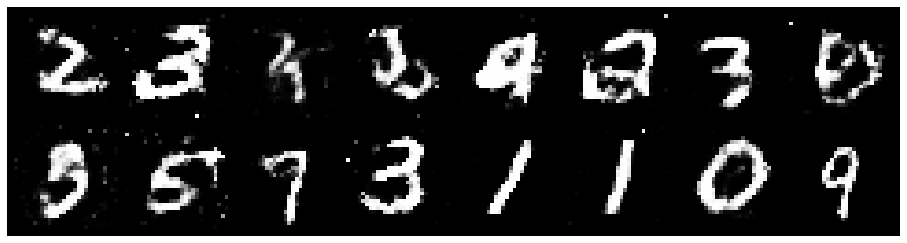

Epoch: [93/100], Batch Num: [300/600]
Discriminator Loss: 1.2796, Generator Loss: 0.8243
D(x): 0.5495, D(G(z)): 0.4547


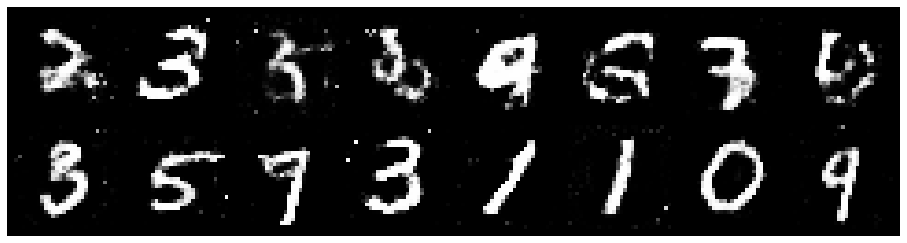

Epoch: [93/100], Batch Num: [400/600]
Discriminator Loss: 1.3174, Generator Loss: 0.7685
D(x): 0.5638, D(G(z)): 0.4837


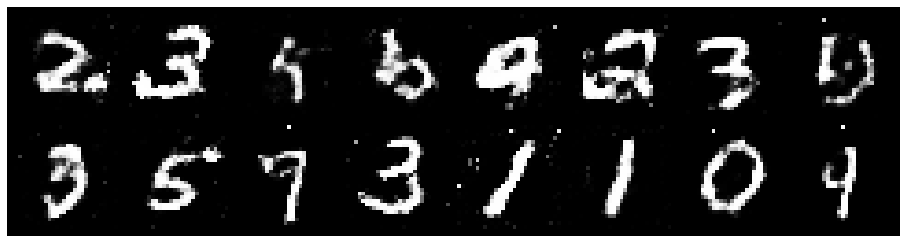

Epoch: [93/100], Batch Num: [500/600]
Discriminator Loss: 1.3349, Generator Loss: 0.9148
D(x): 0.5948, D(G(z)): 0.4938


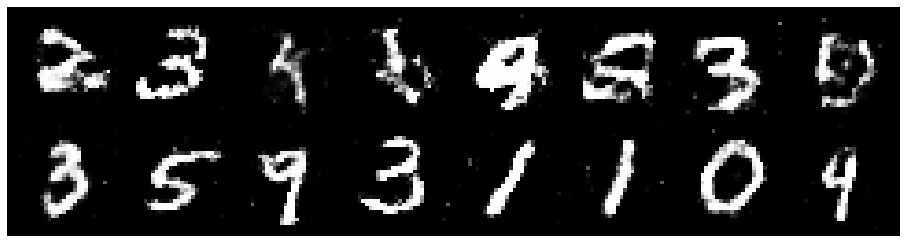

Epoch: [94/100], Batch Num: [0/600]
Discriminator Loss: 1.2384, Generator Loss: 0.8867
D(x): 0.5994, D(G(z)): 0.4691


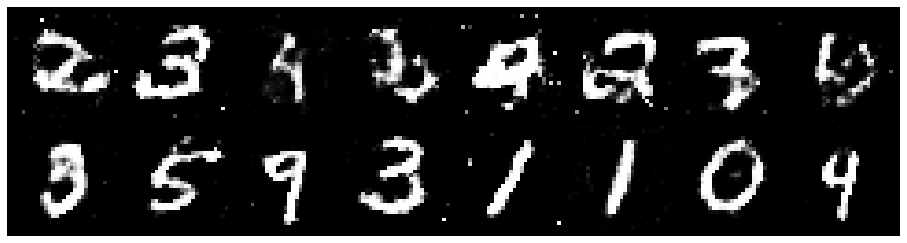

Epoch: [94/100], Batch Num: [100/600]
Discriminator Loss: 1.3547, Generator Loss: 0.9903
D(x): 0.5612, D(G(z)): 0.4619


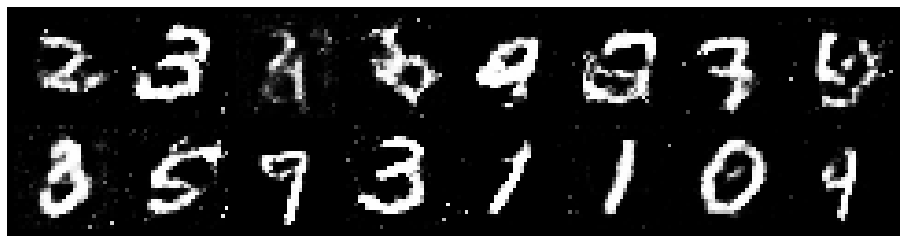

Epoch: [94/100], Batch Num: [200/600]
Discriminator Loss: 1.2801, Generator Loss: 1.0492
D(x): 0.5570, D(G(z)): 0.4405


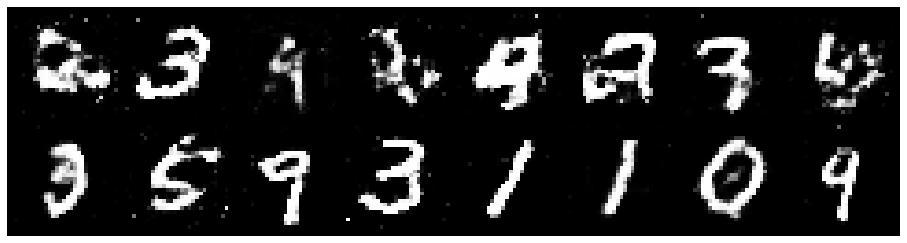

Epoch: [94/100], Batch Num: [300/600]
Discriminator Loss: 1.2768, Generator Loss: 0.9206
D(x): 0.5993, D(G(z)): 0.4415


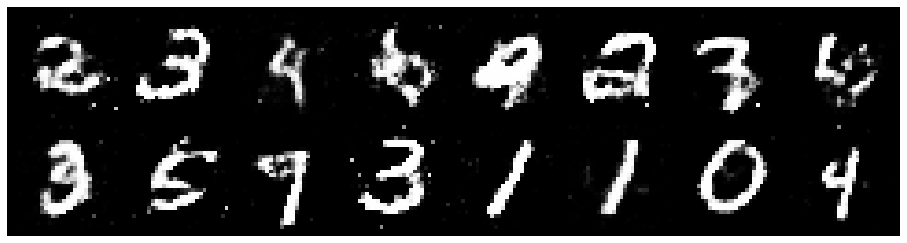

Epoch: [94/100], Batch Num: [400/600]
Discriminator Loss: 1.0811, Generator Loss: 0.9822
D(x): 0.6453, D(G(z)): 0.4261


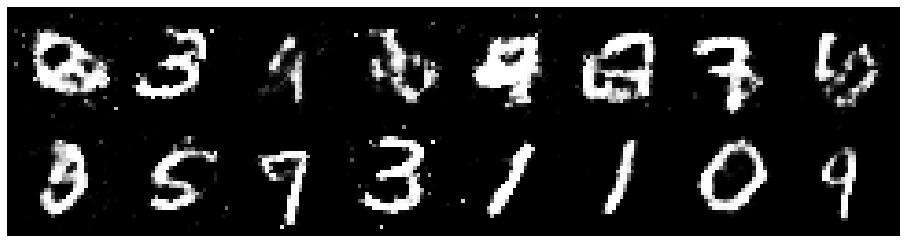

Epoch: [94/100], Batch Num: [500/600]
Discriminator Loss: 1.1898, Generator Loss: 0.9832
D(x): 0.5254, D(G(z)): 0.3899


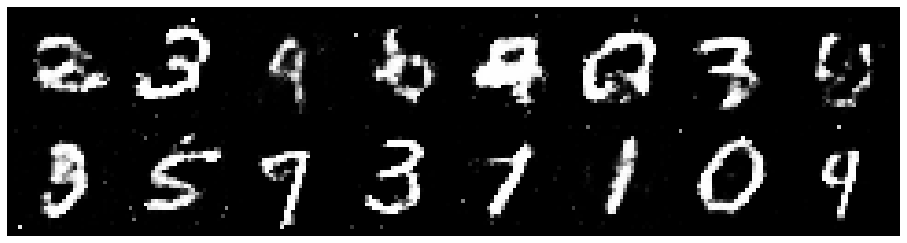

Epoch: [95/100], Batch Num: [0/600]
Discriminator Loss: 1.3157, Generator Loss: 0.8030
D(x): 0.5563, D(G(z)): 0.4559


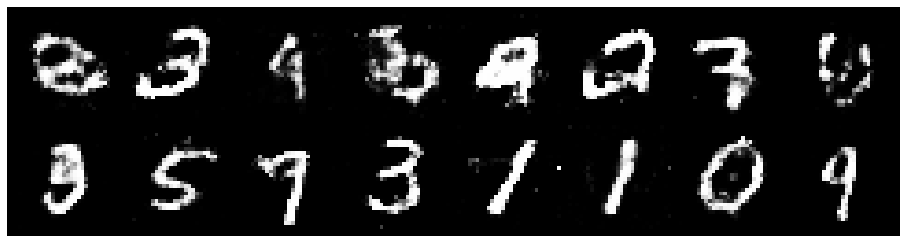

Epoch: [95/100], Batch Num: [100/600]
Discriminator Loss: 1.2446, Generator Loss: 0.8811
D(x): 0.5485, D(G(z)): 0.4310


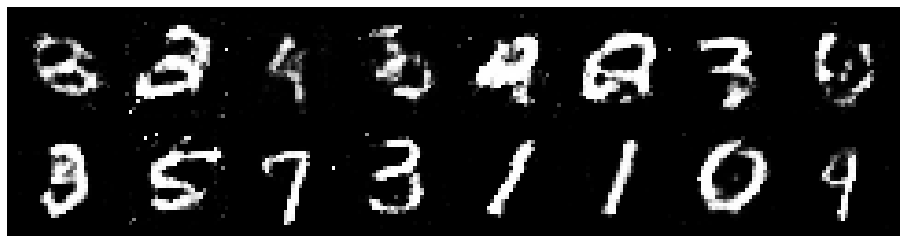

Epoch: [95/100], Batch Num: [200/600]
Discriminator Loss: 1.1793, Generator Loss: 0.8131
D(x): 0.5875, D(G(z)): 0.4407


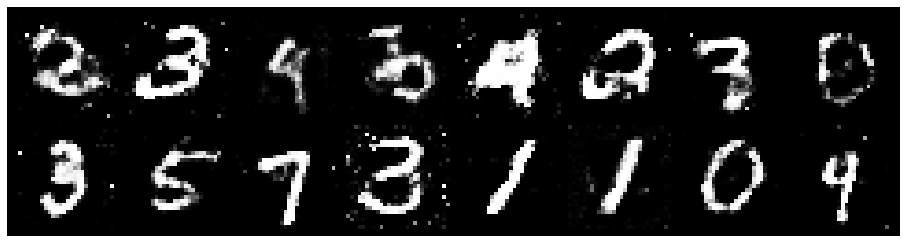

Epoch: [95/100], Batch Num: [300/600]
Discriminator Loss: 1.2197, Generator Loss: 0.8970
D(x): 0.5624, D(G(z)): 0.4353


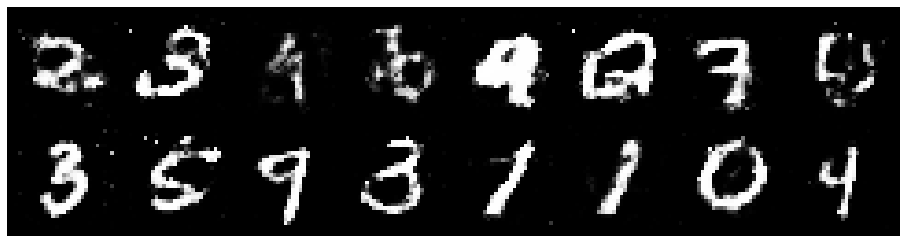

Epoch: [95/100], Batch Num: [400/600]
Discriminator Loss: 1.3285, Generator Loss: 0.8212
D(x): 0.5486, D(G(z)): 0.4747


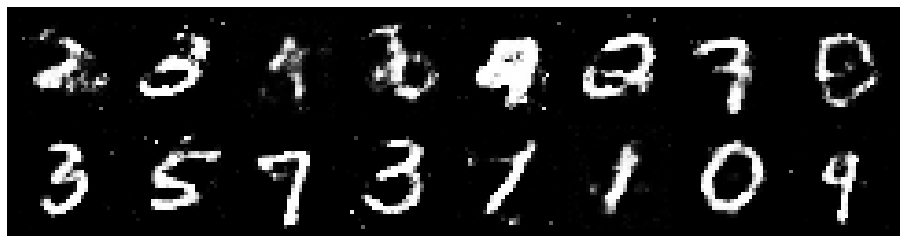

Epoch: [95/100], Batch Num: [500/600]
Discriminator Loss: 1.3222, Generator Loss: 0.9477
D(x): 0.5368, D(G(z)): 0.4466


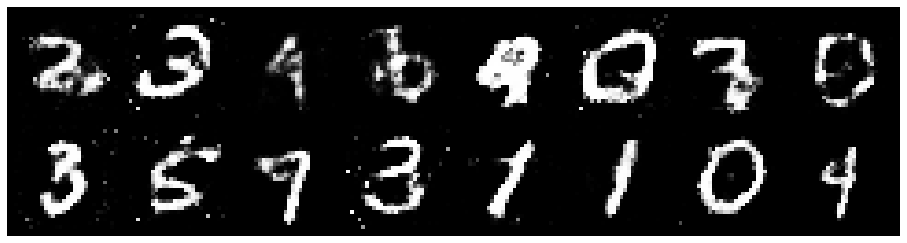

Epoch: [96/100], Batch Num: [0/600]
Discriminator Loss: 1.2463, Generator Loss: 0.9296
D(x): 0.5726, D(G(z)): 0.4391


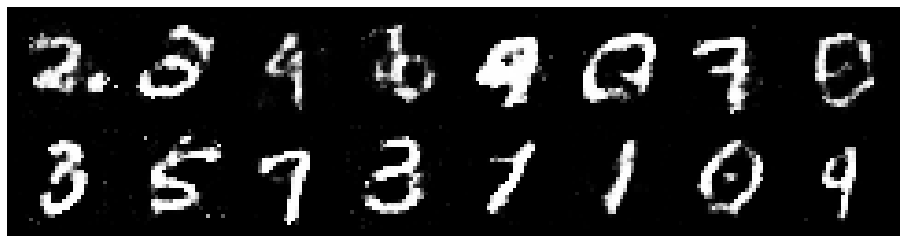

Epoch: [96/100], Batch Num: [100/600]
Discriminator Loss: 1.2382, Generator Loss: 1.0896
D(x): 0.5685, D(G(z)): 0.4149


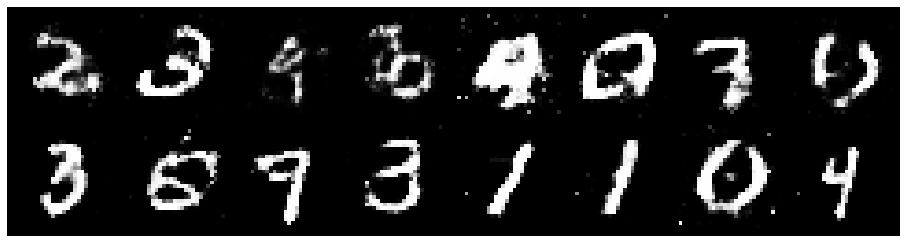

Epoch: [96/100], Batch Num: [200/600]
Discriminator Loss: 1.1920, Generator Loss: 0.9671
D(x): 0.6030, D(G(z)): 0.4393


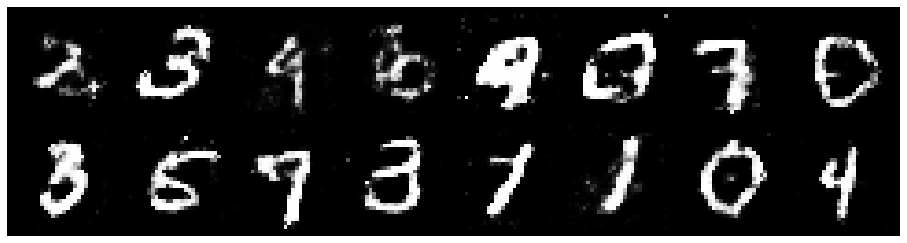

Epoch: [96/100], Batch Num: [300/600]
Discriminator Loss: 1.3465, Generator Loss: 0.9233
D(x): 0.4982, D(G(z)): 0.4112


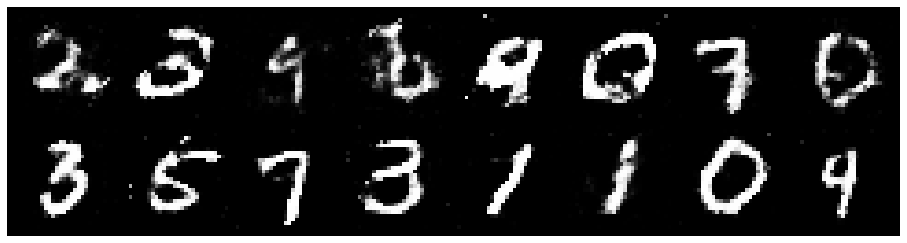

Epoch: [96/100], Batch Num: [400/600]
Discriminator Loss: 1.1319, Generator Loss: 1.0779
D(x): 0.5781, D(G(z)): 0.3888


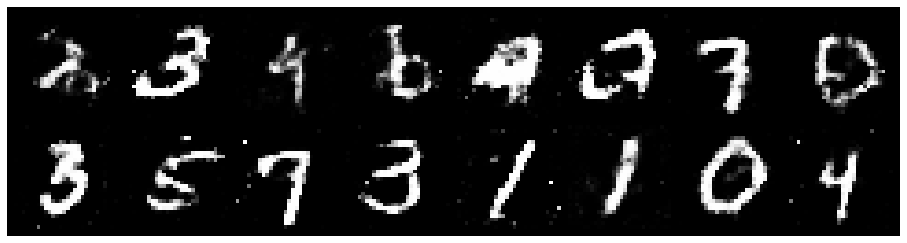

Epoch: [96/100], Batch Num: [500/600]
Discriminator Loss: 1.2584, Generator Loss: 0.9022
D(x): 0.5559, D(G(z)): 0.4140


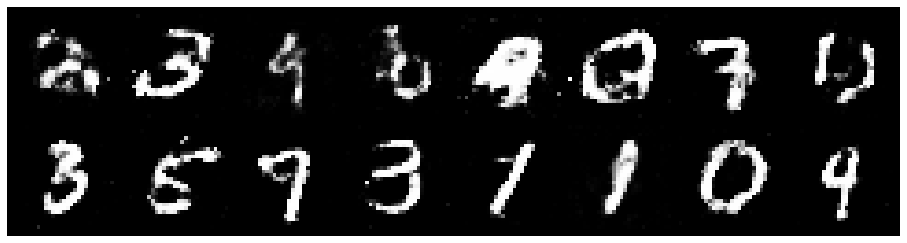

Epoch: [97/100], Batch Num: [0/600]
Discriminator Loss: 1.2595, Generator Loss: 0.9735
D(x): 0.5550, D(G(z)): 0.4404


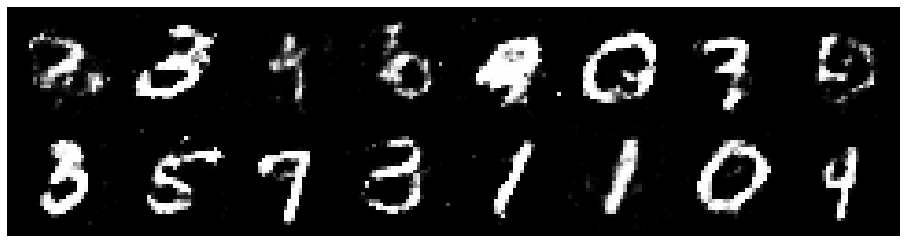

Epoch: [97/100], Batch Num: [100/600]
Discriminator Loss: 1.2207, Generator Loss: 0.9174
D(x): 0.5444, D(G(z)): 0.4212


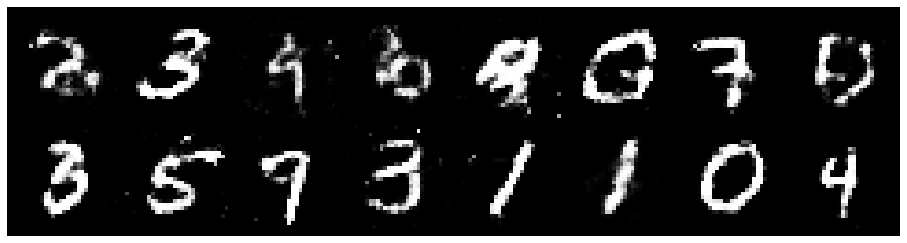

Epoch: [97/100], Batch Num: [200/600]
Discriminator Loss: 1.2392, Generator Loss: 0.9711
D(x): 0.5562, D(G(z)): 0.4362


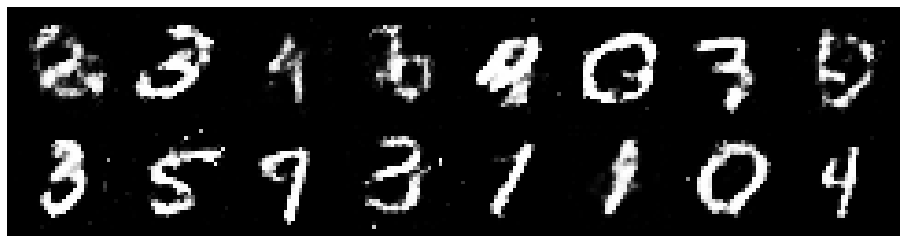

Epoch: [97/100], Batch Num: [300/600]
Discriminator Loss: 1.2887, Generator Loss: 1.0035
D(x): 0.5489, D(G(z)): 0.4260


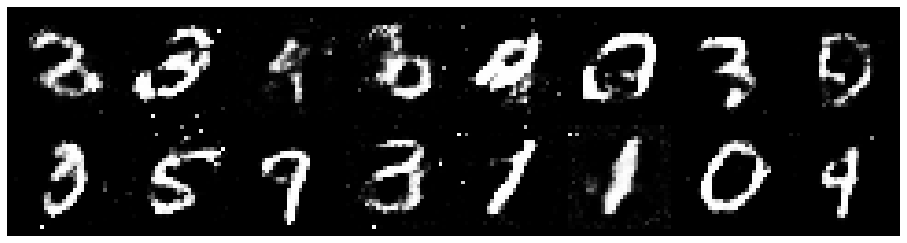

Epoch: [97/100], Batch Num: [400/600]
Discriminator Loss: 1.1688, Generator Loss: 1.0665
D(x): 0.5633, D(G(z)): 0.3872


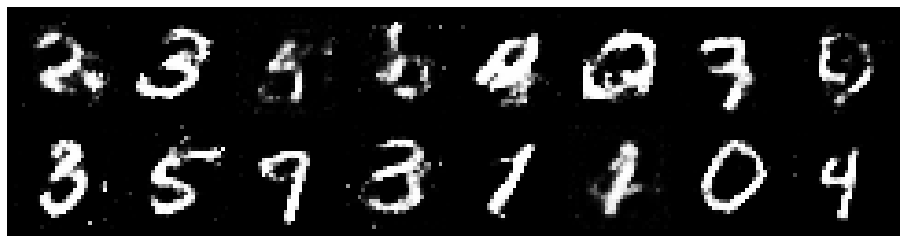

Epoch: [97/100], Batch Num: [500/600]
Discriminator Loss: 1.1544, Generator Loss: 0.9908
D(x): 0.6049, D(G(z)): 0.4076


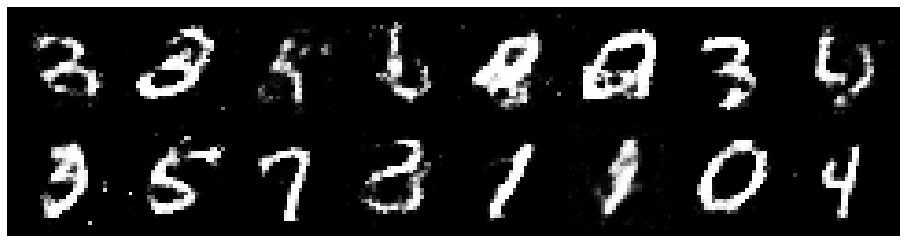

Epoch: [98/100], Batch Num: [0/600]
Discriminator Loss: 1.1115, Generator Loss: 0.9750
D(x): 0.6193, D(G(z)): 0.4161


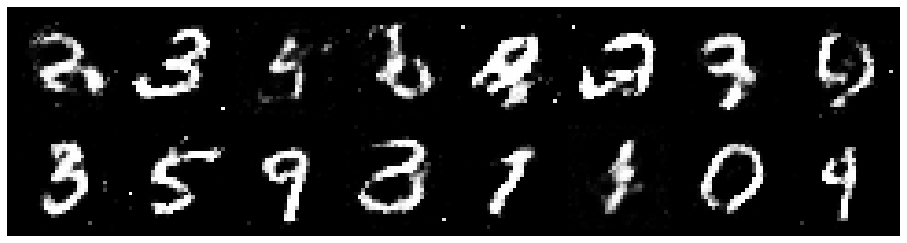

Epoch: [98/100], Batch Num: [100/600]
Discriminator Loss: 1.1528, Generator Loss: 0.9135
D(x): 0.5802, D(G(z)): 0.4180


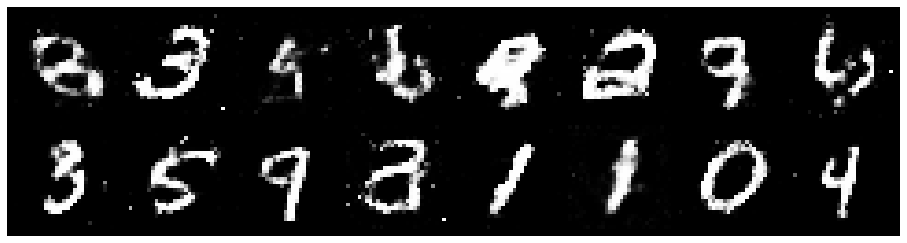

Epoch: [98/100], Batch Num: [200/600]
Discriminator Loss: 1.2599, Generator Loss: 0.8432
D(x): 0.5351, D(G(z)): 0.4316


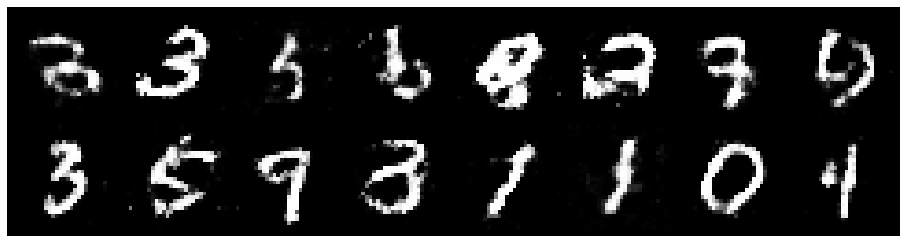

Epoch: [98/100], Batch Num: [300/600]
Discriminator Loss: 1.1659, Generator Loss: 0.9000
D(x): 0.5646, D(G(z)): 0.4069


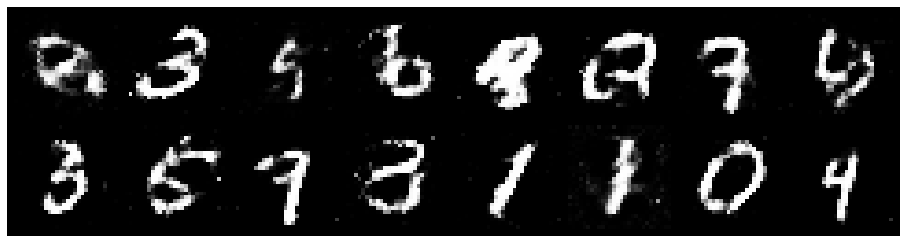

Epoch: [98/100], Batch Num: [400/600]
Discriminator Loss: 1.2313, Generator Loss: 0.9424
D(x): 0.5597, D(G(z)): 0.4247


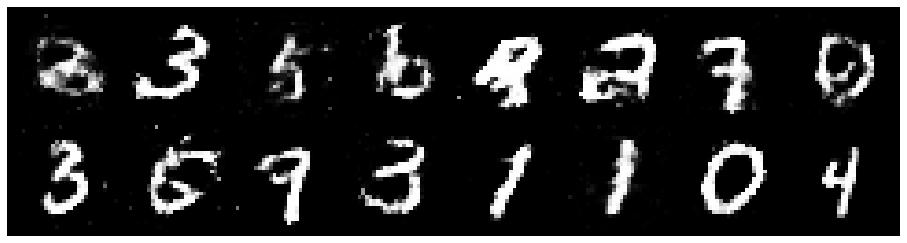

Epoch: [98/100], Batch Num: [500/600]
Discriminator Loss: 1.1842, Generator Loss: 0.8768
D(x): 0.6101, D(G(z)): 0.4333


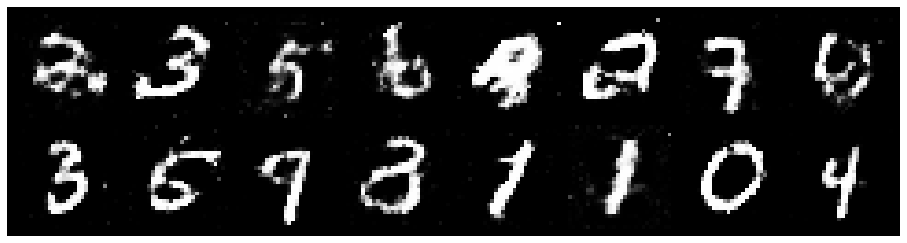

Epoch: [99/100], Batch Num: [0/600]
Discriminator Loss: 1.2240, Generator Loss: 0.8386
D(x): 0.5824, D(G(z)): 0.4550


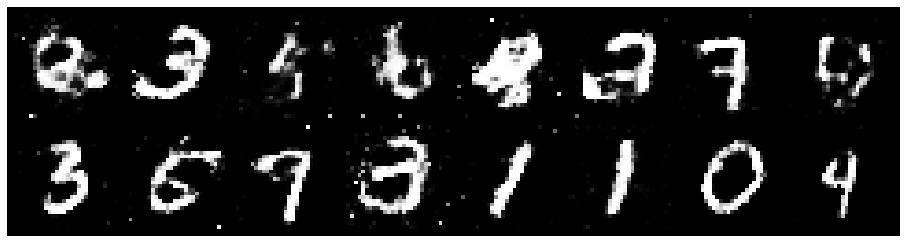

Epoch: [99/100], Batch Num: [100/600]
Discriminator Loss: 1.3205, Generator Loss: 0.9776
D(x): 0.5410, D(G(z)): 0.4376


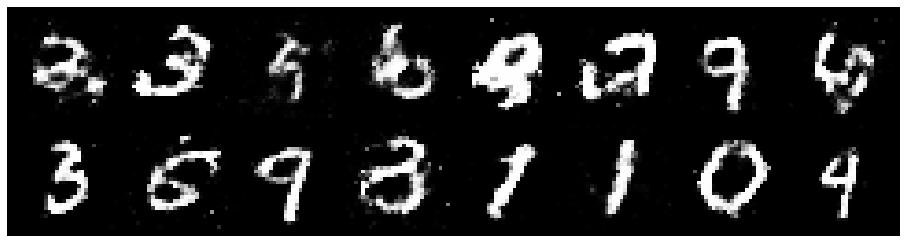

Epoch: [99/100], Batch Num: [200/600]
Discriminator Loss: 1.2387, Generator Loss: 0.9677
D(x): 0.5700, D(G(z)): 0.4323


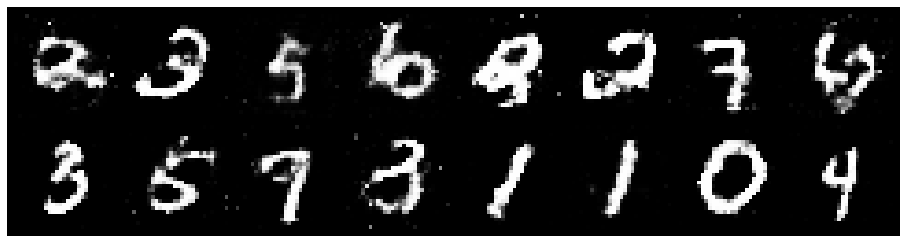

Epoch: [99/100], Batch Num: [300/600]
Discriminator Loss: 1.3845, Generator Loss: 0.8566
D(x): 0.5129, D(G(z)): 0.4493


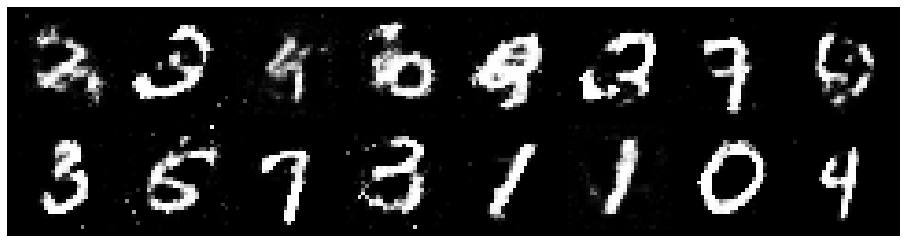

Epoch: [99/100], Batch Num: [400/600]
Discriminator Loss: 1.2599, Generator Loss: 0.8578
D(x): 0.5845, D(G(z)): 0.4582


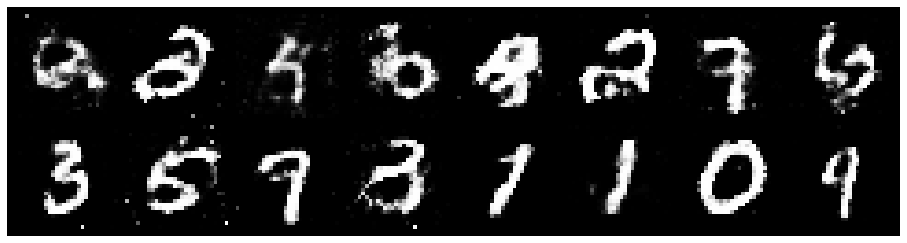

Epoch: [99/100], Batch Num: [500/600]
Discriminator Loss: 1.4205, Generator Loss: 0.8164
D(x): 0.5646, D(G(z)): 0.4934


In [13]:
# Create logger instance
logger = Logger(model_name='VGAN', data_name='MNIST')
# Total number of epochs to train
num_epochs = 100
for epoch in range(num_epochs):
    for n_batch, (real_batch,_) in enumerate(data_loader):
        N = real_batch.size(0)
        # 1. Train Discriminator
        real_data = Variable(images_to_vectors(real_batch))
        # Generate fake data and detach 
        # (so gradients are not calculated for generator)
        fake_data = generator(noise(N)).detach()
        # Train D
        d_error, d_pred_real, d_pred_fake = \
              train_discriminator(d_optimizer, real_data, fake_data)

        # 2. Train Generator
        # Generate fake data
        fake_data = generator(noise(N))
        # Train G
        g_error = train_generator(g_optimizer, fake_data)
        # Log batch error
        logger.log(d_error, g_error, epoch, n_batch, num_batches)
        # Display Progress every few batches
        if (n_batch) % 100 == 0: 
            test_images = vectors_to_images(generator(test_noise))
            test_images = test_images.data
            logger.log_images(
                test_images, num_test_samples, 
                epoch, n_batch, num_batches
            );
            # Display status Logs
            logger.display_status(
                epoch, num_epochs, n_batch, num_batches,
                d_error, g_error, d_pred_real, d_pred_fake
            )